In [1]:
import numpy as np
import pandas as pd
from itertools import product
import tensorflow as tf
from time import time
import multiprocessing
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
from keras.models import Model
from keras.layers import Input, Dense, Concatenate, Lambda, Dropout
from keras.optimizers import Adam
from keras.regularizers import l2
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error, r2_score
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
import matplotlib.pyplot as plt
import os

2025-02-04 10:01:30.225180: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-04 10:01:30.237984: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1738681290.250567  704805 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1738681290.254341  704805 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-04 10:01:30.269295: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

In [2]:
# Set environment variables before TensorFlow initializes
os.environ["CUDA_VISIBLE_DEVICES"] = "2"  # Restrict TensorFlow to only use GPU 2
os.environ["TF_ENABLE_ONEDNN_OPTS"] = "0"  # Disable oneDNN optimizations

# Ensure TensorFlow only sees GPU 2
gpus = tf.config.list_physical_devices('GPU')

if gpus:
    try:
        # Enable memory growth for GPU 2
        tf.config.experimental.set_memory_growth(gpus[0], True)  # gpus[0] now refers to GPU 2
        print(f"Using only GPU 2 (CUDA_VISIBLE_DEVICES=2).")
    except RuntimeError as e:
        print(f"Error setting memory growth: {e}")
else:
    print("No GPUs found! Check CUDA_VISIBLE_DEVICES setting.")

# Print number of GPUs available (should only be 1 after restriction)
print("Num GPUs Available:", len(gpus))

Using only GPU 2 (CUDA_VISIBLE_DEVICES=2).
Num GPUs Available: 1


In [3]:
df = pd.read_csv("Complete_BF_CPP_XY_Data.csv")
df = df.sample(frac=1, random_state=42).reset_index(drop=True)
X = df.iloc[:, 1:27]
Y = df.iloc[:, 27:]
X_scaler = StandardScaler()
X_scaled = X_scaler.fit_transform(X)
Y_scaler = StandardScaler()
Y_scaled = Y_scaler.fit_transform(Y)
X_train, X_test, Y_train, Y_test = train_test_split(X_scaled, Y_scaled, test_size=0.2, random_state=42)

/tmp/ipykernel_704805/506610282.py:1: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("Complete_BF_CPP_XY_Data.csv")


In [4]:
def create_model(layer1_neurons, learning_rate): # , l2_lambda=0.01, dropout_rate=0.5
    # Input layer
    input_layer = Input(shape=(26,), name="Input_Layer")

    # First network (Network 1) with L2 regularization and dropout
    x = Dense(layer1_neurons[0], activation='relu', name="Dense_Layer_1")(input_layer) #, kernel_regularizer=l2(l2_lambda)
    #x = Dropout(dropout_rate)(x)  # Apply dropout after each dense layer

    for i, neurons in enumerate(layer1_neurons[1:], start=2):
        x = Dense(neurons, activation='relu', name=f"Dense_Layer_{i}")(x) #, kernel_regularizer=l2(l2_lambda)
        #x = Dropout(dropout_rate)(x)  # Apply dropout

    # Output layer
    output_1 = Dense(23, activation='linear', name="Output_Layer_2")(x)

    # Define the model with the specified input and output
    model = Model(inputs=input_layer, outputs=output_1, name="Model_2")

    # Compile the model
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='mse')

    return model

In [5]:
# Create the model with L2 regularization and dropout
model = create_model([950, 950, 950, 950, 950], 2e-4) # , l2_lambda=1e-5, dropout_rate=0.1
model.summary()

I0000 00:00:1738681292.518979  704805 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 46672 MB memory:  -> device: 0, name: NVIDIA RTX 6000 Ada Generation, pci bus id: 0000:c1:00.0, compute capability: 8.9


Model: "Model_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 26)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_Layer_1 (Dense)           │ (None, 950)            │        25,650 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_Layer_2 (Dense)           │ (None, 950)            │       903,450 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_Layer_3 (Dense)           │ (None, 950)            │       903,450 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_Layer_4 (Dense)           │ (None, 950)            │       903,450 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_Layer_5 (Dense)           │ (None, 950)            │       903,450 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output_Layer_2 (Dense)          │ (None, 23)             │        21,873 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,661,323 (13.97 MB)

 Trainable params: 3,661,323 (13.97 MB)

 Non-trainable params: 0 (0.00 B)

In [6]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.92, patience=20, min_lr=0, verbose=1, mode='min')
early_stopping = EarlyStopping(monitor='val_loss', patience=200, restore_best_weights=True, verbose=1, mode='min')
checkpoint = ModelCheckpoint('best_model_std_1000_16.keras', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
history = model.fit(
        X_train,
        Y_train,  # Do this both for MinMax Scaled Y and Standard Scaled Y. Do not touch to X.
        epochs=1000,
        batch_size=16,
        validation_split=0.15,
        verbose=1,
        callbacks=[reduce_lr, checkpoint] # early_stopping
    )

Epoch 1/1000


I0000 00:00:1738681294.256612  718799 service.cc:148] XLA service 0x7fd65800b600 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1738681294.256669  718799 service.cc:156]   StreamExecutor device (0): NVIDIA RTX 6000 Ada Generation, Compute Capability 8.9
2025-02-04 10:01:34.280451: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1738681294.386755  718799 cuda_dnn.cc:529] Loaded cuDNN version 90300


2025-02-04 10:01:35.436181: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_497', 20 bytes spill stores, 20 bytes spill loads

2025-02-04 10:01:35.451289: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_497', 12 bytes spill stores, 12 bytes spill loads

2025-02-04 10:01:35.451337: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_497', 28 bytes spill stores, 28 bytes spill loads

2025-02-04 10:01:35.452890: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_497', 12 bytes spill stores, 12 bytes spill loads

2025-02-04 10:01:35.471530: I external/local_xla/xla/stream_exec


   1/1466 ━━━━━━━━━━━━━━━━━━━━ 1:19:18 3s/step - loss: 1.1151


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.9096    


 102/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 994us/step - loss: 0.8098


 152/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1000us/step - loss: 0.7512

I0000 00:00:1738681296.368063  718799 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.



 202/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.7106   


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.6857


 285/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.6641


 332/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.6450


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.6288


 431/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.6140


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.6012


 534/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.5904


 592/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.5793


 659/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.5683


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.5578


 794/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.5501


 859/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.5427


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.5358


 985/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.5301


1043/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.5249


1096/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.5205


1150/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.5162


1204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.5122


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.5084


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.5050


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.5016


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.4985


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.4955

2025-02-04 10:01:38.396519: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_497', 20 bytes spill stores, 20 bytes spill loads



2025-02-04 10:01:38.698575: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_497', 28 bytes spill stores, 28 bytes spill loads

2025-02-04 10:01:38.707005: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_497', 12 bytes spill stores, 12 bytes spill loads

2025-02-04 10:01:38.712860: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_497', 28 bytes spill stores, 28 bytes spill loads

2025-02-04 10:01:38.744272: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_287', 132 bytes spill stores, 132 bytes spill loads

2025-02-04 10:01:38.789477: I external/local_xla/xla/stream_ex


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4953  

2025-02-04 10:01:40.928999: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_56', 136 bytes spill stores, 136 bytes spill loads

2025-02-04 10:01:40.988598: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_28', 140 bytes spill stores, 140 bytes spill loads

2025-02-04 10:01:40.998794: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_28', 164 bytes spill stores, 164 bytes spill loads

2025-02-04 10:01:41.076285: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_56', 200 bytes spill stores, 200 bytes spill loads




Epoch 1: val_loss improved from inf to 0.34903, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - loss: 0.4953 - val_loss: 0.3490 - learning_rate: 2.0000e-04


Epoch 2/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:45 113ms/step - loss: 0.3520


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 969us/step - loss: 0.3128  


 107/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 955us/step - loss: 0.3203


 162/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 945us/step - loss: 0.3248


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - loss: 0.3253


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - loss: 0.3257


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 973us/step - loss: 0.3254


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 991us/step - loss: 0.3251


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - loss: 0.3247


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.3244


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.3242


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.3242


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.3241


 771/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.3240


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.3237


 893/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.3235


 962/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.3231


1028/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.3228


1090/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.3225


1153/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.3222


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.3218


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.3215


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.3211


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.3207


1455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.3204


Epoch 2: val_loss improved from 0.34903 to 0.30957, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.3203 - val_loss: 0.3096 - learning_rate: 2.0000e-04


Epoch 3/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:31 104ms/step - loss: 0.1466


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 765us/step - loss: 0.2841  


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 794us/step - loss: 0.2874


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 737us/step - loss: 0.2851


 276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.2833


 340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.2821


 400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.2817


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.2813


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.2807


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.2804


 643/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.2801


 706/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.2798


 770/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.2796


 830/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.2794


 890/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.2792


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.2790


1018/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.2788


1088/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.2785


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.2783


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.2783


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.2782


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.2782


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.2781


Epoch 3: val_loss improved from 0.30957 to 0.28675, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2781 - val_loss: 0.2867 - learning_rate: 2.0000e-04


Epoch 4/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:55 120ms/step - loss: 0.1573


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2566    


  93/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2564


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2592


 171/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2604


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2614


 274/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2619


 331/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2615


 389/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2606


 446/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2596


 504/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2585


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.2577


 617/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.2572


 673/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.2566


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.2563


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.2561


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.2559


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.2558


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.2557


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.2555


1116/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.2554


1173/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.2553


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.2553


1298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.2552


1362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.2551


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.2550


Epoch 4: val_loss improved from 0.28675 to 0.26598, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2549 - val_loss: 0.2660 - learning_rate: 2.0000e-04


Epoch 5/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:03 85ms/step - loss: 0.2488


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 897us/step - loss: 0.2193 


 113/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step - loss: 0.2190


 172/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 881us/step - loss: 0.2186


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 870us/step - loss: 0.2191


 292/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 865us/step - loss: 0.2205


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.2212


 406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.2217


 462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.2221


 518/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.2225


 575/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.2228


 635/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.2230


 686/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.2232


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.2235


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.2238


 847/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.2241


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.2246


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.2250


1022/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.2254


1081/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.2257


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.2260


1199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.2262


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.2265


1312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.2267


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.2269


1427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.2271


Epoch 5: val_loss improved from 0.26598 to 0.25877, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2272 - val_loss: 0.2588 - learning_rate: 2.0000e-04


Epoch 6/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:05 86ms/step - loss: 0.4206


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 903us/step - loss: 0.2053 


 110/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 926us/step - loss: 0.2034


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 916us/step - loss: 0.2056


 223/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 907us/step - loss: 0.2066


 279/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 905us/step - loss: 0.2072


 332/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 911us/step - loss: 0.2078


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.2083


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.2088


 494/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.2095


 553/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.2104


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.2111


 665/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.2117


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.2121


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.2125


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.2130


 893/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.2134


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.2139


1010/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.2143


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.2147


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.2149


1175/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.2151


1232/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.2154


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.2156


1346/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.2158


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.2160


1460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.2162


Epoch 6: val_loss improved from 0.25877 to 0.24452, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2162 - val_loss: 0.2445 - learning_rate: 2.0000e-04


Epoch 7/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:58 163ms/step - loss: 0.1728


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 937us/step - loss: 0.2101  


 100/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2069  


 144/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2056


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2060


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2055


 279/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2048


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2045


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2046


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2050


 462/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2051


 509/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2052


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2052


 607/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2053


 656/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2053


 707/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2054


 762/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2055


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2055


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2054


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2053


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2054


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2054


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2055


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2055


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2056


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2056


1275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2056


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2057


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2057


1413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2057


1460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2058


Epoch 7: val_loss did not improve from 0.24452



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2058 - val_loss: 0.2464 - learning_rate: 2.0000e-04


Epoch 8/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:48 115ms/step - loss: 0.1187


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 892us/step - loss: 0.1758  


 114/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - loss: 0.1869


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.1892


 222/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 912us/step - loss: 0.1907


 279/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 906us/step - loss: 0.1908


 339/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 895us/step - loss: 0.1905


 391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.1903


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.1900


 495/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.1899


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.1898


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.1895


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.1895


 706/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.1895


 758/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.1895


 820/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.1896


 880/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.1896


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.1897


 989/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.1898


1046/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.1900


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.1902


1166/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.1904


1227/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.1906


1287/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.1908


1349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.1909


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.1911


Epoch 8: val_loss improved from 0.24452 to 0.22931, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1912 - val_loss: 0.2293 - learning_rate: 2.0000e-04


Epoch 9/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:13 132ms/step - loss: 0.1412


  72/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - loss: 0.1724  


 139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 732us/step - loss: 0.1784


 197/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 790us/step - loss: 0.1792


 258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.1804


 323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.1809


 387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.1808


 453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.1805


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.1802


 577/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.1801


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.1801


 689/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.1802


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.1804


 801/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.1805


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.1806


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.1807


 983/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.1809


1041/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.1810


1094/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.1812


1149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.1814


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.1815


1265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.1817


1324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.1818


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.1819


1430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.1821


Epoch 9: val_loss did not improve from 0.22931



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1822 - val_loss: 0.2342 - learning_rate: 2.0000e-04


Epoch 10/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:35 147ms/step - loss: 0.2299


  39/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2007    


  86/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1882


 133/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1819


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1784


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1762


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1754


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 991us/step - loss: 0.1751


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 979us/step - loss: 0.1752


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.1752


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.1752


 587/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.1752


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.1750


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.1749


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.1747


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.1747


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.1746


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.1746


 974/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.1745


1025/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.1745


1085/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.1745


1147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.1745


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.1746


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.1746


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.1747


1375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.1747


1431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.1748


Epoch 10: val_loss improved from 0.22931 to 0.22300, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1748 - val_loss: 0.2230 - learning_rate: 2.0000e-04


Epoch 11/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:49 116ms/step - loss: 0.0635


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1801    


  90/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1729


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1693


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1691


 262/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 963us/step - loss: 0.1683


 316/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - loss: 0.1673


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 957us/step - loss: 0.1668


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.1662


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.1657


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.1652


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.1648


 646/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.1647


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.1646


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.1646


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.1647


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.1648


 936/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.1649


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.1651


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.1652


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.1655


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.1656


1223/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.1658


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.1659


1337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.1661


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.1662


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.1664


Epoch 11: val_loss improved from 0.22300 to 0.22181, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1664 - val_loss: 0.2218 - learning_rate: 2.0000e-04


Epoch 12/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:04 126ms/step - loss: 0.1226


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 793us/step - loss: 0.1368  


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - loss: 0.1397


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.1418


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.1433


 319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.1444


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.1451


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.1455


 520/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.1460


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.1464


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.1467


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.1469


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.1472


 811/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.1474


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.1477


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.1480


 984/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.1482


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.1485


1094/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.1488


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.1492


1213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.1496


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.1500


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.1504


1384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.1507


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.1510


Epoch 12: val_loss improved from 0.22181 to 0.21849, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1512 - val_loss: 0.2185 - learning_rate: 2.0000e-04


Epoch 13/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:13 132ms/step - loss: 0.0651


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 849us/step - loss: 0.1501  


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 873us/step - loss: 0.1501


 171/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - loss: 0.1485


 226/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 894us/step - loss: 0.1471


 281/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.1459


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - loss: 0.1446


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.1442


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.1439


 504/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.1439


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.1440


 616/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.1442


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.1444


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.1446


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.1449


 855/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.1452


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.1455


 967/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.1458


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.1460


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.1463


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.1466


1199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.1469


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.1472


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.1475


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.1479


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.1481


Epoch 13: val_loss improved from 0.21849 to 0.21311, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1483 - val_loss: 0.2131 - learning_rate: 2.0000e-04


Epoch 14/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:20 178ms/step - loss: 0.1454


  41/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1565    


  84/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1484


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1430


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1402


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1394


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1392


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1392


 400/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1395


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.1400


 520/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.1404


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.1406


 644/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.1408


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.1411


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.1414


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.1417


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.1421


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.1424


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.1427


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.1430


1119/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.1433


1177/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.1435


1236/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.1437


1296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.1440


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.1442


1413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.1444


Epoch 14: val_loss did not improve from 0.21311



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1446 - val_loss: 0.2133 - learning_rate: 2.0000e-04


Epoch 15/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:49 116ms/step - loss: 0.2041


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - loss: 0.1506  


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 794us/step - loss: 0.1455


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 810us/step - loss: 0.1434


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.1422


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.1414


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.1408


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.1403


 467/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.1399


 519/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.1396


 571/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.1394


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.1392


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.1391


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.1391


 789/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.1390


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.1390


 894/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.1389


 947/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.1390


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.1391


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.1392


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.1393


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.1393


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.1394


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.1395


1338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.1396


1390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.1397


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.1398


Epoch 15: val_loss did not improve from 0.21311



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1398 - val_loss: 0.2177 - learning_rate: 2.0000e-04


Epoch 16/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:39 109ms/step - loss: 0.1122


  41/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1047    


  96/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1186


 147/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1245


 200/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1264


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1274


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1281


 351/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1286


 404/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1293


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 995us/step - loss: 0.1299


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.1303


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.1306


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.1309


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.1312


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.1316


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.1318


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.1320


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.1322


 932/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.1323


 985/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.1325


1041/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.1326


1095/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.1328


1149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.1330


1204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.1331


1261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.1333


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.1334


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.1335


1429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.1335


Epoch 16: val_loss improved from 0.21311 to 0.21197, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1336 - val_loss: 0.2120 - learning_rate: 2.0000e-04


Epoch 17/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:48 115ms/step - loss: 0.1351


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 753us/step - loss: 0.1321  


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - loss: 0.1315


 198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.1297


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.1287


 313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.1286


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.1293


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.1297


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.1301


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.1304


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.1307


 642/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.1311


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.1314


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.1316


 799/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.1318


 851/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.1321


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.1323


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.1325


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.1327


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.1328


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.1330


1168/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.1331


1222/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.1332


1277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.1332


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.1333


1385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.1333


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.1333


Epoch 17: val_loss did not improve from 0.21197



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1333 - val_loss: 0.2171 - learning_rate: 2.0000e-04


Epoch 18/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:26 100ms/step - loss: 0.0964


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 945us/step - loss: 0.1223  


 114/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 891us/step - loss: 0.1224


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 898us/step - loss: 0.1221


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - loss: 0.1210


 276/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 918us/step - loss: 0.1200


 327/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 930us/step - loss: 0.1194


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 945us/step - loss: 0.1192


 431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.1194


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.1197


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.1201


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.1205


 641/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.1209


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.1212


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.1216


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.1220


 857/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.1223


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.1226


 961/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.1229


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.1231


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.1234


1122/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.1237


1177/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.1240


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.1242


1282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.1244


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.1246


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.1248


1430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.1249


Epoch 18: val_loss improved from 0.21197 to 0.20322, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1251 - val_loss: 0.2032 - learning_rate: 2.0000e-04


Epoch 19/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:11 131ms/step - loss: 0.0734


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 970us/step - loss: 0.1309  


 106/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 0.1291


 159/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 956us/step - loss: 0.1249


 211/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - loss: 0.1216


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 953us/step - loss: 0.1199


 320/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 946us/step - loss: 0.1191


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 932us/step - loss: 0.1191


 440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.1192


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.1194


 553/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.1195


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.1196


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.1197


 728/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.1199


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.1200


 841/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.1201


 895/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.1203


 947/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.1204


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.1205


1054/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.1207


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.1208


1166/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.1210


1223/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.1212


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.1214


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.1215


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.1216


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.1217


Epoch 19: val_loss did not improve from 0.20322



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1217 - val_loss: 0.2135 - learning_rate: 2.0000e-04


Epoch 20/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:19 136ms/step - loss: 0.0692


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.1262  


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 820us/step - loss: 0.1234


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 865us/step - loss: 0.1217


 231/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 879us/step - loss: 0.1204


 282/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 898us/step - loss: 0.1197


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 0.1194


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.1189


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.1188


 501/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.1185


 554/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.1184


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.1183


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.1183


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.1183


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.1184


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.1184


 881/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.1185


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.1186


 989/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.1187


1043/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.1188


1096/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.1189


1150/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.1190


1201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.1191


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.1191


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.1192


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.1193


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.1194


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.1195


Epoch 20: val_loss did not improve from 0.20322



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1195 - val_loss: 0.2055 - learning_rate: 2.0000e-04


Epoch 21/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:00 123ms/step - loss: 0.0872


  50/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1058    


 100/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1065


 163/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - loss: 0.1059


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 902us/step - loss: 0.1062


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.1065


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.1070


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.1074


 464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.1078


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.1084


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.1091


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.1098


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.1104


 753/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.1110


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.1115


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.1120


 923/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.1123


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.1126


1034/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.1129


1087/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.1132


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.1134


1198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.1136


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.1138


1309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.1139


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.1140


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.1142


Epoch 21: val_loss improved from 0.20322 to 0.20085, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1143 - val_loss: 0.2009 - learning_rate: 2.0000e-04


Epoch 22/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:24 99ms/step - loss: 0.0988


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 949us/step - loss: 0.1013 


 110/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 927us/step - loss: 0.1067


 164/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - loss: 0.1078


 221/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 919us/step - loss: 0.1078


 275/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 920us/step - loss: 0.1076


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 923us/step - loss: 0.1073


 385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.1069


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.1068


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.1068


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.1068


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.1070


 659/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.1071


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.1074


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.1077


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.1080


 876/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.1082


 931/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.1085


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.1088


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.1090


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.1092


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.1094


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.1096


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.1097


1326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.1099


1384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.1100


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.1102


Epoch 22: val_loss improved from 0.20085 to 0.19609, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1103 - val_loss: 0.1961 - learning_rate: 2.0000e-04


Epoch 23/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:08 88ms/step - loss: 0.1395


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 790us/step - loss: 0.1146 


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 752us/step - loss: 0.1135


 197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.1118


 260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.1108


 319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.1104


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.1104


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.1102


 475/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.1101


 521/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.1099


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.1098


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.1097


 689/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.1098


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.1097


 806/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.1096


 865/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.1096


 923/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.1097


 985/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.1098


1046/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.1099


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.1099


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.1100


1224/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.1100


1286/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.1101


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.1102


1407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.1103


Epoch 23: val_loss did not improve from 0.19609



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1105 - val_loss: 0.2034 - learning_rate: 2.0000e-04


Epoch 24/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - loss: 0.0705


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.0784 


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 828us/step - loss: 0.0822


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - loss: 0.0848


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - loss: 0.0872


 286/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0891


 341/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - loss: 0.0909


 391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0920


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0929


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0938


 568/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0946


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0952


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0958


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0965


 807/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0970


 863/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0975


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0979


 974/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0984


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0988


1084/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0992


1141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0995


1198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0999


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.1003


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.1007


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.1010


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.1014


Epoch 24: val_loss improved from 0.19609 to 0.19562, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1016 - val_loss: 0.1956 - learning_rate: 2.0000e-04


Epoch 25/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:22 138ms/step - loss: 0.0375


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 747us/step - loss: 0.0822  


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 801us/step - loss: 0.0883


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - loss: 0.0907


 229/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 884us/step - loss: 0.0922


 282/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step - loss: 0.0931


 340/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - loss: 0.0936


 400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0939


 462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0939


 521/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0940


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0941


 641/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0943


 700/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0944


 761/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0946


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0949


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0952


 942/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0955


1003/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0958


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0961


1123/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0963


1183/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0966


1241/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0968


1299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0971


1357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0974


1416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0977


Epoch 25: val_loss did not improve from 0.19562



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 999us/step - loss: 0.0979 - val_loss: 0.1965 - learning_rate: 2.0000e-04


Epoch 26/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:55 120ms/step - loss: 0.1555


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1339    


  91/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1260


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1208


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1163


 233/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1134


 283/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1112


 331/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1099


 378/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1088


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1078


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1069


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1061


 568/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1053


 625/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1046


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1041


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1038


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1035


 836/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1033


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1032


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1031


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1031


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1030


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.1030


1168/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.1029 


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.1029


1265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.1029


1313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1028  


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1028


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1028


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1028


Epoch 26: val_loss did not improve from 0.19562



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1028 - val_loss: 0.2151 - learning_rate: 2.0000e-04


Epoch 27/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:26 141ms/step - loss: 0.0582


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.1030  


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 850us/step - loss: 0.1040


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.1034


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 831us/step - loss: 0.1031


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.1024


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.1018


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.1014


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.1011


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.1008


 588/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.1007


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.1007


 707/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.1007


 764/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.1007


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.1007


 882/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.1007


 942/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.1008


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.1008


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.1009


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.1010


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.1011


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.1012


1299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.1013


1358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.1015


1417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.1016


Epoch 27: val_loss did not improve from 0.19562



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.1017 - val_loss: 0.1959 - learning_rate: 2.0000e-04


Epoch 28/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:46 113ms/step - loss: 0.0810


  39/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0965    


  81/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0971


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0962


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0954


 213/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0951


 259/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0951


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0948


 353/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0944


 399/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0940


 447/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0939


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0937


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0936


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0935


 645/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0935


 710/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0936


 766/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0937


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0939


 891/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0940


 950/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0941


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0943


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0944


1114/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0945


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0946


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0948


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0949


1346/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0951


1405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0952


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0954


Epoch 28: val_loss did not improve from 0.19562



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0954 - val_loss: 0.1975 - learning_rate: 2.0000e-04


Epoch 29/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:46 114ms/step - loss: 0.1733


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0919  


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 831us/step - loss: 0.0878


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0890


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0906


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0919


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0925


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0927


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0927


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0927


 609/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0929


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0931


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0934


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0936


 865/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0938


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0941


 991/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0942


1056/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0944


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0945


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0946


1242/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0948


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0949


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0951


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0952


Epoch 29: val_loss did not improve from 0.19562



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 986us/step - loss: 0.0953 - val_loss: 0.2020 - learning_rate: 2.0000e-04


Epoch 30/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:34 106ms/step - loss: 0.0490


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.0866  


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0924


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0941


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 872us/step - loss: 0.0936


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 0.0934


 348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0932


 406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0931


 464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0931


 519/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0930


 578/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0930


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0930


 698/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0931


 759/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0931


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0932


 872/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0932


 937/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0932


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0933


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0934


1136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0935


1198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0935


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0936


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0937


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0939


1458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0940


Epoch 30: val_loss did not improve from 0.19562



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 993us/step - loss: 0.0941 - val_loss: 0.2016 - learning_rate: 2.0000e-04


Epoch 31/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 0.0322


  72/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 705us/step - loss: 0.0847 


 141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 719us/step - loss: 0.0855


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 724us/step - loss: 0.0861


 282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 718us/step - loss: 0.0869


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 725us/step - loss: 0.0874


 413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.0876


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.0877


 534/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0877


 593/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0877


 651/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0876


 709/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0876


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0877


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0878


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0879


 943/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0880


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0881


1061/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0883


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0884


1180/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0886


1239/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0888


1295/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0889


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0890


1416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0891


Epoch 31: val_loss did not improve from 0.19562



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 959us/step - loss: 0.0892 - val_loss: 0.1960 - learning_rate: 2.0000e-04


Epoch 32/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:34 105ms/step - loss: 0.0566


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0748  


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 803us/step - loss: 0.0803


 192/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 788us/step - loss: 0.0834


 260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0858


 324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0868


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0873


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0877


 524/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0878


 587/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0879


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0879


 710/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0879


 771/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0880


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0880


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0881


 954/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0881


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0881


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0881


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0880


1198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0881


1260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0881


1320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0882


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0883


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0884


Epoch 32: val_loss improved from 0.19562 to 0.19022, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0885 - val_loss: 0.1902 - learning_rate: 2.0000e-04


Epoch 33/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 108ms/step - loss: 0.0878


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 791us/step - loss: 0.0798  


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 803us/step - loss: 0.0810


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 806us/step - loss: 0.0822


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0821


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0819


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0818


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0818


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0820


 545/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0822


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0823


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0824


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0825


 774/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0825


 829/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0826


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0827


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0828


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0830


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0832


1128/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0833


1187/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0835


1244/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0836


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0837


1357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0838


1414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0839


Epoch 33: val_loss did not improve from 0.19022



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0840 - val_loss: 0.2000 - learning_rate: 2.0000e-04


Epoch 34/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:10 89ms/step - loss: 0.0509


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 951us/step - loss: 0.0824 


 114/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 891us/step - loss: 0.0840


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0845


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0839


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0837


 365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0836


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0837


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0837


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0839


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0840


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0839


 734/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0839


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0839


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0839


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0839


 970/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0839


1029/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0839


1088/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0840


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0840


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0841


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0841


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0842


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0843


1435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0845


Epoch 34: val_loss improved from 0.19022 to 0.18971, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0846 - val_loss: 0.1897 - learning_rate: 2.0000e-04


Epoch 35/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:24 98ms/step - loss: 0.0585


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0764   


  93/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0805


 139/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0808


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0808


 231/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0813


 274/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0818


 315/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0821


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0824


 412/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0827


 475/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0829


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0832


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0834


 669/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0836


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0839


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0840


 837/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0842


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0844


 946/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0845


1003/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0846


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0847


1115/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0849


1171/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0851


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0852


1282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0854


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0856


1397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0858


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0859


Epoch 35: val_loss improved from 0.18971 to 0.18908, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0860 - val_loss: 0.1891 - learning_rate: 2.0000e-04


Epoch 36/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:25 99ms/step - loss: 0.0457


  51/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0783   


 106/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - loss: 0.0755


 161/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 946us/step - loss: 0.0746


 215/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 945us/step - loss: 0.0747


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - loss: 0.0750


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0752


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 945us/step - loss: 0.0753


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0756


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0758


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0761


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0763


 653/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0766


 710/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0768


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0771


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0773


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0775


 924/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0776


 981/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0778


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0780


1100/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0782


1159/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0785


1213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0787


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0789


1326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0791


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0793


1437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0794


Epoch 36: val_loss did not improve from 0.18908



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0795 - val_loss: 0.1974 - learning_rate: 2.0000e-04


Epoch 37/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 0.0787


  46/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0906   


  92/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0826


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0798


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0779


 227/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0773


 272/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0773


 317/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0774


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0774


 405/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0776


 448/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0778


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0780


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0783


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0786


 617/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0789


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0791


 707/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0792


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0794


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0796


 837/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0798


 881/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0799


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0800


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0801


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0802


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0802


1102/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0803


1144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0803


1187/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0804


1228/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0804


1268/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0805


1309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0806


1349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0807


1389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0807


1429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0808


Epoch 37: val_loss did not improve from 0.18908



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0809 - val_loss: 0.1940 - learning_rate: 2.0000e-04


Epoch 38/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:06 127ms/step - loss: 0.0477


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 868us/step - loss: 0.0591  


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0629


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 0.0663


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 872us/step - loss: 0.0680


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 879us/step - loss: 0.0693


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0704


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0712


 457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0721


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0728


 570/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0733


 627/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0739


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0744


 743/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0748


 801/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0751


 857/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0753


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0756


 967/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0759


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0762


1078/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0764


1131/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0767


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0769


1246/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0772


1303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0774


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0775


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0777


Epoch 38: val_loss did not improve from 0.18908



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0778 - val_loss: 0.1949 - learning_rate: 2.0000e-04


Epoch 39/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:02 166ms/step - loss: 0.0247


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0695    


  87/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0745


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0739


 165/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0735


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0738


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0744


 286/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0750


 326/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0754


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0758


 407/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0760


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0762


 485/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0764


 524/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0765


 564/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0766


 601/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0765


 640/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0764


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0764


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0764


 760/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0764


 801/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0765


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0766


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0766


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0767


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0768


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0769


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0770


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0771


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0771


1160/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0772


1198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0773


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0774


1285/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0774


1330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0775


1375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0776


1418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0777


1461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0777


Epoch 39: val_loss did not improve from 0.18908



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0777 - val_loss: 0.1896 - learning_rate: 2.0000e-04


Epoch 40/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:40 109ms/step - loss: 0.0538


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 976us/step - loss: 0.0692  


 112/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - loss: 0.0717


 172/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 889us/step - loss: 0.0724


 231/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.0723


 291/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 0.0729


 351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0739


 410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0747


 466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0750


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0753


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0755


 644/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0758


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0759


 759/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0761


 816/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0762


 868/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0764


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0766


 981/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0767


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0769


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0770


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0771


1220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0772


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0773


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0774


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0775


1449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0776


Epoch 40: val_loss did not improve from 0.18908



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0776 - val_loss: 0.1923 - learning_rate: 2.0000e-04


Epoch 41/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 101ms/step - loss: 0.0248


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 727us/step - loss: 0.0588  


 141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 720us/step - loss: 0.0658


 217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 699us/step - loss: 0.0673


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 696us/step - loss: 0.0687


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 706us/step - loss: 0.0694


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 718us/step - loss: 0.0699


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 724us/step - loss: 0.0701


 551/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 732us/step - loss: 0.0701


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 739us/step - loss: 0.0703


 676/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.0705


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0707


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0709


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0711


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0714


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0716


1028/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0717


1087/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0719


1147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0720


1204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0722


1260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0723


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0725


1372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0727


1427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0728


Epoch 41: val_loss improved from 0.18908 to 0.18169, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0729 - val_loss: 0.1817 - learning_rate: 2.0000e-04


Epoch 42/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 0.0251


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 766us/step - loss: 0.0623 


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 761us/step - loss: 0.0635


 202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0658


 263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0679


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0687


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0694


 446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0697


 509/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0700


 574/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0702


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0705


 688/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0707


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0709


 806/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0711


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0713


 927/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0716


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0718


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0721


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0723


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0726


1228/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0728


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0730


1346/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0732


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0734


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0735


Epoch 42: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 962us/step - loss: 0.0735 - val_loss: 0.1979 - learning_rate: 2.0000e-04


Epoch 43/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:03 84ms/step - loss: 0.0225


  75/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 685us/step - loss: 0.0676 


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 752us/step - loss: 0.0685


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0691


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0696


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0698


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0699


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0700


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0702


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0705


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0707


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0709


 712/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0710


 771/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0711


 831/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0712


 891/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0714


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0715


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0717


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0718


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0720


1193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0721


1252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0722


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0723


1370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0725


1428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0727


Epoch 43: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0727 - val_loss: 0.1979 - learning_rate: 2.0000e-04


Epoch 44/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:59 122ms/step - loss: 0.0369


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step - loss: 0.0627  


 109/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 931us/step - loss: 0.0673


 149/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0687  


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0703


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0716


 285/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0722


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0723


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0724


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0726


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0726


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0727


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0727


 613/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0727


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0728


 709/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0728


 757/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0728


 811/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0727


 871/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0727


 932/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0727


 991/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0726


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0726


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0725


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0725


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0725


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.0726


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0726


1407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0727


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0727


Epoch 44: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0727 - val_loss: 0.1836 - learning_rate: 2.0000e-04


Epoch 45/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 0.0154


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 816us/step - loss: 0.0546 


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 786us/step - loss: 0.0609


 195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0640


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0654


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0664


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0673


 434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0682


 496/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0687


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0690


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0693


 692/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0695


 756/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0697


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0699


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0702


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0704


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0706


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0708


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0709


1184/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0710


1243/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0711


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0711


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0712


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0712


Epoch 45: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 990us/step - loss: 0.0712 - val_loss: 0.1928 - learning_rate: 2.0000e-04


Epoch 46/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 94ms/step - loss: 0.0550


  72/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 709us/step - loss: 0.0711 


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.0685


 201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.0676


 261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0676


 317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0676


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0680


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0684


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0689


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 739us/step - loss: 0.0693


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.0696


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.0698


 818/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - loss: 0.0700


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step - loss: 0.0702


 932/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0704


 995/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0705


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0707


1138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0708


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0710


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0710


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0712


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0713


1458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0714


Epoch 46: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - loss: 0.0714 - val_loss: 0.1898 - learning_rate: 2.0000e-04


Epoch 47/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:06 86ms/step - loss: 0.0536


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 771us/step - loss: 0.0628 


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 756us/step - loss: 0.0635


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0635


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0630


 313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0631


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0634


 436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0637


 499/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0639


 561/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0644


 621/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0647


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0651


 739/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0654


 801/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0656


 863/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0658


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0659


 985/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0661


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0663


1115/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0665


1177/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0667


1239/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0669


1298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0671


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0673


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0676


Epoch 47: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 987us/step - loss: 0.0677 - val_loss: 0.1920 - learning_rate: 2.0000e-04


Epoch 48/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:42 111ms/step - loss: 0.0215


  77/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 665us/step - loss: 0.0607  


 145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 701us/step - loss: 0.0618


 209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 728us/step - loss: 0.0623


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0629


 323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0632


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0636


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0637


 503/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0638


 567/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0640


 627/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0643


 688/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0645


 749/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0647


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0650


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0652


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0654


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0655


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0657


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0658


1173/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0660


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0661


1296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0663


1357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0665


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0666


Epoch 48: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0667 - val_loss: 0.1882 - learning_rate: 2.0000e-04


Epoch 49/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:16 134ms/step - loss: 0.0402


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 906us/step - loss: 0.0730  


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 0.0699


 175/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 873us/step - loss: 0.0685


 234/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 869us/step - loss: 0.0686


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 0.0690


 353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0692


 413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0695


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0697


 533/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0700


 593/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0702


 650/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0705


 707/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0706


 774/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0709


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0710


 891/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0712


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0712


1011/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0713


1070/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0713


1127/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0714


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0715


1255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0716


1330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0716


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0717


Epoch 49: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 982us/step - loss: 0.0718 - val_loss: 0.1881 - learning_rate: 2.0000e-04


Epoch 50/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:04 85ms/step - loss: 0.0596


  72/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 707us/step - loss: 0.0623 


 141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 717us/step - loss: 0.0600


 208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 0.0594


 273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - loss: 0.0588


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0585


 400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0583


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0585


 524/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0589


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0593


 656/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0597


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0600


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0604


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0607


 900/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0610


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0614


1032/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0617


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0620


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0622


1220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0624


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0626


1345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0627


1405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0629


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0631


Epoch 50: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 966us/step - loss: 0.0631 - val_loss: 0.1836 - learning_rate: 2.0000e-04


Epoch 51/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:25 140ms/step - loss: 0.0309


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0559    


  99/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0579


 149/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0604


 198/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0626


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0637


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0644


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0650


 391/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0654


 440/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0657


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0661


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0663


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0665


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0666


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0666


 727/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0667


 775/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0667


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0667


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0667


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0666


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0666


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0666


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0666


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0666


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0666


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0666


1261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0666


1309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0665


1358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0665


1407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0665


1456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0665


Epoch 51: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0665 - val_loss: 0.1857 - learning_rate: 2.0000e-04


Epoch 52/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:45 113ms/step - loss: 0.0144


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 751us/step - loss: 0.0700  


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 757us/step - loss: 0.0686


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0681


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0676


 324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0672


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0669


 444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0669


 506/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0669


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0668


 625/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0668


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0667


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0666


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0666


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0665


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0665


 986/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0665


1048/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0664


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0664


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0664


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0664


1298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0665


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0666


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0666


Epoch 52: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 934us/step - loss: 0.0666 - val_loss: 0.1857 - learning_rate: 2.0000e-04


Epoch 53/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 107ms/step - loss: 0.0329


  79/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 642us/step - loss: 0.0535  


 156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 647us/step - loss: 0.0580


 233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 650us/step - loss: 0.0591


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 661us/step - loss: 0.0592


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 691us/step - loss: 0.0594


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 714us/step - loss: 0.0597


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step - loss: 0.0602


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 732us/step - loss: 0.0606


 613/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0609


 676/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - loss: 0.0612


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step - loss: 0.0615


 801/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.0617


 866/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0620


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0622


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0625


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0627


1128/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0629


1190/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0631


1248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0632


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0634


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0635


1431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0636


Epoch 53: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 949us/step - loss: 0.0636 - val_loss: 0.1888 - learning_rate: 2.0000e-04


Epoch 54/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:01 83ms/step - loss: 0.1302


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0727 


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 809us/step - loss: 0.0708


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 802us/step - loss: 0.0685


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0674


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0663


 388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0653


 453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0646


 519/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0641


 586/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0637


 650/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0633


 715/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0632


 778/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0632


 847/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0632


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0632


 977/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0633


1043/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0634


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0636


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0637


1246/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0639


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0640


1374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0641


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0642


Epoch 54: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 949us/step - loss: 0.0643 - val_loss: 0.1886 - learning_rate: 2.0000e-04


Epoch 55/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:55 120ms/step - loss: 0.0421


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 726us/step - loss: 0.0590  


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 780us/step - loss: 0.0586


 190/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 798us/step - loss: 0.0596


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0599


 324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0597


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0596


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0596


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0597


 590/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0598


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0600


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0601


 775/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0602


 837/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0603


 898/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0604


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0606


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0608


1088/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0610


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0612


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0613


1286/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0615


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0616


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0618


Epoch 55: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 953us/step - loss: 0.0619 - val_loss: 0.1857 - learning_rate: 2.0000e-04


Epoch 56/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:29 143ms/step - loss: 0.0597


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 934us/step - loss: 0.0698  


 102/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0650  


 150/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0620


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0601


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0594


 297/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0593


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0592


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0593


 442/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0593


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0595


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0598


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0601


 644/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0603


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0605


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0606


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0606


 906/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0607


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0607


1028/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0608


1090/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0609


1151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0610


1213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0611


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0612


1341/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0613


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0614


Epoch 56: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0616 - val_loss: 0.1916 - learning_rate: 2.0000e-04


Epoch 57/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 108ms/step - loss: 0.0116


  82/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 623us/step - loss: 0.0738  


 147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 691us/step - loss: 0.0681


 209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 726us/step - loss: 0.0663


 273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0654


 335/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0652


 399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0652


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0653


 527/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0654


 590/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0654


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0653


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0653


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0652


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0652


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0652


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0652


1035/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0651


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0651


1161/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0651


1223/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0651


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0651


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0650


1398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0650


Epoch 57: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0650 - val_loss: 0.1880 - learning_rate: 2.0000e-04


Epoch 58/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:02 84ms/step - loss: 0.0423


  69/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 735us/step - loss: 0.0489 


 139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 727us/step - loss: 0.0521


 197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0530


 259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0541


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0551


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0556


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0560


 508/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0562


 571/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0564


 633/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0565


 696/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0567


 760/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0570


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0572


 886/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0573


 946/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0574


1005/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0574


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0575


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0576


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0577


1242/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0578


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0579


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0581


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0582


Epoch 58: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 978us/step - loss: 0.0583 - val_loss: 0.1920 - learning_rate: 2.0000e-04


Epoch 59/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:07 87ms/step - loss: 0.0914


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 957us/step - loss: 0.0570 


 113/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 0.0503


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0509


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0512


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0519


 377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0524


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0528


 511/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0533


 575/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0536


 638/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0540


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0543


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0547


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0549


 894/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0552


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0554


1010/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0556


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0559


1129/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0562


1190/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0564


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0567


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0569


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0572


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0574


Epoch 59: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - loss: 0.0575 - val_loss: 0.1859 - learning_rate: 2.0000e-04


Epoch 60/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:29 102ms/step - loss: 0.0367


  72/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 711us/step - loss: 0.0598  


 142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 0.0584


 204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.0591


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0595


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0596


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0597


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0597


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0597


 574/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0598


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0600


 700/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0601


 761/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0601


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0602


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0602


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0602


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0601


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0601


1135/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0601


1197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0601


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0602


1316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0602


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0602


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0603


Epoch 60: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 954us/step - loss: 0.0603 - val_loss: 0.1849 - learning_rate: 2.0000e-04


Epoch 61/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 0.0234


  75/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 681us/step - loss: 0.0560 


 153/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 662us/step - loss: 0.0543


 229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 662us/step - loss: 0.0531


 293/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 689us/step - loss: 0.0530


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 707us/step - loss: 0.0532


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 718us/step - loss: 0.0534


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 728us/step - loss: 0.0536


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0539


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0542


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.0543


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0545


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0547


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0549


 936/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0551


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0553


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0555


1119/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0557


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0558


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0560


1302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0561


1362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0563


1422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0564


Epoch 61: ReduceLROnPlateau reducing learning rate to 0.00018399999535176904.



Epoch 61: val_loss did not improve from 0.18169



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 964us/step - loss: 0.0565 - val_loss: 0.1828 - learning_rate: 2.0000e-04


Epoch 62/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:54 119ms/step - loss: 0.0667


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0554    


  85/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0567


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0574


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0577


 208/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0575


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0572


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0570


 332/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0569


 378/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0568


 440/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0566


 501/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0565


 563/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0565


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0564


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0563


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0562


 860/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0561


 930/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0560


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0560


1061/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0561


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0561


1193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0562


1258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0563


1324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0563


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0564


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0565


Epoch 62: val_loss improved from 0.18169 to 0.18055, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0565 - val_loss: 0.1805 - learning_rate: 1.8400e-04


Epoch 63/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 0.0170


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 922us/step - loss: 0.0401 


 108/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 949us/step - loss: 0.0417


 159/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 0.0432


 209/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 976us/step - loss: 0.0447


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - loss: 0.0456


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - loss: 0.0466


 353/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0475  


 400/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0483


 447/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0488


 494/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0490


 541/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0492


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0494


 635/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0496


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0498


 727/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0500


 774/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0503


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0505


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0507


 916/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0509


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0510


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0512


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0513


1102/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0515


1149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0516


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0518


1242/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0519


1290/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0520


1338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0522


1387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0523


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0524


Epoch 63: val_loss did not improve from 0.18055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0524 - val_loss: 0.1854 - learning_rate: 1.8400e-04


Epoch 64/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:56 121ms/step - loss: 0.0217


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 850us/step - loss: 0.0451  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0469


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - loss: 0.0482


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0494


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0505


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0512


 434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0516


 496/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0521


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0524


 621/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0526


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0528


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0531


 806/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0533


 868/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0534


 927/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0536


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0537


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0539


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0540


1174/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0541


1241/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0542


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0543


1382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0544


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0544


Epoch 64: val_loss did not improve from 0.18055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 974us/step - loss: 0.0545 - val_loss: 0.1810 - learning_rate: 1.8400e-04


Epoch 65/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:53 119ms/step - loss: 0.0395


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - loss: 0.0397  


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0427


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 0.0437


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - loss: 0.0443


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0447


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0453


 419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0457


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0463


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0469


 606/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0475


 669/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0480


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0485


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0489


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0492


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0495


 995/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0497


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0500


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0503


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0505


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0507


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0510


1372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0512


1434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0514


Epoch 65: val_loss did not improve from 0.18055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 972us/step - loss: 0.0515 - val_loss: 0.1849 - learning_rate: 1.8400e-04


Epoch 66/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:41 110ms/step - loss: 0.0221


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 968us/step - loss: 0.0500  


 103/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 988us/step - loss: 0.0507


 150/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0514  


 200/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0517


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0521


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0526


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0531


 411/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 986us/step - loss: 0.0537


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0540


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0541


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0542


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0544


 723/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0547


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0549


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0551


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0552


 976/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0552


1039/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0553


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0552


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0552


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0552


1297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0552


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0551


1422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0551


Epoch 66: val_loss improved from 0.18055 to 0.18011, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0551 - val_loss: 0.1801 - learning_rate: 1.8400e-04


Epoch 67/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 0.0099


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 866us/step - loss: 0.0551  


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0547


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 831us/step - loss: 0.0523


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0510


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0508


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0508


 434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0507


 496/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0505


 554/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0504


 613/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0504


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0504


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0503


 792/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0503


 850/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0503


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0503


 967/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0503


1026/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0503


1084/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0503


1142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0504


1203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0505


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0506


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0507


1385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0509


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0510


Epoch 67: val_loss did not improve from 0.18011



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0510 - val_loss: 0.1814 - learning_rate: 1.8400e-04


Epoch 68/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:03 84ms/step - loss: 0.0757


  78/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 653us/step - loss: 0.0466 


 145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 698us/step - loss: 0.0475


 209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 724us/step - loss: 0.0472


 275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 733us/step - loss: 0.0469


 344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 733us/step - loss: 0.0468


 406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.0470


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step - loss: 0.0470


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0471


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0474


 664/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0476


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0480


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0482


 849/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0485


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0487


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0489


1034/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0490


1096/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0491


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0492


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0493


1281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0494


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0495


1405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0496


Epoch 68: val_loss did not improve from 0.18011



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - loss: 0.0497 - val_loss: 0.1853 - learning_rate: 1.8400e-04


Epoch 69/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:52 118ms/step - loss: 0.0052


  77/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 662us/step - loss: 0.0542  


 144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 707us/step - loss: 0.0531


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0535


 266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0540


 328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0544


 389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0543


 450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0542


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0541


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0539


 635/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0539


 696/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0539


 758/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0539


 820/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0540


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0540


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0540


1006/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0540


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0540


1129/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0540


1194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0540


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0540


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0541


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0541


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0541


Epoch 69: val_loss did not improve from 0.18011



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 930us/step - loss: 0.0541 - val_loss: 0.1808 - learning_rate: 1.8400e-04


Epoch 70/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:00 82ms/step - loss: 0.0359


  75/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 678us/step - loss: 0.0633 


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.0588


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0555


 268/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0532


 334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0518


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0512


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0508


 518/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0505


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0502


 640/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0499


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0496


 762/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0495


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0493


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0492


 947/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0491


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0491


1072/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0491


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0492


1193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0493


1252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0494


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0495


1377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0497


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0498


Epoch 70: val_loss did not improve from 0.18011



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 973us/step - loss: 0.0499 - val_loss: 0.1876 - learning_rate: 1.8400e-04


Epoch 71/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:01 124ms/step - loss: 0.0174


  81/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 632us/step - loss: 0.0713  


 146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 695us/step - loss: 0.0645


 208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 732us/step - loss: 0.0610


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0585


 331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0567


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0555


 453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0548


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0544


 575/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0541


 634/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0540


 698/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0538


 761/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0535


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0533


 890/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0532


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0530


1020/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0529


1087/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0528


1153/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0527


1218/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0527


1282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0527


1347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0527


1413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0527


Epoch 71: val_loss did not improve from 0.18011



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 979us/step - loss: 0.0527 - val_loss: 0.1804 - learning_rate: 1.8400e-04


Epoch 72/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:13 132ms/step - loss: 0.0335


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 749us/step - loss: 0.0436  


 133/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 760us/step - loss: 0.0423


 200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0432


 261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0435


 334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0443


 403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step - loss: 0.0450


 472/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.0454


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.0457


 610/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0460


 676/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.0463


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0465


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0467


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - loss: 0.0469


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.0473


1011/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0476


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0479


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.0482


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0484


1266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0487


1330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0489


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0490


1458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0492


Epoch 72: val_loss did not improve from 0.18011



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 897us/step - loss: 0.0492 - val_loss: 0.1835 - learning_rate: 1.8400e-04


Epoch 73/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:03 84ms/step - loss: 0.0057


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 752us/step - loss: 0.0386 


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 777us/step - loss: 0.0449


 193/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 789us/step - loss: 0.0473


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0478


 317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0481


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0483


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0485


 503/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0487


 564/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0489


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0490


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0491


 749/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0492


 820/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0493


 898/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0493


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0493


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0493


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0493


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0494


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0495


1326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0496


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0497


1458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0497


Epoch 73: val_loss did not improve from 0.18011



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 929us/step - loss: 0.0497 - val_loss: 0.1821 - learning_rate: 1.8400e-04


Epoch 74/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:35 106ms/step - loss: 0.2789


  79/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 645us/step - loss: 0.0605  


 141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 718us/step - loss: 0.0546


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step - loss: 0.0528


 267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0517


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0508


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0502


 452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0496


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0491


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0487


 635/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0485


 697/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0483


 757/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0482


 816/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0481


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0480


 935/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0479


 998/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0479


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0479


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0479


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0479


1244/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0479


1307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0479


1370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0479


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0479


Epoch 74: val_loss did not improve from 0.18011



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 964us/step - loss: 0.0479 - val_loss: 0.1855 - learning_rate: 1.8400e-04


Epoch 75/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:38 108ms/step - loss: 0.0091


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 0.0585  


 108/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 945us/step - loss: 0.0596


 157/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 970us/step - loss: 0.0589


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 988us/step - loss: 0.0580


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - loss: 0.0569


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0561  


 348/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0553


 408/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 992us/step - loss: 0.0545


 470/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0538


 533/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0531


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0525


 659/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0519


 721/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0514


 785/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0510


 850/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0508


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0506


 978/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0505


1043/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0504


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0503


1174/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0503


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0502


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0502


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0502


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0502


Epoch 75: val_loss did not improve from 0.18011



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0502 - val_loss: 0.1824 - learning_rate: 1.8400e-04


Epoch 76/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:47 114ms/step - loss: 0.0067


  72/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 704us/step - loss: 0.0361  


 142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 711us/step - loss: 0.0383


 209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step - loss: 0.0392


 275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.0401


 339/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0409


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0416


 466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0421


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0424


 592/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0427


 656/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0430


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0432


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0435


 849/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0438


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0442


 977/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0445


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0448


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0450


1167/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0452


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0454


1294/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0456


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0458


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0460


Epoch 76: val_loss did not improve from 0.18011



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - loss: 0.0461 - val_loss: 0.1847 - learning_rate: 1.8400e-04


Epoch 77/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:07 87ms/step - loss: 0.0394


  72/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 706us/step - loss: 0.0467 


 143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - loss: 0.0475


 213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 714us/step - loss: 0.0471


 282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 718us/step - loss: 0.0473


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 728us/step - loss: 0.0475


 410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - loss: 0.0476


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0477


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.0477


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.0476


 668/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0476


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0476


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0477


 851/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0477


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0478


 976/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0478


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0479


1100/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0479


1165/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0480


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0481


1287/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0482


1349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0483


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0483


Epoch 77: val_loss did not improve from 0.18011



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 934us/step - loss: 0.0484 - val_loss: 0.1840 - learning_rate: 1.8400e-04


Epoch 78/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:30 103ms/step - loss: 0.0405


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 784us/step - loss: 0.0445  


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 805us/step - loss: 0.0439


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 828us/step - loss: 0.0456


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 840us/step - loss: 0.0470


 297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0480


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0486


 412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0490


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0491


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0492


 588/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0493


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0493


 707/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0493


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0493


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0493


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0493


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0493


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0493


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0493


1118/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0493


1175/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0493


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0492


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0492


1350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0492


1410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0492


Epoch 78: val_loss improved from 0.18011 to 0.17813, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0492 - val_loss: 0.1781 - learning_rate: 1.8400e-04


Epoch 79/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:41 110ms/step - loss: 0.0143


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 0.0390  


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0415


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0417


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 0.0422


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0424


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0426


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0429


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0432


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0435


 596/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0438


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0441


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0443


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0445


 830/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0446


 888/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0448


 946/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0450


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0451


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0453


1122/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0454


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0456


1243/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0458


1303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0459


1367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0461


1427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0462


Epoch 79: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0463 - val_loss: 0.1800 - learning_rate: 1.8400e-04


Epoch 80/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 0.0549


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 875us/step - loss: 0.0382 


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0400


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.0403


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0402


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0401


 363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0405


 425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0409


 485/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0414


 545/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0419


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0423


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0428


 722/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0432


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0436


 839/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0438


 897/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0441


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0442


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0445


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0447


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0449


1191/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0452


1249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0454


1306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0456


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0458


1422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0460


Epoch 80: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 999us/step - loss: 0.0461 - val_loss: 0.1827 - learning_rate: 1.8400e-04


Epoch 81/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 0.0176


  71/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 714us/step - loss: 0.0449 


 141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 0.0468


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0464


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step - loss: 0.0459


 334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0457


 398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0457


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0459


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0460


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0461


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0460


 707/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0460


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0459


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0459


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0458


 943/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0458


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0457


1070/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0457


1133/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0457


1194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0457


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0458


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0458


1380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0458


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0458


Epoch 81: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0458 - val_loss: 0.1832 - learning_rate: 1.8400e-04


Epoch 82/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:20 137ms/step - loss: 0.0125


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 850us/step - loss: 0.0478  


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 849us/step - loss: 0.0544


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 850us/step - loss: 0.0564


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0577


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0578


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0577


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0578


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0577


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0575


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0574


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0572


 720/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0570


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0568


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0566


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0564


 970/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0562


1035/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0560


1100/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0558


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0556


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0553


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0551


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0549


1425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0548


Epoch 82: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 980us/step - loss: 0.0547 - val_loss: 0.1781 - learning_rate: 1.8400e-04


Epoch 83/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:06 86ms/step - loss: 0.0035


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 729us/step - loss: 0.0334 


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 787us/step - loss: 0.0330


 193/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 789us/step - loss: 0.0329


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0332


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0339


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0346


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0355


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0362


 543/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0370


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0377


 665/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0382


 727/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0387


 789/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0392


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0396


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0400


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0403


1035/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0407


1095/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0410


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0413


1220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0416


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0419


1339/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0421


1400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0424


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0426


Epoch 83: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0426 - val_loss: 0.1840 - learning_rate: 1.8400e-04


Epoch 84/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:56 120ms/step - loss: 0.0105


  46/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0407    


  93/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0400


 140/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0399


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0397


 230/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0397


 277/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0397


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0396


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0398


 413/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0399


 459/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0400


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0400


 552/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0401


 599/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0401


 646/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0402


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0402


 739/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0403


 786/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0404


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0405


 881/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0406


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0406


 976/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0407


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0408


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0409


1119/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0409


1167/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0410


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0411


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0413


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0414


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0416


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0417


1458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0419


Epoch 84: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0419 - val_loss: 0.1903 - learning_rate: 1.8400e-04


Epoch 85/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:57 121ms/step - loss: 0.0827


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 793us/step - loss: 0.0510  


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0517


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0517


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - loss: 0.0516


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0514


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0511


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0508


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0504


 543/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0500


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0496


 664/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0493


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0490


 785/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0487


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0484


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0482


 969/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0480


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0478


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0477


1149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0476


1208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0475


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0475


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0474


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0474


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0474


Epoch 85: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0474 - val_loss: 0.1832 - learning_rate: 1.8400e-04


Epoch 86/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:10 89ms/step - loss: 0.0195


  71/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 719us/step - loss: 0.0401 


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 771us/step - loss: 0.0431


 192/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 794us/step - loss: 0.0432


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0431


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0434


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0436


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0436


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0435


 552/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0434


 612/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0433


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0433


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0433


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0432


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0431


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0430


 985/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0429


1052/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0429


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0429


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0430


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0430


1300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0431


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0432


1431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0433


Epoch 86: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 983us/step - loss: 0.0434 - val_loss: 0.1799 - learning_rate: 1.8400e-04


Epoch 87/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:30 103ms/step - loss: 0.0286


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0406    


  98/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0420


 152/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0430


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 994us/step - loss: 0.0434


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 997us/step - loss: 0.0434


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 994us/step - loss: 0.0432


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 990us/step - loss: 0.0429


 413/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 981us/step - loss: 0.0428


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0428


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0428


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0428


 666/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0428


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0429


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0429


 849/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0430


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0431


 978/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0432


1045/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0432


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0433


1166/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0434


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0436


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0437


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0438


1405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0439


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0440


Epoch 87: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0440 - val_loss: 0.1819 - learning_rate: 1.8400e-04


Epoch 88/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:10 171ms/step - loss: 0.0272


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 867us/step - loss: 0.0366  


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 919us/step - loss: 0.0374


 159/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 0.0368


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 990us/step - loss: 0.0368


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0370  


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0374


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0379


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0386


 442/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0392


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0398


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0402


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0406


 627/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0409


 673/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0412


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0415


 766/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0418


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0420


 859/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0422


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0424


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0425


 994/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0426


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0427


1100/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0428


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0430


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0431


1276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0432


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0433


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0434


1450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0434


Epoch 88: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0435 - val_loss: 0.1831 - learning_rate: 1.8400e-04


Epoch 89/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 94ms/step - loss: 0.0152


  77/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 664us/step - loss: 0.0383 


 148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 689us/step - loss: 0.0383


 208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 732us/step - loss: 0.0384


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0383


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0385


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0389


 456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0394


 518/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0398


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0401


 640/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0405


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0409


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0412


 829/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0414


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0416


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0418


1020/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0419


1084/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0421


1147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0422


1211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0424


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0426


1338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0428


1401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0429


1464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0430


Epoch 89: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 937us/step - loss: 0.0430 - val_loss: 0.1835 - learning_rate: 1.8400e-04


Epoch 90/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:00 82ms/step - loss: 0.0481


  84/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 608us/step - loss: 0.0437 


 161/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 628us/step - loss: 0.0415


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 630us/step - loss: 0.0416


 315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 639us/step - loss: 0.0423


 389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 647us/step - loss: 0.0428


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 652us/step - loss: 0.0433


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 657us/step - loss: 0.0436


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 673us/step - loss: 0.0437


 659/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 688us/step - loss: 0.0437


 722/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 698us/step - loss: 0.0437


 786/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 705us/step - loss: 0.0438


 849/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 712us/step - loss: 0.0438


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 718us/step - loss: 0.0438


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 724us/step - loss: 0.0438


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 728us/step - loss: 0.0438


1102/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 732us/step - loss: 0.0438


1165/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0438


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0438


1293/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0439


1357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0439


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.0440


Epoch 90: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 920us/step - loss: 0.0440 - val_loss: 0.1865 - learning_rate: 1.8400e-04


Epoch 91/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:27 101ms/step - loss: 0.0159


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 752us/step - loss: 0.0378  


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 758us/step - loss: 0.0389


 196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0401


 259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0407


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0410


 387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0412


 450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0415


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0418


 574/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0421


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0423


 699/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0425


 760/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0427


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0428


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0429


 946/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0430


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0430


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0431


1133/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0431


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0432


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0433


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0434


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0435


1445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0435


Epoch 91: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 973us/step - loss: 0.0435 - val_loss: 0.1820 - learning_rate: 1.8400e-04


Epoch 92/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:24 98ms/step - loss: 0.0275


  80/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 635us/step - loss: 0.0480 


 143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 709us/step - loss: 0.0486


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - loss: 0.0481


 267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0473


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0463


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0456


 451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0451


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0446


 574/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0442


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0438


 697/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0436


 760/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0435


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0435


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0434


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0433


1006/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0433


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0432


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0432


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0433


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0433


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0433


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0434


1450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0434


Epoch 92: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 977us/step - loss: 0.0434 - val_loss: 0.1918 - learning_rate: 1.8400e-04


Epoch 93/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:10 89ms/step - loss: 0.0136


  74/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 687us/step - loss: 0.0471 


 141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 717us/step - loss: 0.0454


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - loss: 0.0448


 271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.0441


 335/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0439


 399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0439


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0439


 527/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0440


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0440


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0442


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0443


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0444


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0445


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0445


 984/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0445


1050/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0445


1115/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0445


1178/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0445


1241/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0445


1303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0445


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0446


1427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0446


Epoch 93: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - loss: 0.0446 - val_loss: 0.1825 - learning_rate: 1.8400e-04


Epoch 94/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:46 114ms/step - loss: 0.0322


  51/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0273    


  92/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0301


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0320


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0333


 220/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0338


 262/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0342


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0345


 346/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0349


 386/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0352


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0354


 466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0357


 508/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0359


 551/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0362


 593/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0365


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0368


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0371


 720/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0374


 761/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0376


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0379


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0381


 906/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0385


 970/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0389


1034/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0392


1097/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0394


1161/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0397


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0399


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0400


1356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0402


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0404


Epoch 94: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0405 - val_loss: 0.1814 - learning_rate: 1.8400e-04


Epoch 95/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - loss: 0.0303


  78/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 651us/step - loss: 0.0367 


 152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 663us/step - loss: 0.0364


 220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 687us/step - loss: 0.0352


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 703us/step - loss: 0.0346


 344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 732us/step - loss: 0.0346


 404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step - loss: 0.0351


 467/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0356


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0360


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0364


 650/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0368


 711/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0372


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0375


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0379


 895/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0383


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0387


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0390


1076/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0392


1138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0395


1200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0397


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0399


1324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0401


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0402


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0404


Epoch 95: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 986us/step - loss: 0.0404 - val_loss: 0.1782 - learning_rate: 1.8400e-04


Epoch 96/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:24 98ms/step - loss: 0.0307


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 733us/step - loss: 0.0375 


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 758us/step - loss: 0.0362


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0358


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step - loss: 0.0365


 332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0373


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0378


 456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0384


 520/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0391


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0397


 646/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0401


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0405


 771/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0407


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0409


 897/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0411


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0412


1019/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0413


1081/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0413


1144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0414


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0415


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0416


1330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0417


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0418


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0418


Epoch 96: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 976us/step - loss: 0.0418 - val_loss: 0.1783 - learning_rate: 1.8400e-04


Epoch 97/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:24 139ms/step - loss: 0.0222


  45/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0426    


  90/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0390


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0374


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0365


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0360


 259/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0357


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0358


 342/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0359


 385/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0359


 428/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0360


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0362


 515/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0363


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0364


 601/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0366


 645/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0367


 689/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0368


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0370


 777/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0371


 820/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0372


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0372


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0373


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0374


 996/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0375


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0376


1085/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0377


1129/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0379


1173/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0380


1237/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0382


1297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0384


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0385


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0387


Epoch 97: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0388 - val_loss: 0.1859 - learning_rate: 1.8400e-04


Epoch 98/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 0.0880


  69/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 746us/step - loss: 0.0390 


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - loss: 0.0413


 209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 725us/step - loss: 0.0426


 280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 721us/step - loss: 0.0432


 350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 720us/step - loss: 0.0435


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 0.0434


 494/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 714us/step - loss: 0.0434


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 712us/step - loss: 0.0434


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 710us/step - loss: 0.0435


 709/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 710us/step - loss: 0.0435


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 717us/step - loss: 0.0436


 836/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step - loss: 0.0437


 900/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 728us/step - loss: 0.0438


 962/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 733us/step - loss: 0.0438


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - loss: 0.0439


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 737us/step - loss: 0.0439


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - loss: 0.0439


1222/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0439


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0439


1355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0438


1418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.0438


Epoch 98: ReduceLROnPlateau reducing learning rate to 0.00016927999036852272.



Epoch 98: val_loss did not improve from 0.17813



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 927us/step - loss: 0.0438 - val_loss: 0.1830 - learning_rate: 1.8400e-04


Epoch 99/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:46 155ms/step - loss: 0.0273


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 850us/step - loss: 0.0403  


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 0.0420


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 0.0411


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - loss: 0.0395


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0385


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0379


 420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0376


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0375


 541/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0374


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0374


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0375


 723/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0376


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0376


 844/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0377


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0378


 967/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0379


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0381


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0382


1155/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0383


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0384


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0385


1339/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0386


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0387


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0388


Epoch 99: val_loss improved from 0.17813 to 0.17290, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0388 - val_loss: 0.1729 - learning_rate: 1.6928e-04


Epoch 100/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 0.0342


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 0.0300 


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0303


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0313


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0319


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0320


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0321


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0322


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0322


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0324


 616/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0327


 677/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0331


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0336


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0341


 860/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0345


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0349


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0352


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0355


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0358


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0360


1213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0362


1275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0365


1337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0367


1398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0368


1457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0370


Epoch 100: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0370 - val_loss: 0.1741 - learning_rate: 1.6928e-04


Epoch 101/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:24 140ms/step - loss: 0.0162


  50/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0249    


  98/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0312


 149/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0343


 202/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0354


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 988us/step - loss: 0.0362


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0369  


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0374


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0380


 442/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0385


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0388


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0390


 586/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0391


 634/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0392


 682/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0394


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0395


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0396


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0397


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0397


 918/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0398


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0398


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0398


1061/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0399


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0399


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0399


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0400


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0400


1296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0400


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0400


1390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0400


1437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0400


Epoch 101: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0400 - val_loss: 0.1770 - learning_rate: 1.6928e-04


Epoch 102/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:45 113ms/step - loss: 0.0845


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 812us/step - loss: 0.0376  


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0357


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 831us/step - loss: 0.0352


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0351


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0354


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0360


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0363


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0366


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0368


 609/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0371


 670/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0373


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0374


 792/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0376


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0377


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0379


 980/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0380


1044/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0381


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0382


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0382


1236/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0383


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0383


1375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0384


1438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0384


Epoch 102: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 960us/step - loss: 0.0384 - val_loss: 0.1766 - learning_rate: 1.6928e-04


Epoch 103/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:30 103ms/step - loss: 0.0441


  81/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 628us/step - loss: 0.0327  


 151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 669us/step - loss: 0.0331


 215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 704us/step - loss: 0.0331


 279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 724us/step - loss: 0.0337


 342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0343


 405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0346


 468/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0348


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0349


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0349


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0350


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0352


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0353


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0355


 904/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0357


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0358


1026/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0360


1088/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0361


1150/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0362


1213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0364


1276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0365


1339/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0366


1402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0368


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0369


Epoch 103: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 971us/step - loss: 0.0369 - val_loss: 0.1813 - learning_rate: 1.6928e-04


Epoch 104/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:44 153ms/step - loss: 0.0224


  46/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0397    


  89/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0368


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0350


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0345


 215/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0343


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0341


 297/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0341


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0342


 378/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0344


 419/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0345


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0347


 499/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0349


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0352


 578/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0355


 617/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0357


 656/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0360


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0362


 734/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0364


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0366


 811/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0368


 857/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0370


 918/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0372


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0374


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0376


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0378


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0380


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0382


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0383


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0385


1390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0386


1450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0387


Epoch 104: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0387 - val_loss: 0.1832 - learning_rate: 1.6928e-04


Epoch 105/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:06 168ms/step - loss: 0.0235


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0397    


  84/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0358


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0350


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0344


 208/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0340


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0340


 291/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0342


 332/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0344


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0344


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0344


 455/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0345


 496/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0345


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0346


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0347


 621/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0347


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0348


 701/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0348


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0348


 790/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0348


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0348


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0348


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0348


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0349


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0349


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0350


1232/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0352


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0353


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0354


1422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0355


Epoch 105: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0356 - val_loss: 0.1819 - learning_rate: 1.6928e-04


Epoch 106/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:38 149ms/step - loss: 0.1421


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0362    


  88/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0361


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0354


 170/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0351


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0353


 258/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0354


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0354


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0354


 389/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0354


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0354


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0355


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0355


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0356


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0356


 643/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0357


 686/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0358


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0359


 774/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0360


 817/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0361


 860/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0362


 904/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0363


 948/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0364


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0364


1032/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0364


1076/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0365


1119/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0366


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0366


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0367


1248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0367


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0368


1334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0368


1377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0369


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0369


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0370


Epoch 106: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0370 - val_loss: 0.1753 - learning_rate: 1.6928e-04


Epoch 107/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:08 128ms/step - loss: 0.0627


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 856us/step - loss: 0.0355  


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 850us/step - loss: 0.0385


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0388


 241/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - loss: 0.0387


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0385


 363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0382


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0380


 485/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0378


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0376


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0374


 669/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0374


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0373


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0372


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0371


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0371


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0370


1037/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0370


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0369


1160/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0369


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0368


1282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0368


1344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0368


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0368


Epoch 107: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0368 - val_loss: 0.1792 - learning_rate: 1.6928e-04


Epoch 108/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:46 114ms/step - loss: 0.0053


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 816us/step - loss: 0.0261  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 0.0285


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0294


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - loss: 0.0303


 292/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 866us/step - loss: 0.0311


 350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0318


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0323


 466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0327


 526/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0331


 585/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0335


 643/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0337


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0340


 762/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0343


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0346


 882/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0347


 935/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0349


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0350


1041/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0351


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0353


1145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0354


1197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0355


1249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0356


1302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0357


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0358


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0359


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0360


Epoch 108: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0360 - val_loss: 0.1778 - learning_rate: 1.6928e-04


Epoch 109/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:21 97ms/step - loss: 0.0140


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 0.0187 


  99/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0227  


 146/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0238


 193/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0245


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0252


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0258


 333/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0264


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0271


 428/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0277


 477/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0284


 525/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0288


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0292


 621/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0295


 668/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0299


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0302


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0304


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0307


 859/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0309


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0311


 954/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0313


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0316


1048/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0318


1096/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0320


1144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0322


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0324


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0327


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0329


1335/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0332


1382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0334


1428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0336


Epoch 109: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0338 - val_loss: 0.1777 - learning_rate: 1.6928e-04


Epoch 110/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:46 155ms/step - loss: 0.1054


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0351    


  82/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0334


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0330


 162/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0326


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0323


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0321


 284/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0320


 328/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0319


 391/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0316


 451/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0315


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0315


 571/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0316


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0317


 688/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0318


 752/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0320


 820/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0322


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.0323


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0325


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0326


1054/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0328


1114/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0329


1171/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0330


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0331


1290/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0332


1349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0334


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0335


Epoch 110: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0337 - val_loss: 0.1754 - learning_rate: 1.6928e-04


Epoch 111/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:11 131ms/step - loss: 0.0135


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 789us/step - loss: 0.0326  


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 804us/step - loss: 0.0335


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0333


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0332


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0332


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0332


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0334


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0335


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0335


 605/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0336


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0337


 720/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0339


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0340


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0341


 923/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0342


 992/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0343


1056/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0344


1118/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0345


1180/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0346


1238/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0348


1297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0349


1358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0350


1417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0352


Epoch 111: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0353 - val_loss: 0.1731 - learning_rate: 1.6928e-04


Epoch 112/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:25 140ms/step - loss: 0.0031


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0392    


  83/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0386


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0370


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0359


 208/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0350


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0344


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0341


 353/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0341


 404/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0342


 455/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0343


 506/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0344


 557/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0345


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0346


 665/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0346


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0346


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0346


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0347


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0348


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0348


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0349


1083/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0349


1142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0349


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0350


1261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0350


1320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0351


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0351


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0352


Epoch 112: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0352 - val_loss: 0.1742 - learning_rate: 1.6928e-04


Epoch 113/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:21 96ms/step - loss: 0.0172


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 0.0326 


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - loss: 0.0317


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0320


 236/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0329


 292/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 867us/step - loss: 0.0336


 350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0341


 410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0344


 470/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0346


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0347


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0348


 649/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0348


 709/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0349


 768/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0349


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0349


 887/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0349


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0348


1003/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0348


1061/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0348


1118/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0348


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0347


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0347


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0347


1350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0347


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0347


Epoch 113: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0348 - val_loss: 0.1769 - learning_rate: 1.6928e-04


Epoch 114/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:44 194ms/step - loss: 0.0437


  41/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0345    


  82/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0332


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0332


 164/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0332


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0334


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0338


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0341


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0345


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0348


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0352


 456/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0355


 497/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0357


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0359


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0361


 621/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0362


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0363


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0364


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0365


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0365


 829/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0365


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0365


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0365


 954/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0365


 995/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0365


1036/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0365


1077/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0366


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0366


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0366


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0366


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0366


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0367


1333/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0367


1375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0367


1417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0367


1460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0368


Epoch 114: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0368 - val_loss: 0.1761 - learning_rate: 1.6928e-04


Epoch 115/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:32 104ms/step - loss: 0.0311


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 777us/step - loss: 0.0344  


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 783us/step - loss: 0.0339


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 798us/step - loss: 0.0339


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0345


 315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0347


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0348


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0350


 504/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0350


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0351


 627/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0351


 690/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0350


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0350


 818/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0350


 877/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0350


 937/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0350


 998/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0350


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0351


1122/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0351


1183/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0351


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0352


1309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0352


1370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0352


1430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0352


Epoch 115: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0352 - val_loss: 0.1781 - learning_rate: 1.6928e-04


Epoch 116/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:22 138ms/step - loss: 0.0153


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 828us/step - loss: 0.0284  


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 820us/step - loss: 0.0296


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step - loss: 0.0302


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - loss: 0.0303


 307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0305


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0306


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0307


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0309


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0312


 605/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0315


 664/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0319


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0322


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0325


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0327


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0330


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0332


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0335


1083/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0337


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0339


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0341


1260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0343


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0344


1377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0346


1435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0347


Epoch 116: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0348 - val_loss: 0.1906 - learning_rate: 1.6928e-04


Epoch 117/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:22 139ms/step - loss: 0.0800


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - loss: 0.0368  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0364


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0358


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - loss: 0.0355


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0351


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0347


 417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0345


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0345


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0344


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0343


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0343


 711/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0343


 770/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0343


 839/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0343


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0344


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0345


1039/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0346


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0346


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0347


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0347


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0347


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0347


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0348


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0348


Epoch 117: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 987us/step - loss: 0.0348 - val_loss: 0.1824 - learning_rate: 1.6928e-04


Epoch 118/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:12 91ms/step - loss: 0.0105


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 753us/step - loss: 0.0318 


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 769us/step - loss: 0.0314


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 794us/step - loss: 0.0312


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0321


 315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0333


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0342


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0347


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0350


 551/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0352


 610/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0354


 669/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0356


 728/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0357


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0357


 847/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0358


 906/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0359


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0359


1022/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0358


1081/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0358


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0358


1194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0357


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0357


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0357


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0358


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0358


Epoch 118: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0358 - val_loss: 0.1735 - learning_rate: 1.6928e-04


Epoch 119/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 101ms/step - loss: 0.0232


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0368  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 0.0386


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 0.0375


 241/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0371


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0370


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0374


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0377


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0380


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0381


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0382


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0381


 712/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0380


 769/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0379


 829/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0378


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0377


 946/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0377


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0376


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0375


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0375


1180/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0374


1239/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0374


1299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0373


1357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0373


1416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0373


Epoch 119: ReduceLROnPlateau reducing learning rate to 0.00015573758631944658.



Epoch 119: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0372 - val_loss: 0.1806 - learning_rate: 1.6928e-04


Epoch 120/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:52 159ms/step - loss: 0.1471


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0428  


 112/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 908us/step - loss: 0.0409


 157/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 970us/step - loss: 0.0399


 200/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0393  


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0388


 291/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0383


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0378


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0375


 428/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0373


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0371


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0370


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0368


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0365


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0364


 701/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0362


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0360


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0360


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0359


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0358


 936/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0357


 982/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0356


1025/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0356


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0356


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0356


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0356


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0355


1236/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0355


1303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0355


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0356


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0356


Epoch 120: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0356 - val_loss: 0.1779 - learning_rate: 1.5574e-04


Epoch 121/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:15 92ms/step - loss: 0.0093


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 793us/step - loss: 0.0271 


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 800us/step - loss: 0.0287


 192/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 790us/step - loss: 0.0287


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0291


 323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0295


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0298


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0300


 520/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0301


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0302


 649/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0303


 711/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0303


 774/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0304


 838/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0304


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0304


 970/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0304


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0304


1105/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0305


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0305


1236/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0306


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0307


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0308


1430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0309


Epoch 121: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 950us/step - loss: 0.0310 - val_loss: 0.1737 - learning_rate: 1.5574e-04


Epoch 122/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:08 128ms/step - loss: 0.0056


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - loss: 0.0498  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 0.0426


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 0.0392


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - loss: 0.0371


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0356


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0345


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0336


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0330


 541/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0325


 601/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0322


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0320


 722/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0318


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0317


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0316


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0316


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0316


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0316


1077/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0316


1138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0317


1197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0318


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0318


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0319


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0319


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0320


Epoch 122: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0320 - val_loss: 0.1743 - learning_rate: 1.5574e-04


Epoch 123/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:59 123ms/step - loss: 0.0335


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0318  


 108/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 947us/step - loss: 0.0300


 155/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 984us/step - loss: 0.0295


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0291  


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0286


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0282


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0280


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0280


 442/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0280


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0281


 568/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0282


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0284


 690/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0287


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0289


 799/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0291


 863/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0293


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0295


 980/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0297


1039/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0298


1097/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0300


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0302


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0303


1275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0304


1334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0306


1398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0307


Epoch 123: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0308 - val_loss: 0.1783 - learning_rate: 1.5574e-04


Epoch 124/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:04 85ms/step - loss: 0.0026


  73/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 700us/step - loss: 0.0370 


 146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 694us/step - loss: 0.0343


 213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 713us/step - loss: 0.0331


 279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 726us/step - loss: 0.0326


 344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0323


 412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0320


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - loss: 0.0317


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 737us/step - loss: 0.0316


 613/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0316


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - loss: 0.0317


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.0318


 813/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.0319


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.0320


 946/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0321


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.0322


1079/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step - loss: 0.0323


1151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.0324


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.0324


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0325


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0326


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.0327


Epoch 124: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 940us/step - loss: 0.0327 - val_loss: 0.1759 - learning_rate: 1.5574e-04


Epoch 125/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:35 106ms/step - loss: 0.1772


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 820us/step - loss: 0.0451  


 112/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 907us/step - loss: 0.0410


 163/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - loss: 0.0385


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 948us/step - loss: 0.0369


 262/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 965us/step - loss: 0.0356


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 974us/step - loss: 0.0350


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 982us/step - loss: 0.0344


 411/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 983us/step - loss: 0.0339


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0335


 511/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0330


 561/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0327


 613/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0324


 666/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0321


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0319


 764/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0318


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0316


 860/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0315


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0314  


 959/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0313


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0313


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0312


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0312


1159/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0312


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0313


1258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0313


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0313


1357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0313


1407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0313


1456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0314


Epoch 125: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0314 - val_loss: 0.1763 - learning_rate: 1.5574e-04


Epoch 126/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:40 110ms/step - loss: 0.0469


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 796us/step - loss: 0.0346  


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 800us/step - loss: 0.0329


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 810us/step - loss: 0.0320


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0318


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0317


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0316


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0315


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0315


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0315


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0316


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0317


 732/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0318


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0318


 859/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0319


 921/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0319


 983/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0320


1044/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0321


1105/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0322


1168/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0322


1230/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0323


1293/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0324


1356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0325


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0326


Epoch 126: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 999us/step - loss: 0.0326 - val_loss: 0.1752 - learning_rate: 1.5574e-04


Epoch 127/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:29 102ms/step - loss: 0.0861


  74/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 685us/step - loss: 0.0365  


 139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 0.0352


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.0353


 266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0355


 327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0355


 389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0356


 452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0355


 516/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0353


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0351


 641/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0350


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0348


 764/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0347


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0345


 887/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0344


 948/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0342


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0341


1065/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0340


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0339


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0339


1249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0338


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0338


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0338


1435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0338


Epoch 127: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 983us/step - loss: 0.0338 - val_loss: 0.1812 - learning_rate: 1.5574e-04


Epoch 128/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:07 87ms/step - loss: 0.0541


  74/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 690us/step - loss: 0.0362 


 141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 720us/step - loss: 0.0349


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0346


 274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - loss: 0.0344


 341/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0342


 408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0342


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0341


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0341


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0340


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0339


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0338


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0338


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0338


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0338


 980/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0337


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0336


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0336


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0336


1232/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0336


1295/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0336


1358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0335


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0335


Epoch 128: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 948us/step - loss: 0.0335 - val_loss: 0.1746 - learning_rate: 1.5574e-04


Epoch 129/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:25 99ms/step - loss: 0.0077


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0335 


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 853us/step - loss: 0.0344


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 0.0342


 237/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0333


 297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0326


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0319


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0314


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0311


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0309


 599/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0306


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0305


 721/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0304


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0303


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0302


 904/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0301


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0301


1022/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0301


1081/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0301


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0301


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0302


1266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0303


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0304


1389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0305


1450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0306


Epoch 129: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 997us/step - loss: 0.0306 - val_loss: 0.1802 - learning_rate: 1.5574e-04


Epoch 130/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:29 102ms/step - loss: 0.0900


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0563    


  98/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0483


 149/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0443


 200/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0422


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0405


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - loss: 0.0391


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 993us/step - loss: 0.0381


 410/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - loss: 0.0374


 462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0369


 514/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0364


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0360


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0356


 667/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0353


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0351


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0348


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0345


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0343


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0341


 961/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0339


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0338  


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0337


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0336


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0336


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0335


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0335


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0334


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0334


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0333


1460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0333


Epoch 130: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0333 - val_loss: 0.1792 - learning_rate: 1.5574e-04


Epoch 131/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - loss: 0.0021


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 736us/step - loss: 0.0318 


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step - loss: 0.0325


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0323


 261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0319


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0317


 382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0315


 442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0312


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0310


 568/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0308


 633/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0306


 696/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0304


 760/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0303


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0302


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0302


 947/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0301


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0301


1072/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0301


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0301


1194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0302


1252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0302


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0303


1378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0304


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0304


Epoch 131: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 969us/step - loss: 0.0305 - val_loss: 0.1776 - learning_rate: 1.5574e-04


Epoch 132/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:29 102ms/step - loss: 0.0037


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step - loss: 0.0249  


 106/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 956us/step - loss: 0.0274


 157/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 970us/step - loss: 0.0285


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - loss: 0.0291


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 999us/step - loss: 0.0295


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0299  


 352/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0302


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0305


 451/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0306


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0307


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0307


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0307


 649/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0306


 700/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0306


 752/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0305


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0306


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0306


 904/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0306


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0305


 999/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0305


1046/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0305


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0305


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0304


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0304


1236/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0304


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0304


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0304


1380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0304


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0305


Epoch 132: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0305 - val_loss: 0.1798 - learning_rate: 1.5574e-04


Epoch 133/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:39 109ms/step - loss: 0.1955


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0459    


  87/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0408


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0375


 171/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0357


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0344


 258/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0334


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0327


 344/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0324


 389/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0321


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0319


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0319


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0319


 576/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0321


 638/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0322


 704/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0323


 766/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0324


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0325


 888/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0326


 948/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0326


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0326


1077/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0326


1151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0326


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0326


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0326


1355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0326


1424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0326


Epoch 133: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0327 - val_loss: 0.1741 - learning_rate: 1.5574e-04


Epoch 134/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:06 128ms/step - loss: 0.0063


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0305  


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 0.0328


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 0.0326


 237/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - loss: 0.0319


 293/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 866us/step - loss: 0.0315


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0311


 416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0309


 475/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0308


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0308


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0307


 653/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0307


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0307


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0306


 836/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0306


 895/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0306


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0307


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0307


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0307


1130/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0307


1190/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0308


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0308


1309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0308


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0308


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0308


Epoch 134: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0308 - val_loss: 0.1802 - learning_rate: 1.5574e-04


Epoch 135/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:36 148ms/step - loss: 0.0165


  40/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0297    


  79/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0283


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0283


 158/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0284


 202/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0284


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0285


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0283


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0283


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0284


 439/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0286


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0286


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0286


 574/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0286


 619/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0285


 665/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0284


 710/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0284


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0284


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0284


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0284


 891/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0285


 936/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0286


 981/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0287


1026/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0288


1070/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0289


1115/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0289


1160/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0290


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0291


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0292


1296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0293


1341/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0293


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0294


1431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0295


Epoch 135: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0295 - val_loss: 0.1790 - learning_rate: 1.5574e-04


Epoch 136/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:12 131ms/step - loss: 0.0188


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 0.0294  


 108/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 946us/step - loss: 0.0308


 155/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - loss: 0.0311


 201/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0321  


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0329


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0334


 341/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0336


 388/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0336


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0336


 499/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0335


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0335


 619/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0334


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0333


 739/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0333


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0332


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0332


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0331


 991/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0330


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0329


1130/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0328


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0327


1248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0327


1306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0326


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0326


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0326


Epoch 136: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0325 - val_loss: 0.1786 - learning_rate: 1.5574e-04


Epoch 137/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:40 151ms/step - loss: 0.0293


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0555    


  86/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0604


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0589


 171/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0566


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0546


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0530


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0514


 341/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0500


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0489


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0478


 468/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0469


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0460


 552/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0452


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0446


 638/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0439


 685/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0434


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0429


 777/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0425


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0421


 868/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0417


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0414


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0411


1006/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0407


1052/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0404


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0402


1144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0399


1197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0396


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0393


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0391


1378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0388


1437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0386


Epoch 137: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0385 - val_loss: 0.1748 - learning_rate: 1.5574e-04


Epoch 138/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:21 97ms/step - loss: 0.1206


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 801us/step - loss: 0.0298 


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.0280


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - loss: 0.0283


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 0.0280


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0278


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0278


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0281


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0284


 533/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0286


 593/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0289


 653/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0292


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0294


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0297


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0299


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0301


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0302


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0303


1072/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0305


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0306


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0307


1247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0308


1306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0309


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0310


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0311


Epoch 138: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0311 - val_loss: 0.1810 - learning_rate: 1.5574e-04


Epoch 139/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:44 112ms/step - loss: 0.0140


  73/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 699us/step - loss: 0.0241  


 145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 699us/step - loss: 0.0272


 219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 692us/step - loss: 0.0291


 291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 694us/step - loss: 0.0297


 365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 693us/step - loss: 0.0301


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 706us/step - loss: 0.0304


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 722us/step - loss: 0.0306


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 729us/step - loss: 0.0307


 619/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0309


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0312


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0313


 820/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0314


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0315


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0316


1018/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0317


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.0318


1128/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0318


1186/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0319


1248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0320


1313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0321


1377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0321


1438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0322


Epoch 139: ReduceLROnPlateau reducing learning rate to 0.00014327857352327555.



Epoch 139: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 954us/step - loss: 0.0322 - val_loss: 0.1750 - learning_rate: 1.5574e-04


Epoch 140/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:21 97ms/step - loss: 0.0773


  40/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0442   


  81/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0404


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0384


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0366


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0355


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0346


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0337


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0329


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0323


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0318


 571/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0315


 633/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0313


 697/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0311


 758/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0309


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0308


 888/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0307


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0306


1007/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0305


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0303


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0302


1193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0302


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0301


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0301


1375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0301


1435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0301


Epoch 140: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0301 - val_loss: 0.1759 - learning_rate: 1.4328e-04


Epoch 141/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:55 161ms/step - loss: 0.0361


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - loss: 0.0314  


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - loss: 0.0282


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0276


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0271


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0268


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0267


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0265


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0263


 553/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0262


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0262


 677/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0262


 742/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0261


 806/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0261


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0262


 932/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0262


 995/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0262


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0262


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0262


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0263


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0263


1307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0264


1370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0265


1432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0265


Epoch 141: val_loss did not improve from 0.17290



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 991us/step - loss: 0.0266 - val_loss: 0.1739 - learning_rate: 1.4328e-04


Epoch 142/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:32 104ms/step - loss: 0.0057


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 753us/step - loss: 0.0268  


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.0276


 212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 0.0270


 272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0269


 335/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0270


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0273


 466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0275


 534/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0277


 599/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0278


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0280


 728/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0282


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0283


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0285


 927/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0287


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0288


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0289


1123/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0290


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0290


1252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0291


1320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0291


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0292


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0292


Epoch 142: val_loss improved from 0.17290 to 0.17262, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0292 - val_loss: 0.1726 - learning_rate: 1.4328e-04


Epoch 143/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 102ms/step - loss: 0.0021


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 776us/step - loss: 0.0292  


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 796us/step - loss: 0.0287


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 811us/step - loss: 0.0273


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 820us/step - loss: 0.0263


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0258


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0254


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0251


 485/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0249


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0247


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0246


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0245


 721/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0245


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0245


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0246


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0246


 957/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0248


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0249


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0250


1130/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0251


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0253


1247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0254


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0255


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0256


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0257


Epoch 143: val_loss did not improve from 0.17262



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0258 - val_loss: 0.1763 - learning_rate: 1.4328e-04


Epoch 144/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:58 163ms/step - loss: 0.0078


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0250    


  85/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0253


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0252


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0255


 212/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0256


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0256


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0254


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0254


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0254


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0256


 464/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0258


 506/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0259


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0261


 590/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0262


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0264


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0266


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0267


 758/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0268


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0270


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0271


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0271


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0272


 967/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0273


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0273


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0274


1127/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0274


1177/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0274


1232/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0275


1293/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0275


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0276


1411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0276


Epoch 144: val_loss did not improve from 0.17262



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0277 - val_loss: 0.1757 - learning_rate: 1.4328e-04


Epoch 145/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:52 159ms/step - loss: 0.0107


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0247  


 117/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 868us/step - loss: 0.0258


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - loss: 0.0264


 237/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - loss: 0.0264


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0263


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0262


 419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0262


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0263


 541/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0263


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0263


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0263


 722/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0264


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0265


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0266


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0267


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0268


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0268


1083/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0269


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0269


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0270


1261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0271


1320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0272


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0272


1437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0273


Epoch 145: val_loss improved from 0.17262 to 0.17103, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0273 - val_loss: 0.1710 - learning_rate: 1.4328e-04


Epoch 146/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:22 98ms/step - loss: 0.0029


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 803us/step - loss: 0.0211 


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 782us/step - loss: 0.0236


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 803us/step - loss: 0.0251


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0260


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0265


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0267


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0268


 494/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0268


 553/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0269


 613/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0270


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0272


 732/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0274


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0275


 851/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0275


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0276


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0276


1036/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0277


1097/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0277


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0277


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0278


1279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0278


1338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0279


1398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0280


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0280


Epoch 146: val_loss did not improve from 0.17103



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0280 - val_loss: 0.1747 - learning_rate: 1.4328e-04


Epoch 147/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 0.0045


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0317 


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 859us/step - loss: 0.0323


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0307


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0296


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0287


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0280


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0275


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0273


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0271


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0270


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0270


 715/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0270


 774/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0270


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0270


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0271


 950/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0271


1011/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0272


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0273


1131/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0274


1191/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0275


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0276


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0277


1367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0278


1427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0278


Epoch 147: val_loss did not improve from 0.17103



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0279 - val_loss: 0.1725 - learning_rate: 1.4328e-04


Epoch 148/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:50 116ms/step - loss: 0.0137


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 890us/step - loss: 0.0172  


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - loss: 0.0184


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0195


 231/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 0.0212


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 870us/step - loss: 0.0225


 348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0236


 407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0244


 467/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0250


 526/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0254


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0257


 641/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0259


 699/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0261


 760/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0262


 818/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0263


 876/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0264


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0265


 992/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0266


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0267


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0267


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0268


1218/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0269


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0270


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0270


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0271


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0272


Epoch 148: val_loss did not improve from 0.17103



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0272 - val_loss: 0.1746 - learning_rate: 1.4328e-04


Epoch 149/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:12 90ms/step - loss: 0.0164


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 812us/step - loss: 0.0219 


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 807us/step - loss: 0.0233


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0238


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0240


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0244


 365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0247


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0249


 477/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0251


 532/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0252


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0253


 642/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0254


 700/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0255


 759/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0256


 817/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0257


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0258


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0258


 992/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0259


1050/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0259


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0259


1167/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0260


1224/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0261


1279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0261


1335/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0262


1391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0262


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0263


Epoch 149: val_loss improved from 0.17103 to 0.17055, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0263 - val_loss: 0.1705 - learning_rate: 1.4328e-04


Epoch 150/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:23 139ms/step - loss: 0.0023


  40/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0219    


  80/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0207


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0205


 159/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0204


 197/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0206


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0206


 274/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0207


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0209


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0211


 395/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0213


 436/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0215


 475/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0218


 516/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0220


 557/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0223


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0224


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0226


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0228


 721/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0229


 762/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


 844/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0236


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


 967/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0238


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0242


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0243


1130/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0245


1171/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0247


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0248


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0249


1294/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0251


1334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0252


1375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0253


1415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0254


1456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0255


Epoch 150: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0256 - val_loss: 0.1743 - learning_rate: 1.4328e-04


Epoch 151/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:13 132ms/step - loss: 0.1344


  46/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0239    


  88/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0213


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0211


 172/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0209


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0208


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0207


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0209


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0212


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0214


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0215


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0217


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0219


 587/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0221


 635/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0224


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0225


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0227


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0229


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


 874/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0236


 970/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0239


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0241


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0243


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0245


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0247


1204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0248


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0250


1297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0251


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0253


1390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0254


1437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0255


Epoch 151: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0256 - val_loss: 0.1754 - learning_rate: 1.4328e-04


Epoch 152/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:22 97ms/step - loss: 0.0112


  41/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0231   


  83/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0244


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0248


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0253


 211/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0257


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0259


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0261


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0264


 381/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0265


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0266


 467/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0268


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0269


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0270


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0271


 633/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0273


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0274


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0275


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0276


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0277


 837/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0278


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0279


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0279


 957/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0280


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0280


1037/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0281


1077/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0281


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0281


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0281


1199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0282


1239/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0282


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0282


1321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0282


1362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0282


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0283


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0283


Epoch 152: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0283 - val_loss: 0.1782 - learning_rate: 1.4328e-04


Epoch 153/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:11 172ms/step - loss: 0.0178


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.0267  


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0284


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0285


 229/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0288


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 0.0290


 346/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0291


 405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0291


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0291


 521/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0289


 577/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0289


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0288


 689/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0287


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0286


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0286


 860/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0285


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0285


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0284


1029/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0284


1085/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0284


1145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0283


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0283


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0283


1338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0283


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0283


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0283


Epoch 153: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0283 - val_loss: 0.1718 - learning_rate: 1.4328e-04


Epoch 154/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:09 88ms/step - loss: 0.0377


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 898us/step - loss: 0.0272 


 117/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 0.0244


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - loss: 0.0241


 236/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 859us/step - loss: 0.0246


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0251


 355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0256


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0260


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0261


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0261


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0261


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0261


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0260


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0260


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0261


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0262


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0263


1010/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0263


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0264


1129/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0265


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0265


1246/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0266


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0267


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0268


1424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0268


Epoch 154: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0269 - val_loss: 0.1714 - learning_rate: 1.4328e-04


Epoch 155/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:11 90ms/step - loss: 0.0770


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 782us/step - loss: 0.0293 


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 774us/step - loss: 0.0267


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0262


 260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0258


 324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0256


 389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0255


 453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0253


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0251


 578/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0250


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0249


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0249


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0249


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0250


 874/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0250


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0251


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0252


1052/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0252


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0253


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0254


1230/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0255


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0255


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0256


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0257


Epoch 155: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0257 - val_loss: 0.1742 - learning_rate: 1.4328e-04


Epoch 156/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:02 125ms/step - loss: 0.0687


  45/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0304    


  90/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0257


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0239


 175/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0230


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0226


 258/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0227


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0229


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0230


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0232


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0235


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0237


 515/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0238


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0239


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0239


 649/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0241


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0241


 998/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0242


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0243


1082/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0243


1125/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0244


1168/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0244


1211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0245


1254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0245


1297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0246


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0246


1384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0247


1429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0247


Epoch 156: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0248 - val_loss: 0.1721 - learning_rate: 1.4328e-04


Epoch 157/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - loss: 0.0032


  51/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0211   


 100/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0207


 148/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0211


 196/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0215


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0219


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0222


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0226


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0229


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0231


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0233


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


 587/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0236


 635/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0239


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0241


 777/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0242


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0243


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0243


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0244


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0245


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0246


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0247


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0248


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0249


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0250


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0251


1298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0252


1347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0253


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0254


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0255


Epoch 157: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0255 - val_loss: 0.1739 - learning_rate: 1.4328e-04


Epoch 158/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:12 91ms/step - loss: 0.0116


  45/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0275   


  89/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0272


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0260


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0253


 220/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0256


 263/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0258


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0260


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0260


 391/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0260


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0260


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0260


 516/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0261


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0261


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0262


 642/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0262


 685/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0262


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0261


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0262


 806/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0262


 848/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0262


 890/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0262


 932/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0262


 974/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0262


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0262


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0263


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0263


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0263


1185/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0264


1227/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0264


1268/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0264


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0264


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0265


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0265


1435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0266


Epoch 158: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0266 - val_loss: 0.1770 - learning_rate: 1.4328e-04


Epoch 159/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:14 133ms/step - loss: 0.0051


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 849us/step - loss: 0.0183  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0194


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0204


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0214


 307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0224


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0228


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0231


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0232


 546/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0233


 606/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0235


 665/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0237


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0239


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0242


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0244


 906/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0247


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0249


1025/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0250


1085/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0252


1145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0253


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0254


1266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0255


1326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0256


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0257


1449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0257


Epoch 159: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0257 - val_loss: 0.1713 - learning_rate: 1.4328e-04


Epoch 160/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:05 126ms/step - loss: 0.0053


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 922us/step - loss: 0.0238  


 104/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 982us/step - loss: 0.0221


 152/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0221  


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0219


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0216


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0215


 344/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0215


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0215


 439/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0216


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0217


 534/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0219


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0220


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0221


 677/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0223


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0224


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0225


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0226


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0227


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0229


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0230


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


1160/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


1208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0235


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0235


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0236


1399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


1449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0238


Epoch 160: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0238 - val_loss: 0.1722 - learning_rate: 1.4328e-04


Epoch 161/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:13 173ms/step - loss: 0.0823


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0263    


  90/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0243


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0239


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0240


 220/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0243


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0244


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0246


 353/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0248


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0250


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0253


 485/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0255


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0256


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0257


 616/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0258


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0258


 704/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0258


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0258


 792/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0258


 836/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0258


 881/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0259


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0259


 970/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0259


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0259


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0260


1102/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0261


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0261


1187/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0261


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0262


1275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0262


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0263


1362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0263


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0264


1445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0264


Epoch 161: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0264 - val_loss: 0.1803 - learning_rate: 1.4328e-04


Epoch 162/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:59 122ms/step - loss: 0.0085


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0224    


  90/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0256


 133/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0262


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0267


 219/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0268


 262/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0272


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0276


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0278


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0279


 434/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0280


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0281


 521/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0281


 564/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0281


 607/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0280


 650/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0279


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0278


 735/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0277


 777/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0277


 819/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0276


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0275


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0274


 947/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0274


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0273


1032/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0273


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0272


1115/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0272


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0272


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0272


1286/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0273


1345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0273


1405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0273


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0273


Epoch 162: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0273 - val_loss: 0.1752 - learning_rate: 1.4328e-04


Epoch 163/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:11 90ms/step - loss: 0.0974


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0359 


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0339


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 816us/step - loss: 0.0324


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0319


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0310


 378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0303


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0298


 504/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0294


 567/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0292


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0290


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0288


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0287


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0286


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0286


 930/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0285


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0284


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0284


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0283


1174/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0282


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0282


1295/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0282


1356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0282


1416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0282


Epoch 163: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0282 - val_loss: 0.1756 - learning_rate: 1.4328e-04


Epoch 164/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:07 128ms/step - loss: 0.0140


  37/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0120    


  80/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0147


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0171


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0195


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0211


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0219


 286/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0223


 327/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0227


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0229


 407/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0231


 447/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0232


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0234


 527/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0235


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0236


 610/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0237


 650/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0238


 692/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0239


 732/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0241


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0242


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0243


 904/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0244


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0245


1022/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0246


1082/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0247


1142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0248


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0249


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0250


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0250


1374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0251


1432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0252


Epoch 164: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0252 - val_loss: 0.1740 - learning_rate: 1.4328e-04


Epoch 165/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:43 153ms/step - loss: 0.0152


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step - loss: 0.0211  


 107/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 946us/step - loss: 0.0224


 153/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 990us/step - loss: 0.0233


 198/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0238  


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0240


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0241


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0240


 382/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0239


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0238


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0238


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0239


 570/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0239


 616/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0242


 709/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0243


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0245


 809/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0247


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0248


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0249


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0250


1046/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0251


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0253


1161/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0254


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0256


1282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0257


1347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0259


1410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0260


Epoch 165: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0261 - val_loss: 0.1742 - learning_rate: 1.4328e-04


Epoch 166/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:52 117ms/step - loss: 0.0706


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.0345  


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0302


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 814us/step - loss: 0.0276


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0264


 317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0258


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0255


 447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0254


 511/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0253


 574/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0251


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0251


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0250


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0250


 816/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0251


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0251


 939/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0251


 999/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0251


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0251


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0252


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0252


1242/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0252


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0253


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0253


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0254


Epoch 166: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 990us/step - loss: 0.0254 - val_loss: 0.1737 - learning_rate: 1.4328e-04


Epoch 167/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:47 114ms/step - loss: 0.0488


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 776us/step - loss: 0.0310  


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 797us/step - loss: 0.0282


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 805us/step - loss: 0.0265


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0253


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0245


 376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0240


 440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0237


 503/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0237


 567/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0237


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0238


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0239


 753/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0240


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0241


 874/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0242


 935/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0244


 996/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0245


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0246


1118/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0247


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0248


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0249


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0249


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0250


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0251


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0252


Epoch 167: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0252 - val_loss: 0.1735 - learning_rate: 1.4328e-04


Epoch 168/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:28 143ms/step - loss: 0.0088


  51/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0113    


  96/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0129


 141/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0145


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0161


 233/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0175


 278/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0187


 323/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0197


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0205


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0211


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0216


 503/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0220


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0223


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0226


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0228


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0230


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


 771/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0235


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0239


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0241


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0243


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0244


1185/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0245


1244/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0246


1303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0247


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0248


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0249


Epoch 168: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0249 - val_loss: 0.1761 - learning_rate: 1.4328e-04


Epoch 169/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 101ms/step - loss: 0.0051


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 784us/step - loss: 0.0166  


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 793us/step - loss: 0.0173


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 794us/step - loss: 0.0178


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0179


 319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0188


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0199


 448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0208


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0215


 576/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0221


 640/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0225


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0228


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0231


 839/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0234


 900/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0235


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0237


1026/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0238


1087/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0240


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0241


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0242


1275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0243


1339/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0244


1402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0245


1464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0246


Epoch 169: ReduceLROnPlateau reducing learning rate to 0.0001318162929965183.



Epoch 169: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 968us/step - loss: 0.0246 - val_loss: 0.1742 - learning_rate: 1.4328e-04


Epoch 170/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:22 138ms/step - loss: 0.0202


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 775us/step - loss: 0.0167  


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 757us/step - loss: 0.0194


 197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0208


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0214


 313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0219


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0223


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0228


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0231


 551/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0233


 609/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0234


 667/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0235


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0237


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0238


 838/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0239


 895/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0240


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0241


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0242


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0243


1133/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0244


1193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0245


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0246


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0247


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0248


1432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0249


Epoch 170: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0249 - val_loss: 0.1721 - learning_rate: 1.3182e-04


Epoch 171/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:29 184ms/step - loss: 0.0241


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0242    


  85/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0218


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0230


 171/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0235


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0237


 259/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0237


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0238


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0238


 385/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0238


 425/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0237


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0236


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0236


 545/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0235


 585/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0234


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0233


 666/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


 706/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


 786/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


 947/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


1037/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


1081/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1167/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1268/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


Epoch 171: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0234 - val_loss: 0.1765 - learning_rate: 1.3182e-04


Epoch 172/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:04 85ms/step - loss: 0.0246


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 756us/step - loss: 0.0193 


 133/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 766us/step - loss: 0.0193


 197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0192


 261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0194


 326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0195


 391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0195


 455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0196


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0198


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0199


 641/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0200


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0200


 768/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0201


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0202


 898/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0202


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0203


1025/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0204


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0205


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0206


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0207


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0208


1341/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0208


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0209


Epoch 172: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0210 - val_loss: 0.1759 - learning_rate: 1.3182e-04


Epoch 173/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:50 157ms/step - loss: 0.0042


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0201    


  85/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0205


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0214


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0226


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0236


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0242


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0245


 335/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0246


 377/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0246


 419/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0246


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0246


 503/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0245


 545/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0245


 587/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0246


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0246


 670/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0246


 712/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0246


 753/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0246


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0246


 837/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0246


 877/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0245


 918/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0245


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0245


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0245


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0244


1083/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0244


1125/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0244


1166/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0244


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0243


1246/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0244


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0244


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0244


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0244


1413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0245


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0245


Epoch 173: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0245 - val_loss: 0.1744 - learning_rate: 1.3182e-04


Epoch 174/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:49 116ms/step - loss: 0.0749


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0357  


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0305


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.0294


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0285


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0279


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0273


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0268


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0265


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0262


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0261


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0261


 722/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0260


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0259


 841/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0259


 902/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0259


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0259


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0259


1084/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0258


1144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0258


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0257


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0257


1324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0257


1385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0257


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0257


Epoch 174: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 997us/step - loss: 0.0257 - val_loss: 0.1747 - learning_rate: 1.3182e-04


Epoch 175/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:52 118ms/step - loss: 0.0119


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 859us/step - loss: 0.0141  


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0158


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0181


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.0190


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0194


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0198


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0202


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0206


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0208


 609/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0210


 670/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0212


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0214


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0215


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0217


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0218


 976/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0220


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0221


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0222


1160/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0223


1222/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0223


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0224


1344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0225


1405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0225


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0226


Epoch 175: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0226 - val_loss: 0.1789 - learning_rate: 1.3182e-04


Epoch 176/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:38 149ms/step - loss: 0.0021


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - loss: 0.0178  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - loss: 0.0195


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0207


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 837us/step - loss: 0.0212


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0215


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0219


 419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0221


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0222


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0222


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0222


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0221


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0221


 778/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0221


 838/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0221


 897/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0222


 957/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0222


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0222


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0223


1131/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0223


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0223


1247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0224


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0225


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0225


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0226


Epoch 176: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0226 - val_loss: 0.1741 - learning_rate: 1.3182e-04


Epoch 177/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:57 162ms/step - loss: 0.0096


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0210    


  83/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0184


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0183


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0190


 212/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0195


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0200


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0205


 340/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0209


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0214


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0218


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0221


 514/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0223


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0224


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0225


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0226


 706/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0227


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0228


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0228


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0229


 902/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0230


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


1147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


1294/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0235


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0235


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0235


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0235


Epoch 177: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0236 - val_loss: 0.1746 - learning_rate: 1.3182e-04


Epoch 178/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:52 200ms/step - loss: 0.0727


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0279    


  87/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0278


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0272


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0265


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0256


 259/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0248


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0241


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0235


 388/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0231


 431/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0229


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0226


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0224


 561/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0222


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0222


 647/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0222


 690/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0223


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0223


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0224


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0225


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0225


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0226


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0227


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0228


1031/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0229


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0230


1118/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


1294/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0235


1338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0236


1382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0236


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


Epoch 178: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0238 - val_loss: 0.1729 - learning_rate: 1.3182e-04


Epoch 179/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:54 160ms/step - loss: 0.0042


  45/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0310    


  90/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0303


 133/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0280


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0265


 220/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0255


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0251


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0248


 351/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0246


 395/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0244


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0241


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0240


 526/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0238


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0238


 612/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0236


 699/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0236


 742/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0235


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


 947/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1031/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1115/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


Epoch 179: val_loss did not improve from 0.17055



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0232 - val_loss: 0.1743 - learning_rate: 1.3182e-04


Epoch 180/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:14 133ms/step - loss: 0.0033


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 971us/step - loss: 0.0142  


 100/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0156  


 147/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0161


 192/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0164


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0167


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0168


 333/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0171


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0173


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0176


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0179


 521/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0181


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0184


 617/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0186


 665/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


 712/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0189


 760/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0191


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0192


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0194


 904/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0195


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0196


 998/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0198


1046/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0199


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0200


1141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0201


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0202


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0203


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0204


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0205


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0206


1427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0207


Epoch 180: val_loss improved from 0.17055 to 0.16981, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0207 - val_loss: 0.1698 - learning_rate: 1.3182e-04


Epoch 181/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:34 106ms/step - loss: 0.0047


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 810us/step - loss: 0.0156  


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 792us/step - loss: 0.0166


 190/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 801us/step - loss: 0.0169


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0168


 316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0168


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0170


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0174


 503/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0177


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0179


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0181


 692/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0183


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0185


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0188


 876/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0190


 938/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0192


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0194


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0196


1125/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0198


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0200


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0202


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0203


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0205


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0207


Epoch 181: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0208 - val_loss: 0.1747 - learning_rate: 1.3182e-04


Epoch 182/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:46 155ms/step - loss: 0.0076


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0220    


  86/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0218


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0212


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0210


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0211


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0215


 283/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0219


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0223


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0226


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0228


 440/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0229


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0231


 516/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0232


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0234


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0235


 633/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0236


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0236


 712/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0236


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


 828/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


 984/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


1022/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


1061/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


1218/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


1260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


1302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


1344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


1385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


1427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0237


Epoch 182: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0237 - val_loss: 0.1787 - learning_rate: 1.3182e-04


Epoch 183/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 101ms/step - loss: 0.0044


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0177  


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0186


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step - loss: 0.0188


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0190


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0192


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0195


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0199


 496/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0203


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0207


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0210


 677/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0213


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0215


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0217


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0219


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0220


 978/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0222


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0223


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0224


1160/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0226


1223/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0227


1286/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0228


1349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0229


1410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0230


Epoch 183: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 977us/step - loss: 0.0230 - val_loss: 0.1731 - learning_rate: 1.3182e-04


Epoch 184/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:08 129ms/step - loss: 0.0067


  40/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0174    


  81/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0181


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0186


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0192


 209/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0201


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0207


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0211


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0213


 381/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0214


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0216


 467/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0218


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0220


 552/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0222


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0223


 638/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0224


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0224


 723/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0224


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0224


 807/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0224


 849/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0224


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0224


 931/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0224


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0224


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0225


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0225


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0225


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0226


1186/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0226


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0227


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0227


1313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0228


1357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0229


1402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0229


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0230


Epoch 184: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0230 - val_loss: 0.1754 - learning_rate: 1.3182e-04


Epoch 185/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:36 148ms/step - loss: 0.0115


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0311    


  86/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0279


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0269


 171/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0265


 213/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0259


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0258


 297/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0257


 339/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0257


 382/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0256


 425/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0255


 467/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0253


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0252


 553/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0250


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0249


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0247


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0245


 734/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0244


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0243


 828/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0242


 876/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0242


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0241


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0241


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0241


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240


1155/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240


1204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0239


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240


1347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240


Epoch 185: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0240 - val_loss: 0.1743 - learning_rate: 1.3182e-04


Epoch 186/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:52 200ms/step - loss: 0.0236


  41/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0223    


  83/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0218


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0218


 159/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0219


 201/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0220


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0222


 286/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0222


 332/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0222


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0223


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0222


 525/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0221


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0220


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0221


 710/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0221


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0222


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0224


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0225


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0226


1028/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0227


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0228


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0228


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0228


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0229


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0229


1413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0230


Epoch 186: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0230 - val_loss: 0.1765 - learning_rate: 1.3182e-04


Epoch 187/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:36 107ms/step - loss: 0.0036


  52/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 999us/step - loss: 0.0298  


 107/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - loss: 0.0269


 153/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 999us/step - loss: 0.0256


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0249  


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0246


 291/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0242


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0239


 381/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0237


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0236


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0235


 519/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0233


 564/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


 609/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


 699/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


 924/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


 969/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1239/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


1464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


Epoch 187: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0233 - val_loss: 0.1717 - learning_rate: 1.3182e-04


Epoch 188/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:24 139ms/step - loss: 0.0052


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 853us/step - loss: 0.0197  


 102/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0192  


 148/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0185


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0180


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0179


 282/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0180


 327/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0181


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0183


 416/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0185


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0186


 514/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0187


 563/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0189


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0190


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0192


 749/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0194


 841/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0195


 886/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0196


 932/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0197


 976/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0199


1021/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0200


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0201


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0202


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0203


1199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0204


1244/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0204


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0205


1333/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0206


1378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0207


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0208


Epoch 188: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0209 - val_loss: 0.1725 - learning_rate: 1.3182e-04


Epoch 189/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:30 144ms/step - loss: 0.0015


  74/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 690us/step - loss: 0.0231  


 139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 729us/step - loss: 0.0249


 201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0250


 262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0248


 324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0246


 398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0243


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0241


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - loss: 0.0239


 621/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 731us/step - loss: 0.0238


 698/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step - loss: 0.0237


 775/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 0.0236


 851/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 712us/step - loss: 0.0235


 927/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - loss: 0.0234


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 706us/step - loss: 0.0234


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 704us/step - loss: 0.0233


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 701us/step - loss: 0.0233


1228/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 698us/step - loss: 0.0233


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 696us/step - loss: 0.0232


1377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 696us/step - loss: 0.0232


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 694us/step - loss: 0.0232


Epoch 189: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0232 - val_loss: 0.1754 - learning_rate: 1.3182e-04


Epoch 190/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:45 195ms/step - loss: 0.0405


  40/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0438    


  82/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0360


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0318


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0293


 208/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0276


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0265


 292/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0256


 334/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0250


 376/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0247


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0244


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0242


 502/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0240


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0239


 586/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0238


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0237


 668/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0236


 710/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0236


 752/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0235


 794/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


 836/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


 962/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1044/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


1084/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


1204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


1244/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


1324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


1444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


Epoch 190: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0231 - val_loss: 0.1745 - learning_rate: 1.3182e-04


Epoch 191/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:29 143ms/step - loss: 0.0061


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 850us/step - loss: 0.0281  


 108/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0255


 154/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 994us/step - loss: 0.0247


 200/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0241  


 266/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 953us/step - loss: 0.0236


 328/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 926us/step - loss: 0.0232


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0230


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0228


 519/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0228


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0228


 645/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0228


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0228


 770/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0227


 831/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0227


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0227


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0226


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0226


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0226


1139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0226


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0225


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0225


1328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0225


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0225


1457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0225


Epoch 191: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0225 - val_loss: 0.1720 - learning_rate: 1.3182e-04


Epoch 192/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:38 108ms/step - loss: 0.1118


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 763us/step - loss: 0.0269  


 133/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 765us/step - loss: 0.0220


 196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0213


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0209


 315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0206


 381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0204


 452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0202


 526/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0200


 599/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0199


 669/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0198


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0198


 792/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0198


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0198


 916/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0199


 977/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0200


1039/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0200


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0201


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0201


1222/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0202


1281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0203


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0203


1402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0204


1456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0205


Epoch 192: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 975us/step - loss: 0.0205 - val_loss: 0.1789 - learning_rate: 1.3182e-04


Epoch 193/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:30 144ms/step - loss: 0.0038


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0226  


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - loss: 0.0258


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0263


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - loss: 0.0262


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0261


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0259


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0256


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0254


 543/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0252


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0251


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0250


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0249


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0248


 848/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0248


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0248


 969/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0248


1028/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0248


1088/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0248


1147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0248


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0248


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0248


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0247


1390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0247


1451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0247


Epoch 193: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0247 - val_loss: 0.1704 - learning_rate: 1.3182e-04


Epoch 194/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:10 171ms/step - loss: 0.0022


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0156    


  87/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0187


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0198


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0205


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0210


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0215


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0219


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0222


 377/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0224


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0225


 459/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0226


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0227


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0227


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0227


 621/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0228


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0228


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0229


 743/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0229


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0230


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


 866/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0231


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


 946/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


1230/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


Epoch 194: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0234 - val_loss: 0.1735 - learning_rate: 1.3182e-04


Epoch 195/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:53 118ms/step - loss: 0.0176


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 809us/step - loss: 0.0237  


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 809us/step - loss: 0.0227


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 856us/step - loss: 0.0225


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - loss: 0.0220


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0217


 376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0216


 436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0215


 495/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0215


 552/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0216


 607/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0217


 665/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0217


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0218


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0218


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0219


 902/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0220


 959/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0220


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0221


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0222


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0223


1190/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0224


1248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0225


1307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0226


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0227


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0228


Epoch 195: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0229 - val_loss: 0.1759 - learning_rate: 1.3182e-04


Epoch 196/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:56 120ms/step - loss: 0.0323


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 870us/step - loss: 0.0286  


 113/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 902us/step - loss: 0.0270


 159/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 957us/step - loss: 0.0268


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 983us/step - loss: 0.0265


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1000us/step - loss: 0.0259


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0253   


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0249


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0246


 440/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0243


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0241


 533/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0239


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0238


 625/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0236


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0235


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


 809/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234


 855/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


 947/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0233


1083/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1127/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0232


Epoch 196: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0232 - val_loss: 0.1715 - learning_rate: 1.3182e-04


Epoch 197/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:15 92ms/step - loss: 0.0023


  69/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 745us/step - loss: 0.0127 


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 789us/step - loss: 0.0143


 190/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 803us/step - loss: 0.0156


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0163


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0171


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0176


 431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0180


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0183


 551/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0186


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0189


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0191


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0192


 789/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0194


 850/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0195


 910/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0196


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0197


1032/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0198


1091/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0198


1151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0199


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0200


1273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0201


1333/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0202


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0202


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0203


Epoch 197: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0203 - val_loss: 0.1741 - learning_rate: 1.3182e-04


Epoch 198/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:02 124ms/step - loss: 0.0077


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 778us/step - loss: 0.0133  


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 782us/step - loss: 0.0148


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 805us/step - loss: 0.0151


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0159


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0164


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0167


 440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0171


 504/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0174


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0176


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0179


 689/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0181


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0183


 811/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0185


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0187


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0188


 983/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0190


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0192


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0194


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0195


1242/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0197


1309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0199


1374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0200


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0202


Epoch 198: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 975us/step - loss: 0.0202 - val_loss: 0.1786 - learning_rate: 1.3182e-04


Epoch 199/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:54 119ms/step - loss: 0.0320


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 831us/step - loss: 0.0178  


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 811us/step - loss: 0.0199


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 809us/step - loss: 0.0203


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0202


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0201


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0199


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0197


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0195


 553/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0194


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0194


 676/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0194


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0195


 799/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0195


 860/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0196


 921/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0197


 982/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0198


1041/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0199


1102/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0200


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0201


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0202


1286/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0203


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0204


1410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0205


Epoch 199: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 999us/step - loss: 0.0205 - val_loss: 0.1734 - learning_rate: 1.3182e-04


Epoch 200/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:30 103ms/step - loss: 0.0267


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0205  


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 818us/step - loss: 0.0195


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - loss: 0.0202


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0207


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0209


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0211


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0212


 494/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0213


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0213


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0213


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0213


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0212


 794/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0212


 855/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0212


 916/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0212


 976/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0212


1037/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0211


1102/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0211


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0211


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0211


1286/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0211


1347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0211


1407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0212


Epoch 200: ReduceLROnPlateau reducing learning rate to 0.0001212709938408807.



Epoch 200: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0212 - val_loss: 0.1755 - learning_rate: 1.3182e-04


Epoch 201/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:52 118ms/step - loss: 0.0231


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0195  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0198


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 840us/step - loss: 0.0203


 241/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 840us/step - loss: 0.0201


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0200


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0199


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0198


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0199


 543/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0200


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0202


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0203


 721/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0204


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0205


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0205


 900/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0206


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0207


1022/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0207


1085/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0208


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0208


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0209


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0210


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0210


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0211


1456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0211


Epoch 201: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0211 - val_loss: 0.1739 - learning_rate: 1.2127e-04


Epoch 202/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:34 106ms/step - loss: 0.0044


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 815us/step - loss: 0.0237  


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 802us/step - loss: 0.0217


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 797us/step - loss: 0.0207


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0204


 320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0202


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0204


 446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0208


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0210


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0211


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0211


 698/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0211


 759/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0212


 820/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0212


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0212


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0212


1011/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0212


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0212


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0212


1201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0212


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0212


1326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0212


1390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0212


1452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0212


Epoch 202: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 987us/step - loss: 0.0212 - val_loss: 0.1804 - learning_rate: 1.2127e-04


Epoch 203/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:06 127ms/step - loss: 0.0020


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0127    


  85/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0180


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0193


 171/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0196


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0199


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0199


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0200


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0201


 386/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0202


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0202


 472/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0202


 515/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0202


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0201


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0201


 645/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0201


 689/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0201


 732/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0201


 775/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0202


 819/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0202


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0203


 904/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0203


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0203


 985/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0204


1025/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0204


1066/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0205


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0206


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0206


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0207


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0207


1272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0208


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0208


1355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0209


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0209


1438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0210


Epoch 203: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0210 - val_loss: 0.1715 - learning_rate: 1.2127e-04


Epoch 204/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:36 148ms/step - loss: 0.0034


  45/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0186    


  87/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0185


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0195


 171/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0203


 213/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0207


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0210


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0212


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0213


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0213


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0213


 464/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0212


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0211


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0210


 593/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0210


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0209


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0208


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0208


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0207


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0206


 888/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0206


 939/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0205


 989/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0205


1050/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0204


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0204


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0204


1248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0205


1313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0205


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0205


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0206


Epoch 204: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0206 - val_loss: 0.1752 - learning_rate: 1.2127e-04


Epoch 205/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:30 103ms/step - loss: 0.0020


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 811us/step - loss: 0.0302  


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - loss: 0.0276


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 837us/step - loss: 0.0257


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 0.0248


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0240


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0233


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0229


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0226


 532/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0223


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0221


 649/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0218


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0216


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0214


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0213


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0211


 943/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0210


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0209


1061/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0208


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0207


1180/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0206


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0206


1300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0206


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0206


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0205


Epoch 205: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0205 - val_loss: 0.1732 - learning_rate: 1.2127e-04


Epoch 206/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:26 141ms/step - loss: 0.0179


  46/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0191    


  91/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0190


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0194


 175/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0200


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0203


 261/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0203


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0202


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0200


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0199


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0198


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0197


 525/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0196


 568/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0196


 623/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0196


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0195


 757/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0194


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


 962/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0192


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0192


1094/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0192


1161/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0192


1228/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0192


1295/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0192


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0192


1427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0193


Epoch 206: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0193 - val_loss: 0.1712 - learning_rate: 1.2127e-04


Epoch 207/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 108ms/step - loss: 0.0016


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 797us/step - loss: 0.0113  


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 809us/step - loss: 0.0162


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - loss: 0.0186


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0197


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0203


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0207


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0209


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0210


 551/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0211


 612/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0212


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0213


 732/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0213


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0213


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0213


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0213


 978/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0213


1037/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0213


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0213


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0213


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0212


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0212


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0212


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0211


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0211


Epoch 207: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 992us/step - loss: 0.0211 - val_loss: 0.1818 - learning_rate: 1.2127e-04


Epoch 208/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:38 108ms/step - loss: 0.0032


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 781us/step - loss: 0.0212  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0217


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0221


 233/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 875us/step - loss: 0.0222


 278/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - loss: 0.0222


 324/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 940us/step - loss: 0.0222


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 963us/step - loss: 0.0222


 412/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 985us/step - loss: 0.0221


 457/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 999us/step - loss: 0.0221


 502/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0221  


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0220


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0220


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0219


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0219


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0219


 775/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0218


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0218


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0218


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0218


 957/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0217


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0217


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0217


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0217


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0217


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0217


1224/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0217


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0216


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0216


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0216


1413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0216


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0217


Epoch 208: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0217 - val_loss: 0.1821 - learning_rate: 1.2127e-04


Epoch 209/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:51 158ms/step - loss: 0.0591


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0273  


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0249


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0238


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0230


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0224


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0219


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0216


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0213


 551/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0211


 612/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0210


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0209


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0209


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0208


 857/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0209


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0209


 981/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0209


1041/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0209


1102/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0209


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0209


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0209


1285/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0210


1347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0210


1410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0210


Epoch 209: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0210 - val_loss: 0.1717 - learning_rate: 1.2127e-04


Epoch 210/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:27 101ms/step - loss: 0.0036


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 818us/step - loss: 0.0155  


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 805us/step - loss: 0.0160


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 799us/step - loss: 0.0160


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0163


 317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0166


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0168


 446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0169


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0171


 571/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0172


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0174


 692/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0176


 753/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0178


 814/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0180


 874/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0182


 937/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0184


1006/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0185


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0187


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0188


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0189


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0190


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0191


1374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0192


1431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0193


Epoch 210: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 969us/step - loss: 0.0193 - val_loss: 0.1760 - learning_rate: 1.2127e-04


Epoch 211/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:10 130ms/step - loss: 0.0021


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 868us/step - loss: 0.0207  


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 0.0208


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0201


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - loss: 0.0199


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0196


 363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0194


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0192


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0191


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0190


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0189


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0188


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0188


 785/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0188


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0189


 906/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0189


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0190


1028/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0191


1090/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0191


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0192


1213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0193


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0194


1337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0195


1399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0196


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0197


Epoch 211: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 998us/step - loss: 0.0197 - val_loss: 0.1715 - learning_rate: 1.2127e-04


Epoch 212/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:29 143ms/step - loss: 0.0026


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0170    


  88/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0160


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0159


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0160


 221/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0163


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0165


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0167


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0167


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0167


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0169


 477/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0170


 520/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0171


 563/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0173


 606/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0174


 649/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0176


 692/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0177


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0178


 810/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0180


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0181


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0182


1046/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0182


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0183


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0184


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0185


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0186


1334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0186


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0188


Epoch 212: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0188 - val_loss: 0.1709 - learning_rate: 1.2127e-04


Epoch 213/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:44 113ms/step - loss: 0.0012


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0320    


  84/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0274


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0243


 163/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0233


 204/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0230


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0229


 285/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0228


 326/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0226


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0224


 408/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0222


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0220


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0219


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0218


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0216


 613/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0215


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0214


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0213


 735/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0213


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0213


 817/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0213


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0213


 898/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0212


 938/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0212


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0212


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0212


1066/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0212


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0212


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0212


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0211


1238/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0211


1281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0211


1324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0211


1377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0211


1431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0210


Epoch 213: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0210 - val_loss: 0.1723 - learning_rate: 1.2127e-04


Epoch 214/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 0.0012


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0110 


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0125


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0130


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.0139


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0145


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0149


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0152


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0155


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0157


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0159


 673/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0162


 735/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0164


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0165


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0167


 918/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0168


 982/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0169


1043/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0170


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0171


1167/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0172


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0173


1291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0174


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0176


1417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0177


Epoch 214: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0178 - val_loss: 0.1751 - learning_rate: 1.2127e-04


Epoch 215/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:37 149ms/step - loss: 0.0217


  45/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0130    


  89/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0127


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0134


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0140


 224/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0147


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0152


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0154


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0156


 403/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0158


 446/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0160


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0162


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0165


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0167


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0168


 670/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0169


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0171


 794/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0172


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0173


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0173


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0174


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0174


 994/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0175


1034/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0176


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0176


1116/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0177


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0177


1199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0178


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


1281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0180


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0180


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0181


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0181


Epoch 215: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0182 - val_loss: 0.1735 - learning_rate: 1.2127e-04


Epoch 216/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 0.0189


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0169    


  94/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0175


 140/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0171


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0172


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0172


 278/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0171


 324/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0171


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0173


 417/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0177


 468/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0180


 519/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0183


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0185


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


 656/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0189


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0191


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0192


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0194


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0195


 891/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0196


 937/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0198


 983/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0199


1029/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0200


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0201


1115/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0202


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0203


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0204


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0205


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0205


1357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0206


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0207


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0207


Epoch 216: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0207 - val_loss: 0.1715 - learning_rate: 1.2127e-04


Epoch 217/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:03 125ms/step - loss: 0.0018


  51/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0164    


  98/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0172


 142/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0171


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0171


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0171


 289/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0171


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0173


 386/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0174


 434/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0176


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0177


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0178


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0180


 627/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0181


 676/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0181


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0182


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0183


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0183


 871/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0184


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0185


 967/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0186


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


1065/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0188


1114/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0189


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0190


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0190


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0191


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0192


1357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0192


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


Epoch 217: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0194 - val_loss: 0.1731 - learning_rate: 1.2127e-04


Epoch 218/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:20 137ms/step - loss: 0.0016


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 798us/step - loss: 0.0221  


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 777us/step - loss: 0.0223


 196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0216


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0210


 319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0207


 381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0204


 442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0202


 503/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0201


 564/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0199


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0199


 688/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0198


 749/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0198


 811/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0197


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0197


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0197


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0196


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0196


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0195


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0195


1244/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0195


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0195


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0195


1428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0195


Epoch 218: val_loss did not improve from 0.16981



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0195 - val_loss: 0.1744 - learning_rate: 1.2127e-04


Epoch 219/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:16 134ms/step - loss: 0.0038


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0135    


  91/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0163


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0178


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0183


 220/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0185


 262/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0185


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0186


 348/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0187


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0188


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0188


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0187


 521/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0187


 564/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0186


 607/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0186


 651/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0186


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0188


 872/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0188


 931/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0189


 994/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0190


1052/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0190


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0191


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0192


1216/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0192


1270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


1391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0194


1451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0194


Epoch 219: val_loss improved from 0.16981 to 0.16950, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0194 - val_loss: 0.1695 - learning_rate: 1.2127e-04


Epoch 220/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:14 133ms/step - loss: 0.0236


  40/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0149    


  82/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0140


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0162


 170/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0175


 213/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0182


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0187


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0190


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0191


 389/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0193


 431/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0193


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0193


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0193


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0193


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0193


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


 735/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0192


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0192


 866/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0192


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0192


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0192


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0192


1041/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0192


1090/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0192


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


1236/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0194


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0194


1330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0195


1377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0196


1424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0196


Epoch 220: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0197 - val_loss: 0.1777 - learning_rate: 1.2127e-04


Epoch 221/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:34 105ms/step - loss: 0.0019


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0162  


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - loss: 0.0166


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 814us/step - loss: 0.0171


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0173


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0177


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0180


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0183


 502/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0185


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0188


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0189


 692/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0191


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0192


 819/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0193


 882/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0194


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0195


1007/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0196


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0197


1131/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0198


1194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0198


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0199


1321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0199


1385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0199


1450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0200


Epoch 221: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0200 - val_loss: 0.1748 - learning_rate: 1.2127e-04


Epoch 222/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:35 106ms/step - loss: 0.0399


  45/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0218    


  87/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0172


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0160


 172/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0161


 215/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0163


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0166


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0169


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0172


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0174


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0176


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0177


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0180


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0182


 760/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0183


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0185


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0186


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0187


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0188


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0189


1123/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0190


1178/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0191


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0191


1294/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0192


1353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0192


1414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0193


Epoch 222: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0193 - val_loss: 0.1767 - learning_rate: 1.2127e-04


Epoch 223/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:47 114ms/step - loss: 0.0097


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 867us/step - loss: 0.0211  


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 0.0200


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 0.0192


 234/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 867us/step - loss: 0.0191


 293/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 0.0199


 352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0202


 410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0203


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0202


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0201


 588/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0200


 646/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0200


 704/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0199


 761/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0199


 819/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0199


 876/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0199


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0199


 992/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0199


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0199


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0199


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0199


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0199


1279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0199


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0199


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0199


1464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0200


Epoch 223: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0200 - val_loss: 0.1714 - learning_rate: 1.2127e-04


Epoch 224/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:17 94ms/step - loss: 0.0083


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0153 


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 786us/step - loss: 0.0179


 192/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 790us/step - loss: 0.0193


 262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0201


 331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0208


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0213


 464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0217


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0219


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0221


 659/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0221


 723/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0222


 790/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0222


 855/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0222


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0221


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0221


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0220


1122/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0220


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0219


1258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0219


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0218


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0218


1452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0217


Epoch 224: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 965us/step - loss: 0.0217 - val_loss: 0.1719 - learning_rate: 1.2127e-04


Epoch 225/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:29 143ms/step - loss: 0.0020


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0097    


  86/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0126


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0138


 217/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0147


 261/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0156


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0161


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0165


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0167


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0169


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0171


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0173


 564/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0175


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0177


 651/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


 696/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0181


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0182


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0184


 828/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0185


 872/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0188


 961/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0189


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0190


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0191


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


1194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


1254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0194


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0195


1375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0195


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0195


Epoch 225: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0196 - val_loss: 0.1763 - learning_rate: 1.2127e-04


Epoch 226/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:51 117ms/step - loss: 0.0025


  71/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 717us/step - loss: 0.0150  


 143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 709us/step - loss: 0.0150


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step - loss: 0.0151


 277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 731us/step - loss: 0.0151


 341/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0152


 404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0156


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.0159


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.0163


 610/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - loss: 0.0166


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 739us/step - loss: 0.0168


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0169


 810/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0171


 871/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.0172


 930/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0174


 992/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0176


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0178


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0179


1183/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0181


1248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0182


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0183


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0184


1449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0185


Epoch 226: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 945us/step - loss: 0.0185 - val_loss: 0.1703 - learning_rate: 1.2127e-04


Epoch 227/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:00 123ms/step - loss: 0.0129


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0167  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 837us/step - loss: 0.0157


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - loss: 0.0154


 236/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - loss: 0.0154


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 856us/step - loss: 0.0157


 355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0159


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0161


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0165


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0168


 596/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0171


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0172


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0174


 775/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0175


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0177


 895/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0178


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0179


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0180


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0180


1135/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0181


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0181


1255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0182


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0182


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0183


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0184


Epoch 227: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0184 - val_loss: 0.1727 - learning_rate: 1.2127e-04


Epoch 228/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:18 135ms/step - loss: 0.0114


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 952us/step - loss: 0.0281  


 101/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0251  


 147/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0230


 195/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0216


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0206


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0200


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0197


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0194


 431/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0192


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0190


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0189


 568/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0188


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0185


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0184


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0184


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0183


 849/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0182


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0181


 943/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0181


 991/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0181


1039/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0181


1087/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0181


1136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0182


1184/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0182


1232/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0183


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0183


1325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0184


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0184


1425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0184


Epoch 228: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0185 - val_loss: 0.1764 - learning_rate: 1.2127e-04


Epoch 229/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - loss: 0.0094


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 799us/step - loss: 0.0146 


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 791us/step - loss: 0.0149


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 812us/step - loss: 0.0149


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0153


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0155


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0157


 417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0157


 475/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0157


 533/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0158


 590/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0158


 647/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0159


 704/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0160


 762/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0160


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0161


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0162


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0163


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0164


1046/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0166


1102/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0167


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0168


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0170


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0170


1328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0171


1384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0172


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0173


Epoch 229: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0174 - val_loss: 0.1754 - learning_rate: 1.2127e-04


Epoch 230/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 101ms/step - loss: 0.0017


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0119  


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0120


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 902us/step - loss: 0.0122


 224/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 907us/step - loss: 0.0125


 281/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 903us/step - loss: 0.0127


 334/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 910us/step - loss: 0.0130


 389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0132


 444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0134


 499/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0136


 554/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0138


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0140


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0142


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0144


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0145


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0146


 882/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0147


 937/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0148


 992/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0150


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0151


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0153


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0154


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0155


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0157


1324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0158


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0159


1434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0160


Epoch 230: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0161 - val_loss: 0.1743 - learning_rate: 1.2127e-04


Epoch 231/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:35 188ms/step - loss: 0.0056


  52/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 990us/step - loss: 0.0103  


  91/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0125  


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0140


 170/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0148


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0153


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0156


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0158


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0159


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0160


 406/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0160


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0160


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0160


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0160


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0160


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0161


 642/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0162


 682/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0163


 723/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0164


 764/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0165


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0165


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0166


 890/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0167


 936/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0167


 980/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0168


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0169


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0171


1149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0172


1201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0173


1260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0174


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0175


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0176


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0178


Epoch 231: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0178 - val_loss: 0.1744 - learning_rate: 1.2127e-04


Epoch 232/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:31 104ms/step - loss: 0.0211


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0166    


  98/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0175


 157/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 972us/step - loss: 0.0183


 218/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 931us/step - loss: 0.0184


 276/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 917us/step - loss: 0.0184


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 903us/step - loss: 0.0183


 398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0183


 459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0186


 519/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0190


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0193


 642/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0196


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0199


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0201


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0202


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0203


 942/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0203


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0204


1061/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0204


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0204


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0204


1241/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0204


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0204


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0204


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0204


Epoch 232: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0204 - val_loss: 0.1721 - learning_rate: 1.2127e-04


Epoch 233/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:40 109ms/step - loss: 0.0028


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0144    


  92/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0150


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0149


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0149


 221/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0149


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0150


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0151


 351/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0152


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0153


 436/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0154


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0155


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0157


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0158


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0160


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0161


 696/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0163


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0165


 785/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0166


 830/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0168


 874/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0169


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0171


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0172


1054/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0173


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0174


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0174


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0175


1234/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0176


1279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0176


1325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0177


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0177


1417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0178


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


Epoch 233: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0179 - val_loss: 0.1742 - learning_rate: 1.2127e-04


Epoch 234/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:10 89ms/step - loss: 0.0177


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0154   


  92/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0166


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0179


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0185


 227/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0190


 273/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0192


 319/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0196


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0197


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0198


 456/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0197


 508/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0197


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0197


 607/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0197


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0197


 709/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0197


 762/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0198


 813/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0198


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0198


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0199


 994/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0200


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0201


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.0202


1183/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0203


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0203


1309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0204


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0204


1435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0204


Epoch 234: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0204 - val_loss: 0.1755 - learning_rate: 1.2127e-04


Epoch 235/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:05 127ms/step - loss: 0.0019


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 792us/step - loss: 0.0183  


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 780us/step - loss: 0.0199


 196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0206


 263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0209


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0209


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0209


 459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0209


 524/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0207


 587/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0207


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0207


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0207


 775/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0206


 836/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0206


 898/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0206


 959/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0207


1020/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0207


1081/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0207


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0207


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0208


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0208


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0208


1391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0208


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0208


Epoch 235: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 977us/step - loss: 0.0208 - val_loss: 0.1720 - learning_rate: 1.2127e-04


Epoch 236/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:48 115ms/step - loss: 0.0092


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0124    


  91/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0133


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0137


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0140


 221/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0142


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0144


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0146


 351/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0147


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0148


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0150


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0151


 527/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0152


 576/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0153


 625/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157


 774/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0158


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0160


 874/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0161


 924/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0162


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0163


1022/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0164


1072/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0164


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0165


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0166


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0166


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0167


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0168


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0169


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0171


Epoch 236: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0171 - val_loss: 0.1784 - learning_rate: 1.2127e-04


Epoch 237/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:15 93ms/step - loss: 0.0385


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 767us/step - loss: 0.0225 


 133/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 764us/step - loss: 0.0214


 196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0207


 258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0201


 320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0198


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0195


 446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0192


 509/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0189


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0188


 634/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0187


 696/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0186


 758/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0185


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0185


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0185


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0185


1007/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0185


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0186


1130/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0187


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0188


1254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0188


1316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0189


1377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0190


1438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0191


Epoch 237: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0191 - val_loss: 0.1761 - learning_rate: 1.2127e-04


Epoch 238/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:24 99ms/step - loss: 9.3816e-04


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 748us/step - loss: 0.0167     


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 756us/step - loss: 0.0189


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0190


 267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0190


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0189


 399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0189


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0187


 519/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0186


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0185


 638/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0184


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0184


 753/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0184


 811/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0184


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0185


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0186


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0187


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0188


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0188


1165/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0189


1224/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0190


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0191


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0191


1402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0192


1461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0192


Epoch 238: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0192 - val_loss: 0.1719 - learning_rate: 1.2127e-04


Epoch 239/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:01 124ms/step - loss: 0.1303


  45/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0253    


  89/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0211


 145/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0191


 197/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0183


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0179


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 978us/step - loss: 0.0178


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - loss: 0.0176


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0176


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0175


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0174


 609/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0174


 670/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0174


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0175


 789/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0176


 848/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0177


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0177


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0178


1025/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0178


1084/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0178


1144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0179


1203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0179


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0179


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0180


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0180


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0181


Epoch 239: ReduceLROnPlateau reducing learning rate to 0.00011156931112054736.



Epoch 239: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0181 - val_loss: 0.1775 - learning_rate: 1.2127e-04


Epoch 240/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:54 119ms/step - loss: 0.0095


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0213  


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 0.0184


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0168


 230/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 881us/step - loss: 0.0162


 286/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - loss: 0.0160


 344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0159


 403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0160


 459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0162


 515/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0164


 571/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0165


 627/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0166


 685/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0167


 743/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0169


 801/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0171


 857/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0172


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0173


 969/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0174


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0175


1084/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0176


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0177


1193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0178


1248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0178


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0179


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0179


1417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0180


Epoch 240: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0180 - val_loss: 0.1770 - learning_rate: 1.1157e-04


Epoch 241/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:08 129ms/step - loss: 0.0016


  69/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 741us/step - loss: 0.0236  


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 784us/step - loss: 0.0212


 190/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 800us/step - loss: 0.0203


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0197


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0194


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0193


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0191


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0189


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0187


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0186


 667/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0185


 727/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0185


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0185


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0185


 904/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0185


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0185


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0186


1081/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0186


1151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0186


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0186


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0186


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0186


1391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0186


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0186


Epoch 241: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 962us/step - loss: 0.0186 - val_loss: 0.1726 - learning_rate: 1.1157e-04


Epoch 242/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:04 85ms/step - loss: 0.0039


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0152   


  97/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0156


 146/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0163


 195/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0164


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0166


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0166


 344/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0167


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0168


 442/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0169


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0169


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0169


 588/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0169


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


 685/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


 734/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


 829/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


 877/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0169


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0169


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0171


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0171


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0171


1266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0172


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0172


1362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0173


1411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0173


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0173


Epoch 242: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0173 - val_loss: 0.1740 - learning_rate: 1.1157e-04


Epoch 243/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:12 90ms/step - loss: 0.0017


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 772us/step - loss: 0.0132 


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 752us/step - loss: 0.0150


 204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0152


 275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0153


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - loss: 0.0154


 410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0155


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0157


 546/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - loss: 0.0159


 612/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0160


 677/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.0161


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0162


 806/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0162


 872/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0163


 937/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0163


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0164


1070/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0165


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0165


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0165


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0166


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0167


1398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0167


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0167


Epoch 243: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 957us/step - loss: 0.0167 - val_loss: 0.1745 - learning_rate: 1.1157e-04


Epoch 244/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:22 138ms/step - loss: 0.0064


  45/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0206    


  88/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0220


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0234


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0237


 218/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0237


 261/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0235


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0233


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0233


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0231


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0229


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0228


 519/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0226


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0224


 605/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0223


 647/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0222


 689/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0221


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0219


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0218


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0217


 857/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0215


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0214


 941/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0213


 982/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0212


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0211


1066/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0210


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0209


1150/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0208


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0207


1234/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0206


1276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0206


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0205


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0204


1402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0204


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0203


Epoch 244: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0203 - val_loss: 0.1736 - learning_rate: 1.1157e-04


Epoch 245/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:47 155ms/step - loss: 0.0131


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0365  


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - loss: 0.0319


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0296


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 828us/step - loss: 0.0280


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0269


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0258


 412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0250


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0243


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0237


 585/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0232


 643/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0228


 701/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0224


 759/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0220


 816/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0217


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0215


 931/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0213


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0211


1045/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0209


1102/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0208


1160/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0206


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0205


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0203


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0202


1389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0201


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0200


Epoch 245: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0200 - val_loss: 0.1777 - learning_rate: 1.1157e-04


Epoch 246/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:46 154ms/step - loss: 0.0021


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0197    


  90/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0180


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0174


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0173


 228/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0175


 272/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0179


 318/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0180


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0182


 412/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0182


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0182


 508/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0182


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0182


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0181


 651/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0181


 699/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0180


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0180


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0180


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


 887/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


 935/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


 982/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


1078/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


1174/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


1222/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


1270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


1414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0180


Epoch 246: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0180 - val_loss: 0.1737 - learning_rate: 1.1157e-04


Epoch 247/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:46 114ms/step - loss: 0.0023


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 837us/step - loss: 0.0095  


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 813us/step - loss: 0.0102


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 811us/step - loss: 0.0113


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0127


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0139


 377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0147


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0152


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0154


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0156


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0157


 696/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0158


 761/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0160


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0161


 882/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0162


 942/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0163


1003/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0165


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0166


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0167


1185/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0169


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0169


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0170


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0170


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0171


Epoch 247: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0171 - val_loss: 0.1779 - learning_rate: 1.1157e-04


Epoch 248/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:08 170ms/step - loss: 0.2150


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - loss: 0.0303  


 104/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - loss: 0.0263


 152/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0242  


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0229


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0220


 293/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0213


 340/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0209


 386/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0205


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0202


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0200


 526/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0199


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0197


 619/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0196


 667/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0194


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


 761/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0192


 809/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0191


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0190


 902/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0189


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0189


 996/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0188


1044/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0188


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


1187/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


1378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


Epoch 248: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0187 - val_loss: 0.1729 - learning_rate: 1.1157e-04


Epoch 249/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 0.0072


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0177    


  85/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0181


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0185


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0183


 211/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0180


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0177


 297/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0175


 339/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0175


 381/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0174


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0174


 466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0173


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0172


 553/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0171


 596/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0171


 638/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0171


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


 723/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


 809/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


 940/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


 982/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


1025/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


1151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


1234/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0171


1275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0171


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0171


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0172


1402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0172


1444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0172


Epoch 249: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0173 - val_loss: 0.1722 - learning_rate: 1.1157e-04


Epoch 250/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:43 112ms/step - loss: 0.0013


  52/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 991us/step - loss: 0.0116  


  98/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0127  


 144/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0133


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0138


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0142


 279/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0145


 326/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0147


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0148


 420/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0148


 466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0148


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0148


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


 606/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


 653/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 698/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 742/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151


 831/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


 921/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


 970/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156


1159/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157


1254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0158


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0158


1349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0159


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0159


1444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0160


Epoch 250: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0160 - val_loss: 0.1738 - learning_rate: 1.1157e-04


Epoch 251/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:49 116ms/step - loss: 0.0069


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 907us/step - loss: 0.0100  


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0119


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0130


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0143


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0151


 376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0155


 439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0158


 504/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0163


 568/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0167


 633/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0170


 697/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0172


 760/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0174


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0176


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0178


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0179


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0180


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0181


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0182


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0183


1272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0183


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0183


1400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0183


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0183


Epoch 251: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 965us/step - loss: 0.0183 - val_loss: 0.1733 - learning_rate: 1.1157e-04


Epoch 252/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:15 93ms/step - loss: 0.0308


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0129   


  87/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0131


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0138


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0140


 218/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0139


 262/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0141


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0143


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0144


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0146


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0147


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0147


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0148


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0148


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0149


 643/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


 686/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157


1031/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0158


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0158


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0159


1160/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0160


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0160


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0161


1287/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0161


1330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0162


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0162


1416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0163


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0163


Epoch 252: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0163 - val_loss: 0.1737 - learning_rate: 1.1157e-04


Epoch 253/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:39 109ms/step - loss: 0.0198


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0149    


  85/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0168


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0173


 171/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0171


 212/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0170


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0170


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0170


 342/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0169


 386/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0168


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0167


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0166


 518/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0166


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0166


 606/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0166


 650/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0166


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0167


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0167


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0167


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0166


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0166


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0166


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0166


 999/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0166


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0167


1085/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0167


1127/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0167


1171/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0168


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0168


1258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0168


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0169


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0169


1383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


Epoch 253: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0171 - val_loss: 0.1718 - learning_rate: 1.1157e-04


Epoch 254/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:26 141ms/step - loss: 0.0025


  40/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0183    


  81/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0180


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0181


 164/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0177


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0174


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0172


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0171


 331/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0170


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0169


 419/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0168


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0167


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0166


 551/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0165


 596/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0164


 640/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0163


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0163


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0163


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0163


 817/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0163


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0164


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0164


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0165


 994/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0166


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0167


1082/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0167


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0168


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0169


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0169


1258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


1303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0171


1347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0171


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0172


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0172


Epoch 254: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0173 - val_loss: 0.1744 - learning_rate: 1.1157e-04


Epoch 255/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 5:11 213ms/step - loss: 0.0249


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0198    


  87/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0210


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0206


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0203


 218/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0200


 261/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0197


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0196


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0195


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0195


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0195


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0195


 525/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0194


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0194


 640/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


 701/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


 761/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


 881/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


 941/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.0192


1122/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0192 


1183/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0191


1244/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0191


1306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0190


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0190


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0189


Epoch 255: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0189 - val_loss: 0.1703 - learning_rate: 1.1157e-04


Epoch 256/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:29 102ms/step - loss: 0.0191


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 808us/step - loss: 0.0188  


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 789us/step - loss: 0.0178


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0171


 258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0170


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0171


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0172


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0172


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0172


 575/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0172


 638/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0172


 700/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0172


 762/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0173


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0173


 886/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0173


 947/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0173


1010/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0174


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0174


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0175


1199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0176


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0177


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0178


1384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0178


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0179


Epoch 256: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 993us/step - loss: 0.0179 - val_loss: 0.1743 - learning_rate: 1.1157e-04


Epoch 257/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:21 138ms/step - loss: 0.0387


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0117  


 109/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 939us/step - loss: 0.0110


 159/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 0.0109


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 967us/step - loss: 0.0111


 260/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 975us/step - loss: 0.0112


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 976us/step - loss: 0.0114


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 982us/step - loss: 0.0116


 411/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 983us/step - loss: 0.0118


 462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0120


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0122


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0124


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0126


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0128


 711/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0131


 761/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0133


 811/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0135


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0137


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139  


 957/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142


1052/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0143


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144


1147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148


1294/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


1344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151


Epoch 257: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0152 - val_loss: 0.1708 - learning_rate: 1.1157e-04


Epoch 258/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:24 181ms/step - loss: 0.0044


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 906us/step - loss: 0.0167  


 114/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 894us/step - loss: 0.0165


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 879us/step - loss: 0.0156


 233/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 868us/step - loss: 0.0151


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 856us/step - loss: 0.0147


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0144


 419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0141


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0139


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0137


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0137


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0137


 722/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0137


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0137


 844/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0138


 904/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0138


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0139


1028/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0140


1091/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0141


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0142


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0142


1276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0143


1339/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0145


1401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0145


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0146


Epoch 258: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0146 - val_loss: 0.1725 - learning_rate: 1.1157e-04


Epoch 259/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:32 145ms/step - loss: 0.0501


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - loss: 0.0263  


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0218


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - loss: 0.0208


 241/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - loss: 0.0211


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0213


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0214


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0214


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0212


 543/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0212


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0211


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0210


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0210


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0209


 844/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0209


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0208


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0208


1025/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0207


1086/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0207


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0207


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0206


1266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0206


1326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0206


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0206


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0205


Epoch 259: ReduceLROnPlateau reducing learning rate to 0.00010264376382110641.



Epoch 259: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0205 - val_loss: 0.1735 - learning_rate: 1.1157e-04


Epoch 260/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:43 153ms/step - loss: 0.0045


  40/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0119    


  81/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0126


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0130


 164/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0129


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0129


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0129


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0131


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0133


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0136


 400/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0137


 440/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0138


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0139


 520/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0140


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0141


 601/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0142


 641/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0143


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145


 774/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145


 817/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146


 860/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147


 942/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148


 983/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


1065/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151


1201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151


1252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


1303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


1355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


1456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154


Epoch 260: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0154 - val_loss: 0.1714 - learning_rate: 1.0264e-04


Epoch 261/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 9.9746e-04


  71/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 720us/step - loss: 0.0372     


 141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 718us/step - loss: 0.0353


 215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 704us/step - loss: 0.0329


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 701us/step - loss: 0.0310


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 702us/step - loss: 0.0295


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 710us/step - loss: 0.0285


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 0.0275


 557/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 724us/step - loss: 0.0268


 622/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 0.0262


 685/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - loss: 0.0256


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0252


 810/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0247


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.0244


 935/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0240


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0238


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0235


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0232


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0230


1244/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0227


1306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0225


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0223


1435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0221


Epoch 261: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - loss: 0.0220 - val_loss: 0.1758 - learning_rate: 1.0264e-04


Epoch 262/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 8.4993e-04


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 807us/step - loss: 0.0122     


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 813us/step - loss: 0.0132


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 811us/step - loss: 0.0132


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0132


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0133


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0134


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0135


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0135


 553/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0135


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0136


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0136


 736/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0137


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0137


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0138


 918/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0138


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0139


1039/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0140


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0140


1160/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0141


1218/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0141


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0142


1338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0142


1399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0143


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0144


Epoch 262: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0144 - val_loss: 0.1733 - learning_rate: 1.0264e-04


Epoch 263/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:39 109ms/step - loss: 0.0012


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.0086  


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0115


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0124


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step - loss: 0.0128


 307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0132


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0134


 428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0135


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0137


 552/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0139


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0142


 676/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0146


 736/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0148


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0150


 855/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0152


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0153


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0154


1035/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0155


1095/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0157


1155/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0158


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0159


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0160


1334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0160


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0161


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0162


Epoch 263: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0162 - val_loss: 0.1739 - learning_rate: 1.0264e-04


Epoch 264/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:54 160ms/step - loss: 0.0081


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0137    


  84/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0128


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0129


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0133


 208/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0137


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0141


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0144


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0145


 378/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0146


 419/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0147


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0148


 501/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0149


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0149


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0149


 624/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0150


 665/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 706/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 749/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 959/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151


1043/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151


1085/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151


1128/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


1252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


1294/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155


Epoch 264: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0155 - val_loss: 0.1722 - learning_rate: 1.0264e-04


Epoch 265/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:00 123ms/step - loss: 0.0011


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 859us/step - loss: 0.0132  


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - loss: 0.0128


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 853us/step - loss: 0.0127


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0129


 297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0128


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0129


 416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0130


 475/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0132


 534/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0133


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0134


 653/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0135


 712/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0136


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0136


 831/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0137


 890/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0137


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0138


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0138


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0139


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0140


1185/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0141


1244/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0143


1303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0144


1362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0145


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0146


Epoch 265: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0147 - val_loss: 0.1722 - learning_rate: 1.0264e-04


Epoch 266/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:46 113ms/step - loss: 0.0039


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0175    


  85/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0160


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0150


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0147


 219/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0146


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0145


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0145


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0146


 399/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0146


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0145


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0146


 533/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0146


 578/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0147


 623/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148


 668/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148


 712/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


 757/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


 848/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 894/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151


 939/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151


 984/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


1029/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


1118/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154


1208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154


1254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154


1298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155


1387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155


1432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156


Epoch 266: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0156 - val_loss: 0.1699 - learning_rate: 1.0264e-04


Epoch 267/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:57 162ms/step - loss: 0.0043


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0141    


  87/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0153


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0155


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0155


 212/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0154


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0153


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0153


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0153


 389/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0153


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0152


 477/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0152


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0151


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0151


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 699/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 743/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 923/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 967/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


1011/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


1144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


1277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


1411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


1456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


Epoch 267: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0150 - val_loss: 0.1714 - learning_rate: 1.0264e-04


Epoch 268/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:52 118ms/step - loss: 0.0037


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 859us/step - loss: 0.0139  


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0149


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 0.0147


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 840us/step - loss: 0.0148


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0149


 363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0149


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0148


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0147


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0147


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0148


 669/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0149


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0149


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0149


 851/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0149


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0150


 972/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0150


1034/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0150


1095/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0150


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0150


1218/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0150


1279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0151


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0151


1402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0151


1464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0151


Epoch 268: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0151 - val_loss: 0.1732 - learning_rate: 1.0264e-04


Epoch 269/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:48 156ms/step - loss: 0.0024


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0188    


  86/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0244


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0255


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0248


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0241


 259/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0233


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0225


 346/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0218


 391/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0212


 434/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0207


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0203


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0199


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0196


 609/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


 653/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0191


 697/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0189


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0187


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0185


 828/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0184


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0182


 918/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0181


 962/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0180


1006/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


1050/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0178


1094/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0178


1138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0177


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0176


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0175


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0175


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0174


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0173


1405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0173


1449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0173


Epoch 269: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0172 - val_loss: 0.1709 - learning_rate: 1.0264e-04


Epoch 270/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:28 183ms/step - loss: 0.0023


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 884us/step - loss: 0.0092  


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - loss: 0.0119


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 881us/step - loss: 0.0136


 231/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.0143


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.0144


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0145


 400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0146


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0147


 515/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0147


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0148


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0149


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0151


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0152


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0153


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0154


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0154


 978/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0155


1036/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0155


1094/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0156


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0156


1209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0156


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0157


1325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0157


1384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0157


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0158


Epoch 270: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0158 - val_loss: 0.1716 - learning_rate: 1.0264e-04


Epoch 271/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:48 115ms/step - loss: 0.0530


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0131  


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 853us/step - loss: 0.0116


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - loss: 0.0117


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0121


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0125


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0127


 419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0129


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0130


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0131


 596/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0132


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0133


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0134


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0134


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0136


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0136


 946/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0138


1007/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0139


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0140


1128/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0141


1190/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0142


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0143


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0144


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0145


1434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0146


Epoch 271: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0146 - val_loss: 0.1713 - learning_rate: 1.0264e-04


Epoch 272/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:24 140ms/step - loss: 0.0048


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0095  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0107


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0113


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0117


 307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0122


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0125


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0127


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0129


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0131


 610/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0133


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0134


 735/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0136


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0137


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0138


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0139


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0140


1033/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0141


1094/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0142


1155/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0143


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0143


1275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0144


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0145


1397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0145


1458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0146


Epoch 272: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0146 - val_loss: 0.1744 - learning_rate: 1.0264e-04


Epoch 273/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:00 123ms/step - loss: 0.0553


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0185    


  91/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0195


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0191


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0188


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0185


 259/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0184


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0183


 344/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0182


 386/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0181


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0181


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0180


 524/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0179


 571/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0178


 619/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0178


 668/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


 764/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


 860/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


1052/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


1100/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0179


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0178


1198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0178


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0178


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0177


1378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0177


1438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0177


Epoch 273: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0177 - val_loss: 0.1751 - learning_rate: 1.0264e-04


Epoch 274/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:29 102ms/step - loss: 0.0023


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0123    


  91/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0141


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0150


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0152


 226/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0152


 271/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0153


 315/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0154


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0154


 405/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0155


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0155


 494/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0155


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0156


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156


 627/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157


 855/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157


 948/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0158


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0158


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0159


1097/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0159


1147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0160


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0160


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0161


1295/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0161


1346/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0162


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0162


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0162


Epoch 274: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0163 - val_loss: 0.1726 - learning_rate: 1.0264e-04


Epoch 275/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 107ms/step - loss: 0.0078


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - loss: 0.0119  


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 801us/step - loss: 0.0117


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 794us/step - loss: 0.0119


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0120


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0121


 385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0123


 448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0125


 511/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0127


 574/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0129


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0131


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0133


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0135


 829/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0136


 893/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0137


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0138


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0140


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0141


1142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0142


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0143


1270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0144


1334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0145


1397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0146


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0147


Epoch 275: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 995us/step - loss: 0.0147 - val_loss: 0.1709 - learning_rate: 1.0264e-04


Epoch 276/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:02 125ms/step - loss: 0.0430


  45/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0140    


  87/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0134


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0129


 171/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0128


 213/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0129


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0131


 297/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0131


 339/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0132


 381/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0133


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0134


 466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0136


 508/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0137


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0138


 592/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0139


 635/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139


 677/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140


 759/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140


 801/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142


 927/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0143


 969/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0143


1011/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145


1095/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148


1306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148


1349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


1435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


Epoch 276: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0150 - val_loss: 0.1721 - learning_rate: 1.0264e-04


Epoch 277/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:18 136ms/step - loss: 0.0018


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - loss: 0.0194  


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0175


 175/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 870us/step - loss: 0.0172


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0172


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 859us/step - loss: 0.0172


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0171


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0171


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0169


 534/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0168


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0167


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0167


 715/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0167


 775/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0166


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0166


 895/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0166


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0165


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0165


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0165


1135/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0165


1194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0165


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0165


1313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0164


1372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0165


1432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0165


Epoch 277: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0165 - val_loss: 0.1771 - learning_rate: 1.0264e-04


Epoch 278/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:26 141ms/step - loss: 0.0078


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 870us/step - loss: 0.0243  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 0.0242


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 831us/step - loss: 0.0238


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - loss: 0.0230


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0222


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0216


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0212


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0208


 552/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0204


 613/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0201


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0198


 735/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0196


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0194


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0192


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0190


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0188


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0186


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0185


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0184


1223/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0183


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0182


1345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0182


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0181


Epoch 278: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0181 - val_loss: 0.1740 - learning_rate: 1.0264e-04


Epoch 279/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:57 121ms/step - loss: 0.0190


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0103  


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 916us/step - loss: 0.0122


 158/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 966us/step - loss: 0.0133


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 986us/step - loss: 0.0142


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - loss: 0.0146


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0149  


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0151


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0153


 444/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0153


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0153


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


 587/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


 635/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


 682/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


 777/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155


1159/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156


1254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156


1302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157


1350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157


1397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157


1444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157


Epoch 279: ReduceLROnPlateau reducing learning rate to 9.443225950235501e-05.



Epoch 279: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0157 - val_loss: 0.1715 - learning_rate: 1.0264e-04


Epoch 280/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:51 117ms/step - loss: 0.0052


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0083  


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - loss: 0.0110


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 853us/step - loss: 0.0119


 237/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 853us/step - loss: 0.0124


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0128


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0131


 413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0134


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0137


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0138


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0139


 653/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0141


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0143


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0146


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0147


 891/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0149


 950/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0150


1010/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0151


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0152


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0153


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0153


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0154


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0155


1372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0155


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0156


Epoch 280: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0156 - val_loss: 0.1727 - learning_rate: 9.4432e-05


Epoch 281/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:34 146ms/step - loss: 0.0022


  46/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0174    


  87/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0178


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0177


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0177


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0174


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0170


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0167


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0164


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0162


 410/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0161


 451/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0159


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0158


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0157


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0155


 613/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0154


 653/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0153


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


 734/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151


 774/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151


 814/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 894/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 935/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148


1096/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148


1178/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148


1260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147


1383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147


1425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147


Epoch 281: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0147 - val_loss: 0.1721 - learning_rate: 9.4432e-05


Epoch 282/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:15 134ms/step - loss: 0.0253


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 815us/step - loss: 0.0126  


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 798us/step - loss: 0.0133


 190/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 808us/step - loss: 0.0136


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0137


 318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0136


 385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0135


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0134


 515/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0134


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0135


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0136


 720/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0137


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0138


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0139


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0139


 996/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0139


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0140


1127/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0140


1193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0140


1261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0140


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0141


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0141


1456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0142


Epoch 282: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 964us/step - loss: 0.0142 - val_loss: 0.1764 - learning_rate: 9.4432e-05


Epoch 283/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:38 149ms/step - loss: 0.0086


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0168    


  86/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0155


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0143


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0137


 217/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0133


 260/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0132


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0134


 348/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0134


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0136


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0137


 475/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0138


 518/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0139


 561/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0140


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0140


 645/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140


 686/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141


 770/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141


 855/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141


 897/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141


 939/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142


 983/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142


1025/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142


1151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0143


1277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0143


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0143


1362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0143


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144


Epoch 283: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0144 - val_loss: 0.1717 - learning_rate: 9.4432e-05


Epoch 284/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:13 173ms/step - loss: 0.0825


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0208    


  87/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0177


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0158


 172/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0148


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0142


 258/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0137


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0133


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0130


 387/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0128


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0126


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0124


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0123


 554/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0121


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0120


 635/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119


 677/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118


 720/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


 762/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


 805/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0116


 847/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0116


 891/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0116


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0116


 977/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


1018/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118


1061/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0120


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0120


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0121


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0121


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0122


1402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0122


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0123


Epoch 284: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0123 - val_loss: 0.1742 - learning_rate: 9.4432e-05


Epoch 285/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:44 153ms/step - loss: 0.0034


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step - loss: 0.0132  


 112/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 903us/step - loss: 0.0134


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - loss: 0.0132


 224/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.0132


 281/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step - loss: 0.0133


 340/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 890us/step - loss: 0.0137


 399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0139


 459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0141


 516/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0143


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0144


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0145


 689/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0147


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0148


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0149


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0150


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0150


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0151


1048/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0151


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0152


1166/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0152


1224/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0153


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0153


1344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0154


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0154


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0155


Epoch 285: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0155 - val_loss: 0.1778 - learning_rate: 9.4432e-05


Epoch 286/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:43 111ms/step - loss: 0.0218


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - loss: 0.0122  


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 816us/step - loss: 0.0129


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 816us/step - loss: 0.0130


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0129


 313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0127


 376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0126


 439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0125


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0125


 561/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0126


 624/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0126


 686/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0126


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0127


 811/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0127


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0127


 935/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0128


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0128


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0128


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0129


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0130


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0130


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0131


1370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0131


1432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0132


Epoch 286: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 990us/step - loss: 0.0132 - val_loss: 0.1719 - learning_rate: 9.4432e-05


Epoch 287/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:18 135ms/step - loss: 0.0028


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0111  


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 816us/step - loss: 0.0128


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 813us/step - loss: 0.0135


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0136


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0136


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0136


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0136


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0136


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0136


 612/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0136


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0136


 736/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0136


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0137


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0137


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0137


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0138


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0138


1097/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0139


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0139


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0140


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0140


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0141


1405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0141


Epoch 287: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0142 - val_loss: 0.1709 - learning_rate: 9.4432e-05


Epoch 288/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:31 104ms/step - loss: 0.0043


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 964us/step - loss: 0.0143  


 102/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 993us/step - loss: 0.0136


 150/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0133  


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0133


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0134


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0135


 342/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0135


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0135


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0135


 485/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0134


 532/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134


 728/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


 777/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136


 921/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


 970/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138


1019/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139


1130/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140


1191/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141


1312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0142


1434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0143


Epoch 288: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0143 - val_loss: 0.1737 - learning_rate: 9.4432e-05


Epoch 289/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:42 111ms/step - loss: 0.0018


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 0.0118  


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0117


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0118


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0119


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0120


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0121


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0122


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0122


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0123


 599/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0124


 659/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0125


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0126


 778/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0127


 838/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0127


 897/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0127


 957/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0128


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0128


1078/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0128


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0129


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0129


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0130


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0131


1374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0131


1434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0132


Epoch 289: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0132 - val_loss: 0.1743 - learning_rate: 9.4432e-05


Epoch 290/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:05 85ms/step - loss: 9.2857e-04


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111       


  93/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0121


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0125


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0126


 224/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0128


 263/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0131


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0133


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0135


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0138


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0140


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0142


 521/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0144


 564/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0144


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145


 696/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146


 828/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147


1045/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147


1088/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148


1220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


Epoch 290: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0150 - val_loss: 0.1752 - learning_rate: 9.4432e-05


Epoch 291/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:16 134ms/step - loss: 0.0040


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0198    


  88/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0218


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0218


 175/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0215


 219/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0211


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0209


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0209


 353/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0208


 398/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0208


 442/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0208


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0208


 532/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0207


 575/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0207


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0206


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0205


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0204


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0203


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0202


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0201


 877/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0200


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0199


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0198


1006/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0197


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0197


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0196


1135/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0195


1178/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0194


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0194


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0193


1307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0192


1350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0192


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0191


1437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0191


Epoch 291: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0190 - val_loss: 0.1723 - learning_rate: 9.4432e-05


Epoch 292/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:58 122ms/step - loss: 0.0137


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0158  


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0138


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 820us/step - loss: 0.0129


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 820us/step - loss: 0.0122


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0118


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0115


 431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0114


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0113


 556/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0113


 619/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0113


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0114


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0115


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0115


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0115


 918/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0116


 978/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0116


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0117


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0118


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0119


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0120


1277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0120


1337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0121


1397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0122


1457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0123


Epoch 292: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0123 - val_loss: 0.1714 - learning_rate: 9.4432e-05


Epoch 293/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:47 155ms/step - loss: 0.0031


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0094    


  85/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0104


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0110


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0116


 211/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0119


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0121


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0122


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0124


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0125


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0127


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0129


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0131


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0133


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0134


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0134


 673/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


 715/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136


 757/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139


 839/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139


 881/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0141


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142


1006/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0143


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0143


1088/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145


1220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147


Epoch 293: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0147 - val_loss: 0.1725 - learning_rate: 9.4432e-05


Epoch 294/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:49 157ms/step - loss: 0.0116


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069    


  96/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0082


 144/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0090


 192/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0096


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0102


 289/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0108


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0110


 387/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0114


 436/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0117


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0119


 533/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0121


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0123


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0125


 677/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131


 967/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0132


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0133


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


1300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139


Epoch 294: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0139 - val_loss: 0.1732 - learning_rate: 9.4432e-05


Epoch 295/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:39 109ms/step - loss: 0.0245


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0138    


  91/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0129


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0128


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0132


 223/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0134


 268/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0134


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0134


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0134


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0134


 446/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0133


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0133


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0132


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0131


 624/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131


 668/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131


 757/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131


 801/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0132


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0132


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0133


 977/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0133


1021/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134


1065/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136


1238/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


1281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140


Epoch 295: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0140 - val_loss: 0.1714 - learning_rate: 9.4432e-05


Epoch 296/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:38 108ms/step - loss: 0.0029


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0174    


  85/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0173


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0166


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0165


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0164


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0165


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0166


 331/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0166


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0165


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0164


 456/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0162


 497/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0161


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0160


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0160


 622/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0159


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0158


 704/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0158


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156


 828/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154


 996/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154


1039/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154


1083/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


1255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


1298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


1429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


Epoch 296: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0151 - val_loss: 0.1753 - learning_rate: 9.4432e-05


Epoch 297/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:04 167ms/step - loss: 0.0296


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0086  


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0115


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0129


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - loss: 0.0138


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0140


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0141


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0141


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0141


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0142


 610/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0141


 673/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0141


 734/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0141


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0141


 859/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0141


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0141


 984/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0141


1045/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0142


1105/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0142


1165/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0143


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0143


1285/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0143


1345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0144


1405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0144


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0145


Epoch 297: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0145 - val_loss: 0.1749 - learning_rate: 9.4432e-05


Epoch 298/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:24 180ms/step - loss: 0.0131


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0090  


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0091


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0094


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0097


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0098


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0100


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0102


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0103


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0105


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0106


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0108


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0109


 777/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0110


 837/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0111


 897/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0112


 957/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0114


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0115


1077/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0116


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0117


1197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0118


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0119


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0119


1377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0120


1437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0121


Epoch 298: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0122 - val_loss: 0.1729 - learning_rate: 9.4432e-05


Epoch 299/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:23 139ms/step - loss: 0.0011


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0145  


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0159


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 820us/step - loss: 0.0156


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0154


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0154


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0155


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0156


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0156


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0156


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0155


 664/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0155


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0154


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0153


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0153


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0153


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0153


1021/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0152


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0152


1139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0152


1198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0152


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0152


1316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0152


1375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0152


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0152


Epoch 299: ReduceLROnPlateau reducing learning rate to 8.687767927767709e-05.



Epoch 299: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0152 - val_loss: 0.1703 - learning_rate: 9.4432e-05


Epoch 300/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:36 107ms/step - loss: 0.0200


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 808us/step - loss: 0.0115  


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0115


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 831us/step - loss: 0.0114


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0114


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0114


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0114


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0114


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0114


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0114


 605/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0114


 665/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0114


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0114


 786/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0114


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0115


 906/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0115


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0116


1026/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0117


1086/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0117


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0118


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0119


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0119


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0120


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0121


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0121


Epoch 300: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0121 - val_loss: 0.1700 - learning_rate: 8.6878e-05


Epoch 301/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:19 177ms/step - loss: 0.0078


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 979us/step - loss: 0.0099  


 102/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0098  


 152/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0096


 201/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0094


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0094


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0096


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0098


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 440/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0101


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0101


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0102


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0102


 677/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0104


 774/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0104


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0104


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0105


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0106


 972/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0106


1022/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0107


1070/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1119/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


1167/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0110


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0113


1312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0114


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0115


1410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0116


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0116


Epoch 301: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0117 - val_loss: 0.1737 - learning_rate: 8.6878e-05


Epoch 302/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:15 134ms/step - loss: 0.0029


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 0.0085  


 106/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 957us/step - loss: 0.0102


 153/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 992us/step - loss: 0.0109


 200/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0109  


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0109


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0110


 344/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0112


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0113


 587/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0114


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0116


 686/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118


 735/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0121


 831/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0122


 880/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0123


 931/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124


 980/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0125


1079/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0125


1129/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1174/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127


1223/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127


1272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


1321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


1370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129


1418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129


Epoch 302: val_loss did not improve from 0.16950



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0129 - val_loss: 0.1713 - learning_rate: 8.6878e-05


Epoch 303/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:25 140ms/step - loss: 0.0399


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 0.0140  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 0.0128


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 0.0122


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0118


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0116


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0116


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0116


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0116


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0116


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0116


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0116


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0116


 777/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0116


 836/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0116


 895/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0116


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0116


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0116


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0116


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0117


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0117


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0117


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0118


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0118


1431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0119


Epoch 303: val_loss improved from 0.16950 to 0.16819, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0119 - val_loss: 0.1682 - learning_rate: 8.6878e-05


Epoch 304/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:06 128ms/step - loss: 0.0020


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063    


  83/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0085


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0103


 165/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0110


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0114


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0115


 289/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0116


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0117


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0117


 411/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0117


 453/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0118


 495/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0119


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0119


 577/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0121


 619/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0122


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0123


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0125


 829/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


 871/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127


1077/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


1252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


1297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


1387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


1432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


Epoch 304: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0129 - val_loss: 0.1715 - learning_rate: 8.6878e-05


Epoch 305/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:06 168ms/step - loss: 0.0024


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0126  


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0122


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0124


 241/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0125


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0125


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0126


 420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0126


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0127


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0127


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0127


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0127


 721/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0127


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0127


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0128


 902/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0128


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0128


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0129


1083/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0129


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0129


1204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0129


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0130


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0130


1383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0131


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0131


Epoch 305: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0131 - val_loss: 0.1730 - learning_rate: 8.6878e-05


Epoch 306/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:49 116ms/step - loss: 0.0032


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 803us/step - loss: 0.0113  


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 781us/step - loss: 0.0106


 196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0105


 262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0106


 328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0105


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0105


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0106


 527/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0107


 592/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0108


 659/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0109


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0110


 792/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0111


 859/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0112


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0113


 992/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0114


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0115


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0116


1190/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0117


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0118


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0118


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0119


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0120


Epoch 306: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 935us/step - loss: 0.0120 - val_loss: 0.1692 - learning_rate: 8.6878e-05


Epoch 307/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:44 112ms/step - loss: 6.2549e-04


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0103        


  89/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0112


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0114


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0114


 224/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0114


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0114


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0115


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0116


 404/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0116


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0116


 494/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0117


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0117


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118


 673/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0120


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0120


 897/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0121


 943/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0121


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0122


1033/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0122


1079/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0122


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0123


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0123


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124


1349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0125


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0125


Epoch 307: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0125 - val_loss: 0.1724 - learning_rate: 8.6878e-05


Epoch 308/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 108ms/step - loss: 8.4951e-04


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 792us/step - loss: 0.0175      


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 785us/step - loss: 0.0146


 198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0133


 263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0128


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0125


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0122


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0120


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0119


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0118


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0118


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0118


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0118


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0118


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0119


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0119


1050/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0119


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0119


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0120


1234/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0120


1297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0120


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0120


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0120


Epoch 308: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 954us/step - loss: 0.0121 - val_loss: 0.1693 - learning_rate: 8.6878e-05


Epoch 309/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:54 119ms/step - loss: 0.0028


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0059  


 113/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step - loss: 0.0067


 163/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 932us/step - loss: 0.0075


 212/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 956us/step - loss: 0.0080


 261/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 969us/step - loss: 0.0084


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 978us/step - loss: 0.0087


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 985us/step - loss: 0.0090


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - loss: 0.0093


 451/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0095  


 499/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0097


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0101


 646/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0102


 696/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0104


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0106


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0107


 895/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


 941/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0110


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


1039/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0113


1139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0114


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0114


1237/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0115


1286/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0116


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


1385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


1434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118


Epoch 309: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0118 - val_loss: 0.1735 - learning_rate: 8.6878e-05


Epoch 310/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:47 114ms/step - loss: 0.0699


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 813us/step - loss: 0.0134  


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 805us/step - loss: 0.0126


 190/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 798us/step - loss: 0.0126


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0128


 318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0128


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0128


 442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0127


 502/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0126


 561/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0126


 620/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0127


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0127


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0127


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0127


 859/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0127


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0127


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0127


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0127


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0127


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0127


1218/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0127


1277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0127


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0127


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0127


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0127


Epoch 310: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0127 - val_loss: 0.1724 - learning_rate: 8.6878e-05


Epoch 311/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:53 118ms/step - loss: 7.2463e-04


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 909us/step - loss: 0.0094      


 103/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 982us/step - loss: 0.0104


 150/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0107  


 197/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0107


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0109


 291/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0110


 339/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0110


 387/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0110


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0109


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0109


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


 577/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


 625/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


 959/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1007/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1246/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1294/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


1390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


1437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0110


Epoch 311: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0110 - val_loss: 0.1730 - learning_rate: 8.6878e-05


Epoch 312/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:01 124ms/step - loss: 0.0017


  46/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0107    


  86/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0126


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0137


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0138


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0138


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0138


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0137


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0136


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0136


 412/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0136


 452/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0137


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0137


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0138


 577/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0138


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0138


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


 701/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


 742/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


 865/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


1032/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


1115/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


1197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


1238/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138


1445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138


Epoch 312: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0138 - val_loss: 0.1768 - learning_rate: 8.6878e-05


Epoch 313/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:41 110ms/step - loss: 0.0045


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0192    


  83/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0184


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0176


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0169


 211/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0167


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0170


 297/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0171


 340/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0172


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0172


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0173


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0172


 511/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0172


 553/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0171


 596/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0170


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0169


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0168


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0167


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0166


 810/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0165


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0164


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0163


 939/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0162


 981/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0161


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0160


1066/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0159


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0159


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0158


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157


1239/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0155


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154


1415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


Epoch 313: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0153 - val_loss: 0.1705 - learning_rate: 8.6878e-05


Epoch 314/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:35 188ms/step - loss: 4.7626e-04


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0090      


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 0.0100


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 837us/step - loss: 0.0104


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0109


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0113


 365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0115


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0116


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0117


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0117


 609/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0117


 670/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0118


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0118


 792/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0118


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0118


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0119


 976/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0119


1037/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0119


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0119


1159/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0119


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0120


1282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0120


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0120


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0120


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0121


Epoch 314: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0121 - val_loss: 0.1722 - learning_rate: 8.6878e-05


Epoch 315/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:18 176ms/step - loss: 0.0058


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0116    


  96/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0115


 144/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0123


 193/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0125


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0126


 291/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0126


 340/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0128


 389/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0129


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0129


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0130


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131


 585/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0132


 634/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0133


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0133


 732/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


1201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


1249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


1297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


1345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


Epoch 315: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0135 - val_loss: 0.1727 - learning_rate: 8.6878e-05


Epoch 316/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:41 110ms/step - loss: 4.2371e-04


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 813us/step - loss: 0.0113      


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0131


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 816us/step - loss: 0.0141


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0147


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0152


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0156


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0159


 497/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0161


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0162


 621/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0163


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0165


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0167


 811/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0169


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0170


 938/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0170


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0171


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0171


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0171


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0170


1249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0170


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0169


1374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0168


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0168


Epoch 316: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0167 - val_loss: 0.1730 - learning_rate: 8.6878e-05


Epoch 317/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:34 105ms/step - loss: 0.0048


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 808us/step - loss: 0.0052  


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 793us/step - loss: 0.0065


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 804us/step - loss: 0.0074


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0080


 313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0084


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0087


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0089


 495/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0091


 556/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0092


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0094


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0096


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0097


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0099


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0100


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0102


 989/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0103


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0104


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0105


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0106


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0107


1293/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0108


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0109


1415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0110


Epoch 317: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 996us/step - loss: 0.0111 - val_loss: 0.1747 - learning_rate: 8.6878e-05


Epoch 318/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:11 89ms/step - loss: 0.0144


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0094 


 108/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - loss: 0.0101


 156/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 980us/step - loss: 0.0102


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 991us/step - loss: 0.0107


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 995us/step - loss: 0.0111


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - loss: 0.0115


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0119  


 404/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0120


 452/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0122


 499/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0123


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0125


 643/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


 692/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127


 739/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127


 786/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127


 882/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127


 930/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1076/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1125/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1174/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1222/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


Epoch 318: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0126 - val_loss: 0.1701 - learning_rate: 8.6878e-05


Epoch 319/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 0.0403


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0173  


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 849us/step - loss: 0.0156


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - loss: 0.0151


 241/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - loss: 0.0148


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0144


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0141


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0138


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0137


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0135


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0134


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0133


 720/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0133


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0133


 841/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0133


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0133


 961/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0134


1021/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0134


1081/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0135


1142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0135


1201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0136


1260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0136


1320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0136


1380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0136


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0136


Epoch 319: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0137 - val_loss: 0.1720 - learning_rate: 8.6878e-05


Epoch 320/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:56 121ms/step - loss: 0.0110


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0264  


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 818us/step - loss: 0.0211


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 811us/step - loss: 0.0191


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0179


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0170


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0163


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0157


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0152


 552/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0149


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0146


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0144


 739/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0142


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0140


 865/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0139


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0139


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0139


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0139


1115/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0139


1177/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0139


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0139


1300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0139


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0139


1425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0139


Epoch 320: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0139 - val_loss: 0.1730 - learning_rate: 8.6878e-05


Epoch 321/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:12 131ms/step - loss: 0.0012


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 872us/step - loss: 0.0106  


 105/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 971us/step - loss: 0.0116


 150/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0119  


 196/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0122


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0124


 284/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0125


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0127


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0129


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0130


 467/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0130


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0130


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131


 605/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131


 651/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131


 697/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131


 743/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131


 789/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130


 881/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130


 927/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129


1019/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129


1065/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


1203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


1249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127


1296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127


1387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127


Epoch 321: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0127 - val_loss: 0.1708 - learning_rate: 8.6878e-05


Epoch 322/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:21 178ms/step - loss: 0.0016


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0047    


  84/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0053


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0058


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 212/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0070


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0075


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 341/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0086


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0092


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0097


 470/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0103


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0104


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0106


 641/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0107


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


 727/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


 769/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


 855/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112


 898/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0113


 941/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0114


 983/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0115


1025/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0115


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0116


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


1197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119


1325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0120


1368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0120


1411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0121


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0121


Epoch 322: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0122 - val_loss: 0.1725 - learning_rate: 8.6878e-05


Epoch 323/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:07 169ms/step - loss: 0.0120


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0176    


  87/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0171


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0174


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0172


 217/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0169


 261/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0166


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0163


 348/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0161


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0158


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0157


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0156


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0155


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0155


 610/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0154


 698/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0153


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0152


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0151


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0149


1044/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148


1087/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0148


1131/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147


1175/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0147


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146


1307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0146


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0145


Epoch 323: ReduceLROnPlateau reducing learning rate to 7.9927462793421e-05.



Epoch 323: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0145 - val_loss: 0.1745 - learning_rate: 8.6878e-05


Epoch 324/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:59 122ms/step - loss: 0.0018


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 879us/step - loss: 0.0092  


 106/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 963us/step - loss: 0.0112


 153/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - loss: 0.0117


 201/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0118  


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0118


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0117


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0117


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0117


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0117


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0117


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0116


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


 727/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


 775/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


 871/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


 918/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


1445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


Epoch 324: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0117 - val_loss: 0.1717 - learning_rate: 7.9927e-05


Epoch 325/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:41 151ms/step - loss: 0.0047


  41/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0178    


  85/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0205


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0205


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0208


 217/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0207


 261/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0205


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0202


 344/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0198


 385/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0195


 425/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0192


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0189


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0187


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0184


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0182


 624/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0180


 664/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0178


 704/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0176


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0174


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0172


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0171


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0170


 904/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0168


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0167


 984/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0166


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0165


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0164


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0163


1144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0162


1184/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0161


1224/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0161


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0160


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0159


1344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0158


1385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157


1425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0157


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0156


Epoch 325: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0156 - val_loss: 0.1707 - learning_rate: 7.9927e-05


Epoch 326/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:07 169ms/step - loss: 7.6787e-04


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0117        


  86/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0115


 171/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0115


 213/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0113


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0112


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0112


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0112


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 506/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 590/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 673/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


 715/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


 757/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


 799/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


 882/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


 924/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


1007/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


1091/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


1133/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


1175/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


1260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


1302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112


1384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112


Epoch 326: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0112 - val_loss: 0.1703 - learning_rate: 7.9927e-05


Epoch 327/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:07 128ms/step - loss: 0.0014


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083    


  87/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0085


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 170/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0085


 212/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0089


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0091


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0093


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0095


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0096


 420/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0097


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0098


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0101


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0103


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0104


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0105


 715/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0105


 758/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0106


 801/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0107


 844/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0107


 887/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0107


 930/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


1234/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


1321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0110


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0110


1407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0110


1451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0110


Epoch 327: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0110 - val_loss: 0.1723 - learning_rate: 7.9927e-05


Epoch 328/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:12 131ms/step - loss: 0.0156


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 810us/step - loss: 0.0133  


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 792us/step - loss: 0.0122


 192/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 789us/step - loss: 0.0121


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0121


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0120


 387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0121


 451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0121


 516/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0121


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0120


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0121


 712/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0120


 777/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0120


 844/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0120


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0120


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0120


1032/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0120


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0121


1155/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0121


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0121


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0122


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0122


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0122


1464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0122


Epoch 328: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 989us/step - loss: 0.0122 - val_loss: 0.1702 - learning_rate: 7.9927e-05


Epoch 329/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:38 108ms/step - loss: 8.0800e-04


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 779us/step - loss: 0.0113      


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 770us/step - loss: 0.0105


 198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0106


 262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0109


 325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0109


 388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0108


 452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0107


 515/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0107


 577/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0107


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0107


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0107


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0107


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0106


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0106


 943/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0106


1005/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0107


1066/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0107


1125/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0108


1186/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0108


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0109


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0109


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0110


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0110


Epoch 329: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 989us/step - loss: 0.0110 - val_loss: 0.1683 - learning_rate: 7.9927e-05


Epoch 330/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:49 198ms/step - loss: 0.0045


  46/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0060    


  93/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 141/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0075


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0076


 236/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0076


 284/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 332/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 428/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 475/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0082


 520/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 612/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


 935/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0090


 981/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0093


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1167/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0097


1261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


1355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0100


1402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0100


1449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0101


Epoch 330: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0102 - val_loss: 0.1721 - learning_rate: 7.9927e-05


Epoch 331/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:15 133ms/step - loss: 0.0019


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0139    


  84/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0165


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0167


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0161


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0155


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0150


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0147


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0145


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0144


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0143


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0142


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0141


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0140


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0139


 633/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0138


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


 759/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136


 844/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


 886/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134


 970/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0133


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0133


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0132


1097/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129


1437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


Epoch 331: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0128 - val_loss: 0.1685 - learning_rate: 7.9927e-05


Epoch 332/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:53 119ms/step - loss: 9.9748e-04


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 819us/step - loss: 0.0130      


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 809us/step - loss: 0.0127


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 804us/step - loss: 0.0126


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0124


 317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0123


 381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0121


 444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0120


 508/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0121


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0121


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0121


 700/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0122


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0122


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0122


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0123


 946/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0123


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0123


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0124


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0124


1201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0124


1265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0124


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0124


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0124


1457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0124


Epoch 332: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 970us/step - loss: 0.0124 - val_loss: 0.1732 - learning_rate: 7.9927e-05


Epoch 333/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:35 106ms/step - loss: 0.0018


  50/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083    


  94/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0114


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0114


 222/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0116


 266/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0119


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0121


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0122


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0122


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0123


 485/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0123


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0124


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0124


 616/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124


 704/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0124


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0125


 789/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0125


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0125


 876/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1007/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1095/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1242/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0126


Epoch 333: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0126 - val_loss: 0.1714 - learning_rate: 7.9927e-05


Epoch 334/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:11 130ms/step - loss: 0.0010


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 814us/step - loss: 0.0076  


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 804us/step - loss: 0.0073


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 804us/step - loss: 0.0079


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0083


 317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0086


 381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0088


 444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0089


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0091


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0092


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0094


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0096


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0098


 813/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0099


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0101


 932/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0102


 992/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0102


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0103


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0104


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0105


1234/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0106


1295/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0106


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0107


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0107


Epoch 334: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0108 - val_loss: 0.1690 - learning_rate: 7.9927e-05


Epoch 335/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:49 115ms/step - loss: 7.7438e-04


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 922us/step - loss: 0.0148      


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 887us/step - loss: 0.0133


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0127


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 0.0121


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - loss: 0.0118


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0116


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0114


 472/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0113


 533/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0112


 593/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0111


 653/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0111


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0111


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0111


 841/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0112


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0112


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0112


1032/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0113


1096/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0113


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0113


1222/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0114


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0114


1353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0114


1417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0114


Epoch 335: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 989us/step - loss: 0.0115 - val_loss: 0.1732 - learning_rate: 7.9927e-05


Epoch 336/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:54 119ms/step - loss: 6.8238e-04


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 780us/step - loss: 0.0161      


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 786us/step - loss: 0.0179


 198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0178


 263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0175


 327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0170


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0166


 447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0162


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0158


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0155


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0153


 692/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0151


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0149


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0147


 877/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0145


 939/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0144


 999/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0143


1061/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0142


1123/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0141


1184/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0140


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0139


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0138


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0138


1432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0137


Epoch 336: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0137 - val_loss: 0.1702 - learning_rate: 7.9927e-05


Epoch 337/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:08 169ms/step - loss: 0.0014


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 866us/step - loss: 0.0104  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 840us/step - loss: 0.0112


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0114


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 828us/step - loss: 0.0117


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0120


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0122


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0122


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0122


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0122


 617/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0122


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0123


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0123


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0124


 863/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0124


 924/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0124


 985/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0124


1046/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0125


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0125


1168/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0126


1230/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0126


1291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0126


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0126


1413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0126


Epoch 337: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0126 - val_loss: 0.1712 - learning_rate: 7.9927e-05


Epoch 338/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:16 134ms/step - loss: 0.0012


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 872us/step - loss: 0.0067  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - loss: 0.0077


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0083


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.0087


 307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0089


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0091


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0092


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0093


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0093


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0094


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0094


 742/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0095


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0096


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0096


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0097


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0098


1050/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0098


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0099


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0099


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0100


1295/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0100


1355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0101


1418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0101


Epoch 338: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0102 - val_loss: 0.1712 - learning_rate: 7.9927e-05


Epoch 339/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:23 139ms/step - loss: 9.2967e-04


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 794us/step - loss: 0.0074      


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0092


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - loss: 0.0103


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - loss: 0.0107


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0112


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0116


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0119


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0120


 543/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0121


 601/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0121


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0121


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0121


 777/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0121


 836/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0122


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0122


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0122


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0121


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0121


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0121


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0121


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0121


1312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0121


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0121


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0120


Epoch 339: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0120 - val_loss: 0.1738 - learning_rate: 7.9927e-05


Epoch 340/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:38 149ms/step - loss: 0.0021


  41/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0103    


  84/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0096


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0090


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0088


 211/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0091


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0095


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0101


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0105


 395/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0109


 453/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0113


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0116


 633/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119


 753/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0121


 813/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0122


 874/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0123


 935/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0124


 994/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0124


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0125


1116/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0125


1177/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0126


1237/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0126


1298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0126


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0126


1418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0126


Epoch 340: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0126 - val_loss: 0.1702 - learning_rate: 7.9927e-05


Epoch 341/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:53 160ms/step - loss: 0.1054


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 0.0137  


 106/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 0.0114


 154/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 993us/step - loss: 0.0106


 202/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0103  


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 346/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0101


 442/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0102


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0103


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0104


 586/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0104


 642/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0104


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0105


 764/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0106


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0106


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0106


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0107


1005/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0107


1065/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0107


1125/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0108


1185/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0109


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0109


1306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0110


1367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0110


1427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0111


Epoch 341: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0111 - val_loss: 0.1702 - learning_rate: 7.9927e-05


Epoch 342/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:34 106ms/step - loss: 0.0091


  69/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 746us/step - loss: 0.0159  


 133/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 766us/step - loss: 0.0134


 197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0121


 259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0115


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0110


 382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0108


 444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0107


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0106


 568/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0106


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0106


 692/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0106


 752/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0106


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0106


 871/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0107


 931/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0108


 991/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0108


1050/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0109


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0109


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0110


1230/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0110


1291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0110


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0111


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0111


Epoch 342: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0111 - val_loss: 0.1719 - learning_rate: 7.9927e-05


Epoch 343/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 0.0485


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step - loss: 0.0166 


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 802us/step - loss: 0.0150


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 813us/step - loss: 0.0143


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0136


 307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0130


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0128


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0126


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0125


 545/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0124


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0123


 664/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0122


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0121


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0121


 844/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0120


 904/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0120


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0119


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0119


1084/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0120


1144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0120


1204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0120


1265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0120


1325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0121


1385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0121


1445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0122


Epoch 343: ReduceLROnPlateau reducing learning rate to 7.353326684096828e-05.



Epoch 343: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0122 - val_loss: 0.1734 - learning_rate: 7.9927e-05


Epoch 344/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:01 124ms/step - loss: 8.6385e-04


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 912us/step - loss: 0.0201      


 103/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 988us/step - loss: 0.0193


 150/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0180  


 196/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0173


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0166


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0160


 334/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0156


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0153


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0151


 472/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0148


 518/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0146


 564/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0144


 610/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0142


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0140


 704/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0139


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0137


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0136


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0135


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0133


 940/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0132


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0132


1033/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0131


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130


1127/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130


1174/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129


1268/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0129


1316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


1411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0128


Epoch 344: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0127 - val_loss: 0.1704 - learning_rate: 7.3533e-05


Epoch 345/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 102ms/step - loss: 0.0156


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 873us/step - loss: 0.0113  


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0107


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0103


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0103


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0103


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0104


 419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0105


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0105


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0105


 592/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0105


 651/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0106


 712/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0107


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0107


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0107


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0107


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0107


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0107


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0107


1130/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0107


1191/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0107


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0107


1313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0107


1375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0107


1435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0107


Epoch 345: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0107 - val_loss: 0.1701 - learning_rate: 7.3533e-05


Epoch 346/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:02 165ms/step - loss: 0.0067


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0135    


  92/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0112


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0106


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0103


 215/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0097


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0096


 376/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0096


 416/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0095


 456/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0095


 496/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0095


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0094


 576/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0094


 616/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0094


 656/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0094


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


 749/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


 888/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


 981/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1028/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1122/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


1168/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


1261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0097


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0097


Epoch 346: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0097 - val_loss: 0.1724 - learning_rate: 7.3533e-05


Epoch 347/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:29 102ms/step - loss: 6.5765e-04


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.0053      


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - loss: 0.0065


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - loss: 0.0076


 237/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - loss: 0.0086


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0094


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0099


 416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0104


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0108


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0111


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0113


 649/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0115


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0116


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0117


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0117


 882/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0118


 942/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0118


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0118


1061/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0118


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0118


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0118


1238/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0118


1298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0118


1358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0118


1418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0118


Epoch 347: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0118 - val_loss: 0.1698 - learning_rate: 7.3533e-05


Epoch 348/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 0.0018


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 0.0105  


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - loss: 0.0107


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0101


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0097


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0095


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0094


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0092


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0091


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0090


 616/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0090


 677/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0090


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0090


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0091


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0092


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0092


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0093


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0094


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0094


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0095


1234/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0096


1296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0096


1358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0097


1422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0098


Epoch 348: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0098 - val_loss: 0.1690 - learning_rate: 7.3533e-05


Epoch 349/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:44 112ms/step - loss: 3.3706e-04


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - loss: 0.0161      


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0132


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0121


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 831us/step - loss: 0.0123


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0124


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0123


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0122


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0121


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0121


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0121


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0121


 722/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0121


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0121


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0121


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0121


 962/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0121


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0121


1084/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0121


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0121


1203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0121


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0122


1324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0122


1383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0122


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0122


Epoch 349: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0122 - val_loss: 0.1713 - learning_rate: 7.3533e-05


Epoch 350/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:45 154ms/step - loss: 0.0114


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 929us/step - loss: 0.0086  


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 859us/step - loss: 0.0099


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0107


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 831us/step - loss: 0.0107


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0106


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0105


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0103


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0102


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0102


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0101


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0100


 742/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0099


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0099


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0098


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0098


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0098


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0098


1119/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0098


1180/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0098


1244/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0098


1307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0098


1368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0098


1429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0099


Epoch 350: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 988us/step - loss: 0.0099 - val_loss: 0.1706 - learning_rate: 7.3533e-05


Epoch 351/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:48 156ms/step - loss: 0.0015


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0049    


  86/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0058


 172/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0066


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0071


 341/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0075


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0076


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0077


 552/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 723/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


 766/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 809/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


 939/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


 982/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


1022/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0090


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0090


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


1191/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0093


1275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


1401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


Epoch 351: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0096 - val_loss: 0.1748 - learning_rate: 7.3533e-05


Epoch 352/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:47 114ms/step - loss: 8.3217e-04


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0096      


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 812us/step - loss: 0.0097


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 819us/step - loss: 0.0097


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0095


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0093


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0091


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0092


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0092


 564/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0092


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0092


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0093


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0094


 811/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0094


 871/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0095


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0096


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0097


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0097


1119/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0098


1183/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0098


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0099


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0100


1367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0100


1429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0101


Epoch 352: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 995us/step - loss: 0.0101 - val_loss: 0.1714 - learning_rate: 7.3533e-05


Epoch 353/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:33 146ms/step - loss: 7.0980e-04


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0077      


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0079


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0081


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0083


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0086


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0088


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0090


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0092


 545/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0094


 605/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0095


 666/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0096


 727/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0098


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0099


 849/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0100


 910/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0101


 970/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0102


1029/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0102


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0103


1150/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0103


1211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0104


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0104


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0104


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0105


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0105


Epoch 353: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0105 - val_loss: 0.1705 - learning_rate: 7.3533e-05


Epoch 354/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:46 114ms/step - loss: 8.2682e-04


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 879us/step - loss: 0.0083      


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 856us/step - loss: 0.0091


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0098


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 0.0101


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0102


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0103


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0104


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0104


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0104


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0104


 665/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0105


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0105


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0106


 848/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0106


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0106


 970/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0106


1032/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0107


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0107


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0107


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0108


1272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0108


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0109


1390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0109


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0109


Epoch 354: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0109 - val_loss: 0.1699 - learning_rate: 7.3533e-05


Epoch 355/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:01 124ms/step - loss: 0.0316


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0113    


  99/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0138


 154/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 990us/step - loss: 0.0157


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 966us/step - loss: 0.0163


 266/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 952us/step - loss: 0.0164


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0163


 378/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - loss: 0.0161


 434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0160


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0159


 546/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0158


 601/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0157


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0156


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0155


 769/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0153


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0152


 880/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0151


 936/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0150


 992/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0149


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0148


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0147


1159/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0146


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0145


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0144


1324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0143


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0143


1438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0142


Epoch 355: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0141 - val_loss: 0.1683 - learning_rate: 7.3533e-05


Epoch 356/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:00 123ms/step - loss: 0.0177


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 0.0078  


 117/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 867us/step - loss: 0.0080


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0080


 230/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.0082


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.0083


 344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0084


 402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0086


 459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0087


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0087


 575/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0089


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0090


 690/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0091


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0092


 805/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0092


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0093


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0094


 980/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0095


1037/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0096


1094/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0096


1151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0097


1208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0098


1265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0098


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0099


1380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0100


1437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0100


Epoch 356: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0100 - val_loss: 0.1720 - learning_rate: 7.3533e-05


Epoch 357/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:56 121ms/step - loss: 0.0074


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 955us/step - loss: 0.0083  


 102/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - loss: 0.0095


 151/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0102  


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0102


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0097


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0096


 446/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0094


 495/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0093


 545/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


 593/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


 641/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 688/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 829/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 874/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


1010/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


1145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0093


1193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0093


1242/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0093


1291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


1437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


Epoch 357: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0096 - val_loss: 0.1713 - learning_rate: 7.3533e-05


Epoch 358/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:52 118ms/step - loss: 0.0099


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0104    


  87/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0104


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0103


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0102


 220/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0101


 260/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0101


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0101


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0101


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0102


 526/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0103


 570/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0104


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0105


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0105


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0105


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0106


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0106


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0106


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0106


 923/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0106


 967/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0107


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0107


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0107


1097/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1185/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


1273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


1362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0110


1449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0110


Epoch 358: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0110 - val_loss: 0.1719 - learning_rate: 7.3533e-05


Epoch 359/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:30 144ms/step - loss: 0.0078


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0078  


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0088


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - loss: 0.0090


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0093


 307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0094


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0096


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0097


 495/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0097


 557/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0098


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0098


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0099


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0100


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0100


 865/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0100


 927/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0101


 989/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0101


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0101


1114/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0102


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0102


1238/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0102


1300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0103


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0103


1424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0104


Epoch 359: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 985us/step - loss: 0.0104 - val_loss: 0.1718 - learning_rate: 7.3533e-05


Epoch 360/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 102ms/step - loss: 0.0247


  50/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0157    


  95/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0143


 139/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0133


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0128


 227/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0124


 272/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0121


 317/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0119


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0116


 405/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0114


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0113


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0112


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0110


 627/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0110


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0109


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


 872/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1021/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1268/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0108


1414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0107


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0107


Epoch 360: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0107 - val_loss: 0.1726 - learning_rate: 7.3533e-05


Epoch 361/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:40 110ms/step - loss: 5.9431e-04


  73/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 702us/step - loss: 0.0093      


 142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 715us/step - loss: 0.0106


 212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 715us/step - loss: 0.0108


 275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.0108


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0109


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0111


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0113


 526/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0114


 588/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0115


 651/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0114


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0115


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0115


 841/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0116


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0117


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0117


1029/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0118


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0118


1155/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0119


1218/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0119


1281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0119


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0120


1405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0120


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0120


Epoch 361: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 965us/step - loss: 0.0120 - val_loss: 0.1703 - learning_rate: 7.3533e-05


Epoch 362/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:34 105ms/step - loss: 0.0020


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0118  


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - loss: 0.0115


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - loss: 0.0112


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0112


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0110


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0109


 434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0108


 495/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0107


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0106


 621/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0106


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0105


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0105


 799/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0105


 859/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0104


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0104


 986/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0104


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0104


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0105


1180/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0105


1243/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0105


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0105


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0105


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0105


Epoch 362: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 989us/step - loss: 0.0106 - val_loss: 0.1687 - learning_rate: 7.3533e-05


Epoch 363/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:58 122ms/step - loss: 0.0130


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0049    


  92/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0058


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 226/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 272/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0066


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0071


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 524/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 575/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


1066/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


1114/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


1213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


Epoch 363: ReduceLROnPlateau reducing learning rate to 6.765060388715939e-05.



Epoch 363: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0089 - val_loss: 0.1727 - learning_rate: 7.3533e-05


Epoch 364/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:55 120ms/step - loss: 4.7708e-04


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0097      


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 0.0103


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0101


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0098


 307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0097


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0096


 434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0096


 495/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0096


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0096


 616/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0097


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0097


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0098


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0098


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0098


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0098


 978/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0098


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0099


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0099


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0100


1216/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0100


1275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0101


1335/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0101


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0101


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0101


Epoch 364: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0101 - val_loss: 0.1707 - learning_rate: 6.7651e-05


Epoch 365/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:53 160ms/step - loss: 8.3622e-04


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0115        


  86/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0121


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0121


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0119


 220/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0117


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0114


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0112


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 399/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0112


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0113


 532/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0113


 577/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0114


 622/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0115


 668/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0115


 712/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0116


 757/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0116


 801/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


 890/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0117


 935/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119


1246/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119


1337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119


1382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0119


Epoch 365: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0118 - val_loss: 0.1694 - learning_rate: 6.7651e-05


Epoch 366/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:26 100ms/step - loss: 0.0030


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 0.0047  


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 881us/step - loss: 0.0051


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0057


 234/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 868us/step - loss: 0.0061


 293/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 0.0064


 350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0066


 408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0068


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0070


 526/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0073


 585/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0075


 644/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0078


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0079


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0081


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0082


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0083


 941/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0084


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0085


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0086


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0087


1175/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0088


1234/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0089


1294/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0089


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0090


1414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0090


Epoch 366: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0091 - val_loss: 0.1717 - learning_rate: 6.7651e-05


Epoch 367/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:00 123ms/step - loss: 0.0258


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0067  


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 819us/step - loss: 0.0077


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0081


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0082


 307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0082


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0082


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0082


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0083


 551/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0084


 613/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0084


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0085


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0085


 799/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0086


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0086


 923/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0087


 985/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0088


1048/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0088


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0089


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0089


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0090


1297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0091


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0091


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0092


Epoch 367: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 998us/step - loss: 0.0092 - val_loss: 0.1695 - learning_rate: 6.7651e-05


Epoch 368/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:29 102ms/step - loss: 0.0612


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0187  


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - loss: 0.0157


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0143


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0134


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0127


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0122


 425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0117


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0114


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0111


 607/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0110


 668/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0108


 728/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0107


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0106


 848/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0105


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0104


 967/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0104


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0103


1087/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0103


1147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0103


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0102


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0103


1328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0103


1387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0103


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0103


Epoch 368: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0103 - val_loss: 0.1717 - learning_rate: 6.7651e-05


Epoch 369/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 107ms/step - loss: 5.1262e-04


  39/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0160        


  77/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0133


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0124


 150/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0121


 201/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0121


 260/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0118


 323/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0115


 385/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0113


 448/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 511/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0110


 574/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0109


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0109


 699/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0109


 762/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0109


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0109


 888/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0109


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0109


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0108


1081/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0108


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0108


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0108


1270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0108


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0108


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0108


1461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0108


Epoch 369: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0108 - val_loss: 0.1707 - learning_rate: 6.7651e-05


Epoch 370/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:19 136ms/step - loss: 3.1781e-04


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 807us/step - loss: 0.0126      


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 798us/step - loss: 0.0114


 192/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 792us/step - loss: 0.0107


 258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0102


 323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0099


 387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0097


 451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0095


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0094


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0093


 645/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0093


 711/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0094


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0094


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0094


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0095


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0095


1035/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0095


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0095


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0096


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0096


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0096


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0097


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0097


Epoch 370: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 944us/step - loss: 0.0097 - val_loss: 0.1696 - learning_rate: 6.7651e-05


Epoch 371/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:43 111ms/step - loss: 0.0092


  46/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0126    


  92/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0108


 140/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0104


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0101


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0098


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0100


 677/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0100


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0100


 775/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0100


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0100


 872/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0101


 921/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0101


 970/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0101


1019/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0101


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0101


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0101


1165/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0101


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0101


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0101


1313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0101


1362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0101


1410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0101


1457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0101


Epoch 371: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0101 - val_loss: 0.1710 - learning_rate: 6.7651e-05


Epoch 372/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:50 116ms/step - loss: 0.0010


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0077  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 0.0087


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - loss: 0.0090


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 0.0092


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0093


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0094


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0095


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0096


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0097


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0098


 659/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0099


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0099


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0099


 839/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0100


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0100


 959/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0100


1018/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0101


1078/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0101


1138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0101


1197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0101


1255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0101


1313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0101


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0101


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0101


Epoch 372: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0101 - val_loss: 0.1709 - learning_rate: 6.7651e-05


Epoch 373/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:37 149ms/step - loss: 0.0016


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 0.0149  


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 0.0121


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0111


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0106


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0104


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0104


 417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0103


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0102


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0101


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0101


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0100


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0099


 778/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0099


 837/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0099


 898/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0099


 957/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0099


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0099


1076/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0099


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0099


1198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0099


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0099


1320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0099


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0099


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0099


Epoch 373: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0099 - val_loss: 0.1723 - learning_rate: 6.7651e-05


Epoch 374/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:44 112ms/step - loss: 5.0528e-04


  46/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062        


  90/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0067


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0075


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0088


 230/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0094


 275/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0104


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0106


 413/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0107


 459/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0109


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0110


 551/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0111


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112


 645/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0113


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0113


 831/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0113


 876/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0113


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0113


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0113


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0113


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112


1153/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112


1200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112


1247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112


1294/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112


1387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0112


Epoch 374: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0112 - val_loss: 0.1726 - learning_rate: 6.7651e-05


Epoch 375/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:01 165ms/step - loss: 0.0111


  40/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079    


  82/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0082


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0082


 165/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0085


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0087


 328/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0089


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0090


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0091


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0092


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0092


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0093


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0093


 610/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0093


 651/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0094


 692/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


 813/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


 893/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


 974/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1091/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1130/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1168/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1246/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0097


Epoch 375: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0097 - val_loss: 0.1712 - learning_rate: 6.7651e-05


Epoch 376/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:42 152ms/step - loss: 0.0514


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 869us/step - loss: 0.0078  


 104/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 979us/step - loss: 0.0069


 149/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0068  


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 283/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0075


 328/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0082


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 508/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0085


 553/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0086


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


 643/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


 688/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


 732/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


 777/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0090


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0090


 866/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0093


1046/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0093


1091/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1135/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


1224/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0097


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0097


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


Epoch 376: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0098 - val_loss: 0.1704 - learning_rate: 6.7651e-05


Epoch 377/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:44 112ms/step - loss: 0.0103


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.0070  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0066


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0069


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0072


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0075


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0076


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0076


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0077


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0077


 605/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0078


 665/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0078


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0079


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0079


 849/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0080


 910/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0080


 974/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0081


1034/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0081


1095/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0081


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0082


1218/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0082


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0083


1339/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0083


1401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0084


1461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0084


Epoch 377: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0084 - val_loss: 0.1728 - learning_rate: 6.7651e-05


Epoch 378/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:04 126ms/step - loss: 0.0010


  41/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079    


  80/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0089


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0097


 160/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0101


 200/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0103


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0102


 282/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0102


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0102


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0102


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0103


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0103


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0104


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0104


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0104


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0104


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0104


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0104


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0104


 756/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


1045/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


1175/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


1307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0103


Epoch 378: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0103 - val_loss: 0.1740 - learning_rate: 6.7651e-05


Epoch 379/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 0.0489


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - loss: 0.0079 


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 837us/step - loss: 0.0082


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0085


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0087


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0088


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0089


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0089


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0090


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0090


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0090


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0091


 735/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0091


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0092


 857/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0092


 918/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0092


 980/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0093


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0094


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0094


1165/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0095


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0096


1287/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0096


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0097


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0098


Epoch 379: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 997us/step - loss: 0.0098 - val_loss: 0.1739 - learning_rate: 6.7651e-05


Epoch 380/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:22 97ms/step - loss: 9.0895e-04


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0068     


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 0.0069


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0071


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - loss: 0.0073


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0077


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0080


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0082


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0084


 553/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0085


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0086


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0088


 736/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0088


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0089


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0090


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0090


 981/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0091


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0092


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0093


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0094


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0095


1287/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0095


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0096


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0097


Epoch 380: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0097 - val_loss: 0.1713 - learning_rate: 6.7651e-05


Epoch 381/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:30 103ms/step - loss: 0.0037


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0089    


  93/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0094


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0092


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0093


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0093


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0092


 313/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0091


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0091


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0091


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0092


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0092


 533/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0093


 577/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0094


 620/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


 707/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


 790/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


 877/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


 921/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1097/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1185/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


Epoch 381: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0096 - val_loss: 0.1701 - learning_rate: 6.7651e-05


Epoch 382/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:43 153ms/step - loss: 0.0013


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0046    


  89/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0067


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0071


 224/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0077


 316/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 407/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0082


 452/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 497/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0085


 543/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0087


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


 634/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0090


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


 817/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0093


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0093


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1087/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0097


1177/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0097


1222/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0097


1268/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


Epoch 382: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0099 - val_loss: 0.1744 - learning_rate: 6.7651e-05


Epoch 383/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:52 117ms/step - loss: 9.2008e-04


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 780us/step - loss: 0.0098      


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 781us/step - loss: 0.0101


 195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0103


 260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0105


 325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0107


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0107


 455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0107


 520/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0107


 585/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0107


 650/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0106


 712/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0105


 768/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0104


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0103


 888/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0103


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0103


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0103


1077/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0103


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0103


1203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0103


1266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0102


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0102


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0102


1455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0102


Epoch 383: ReduceLROnPlateau reducing learning rate to 6.223855423741042e-05.



Epoch 383: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 982us/step - loss: 0.0102 - val_loss: 0.1726 - learning_rate: 6.7651e-05


Epoch 384/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:29 143ms/step - loss: 6.4972e-04


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.0071      


 112/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 911us/step - loss: 0.0074


 162/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0075


 212/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 961us/step - loss: 0.0075


 261/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 973us/step - loss: 0.0073


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 980us/step - loss: 0.0073


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 986us/step - loss: 0.0075


 410/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 990us/step - loss: 0.0077


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0078


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0079


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0080


 609/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.0081


 659/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081   


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


 758/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


Epoch 384: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0087 - val_loss: 0.1718 - learning_rate: 6.2239e-05


Epoch 385/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 0.0051


  51/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0107   


  96/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0098


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0093


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0092


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0092


 286/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0092


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0092


 388/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0092


 439/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0092


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0092


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


 587/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 635/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0093


 828/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0093


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0093


 923/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1019/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1066/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1114/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0096


Epoch 385: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0096 - val_loss: 0.1732 - learning_rate: 6.2239e-05


Epoch 386/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:02 124ms/step - loss: 0.0771


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0131    


  93/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0107


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0104


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0101


 226/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0098


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0095


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0093


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0091


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0089


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0087


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0087


 532/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0086


 576/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0086


 620/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


 664/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 752/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 972/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


1236/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


Epoch 386: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0085 - val_loss: 0.1707 - learning_rate: 6.2239e-05


Epoch 387/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 3.2038e-04


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0080     


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 812us/step - loss: 0.0089


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 807us/step - loss: 0.0097


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0098


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0097


 376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0097


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0098


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0098


 561/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0098


 621/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0098


 682/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0098


 743/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0097


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0097


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0097


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0097


 986/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0097


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0096


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0096


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0095


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0095


1291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0095


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0095


1413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0095


Epoch 387: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 999us/step - loss: 0.0095 - val_loss: 0.1736 - learning_rate: 6.2239e-05


Epoch 388/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:44 112ms/step - loss: 4.8572e-04


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0077        


  83/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0112


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0118


 165/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0119


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0118


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0117


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0116


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0114


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0112


 413/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0110


 454/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0108


 496/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0107


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0105


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0104


 620/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0103


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0102


 704/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0101


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0100


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0100


 829/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0100


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


1035/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1076/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1241/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0097


1407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0097


1449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0097


Epoch 388: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0097 - val_loss: 0.1709 - learning_rate: 6.2239e-05


Epoch 389/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:31 144ms/step - loss: 7.4426e-04


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 884us/step - loss: 0.0059      


 108/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 945us/step - loss: 0.0057


 156/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 981us/step - loss: 0.0056


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 992us/step - loss: 0.0056


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0057  


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0058


 350/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0059


 400/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0060


 451/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 498/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 592/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


 640/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


 689/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


 785/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 970/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


1303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


1401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


Epoch 389: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0077 - val_loss: 0.1716 - learning_rate: 6.2239e-05


Epoch 390/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:45 154ms/step - loss: 6.6589e-04


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 777us/step - loss: 0.0040      


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 779us/step - loss: 0.0073


 193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0078


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0082


 316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0085


 376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0088


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0089


 498/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0092


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0093


 621/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0095


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0097


 742/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0098


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0100


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0101


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0102


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0102


1050/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0103


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0103


1173/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0104


1234/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0104


1294/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0104


1355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0105


1416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0105


Epoch 390: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0105 - val_loss: 0.1709 - learning_rate: 6.2239e-05


Epoch 391/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:29 102ms/step - loss: 0.0160


  45/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0096    


  91/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0077


 229/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0076


 273/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 317/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 408/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 455/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


 606/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


 709/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


 760/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


 811/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


 863/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


1173/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


1223/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


Epoch 391: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0087 - val_loss: 0.1707 - learning_rate: 6.2239e-05


Epoch 392/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:16 175ms/step - loss: 0.0011


  41/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0089    


  81/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0091


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0093


 164/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0095


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0098


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 411/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 452/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 576/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


 786/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


 828/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


 954/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


 995/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


1037/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


1078/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


1119/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099


1161/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1286/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0098


Epoch 392: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0098 - val_loss: 0.1715 - learning_rate: 6.2239e-05


Epoch 393/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:44 112ms/step - loss: 0.0018


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 869us/step - loss: 0.0096  


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0099


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 849us/step - loss: 0.0097


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0096


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0095


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0096


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0096


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0096


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0096


 606/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0097


 667/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0097


 728/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0097


 790/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0097


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0097


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0097


 976/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0097


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0097


1100/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0097


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0097


1223/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0097


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0097


1345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0097


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0096


Epoch 393: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 999us/step - loss: 0.0096 - val_loss: 0.1721 - learning_rate: 6.2239e-05


Epoch 394/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:38 149ms/step - loss: 7.7259e-04


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - loss: 0.0045      


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0050


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 0.0054


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 0.0060


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0065


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0068


 413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0069


 470/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0071


 527/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0072


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0073


 641/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0074


 698/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0075


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0075


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0076


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0077


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0078


 983/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0079


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0080


1097/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0081


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0081


1213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0082


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0083


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0083


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0084


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0084


Epoch 394: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0084 - val_loss: 0.1685 - learning_rate: 6.2239e-05


Epoch 395/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:45 154ms/step - loss: 0.0036


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 923us/step - loss: 0.0092  


 112/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 911us/step - loss: 0.0106


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 906us/step - loss: 0.0108


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 0.0108


 281/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.0106


 339/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 894us/step - loss: 0.0103


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0100


 456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0099


 515/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0097


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0096


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0095


 688/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0095


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0095


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0095


 860/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0095


 918/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0095


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0095


1032/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0095


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0095


1147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0095


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0095


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0095


1320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0095


1377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0095


1434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0095


Epoch 395: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0095 - val_loss: 0.1703 - learning_rate: 6.2239e-05


Epoch 396/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:01 124ms/step - loss: 6.7278e-04


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 0.0052      


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - loss: 0.0053


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 0.0061


 234/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - loss: 0.0066


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0068


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0069


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0069


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0070


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0070


 601/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0070


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0070


 721/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0071


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0072


 847/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0072


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0073


 970/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0074


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0074


1090/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0075


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0075


1211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0076


1272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0076


1330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0077


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0078


1445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0078


Epoch 396: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0079 - val_loss: 0.1703 - learning_rate: 6.2239e-05


Epoch 397/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:21 137ms/step - loss: 5.2348e-04


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0046        


  95/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0053


 143/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0057


 190/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0066


 237/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0071


 284/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 331/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0075


 377/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0077


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 468/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 514/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 605/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


 651/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


 698/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 792/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


 839/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


 932/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1026/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


1265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


1313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0090


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0090


1457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0090


Epoch 397: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0090 - val_loss: 0.1738 - learning_rate: 6.2239e-05


Epoch 398/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:58 122ms/step - loss: 0.0014


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 865us/step - loss: 0.0122  


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0113


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 0.0115


 241/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0114


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0113


 363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0111


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0109


 485/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0108


 546/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0106


 606/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0104


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0102


 723/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0101


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0100


 844/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0099


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0099


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0098


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0098


1087/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0097


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0097


1208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0097


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0096


1330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0096


1390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0096


1451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0096


Epoch 398: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0096 - val_loss: 0.1721 - learning_rate: 6.2239e-05


Epoch 399/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:11 131ms/step - loss: 4.2821e-04


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 881us/step - loss: 0.0064      


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0062


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0063


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - loss: 0.0065


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0065


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0066


 420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0067


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0068


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0069


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0070


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0070


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0071


 785/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0072


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0073


 906/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0074


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0074


1026/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0075


1087/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0076


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0076


1209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0077


1270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0078


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0078


1391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0079


1452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0079


Epoch 399: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0080 - val_loss: 0.1733 - learning_rate: 6.2239e-05


Epoch 400/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:40 110ms/step - loss: 0.0072


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0089    


  92/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0077


 224/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0077


 268/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 400/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 444/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0082


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 575/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0086


 619/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


 707/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0090


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


 972/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0093


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0093


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0093


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


Epoch 400: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0094 - val_loss: 0.1725 - learning_rate: 6.2239e-05


Epoch 401/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:50 116ms/step - loss: 0.0455


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 0.0125  


 108/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0106


 156/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 979us/step - loss: 0.0096


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 999us/step - loss: 0.0090


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0086  


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 395/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 444/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 541/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


 685/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


 831/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


 927/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1123/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1222/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


1422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


Epoch 401: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0083 - val_loss: 0.1701 - learning_rate: 6.2239e-05


Epoch 402/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 0.0011


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 760us/step - loss: 0.0059  


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 799us/step - loss: 0.0066


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 820us/step - loss: 0.0067


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0069


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0074


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0079


 419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0081


 477/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0084


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0086


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0088


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0089


 712/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0090


 770/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0091


 828/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0092


 886/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0092


 943/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0093


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0094


1061/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0094


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0095


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0095


1241/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0096


1300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0096


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0096


1418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0097


Epoch 402: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0097 - val_loss: 0.1722 - learning_rate: 6.2239e-05


Epoch 403/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:51 117ms/step - loss: 0.0057


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056    


  85/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0068


 172/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0071


 215/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 258/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 341/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 382/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0082


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0082


 508/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 593/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


 682/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 775/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


 871/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


 918/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1155/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


Epoch 403: ReduceLROnPlateau reducing learning rate to 5.725947150494904e-05.



Epoch 403: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0087 - val_loss: 0.1711 - learning_rate: 6.2239e-05


Epoch 404/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:24 139ms/step - loss: 7.0213e-04


  41/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0092        


  83/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0096


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0098


 167/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 292/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 333/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0098


 416/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0097


 457/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0096


 498/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0095


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0094


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0094


 622/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0093


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0093


 704/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


 786/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0090


 910/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


 995/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1123/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1166/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1333/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


Epoch 404: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0088 - val_loss: 0.1703 - learning_rate: 5.7259e-05


Epoch 405/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:47 155ms/step - loss: 5.7659e-04


  52/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 997us/step - loss: 0.0117      


  95/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0112  


 139/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0105


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0098


 227/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0093


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0089


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0086


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 403/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 447/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


 757/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


 888/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


 931/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1019/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1239/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


Epoch 405: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0079 - val_loss: 0.1706 - learning_rate: 5.7259e-05


Epoch 406/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:23 180ms/step - loss: 8.1414e-04


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 884us/step - loss: 0.0140      


 117/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 866us/step - loss: 0.0124


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - loss: 0.0112


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - loss: 0.0106


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0103


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0099


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0098


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0097


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0096


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0097


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0098


 720/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0098


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0098


 841/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0099


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0099


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0099


1019/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0099


1079/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0099


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0099


1200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0100


1261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0100


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0100


1383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0100


1444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0100


Epoch 406: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0100 - val_loss: 0.1723 - learning_rate: 5.7259e-05


Epoch 407/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:53 159ms/step - loss: 7.1050e-04


  40/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069        


  82/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0070


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0071


 165/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 410/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 450/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 571/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 656/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 698/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


 866/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


 950/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


 992/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


1034/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


1077/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


Epoch 407: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0078 - val_loss: 0.1705 - learning_rate: 5.7259e-05


Epoch 408/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:21 138ms/step - loss: 0.0029


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 762us/step - loss: 0.0067  


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 785us/step - loss: 0.0068


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 796us/step - loss: 0.0068


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0069


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0071


 376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0073


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0075


 498/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0076


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0077


 624/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0078


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0078


 749/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0078


 811/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0079


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0079


 936/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0079


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0079


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0079


1122/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0080


1185/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0080


1248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0081


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0081


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0082


1435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0082


Epoch 408: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 993us/step - loss: 0.0082 - val_loss: 0.1715 - learning_rate: 5.7259e-05


Epoch 409/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:26 141ms/step - loss: 7.1085e-04


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0092      


 110/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - loss: 0.0091


 156/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 975us/step - loss: 0.0089


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - loss: 0.0087


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0086  


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 342/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 389/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 436/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0085


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


 578/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


 625/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


 814/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1006/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1244/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


Epoch 409: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0089 - val_loss: 0.1704 - learning_rate: 5.7259e-05


Epoch 410/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:34 106ms/step - loss: 9.9155e-04


  46/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0025        


  89/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0049


 217/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0051


 259/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0053


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0054


 344/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 387/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0057


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0058


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0059


 556/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0060


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0061


 641/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


 727/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


 771/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1029/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1072/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1116/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1159/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


1246/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


1290/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


1334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


Epoch 410: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0069 - val_loss: 0.1719 - learning_rate: 5.7259e-05


Epoch 411/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:19 177ms/step - loss: 3.3020e-04


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0064      


 104/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 973us/step - loss: 0.0075


 150/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078  


 196/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 333/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 378/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 515/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 606/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


 698/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


 743/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


 789/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


 881/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


1054/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1190/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


Epoch 411: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0086 - val_loss: 0.1702 - learning_rate: 5.7259e-05


Epoch 412/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:38 190ms/step - loss: 4.0802e-04


  45/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020        


  90/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0030


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0041


 170/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 209/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0053


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056


 291/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0059


 332/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0065


 455/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0067


 496/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0068


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069


 577/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0070


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 701/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 742/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 865/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 906/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


 947/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1029/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1070/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


1232/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


Epoch 412: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0077 - val_loss: 0.1705 - learning_rate: 5.7259e-05


Epoch 413/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:23 139ms/step - loss: 3.9481e-04


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0062      


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0072


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 818us/step - loss: 0.0075


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0078


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0078


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0079


 434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0081


 496/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0082


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0083


 620/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0084


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0084


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0084


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0083


 871/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0083


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0083


 996/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0082


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0082


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0082


1184/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0082


1246/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0082


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0082


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0082


1434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0082


Epoch 413: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 999us/step - loss: 0.0082 - val_loss: 0.1699 - learning_rate: 5.7259e-05


Epoch 414/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:19 136ms/step - loss: 0.0056


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 907us/step - loss: 0.0043  


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 888us/step - loss: 0.0048


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - loss: 0.0053


 231/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0060


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0064


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0066


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0068


 468/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0068


 525/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0069


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0070


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0070


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0071


 752/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0071


 810/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0072


 866/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0073


 923/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0073


 981/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0074


1039/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0074


1097/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0075


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0075


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0075


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0076


1326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0076


1385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0077


1444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0077


Epoch 414: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0077 - val_loss: 0.1700 - learning_rate: 5.7259e-05


Epoch 415/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:41 151ms/step - loss: 2.7270e-04


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 869us/step - loss: 0.0042      


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 0.0056


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0066


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0069


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0071


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0072


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0073


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0073


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0073


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0073


 664/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0073


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0074


 786/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0074


 847/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0075


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0075


 969/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0076


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0076


1091/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0076


1150/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0077


1211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0077


1272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0077


1333/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0077


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0078


1455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0078


Epoch 415: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0078 - val_loss: 0.1730 - learning_rate: 5.7259e-05


Epoch 416/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:35 106ms/step - loss: 0.0013


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0067    


  91/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0068


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0066


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069


 221/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0071


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0075


 353/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0076


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0076


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0077


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 528/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 571/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 701/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


 831/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 918/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 962/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


1005/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1222/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


Epoch 416: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0086 - val_loss: 0.1713 - learning_rate: 5.7259e-05


Epoch 417/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:35 106ms/step - loss: 0.0106


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 0.0057  


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - loss: 0.0061


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 0.0063


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 872us/step - loss: 0.0064


 291/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 868us/step - loss: 0.0064


 351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0065


 411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0067


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0068


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0069


 596/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0070


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0070


 720/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0071


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0071


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0072


 900/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0072


 962/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0073


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0073


1084/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0074


1144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0074


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0075


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0075


1328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0076


1387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0076


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0077


Epoch 417: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0077 - val_loss: 0.1698 - learning_rate: 5.7259e-05


Epoch 418/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:27 142ms/step - loss: 0.0020


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 0.0081  


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0099


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - loss: 0.0104


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - loss: 0.0104


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0103


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0102


 428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0101


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0100


 551/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0099


 613/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0098


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0097


 735/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0097


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0096


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0095


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0094


 981/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0094


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0093


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0093


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0092


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0092


1287/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0092


1347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0091


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0091


Epoch 418: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0091 - val_loss: 0.1705 - learning_rate: 5.7259e-05


Epoch 419/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:29 143ms/step - loss: 0.0023


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - loss: 0.0100  


 108/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - loss: 0.0095


 155/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 983us/step - loss: 0.0093


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0089  


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0087


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0085


 346/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0082


 440/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0082


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 828/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 877/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1025/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1125/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1174/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1223/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


Epoch 419: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0086 - val_loss: 0.1718 - learning_rate: 5.7259e-05


Epoch 420/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:03 125ms/step - loss: 0.0011


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 801us/step - loss: 0.0041  


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 795us/step - loss: 0.0052


 192/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 793us/step - loss: 0.0060


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0065


 319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0068


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0071


 446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0073


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0073


 574/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0073


 638/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0073


 701/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0074


 764/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0075


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0075


 888/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0076


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0076


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0077


1077/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0077


1141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0078


1204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0078


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0079


1330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0079


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0080


1455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0080


Epoch 420: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 984us/step - loss: 0.0080 - val_loss: 0.1701 - learning_rate: 5.7259e-05


Epoch 421/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:50 157ms/step - loss: 5.9072e-04


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 866us/step - loss: 0.0060      


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0076


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0080


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0080


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0082


 365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0083


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0085


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0085


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0085


 612/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0084


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0085


 736/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0085


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0085


 859/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0085


 921/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0085


 983/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0085


1044/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0085


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0085


1168/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0085


1230/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0085


1291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0085


1353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0085


1414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0086


Epoch 421: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0086 - val_loss: 0.1708 - learning_rate: 5.7259e-05


Epoch 422/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 108ms/step - loss: 0.0029


  50/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063    


  94/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0071


 139/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 230/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 274/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 318/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0085


 406/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0086


 450/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0087


 494/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0087


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0088


 585/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


 673/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


 721/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


 768/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


 816/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1056/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1105/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


1153/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


1201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


1249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


1297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


1344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


Epoch 422: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0089 - val_loss: 0.1721 - learning_rate: 5.7259e-05


Epoch 423/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:30 184ms/step - loss: 9.9143e-04


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 828us/step - loss: 0.0101      


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0100


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.0096


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0093


 307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0090


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0089


 431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0088


 494/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0087


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0088


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0088


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0088


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0088


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0088


 855/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0087


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0087


 972/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0087


1031/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0087


1090/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0087


1149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0087


1208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0087


1268/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0087


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0088


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0088


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0088


Epoch 423: ReduceLROnPlateau reducing learning rate to 5.2678714855574074e-05.



Epoch 423: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0088 - val_loss: 0.1704 - learning_rate: 5.7259e-05


Epoch 424/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:26 141ms/step - loss: 0.0322


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 887us/step - loss: 0.0064  


 117/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0062


 175/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 870us/step - loss: 0.0064


 234/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 865us/step - loss: 0.0065


 293/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - loss: 0.0065


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0066


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0066


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0067


 534/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0067


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0068


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0068


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0069


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0069


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0069


 891/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0070


 950/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0070


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0071


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0071


1130/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0071


1191/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0072


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0072


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0073


1375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0073


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0073


Epoch 424: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0074 - val_loss: 0.1703 - learning_rate: 5.2679e-05


Epoch 425/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:30 103ms/step - loss: 3.3161e-04


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 820us/step - loss: 0.0039      


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 812us/step - loss: 0.0049


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 810us/step - loss: 0.0052


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0054


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0054


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0054


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0055


 494/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0055


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0055


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0055


 676/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0056


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0056


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0057


 860/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0058


 921/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0058


 982/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0059


1043/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0060


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0061


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0062


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0062


1286/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0063


1347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0064


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0065


Epoch 425: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0065 - val_loss: 0.1694 - learning_rate: 5.2679e-05


Epoch 426/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:13 132ms/step - loss: 0.0341


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 866us/step - loss: 0.0121  


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 0.0110


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 837us/step - loss: 0.0106


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.0100


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0097


 365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0095


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0093


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0092


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0090


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0089


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0088


 732/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0087


 792/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0087


 851/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0086


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0086


 972/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0085


1032/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0085


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0084


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0084


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0084


1276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0084


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0083


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0083


1456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0083


Epoch 426: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0083 - val_loss: 0.1708 - learning_rate: 5.2679e-05


Epoch 427/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:37 149ms/step - loss: 0.0066


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 0.0094  


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 0.0082


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0078


 236/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 0.0075


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 856us/step - loss: 0.0074


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0073


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0072


 475/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0071


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0071


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0072


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0072


 722/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0073


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0073


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0074


 906/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0075


 967/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0075


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0076


1087/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0076


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0076


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0076


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0076


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0076


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0076


1456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0077


Epoch 427: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0077 - val_loss: 0.1695 - learning_rate: 5.2679e-05


Epoch 428/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:41 111ms/step - loss: 0.0102


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - loss: 0.0068  


 105/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 976us/step - loss: 0.0077


 152/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0077  


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 292/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 381/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 470/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 514/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


 739/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


 829/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


 874/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1153/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1294/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


Epoch 428: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0078 - val_loss: 0.1716 - learning_rate: 5.2679e-05


Epoch 429/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:19 136ms/step - loss: 2.4891e-04


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 828us/step - loss: 0.0095      


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - loss: 0.0088


 160/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 951us/step - loss: 0.0085


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 964us/step - loss: 0.0085


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 984us/step - loss: 0.0085


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - loss: 0.0085


 351/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0085  


 398/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0086


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0086


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0086


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


 586/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


 677/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


 723/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


 769/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


 998/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1044/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1090/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1135/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1227/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


Epoch 429: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0086 - val_loss: 0.1703 - learning_rate: 5.2679e-05


Epoch 430/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:25 99ms/step - loss: 5.0349e-04


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 781us/step - loss: 0.0035     


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 812us/step - loss: 0.0038


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0041


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0045


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0049


 365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0051


 425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0053


 485/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0054


 545/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0055


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0056


 664/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0057


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0057


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0058


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0059


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0060


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0061


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0062


1083/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0063


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0063


1203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0064


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0065


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0066


1383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0067


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0068


Epoch 430: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0068 - val_loss: 0.1721 - learning_rate: 5.2679e-05


Epoch 431/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:22 97ms/step - loss: 2.7174e-04


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 0.0064     


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - loss: 0.0064


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0063


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0062


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0063


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0065


 431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0067


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0068


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0069


 617/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0070


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0071


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0072


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0072


 865/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0073


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0073


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0074


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0074


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0074


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0075


1230/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0075


1290/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0075


1350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0075


1411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0075


Epoch 431: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0076 - val_loss: 0.1746 - learning_rate: 5.2679e-05


Epoch 432/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:36 148ms/step - loss: 2.4603e-04


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069        


  86/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0087


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0103


 209/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0106


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0107


 289/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0106


 328/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0105


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0103


 417/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0102


 462/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 552/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0097


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0096


 642/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0095


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0094


 732/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0093


 777/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0090


 962/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


1011/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


Epoch 432: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0085 - val_loss: 0.1717 - learning_rate: 5.2679e-05


Epoch 433/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:50 157ms/step - loss: 5.9328e-04


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0034      


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - loss: 0.0051


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0060


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0062


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0065


 365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0066


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0067


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0067


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0068


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0069


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0069


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0070


 794/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0070


 855/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0071


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0072


 980/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0072


1043/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0073


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0073


1167/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0074


1228/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0074


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0075


1350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0075


1411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0076


Epoch 433: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0076 - val_loss: 0.1698 - learning_rate: 5.2679e-05


Epoch 434/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:41 151ms/step - loss: 5.8847e-04


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0049        


  88/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0065


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0070


 221/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0070


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0071


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 348/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 645/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


 986/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1116/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


Epoch 434: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0075 - val_loss: 0.1687 - learning_rate: 5.2679e-05


Epoch 435/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:23 139ms/step - loss: 0.0043


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - loss: 0.0111  


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0105


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - loss: 0.0099


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0093


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0090


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0087


 428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0085


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0084


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0083


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0082


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0081


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0080


 792/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0080


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0079


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0078


 972/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0078


1035/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0078


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0078


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0078


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0078


1276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0078


1337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0078


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0078


1455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0078


Epoch 435: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0078 - val_loss: 0.1710 - learning_rate: 5.2679e-05


Epoch 436/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:52 117ms/step - loss: 5.5472e-04


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 0.0042      


 109/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - loss: 0.0049


 156/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 979us/step - loss: 0.0052


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0051  


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0054


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0057


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 578/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 625/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


 809/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


 855/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 947/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 994/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1041/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1087/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1133/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


1410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


Epoch 436: val_loss did not improve from 0.16819



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0068 - val_loss: 0.1700 - learning_rate: 5.2679e-05


Epoch 437/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:18 135ms/step - loss: 3.5511e-04


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0076        


  91/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0059


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0057


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0057


 403/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0057


 448/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0057


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0057


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0058


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 635/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 734/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


 932/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


 981/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


1079/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1128/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1177/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


1328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


1378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


1427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


Epoch 437: val_loss improved from 0.16819 to 0.16801, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0067 - val_loss: 0.1680 - learning_rate: 5.2679e-05


Epoch 438/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:11 171ms/step - loss: 0.0077


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074    


  92/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0066


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0066


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0068


 316/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0068


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0068


 407/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0068


 452/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0067


 497/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0067


 541/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0066


 585/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


 760/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


 848/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


 936/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


1018/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


1151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


Epoch 438: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0068 - val_loss: 0.1709 - learning_rate: 5.2679e-05


Epoch 439/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:39 150ms/step - loss: 9.3206e-04


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048        


  84/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0068


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0071


 213/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0075


 297/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0075


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0075


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 462/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 503/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 543/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 625/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 667/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 789/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 830/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 871/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1079/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1244/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1285/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


Epoch 439: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0072 - val_loss: 0.1710 - learning_rate: 5.2679e-05


Epoch 440/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:43 112ms/step - loss: 7.9329e-04


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0068        


  91/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0066


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0067


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0066


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0065


 258/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0065


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0065


 342/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0065


 385/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0065


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0065


 470/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0066


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0066


 554/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0066


 596/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0067


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


 723/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


 766/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


 810/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


 898/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 942/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1031/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1076/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1119/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1161/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1287/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


Epoch 440: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0073 - val_loss: 0.1707 - learning_rate: 5.2679e-05


Epoch 441/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:31 144ms/step - loss: 4.3507e-04


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0075        


  97/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 145/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0082


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 292/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 341/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 439/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 828/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 877/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


1021/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


1116/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


1211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


1307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


1355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


1452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


Epoch 441: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0083 - val_loss: 0.1703 - learning_rate: 5.2679e-05


Epoch 442/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 0.0072


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 828us/step - loss: 0.0069  


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 818us/step - loss: 0.0072


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 806us/step - loss: 0.0070


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0071


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0071


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0071


 434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0072


 494/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0073


 554/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0073


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0074


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0074


 734/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0075


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0075


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0075


 916/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0075


 977/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0075


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0075


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0075


1160/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0075


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0076


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0076


1345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0076


1407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0076


Epoch 442: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0076 - val_loss: 0.1699 - learning_rate: 5.2679e-05


Epoch 443/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:37 148ms/step - loss: 4.3285e-04


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - loss: 0.0057      


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - loss: 0.0060


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0062


 236/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0063


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 859us/step - loss: 0.0064


 353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0065


 412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0066


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0066


 528/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0067


 586/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0068


 644/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0069


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0069


 761/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0070


 820/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0070


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0070


 936/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0071


 994/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0071


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0071


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0071


1171/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0072


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0072


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0072


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0072


1407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0072


Epoch 443: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0072 - val_loss: 0.1693 - learning_rate: 5.2679e-05


Epoch 444/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:48 156ms/step - loss: 5.8652e-04


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0104        


  85/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0088


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 211/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


 760/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


 887/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


 972/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1056/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1222/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


1306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


1347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


1389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


1431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


Epoch 444: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0075 - val_loss: 0.1720 - learning_rate: 5.2679e-05


Epoch 445/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:29 102ms/step - loss: 0.0010


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0043  


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0056


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0059


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0059


 307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0060


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0062


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0063


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0064


 553/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0065


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0065


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0065


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0065


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0066


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0066


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0066


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0067


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0067


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0067


1149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0068


1208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0068


1268/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0069


1328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0069


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0070


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0070


Epoch 445: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0070 - val_loss: 0.1709 - learning_rate: 5.2679e-05


Epoch 446/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:43 112ms/step - loss: 3.3288e-04


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0058        


  92/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 221/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0057


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0058


 307/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0060


 350/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0060


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0061


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0061


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 609/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 863/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


 947/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


1032/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


1115/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


1200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1243/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1286/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


Epoch 446: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0070 - val_loss: 0.1716 - learning_rate: 5.2679e-05


Epoch 447/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:09 130ms/step - loss: 0.0021


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0027  


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0038


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0041


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0047


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0052


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0055


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0056


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0057


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0059


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0060


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0061


 722/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0062


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0063


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0064


 897/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0065


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0066


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0067


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0067


1133/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0068


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0068


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0069


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0069


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0070


1431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0071


Epoch 447: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0071 - val_loss: 0.1709 - learning_rate: 5.2679e-05


Epoch 448/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:31 103ms/step - loss: 0.0058


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0073  


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 790us/step - loss: 0.0071


 196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0069


 263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0069


 327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0070


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0071


 457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0071


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0071


 587/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0071


 649/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0070


 710/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0070


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0070


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0070


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0070


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0070


1020/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0069


1082/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0069


1144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0070


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0070


1268/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0070


1330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0071


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0071


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0072


Epoch 448: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0072 - val_loss: 0.1730 - learning_rate: 5.2679e-05


Epoch 449/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:59 164ms/step - loss: 0.0138


  51/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0040    


  90/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0040


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0040


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0042


 209/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0044


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045


 289/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0050


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 410/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0054


 451/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0058


 534/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0059


 575/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0061


 616/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 700/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


 991/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


1033/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1159/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1242/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


1325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


Epoch 449: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0071 - val_loss: 0.1693 - learning_rate: 5.2679e-05


Epoch 450/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:35 147ms/step - loss: 0.0066


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 756us/step - loss: 0.0064  


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 776us/step - loss: 0.0068


 195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0065


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0063


 318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0062


 378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0062


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0062


 498/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0063


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0063


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0064


 677/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0064


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0064


 799/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0064


 860/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0064


 921/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0064


 983/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0064


1044/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0064


1105/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0064


1167/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0065


1228/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0065


1290/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0065


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0066


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0066


Epoch 450: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0067 - val_loss: 0.1714 - learning_rate: 5.2679e-05


Epoch 451/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:30 103ms/step - loss: 0.0148


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 790us/step - loss: 0.0079  


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 796us/step - loss: 0.0082


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 799us/step - loss: 0.0083


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0086


 317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0087


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0087


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0086


 506/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0085


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0084


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0084


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0083


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0083


 814/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0082


 874/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0082


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0082


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0082


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0082


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0082


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0082


1230/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0082


1290/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0082


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0082


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0082


Epoch 451: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0082 - val_loss: 0.1688 - learning_rate: 5.2679e-05


Epoch 452/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:59 163ms/step - loss: 3.6405e-04


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0075        


  87/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0091


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0096


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 221/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0101


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0100


 353/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0098


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0096


 485/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0095


 528/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0093


 571/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0092


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0090


 701/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


 877/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


 921/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1054/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1097/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1185/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


1402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


1445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


Epoch 452: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0084 - val_loss: 0.1711 - learning_rate: 5.2679e-05


Epoch 453/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:46 155ms/step - loss: 5.1348e-04


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - loss: 0.0032      


 110/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 927us/step - loss: 0.0046


 158/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 967us/step - loss: 0.0054


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 982us/step - loss: 0.0056


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 999us/step - loss: 0.0057


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0057  


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056


 444/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0057


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


 588/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


 635/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 828/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


 876/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


 924/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


 977/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


1079/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1127/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


1227/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


1277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


Epoch 453: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0065 - val_loss: 0.1708 - learning_rate: 5.2679e-05


Epoch 454/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:45 154ms/step - loss: 2.6695e-04


  52/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - loss: 0.0080      


  95/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0091  


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0093


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0092


 222/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0090


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0088


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0086


 351/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0082


 436/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 651/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


 865/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


 995/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


1039/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


1082/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


1125/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


Epoch 454: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0077 - val_loss: 0.1696 - learning_rate: 5.2679e-05


Epoch 455/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:31 145ms/step - loss: 2.4807e-04


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0024        


  96/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0037


 144/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0043


 192/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0053


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0059


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0065


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0066


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0067


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


 577/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


 625/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 723/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 819/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 868/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


1155/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


1203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


1298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


1346/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


Epoch 455: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0078 - val_loss: 0.1703 - learning_rate: 5.2679e-05


Epoch 456/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:39 150ms/step - loss: 0.0358


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 0.0128  


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - loss: 0.0109


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0102


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0101


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 859us/step - loss: 0.0098


 350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0096


 406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0094


 468/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0091


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0090


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0089


 653/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0088


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0087


 777/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0086


 841/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0085


 906/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0085


 970/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0084


1035/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0084


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0083


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0083


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0082


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0082


1350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0082


1411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0081


Epoch 456: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 997us/step - loss: 0.0081 - val_loss: 0.1726 - learning_rate: 5.2679e-05


Epoch 457/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:17 135ms/step - loss: 0.0016


  75/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 685us/step - loss: 0.0099  


 142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 717us/step - loss: 0.0123


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0121


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0117


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0113


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0109


 450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0106


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0103


 571/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0101


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0099


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0098


 752/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0097


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0096


 872/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0095


 932/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0094


 992/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0093


1052/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0093


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0092


1171/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0092


1232/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0091


1293/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0091


1353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0090


1413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0090


Epoch 457: ReduceLROnPlateau reducing learning rate to 4.846441806876101e-05.



Epoch 457: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 991us/step - loss: 0.0090 - val_loss: 0.1714 - learning_rate: 5.2679e-05


Epoch 458/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:36 107ms/step - loss: 3.4670e-04


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 850us/step - loss: 0.0045      


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0046


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 811us/step - loss: 0.0051


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0053


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0053


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0054


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0055


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0057


 563/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0058


 627/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0059


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0060


 762/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0062


 828/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0063


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0063


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0064


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0065


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0065


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0066


1199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0066


1260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0066


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0067


1383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0067


1445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0068


Epoch 458: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 979us/step - loss: 0.0068 - val_loss: 0.1692 - learning_rate: 4.8464e-05


Epoch 459/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:30 144ms/step - loss: 0.0010


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 0.0040  


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0045


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 814us/step - loss: 0.0052


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0057


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0059


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0061


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0061


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0062


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0062


 601/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0062


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0062


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0062


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0062


 838/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0063


 897/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0063


 957/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0063


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0063


1076/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0064


1136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0064


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0065


1254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0065


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0066


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0066


1432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0066


Epoch 459: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0067 - val_loss: 0.1708 - learning_rate: 4.8464e-05


Epoch 460/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:39 109ms/step - loss: 2.9528e-04


  41/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0046        


  82/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0042


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0041


 164/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0041


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0043


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0043


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0043


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0044


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0044


 412/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045


 453/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0046


 495/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0049


 578/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0050


 619/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0050


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0051


 701/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0052


 743/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0052


 785/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0053


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0054


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0055


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


 954/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


 996/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


1123/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1165/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


1249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


1291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


1333/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


1460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


Epoch 460: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0063 - val_loss: 0.1719 - learning_rate: 4.8464e-05


Epoch 461/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:31 185ms/step - loss: 0.0031


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 894us/step - loss: 0.0046  


 117/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 867us/step - loss: 0.0044


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 0.0047


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 849us/step - loss: 0.0049


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0051


 353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0052


 411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0053


 468/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0053


 525/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0054


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0054


 640/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0055


 698/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0056


 756/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0057


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0058


 874/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0058


 932/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0059


 991/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0059


1050/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0060


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0061


1168/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0061


1228/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0062


1287/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0062


1345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0063


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0063


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0064


Epoch 461: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0064 - val_loss: 0.1702 - learning_rate: 4.8464e-05


Epoch 462/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:25 140ms/step - loss: 0.0031


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 898us/step - loss: 0.0072  


 104/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 976us/step - loss: 0.0067


 152/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064  


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 341/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 388/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 576/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 623/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 670/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 859/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 906/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1094/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1187/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


1424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


Epoch 462: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0066 - val_loss: 0.1717 - learning_rate: 4.8464e-05


Epoch 463/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:15 93ms/step - loss: 5.5947e-04


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0092       


  92/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0090


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0087


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0082


 224/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 268/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0076


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 355/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 399/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0071


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0070


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069


 575/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0068


 619/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


 707/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


 839/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


 927/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


1102/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1232/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


Epoch 463: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0071 - val_loss: 0.1713 - learning_rate: 4.8464e-05


Epoch 464/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:27 101ms/step - loss: 2.6346e-04


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 0.0028      


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - loss: 0.0044


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 850us/step - loss: 0.0051


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0055


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0058


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0059


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0061


 477/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0061


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0062


 596/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0063


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0063


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0064


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0064


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0064


 891/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0065


 950/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0065


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0065


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0066


1127/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0066


1187/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0066


1247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0066


1307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0067


1367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0067


1427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0067


Epoch 464: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0068 - val_loss: 0.1705 - learning_rate: 4.8464e-05


Epoch 465/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - loss: 0.0870


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0131   


  93/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0106


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0103


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0102


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0101


 268/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0098


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0096


 400/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0095


 444/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0094


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0093


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0093


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0093


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0092


 701/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0091


 831/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0090


 874/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0090


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0089


1003/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1046/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1175/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1218/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0087


1261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


Epoch 465: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0085 - val_loss: 0.1716 - learning_rate: 4.8464e-05


Epoch 466/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:35 147ms/step - loss: 3.7432e-04


  45/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0025        


  85/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0039


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0043


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0044


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0046


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 291/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0051


 333/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0053


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 416/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0057


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0057


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0058


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0058


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0059


 667/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


 916/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


 998/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1041/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


1085/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


1129/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1173/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1218/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


Epoch 466: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0065 - val_loss: 0.1725 - learning_rate: 4.8464e-05


Epoch 467/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:31 103ms/step - loss: 4.5923e-04


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0035        


  91/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0038


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0039


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0040


 222/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0041


 266/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0044


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045


 355/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0047


 399/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0049


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0050


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0051


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0053


 617/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0054


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0055


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


 749/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 837/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 881/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


 969/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


1190/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


1234/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


Epoch 467: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0066 - val_loss: 0.1724 - learning_rate: 4.8464e-05


Epoch 468/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:30 184ms/step - loss: 5.8762e-04


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0066        


  88/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0075


 222/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0077


 267/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 442/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 532/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 576/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 619/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


 706/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


 836/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


1010/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


1054/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


1450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


Epoch 468: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0077 - val_loss: 0.1706 - learning_rate: 4.8464e-05


Epoch 469/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 101ms/step - loss: 0.0012


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 811us/step - loss: 0.0045  


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 809us/step - loss: 0.0051


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 804us/step - loss: 0.0057


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0061


 315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0062


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0063


 444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0063


 508/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0063


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0064


 638/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0064


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0064


 769/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0065


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0065


 898/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0065


 962/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0065


1026/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0066


1090/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0066


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0066


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0067


1285/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0067


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0068


1417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0068


Epoch 469: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 962us/step - loss: 0.0068 - val_loss: 0.1713 - learning_rate: 4.8464e-05


Epoch 470/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 107ms/step - loss: 2.7163e-04


  40/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028        


  80/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0039


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0046


 159/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0051


 198/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0058


 277/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0060


 316/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0061


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 520/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 601/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 640/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 759/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 807/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1159/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


Epoch 470: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0066 - val_loss: 0.1703 - learning_rate: 4.8464e-05


Epoch 471/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:26 141ms/step - loss: 0.0016


  45/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083    


  85/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0086


 167/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0089


 208/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0090


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0091


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0091


 327/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0090


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0089


 407/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0088


 447/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0087


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0086


 527/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0085


 567/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0085


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 649/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 690/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


 771/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


 811/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 891/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 931/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 972/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1052/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1171/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


1211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


1413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


Epoch 471: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0078 - val_loss: 0.1705 - learning_rate: 4.8464e-05


Epoch 472/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:46 113ms/step - loss: 5.2870e-04


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 873us/step - loss: 0.0068      


 107/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - loss: 0.0078


 155/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 987us/step - loss: 0.0079


 202/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079  


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 344/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 391/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 439/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 534/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


 634/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 732/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 830/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 927/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


 976/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1072/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


1461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


Epoch 472: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0079 - val_loss: 0.1698 - learning_rate: 4.8464e-05


Epoch 473/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:34 147ms/step - loss: 2.0252e-04


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - loss: 0.0049      


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0052


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0053


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0053


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0053


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0053


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0053


 494/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0054


 556/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0055


 617/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0055


 676/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0056


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0057


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0058


 865/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0058


 927/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0059


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0059


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0060


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0060


1171/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0061


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0061


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0062


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0062


1415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0063


Epoch 473: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 999us/step - loss: 0.0063 - val_loss: 0.1707 - learning_rate: 4.8464e-05


Epoch 474/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:08 129ms/step - loss: 6.7331e-04


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 764us/step - loss: 0.0051      


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 760us/step - loss: 0.0052


 197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0056


 262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0057


 325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0057


 386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0058


 447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0059


 508/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0059


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0060


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0060


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0060


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0061


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0061


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0062


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0062


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0063


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0063


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0064


1174/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0064


1236/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0065


1300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0065


1362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0066


1424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0066


Epoch 474: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0067 - val_loss: 0.1689 - learning_rate: 4.8464e-05


Epoch 475/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:04 126ms/step - loss: 6.7422e-04


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0058        


  86/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0061


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0061


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 378/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 506/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 596/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 642/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 682/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 770/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 999/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1045/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1091/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1183/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


Epoch 475: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0065 - val_loss: 0.1703 - learning_rate: 4.8464e-05


Epoch 476/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:28 142ms/step - loss: 5.2139e-04


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0055      


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0057


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0057


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0056


 297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0056


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0055


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0055


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0054


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0054


 601/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0055


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0055


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0055


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0056


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0056


 902/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0056


 961/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0057


1020/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0057


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0058


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0058


1200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0059


1260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0059


1321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0060


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0060


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0061


Epoch 476: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0061 - val_loss: 0.1701 - learning_rate: 4.8464e-05


Epoch 477/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:39 150ms/step - loss: 4.2260e-04


  46/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0168        


  89/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0121


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0102


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0094


 220/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0088


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0085


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0082


 352/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078


 440/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0076


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0075


 528/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 617/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 794/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 837/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 880/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 923/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1097/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1185/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


Epoch 477: ReduceLROnPlateau reducing learning rate to 4.4587265292648227e-05.



Epoch 477: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0071 - val_loss: 0.1704 - learning_rate: 4.8464e-05


Epoch 478/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:53 159ms/step - loss: 9.3796e-04


  46/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0057        


  86/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0087


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0089


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0090


 378/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0090


 420/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0090


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0089


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0088


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0088


 588/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0087


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0087


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0086


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


 753/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0085


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0084


 830/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0082


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


1187/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081


1228/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0080


1424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0079


Epoch 478: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0079 - val_loss: 0.1722 - learning_rate: 4.4587e-05


Epoch 479/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:18 135ms/step - loss: 3.3673e-04


  39/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0042        


  78/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 157/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0075


 196/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 236/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 277/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 318/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 400/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0070


 440/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0068


 519/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0067


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0067


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0066


 638/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0066


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0066


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


 758/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 838/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 918/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 999/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1081/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1123/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1335/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


1422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


Epoch 479: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0066 - val_loss: 0.1696 - learning_rate: 4.4587e-05


Epoch 480/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 102ms/step - loss: 0.0120


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 758us/step - loss: 0.0090  


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 752us/step - loss: 0.0081


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0079


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0077


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0076


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0075


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0074


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0073


 587/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0072


 651/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0071


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0071


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0071


 848/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0071


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0071


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0071


1044/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0071


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0071


1173/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0070


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0070


1296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0070


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0070


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0070


Epoch 480: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 957us/step - loss: 0.0070 - val_loss: 0.1699 - learning_rate: 4.4587e-05


Epoch 481/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:02 125ms/step - loss: 1.7185e-04


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 837us/step - loss: 0.0033      


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0035


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 820us/step - loss: 0.0038


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0041


 313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0042


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0043


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0044


 501/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0045


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0046


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0047


 700/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0048


 768/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0049


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0049


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0050


 959/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0050


1022/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0050


1082/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0051


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0051


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0051


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0052


1333/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0052


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0053


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0053


Epoch 481: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0053 - val_loss: 0.1692 - learning_rate: 4.4587e-05


Epoch 482/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:58 122ms/step - loss: 2.4143e-04


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073        


  92/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0067


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0068


 221/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0070


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 307/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 351/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 395/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 439/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 526/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0071


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0071


 612/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


 698/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


 786/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


 829/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


 872/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


 916/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1005/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1135/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1178/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


Epoch 482: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0068 - val_loss: 0.1708 - learning_rate: 4.4587e-05


Epoch 483/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 104ms/step - loss: 2.6199e-04


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - loss: 0.0048      


 108/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 946us/step - loss: 0.0054


 156/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 982us/step - loss: 0.0053


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 995us/step - loss: 0.0051


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0051  


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 348/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 442/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0053


 586/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0053


 634/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0054


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0055


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


 778/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


 877/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


1119/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1166/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


Epoch 483: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0065 - val_loss: 0.1704 - learning_rate: 4.4587e-05


Epoch 484/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 108ms/step - loss: 0.0015


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 872us/step - loss: 0.0066  


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0072


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - loss: 0.0071


 237/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - loss: 0.0069


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0068


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0067


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0066


 475/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0066


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0065


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0065


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0065


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0064


 774/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0064


 838/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0064


 900/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0065


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0065


1021/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0065


1086/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0065


1155/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0065


1222/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0065


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0065


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0065


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0065


Epoch 484: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 999us/step - loss: 0.0066 - val_loss: 0.1703 - learning_rate: 4.4587e-05


Epoch 485/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:11 172ms/step - loss: 0.0246


  40/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073    


  84/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0061


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 217/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 267/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 316/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 363/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 410/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 457/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 503/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 645/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


 739/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


 931/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


1025/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


1072/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1119/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


Epoch 485: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0069 - val_loss: 0.1697 - learning_rate: 4.4587e-05


Epoch 486/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:38 108ms/step - loss: 3.1236e-04


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 867us/step - loss: 0.0063      


 106/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - loss: 0.0056


 151/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052  


 196/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0049


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0047


 291/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0046


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0044


 428/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0044


 472/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0046


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0046


 606/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0047


 651/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0047


 696/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0048


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0048


 786/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0048


 831/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0049


 877/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0049


 923/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0049


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0049


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0050


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0050


1105/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0050


1151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0051


1198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0051


1246/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0052


1293/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0052


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0052


1391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0053


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0053


Epoch 486: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0053 - val_loss: 0.1703 - learning_rate: 4.4587e-05


Epoch 487/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:50 117ms/step - loss: 3.4090e-04


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 755us/step - loss: 0.0039      


 133/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 765us/step - loss: 0.0043


 198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0045


 262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0046


 327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0046


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0047


 462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0049


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0050


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0051


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0052


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0052


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0053


 857/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0053


 921/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0054


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0054


1054/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0054


1118/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0055


1184/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0055


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0055


1316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0056


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0056


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0057


Epoch 487: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 935us/step - loss: 0.0057 - val_loss: 0.1699 - learning_rate: 4.4587e-05


Epoch 488/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:26 100ms/step - loss: 0.0014


  69/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 736us/step - loss: 0.0094  


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0088


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - loss: 0.0084


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.0083


 331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0083


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0082


 456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0081


 519/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0081


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0080


 644/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0080


 706/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0079


 768/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0079


 831/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0078


 894/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0078


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0077


1019/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0077


1083/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0077


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0077


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0077


1285/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0076


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0076


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0076


Epoch 488: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 977us/step - loss: 0.0076 - val_loss: 0.1709 - learning_rate: 4.4587e-05


Epoch 489/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:32 145ms/step - loss: 0.0018


  50/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0036    


  93/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0036


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0042


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0046


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0047


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0050


 315/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0051


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 404/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 448/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0053


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0054


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 625/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


 668/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


 712/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


 756/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 886/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 972/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1190/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1234/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


1452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


Epoch 489: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0060 - val_loss: 0.1708 - learning_rate: 4.4587e-05


Epoch 490/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:48 115ms/step - loss: 4.8923e-04


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 814us/step - loss: 0.0052      


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 812us/step - loss: 0.0051


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 811us/step - loss: 0.0052


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0054


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0058


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0060


 452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0061


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0062


 574/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0063


 635/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0064


 697/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0064


 758/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0064


 820/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0064


 882/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0065


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0065


1005/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0065


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0065


1129/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0065


1191/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0065


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0065


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0066


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0066


1437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0066


Epoch 490: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 974us/step - loss: 0.0066 - val_loss: 0.1698 - learning_rate: 4.4587e-05


Epoch 491/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:21 137ms/step - loss: 3.2837e-04


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0049      


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - loss: 0.0047


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0049


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0049


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0049


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0048


 436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0048


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0048


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0048


 625/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0049


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0049


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0049


 818/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0050


 886/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0050


 950/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0051


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0052


1084/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0052


1150/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0053


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0053


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0054


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0054


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0055


Epoch 491: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 960us/step - loss: 0.0055 - val_loss: 0.1705 - learning_rate: 4.4587e-05


Epoch 492/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:48 115ms/step - loss: 5.4815e-04


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 0.0044      


 107/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 947us/step - loss: 0.0045


 156/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 974us/step - loss: 0.0047


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - loss: 0.0050


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1000us/step - loss: 0.0053


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0054   


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0054


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0054


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 485/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0055


 578/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


 625/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


 722/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


 770/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


 818/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


 866/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


 962/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


1010/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1159/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


1405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


Epoch 492: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0060 - val_loss: 0.1700 - learning_rate: 4.4587e-05


Epoch 493/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:54 119ms/step - loss: 4.6893e-04


  52/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 993us/step - loss: 0.0011      


  97/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0023  


 144/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0032


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0039


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0049


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 391/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0054


 439/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056


 534/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


 727/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


 775/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


1312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


1362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


1410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


1458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


Epoch 493: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0063 - val_loss: 0.1707 - learning_rate: 4.4587e-05


Epoch 494/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:50 158ms/step - loss: 6.5672e-04


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 952us/step - loss: 0.0078      


  98/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074  


 143/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0071


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069


 282/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0068


 328/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0068


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0070


 508/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0070


 553/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0071


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 643/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 688/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 959/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1094/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1187/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


Epoch 494: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0071 - val_loss: 0.1702 - learning_rate: 4.4587e-05


Epoch 495/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:30 184ms/step - loss: 3.6506e-04


  38/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0071        


  78/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0084


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0088


 161/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0088


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0086


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 292/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0081


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0077


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0076


 466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 511/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 556/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 601/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 646/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 819/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0071


 906/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


 998/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


1039/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


1085/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


1133/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


1180/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0070


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069


Epoch 495: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0069 - val_loss: 0.1700 - learning_rate: 4.4587e-05


Epoch 496/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:26 141ms/step - loss: 2.7935e-04


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 808us/step - loss: 0.0040      


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 808us/step - loss: 0.0045


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 805us/step - loss: 0.0048


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0049


 313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0050


 376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0050


 439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0051


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0051


 561/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0052


 622/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0052


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0053


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0053


 807/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0053


 865/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0053


 927/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0054


 986/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0054


1045/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0054


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0055


1166/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0055


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0055


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0055


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0056


1413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0056


Epoch 496: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 998us/step - loss: 0.0056 - val_loss: 0.1716 - learning_rate: 4.4587e-05


Epoch 497/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:19 136ms/step - loss: 0.0222


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 850us/step - loss: 0.0110  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 840us/step - loss: 0.0088


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 840us/step - loss: 0.0077


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0071


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0066


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0065


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0065


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0065


 545/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0065


 607/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0065


 668/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0065


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0066


 792/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0066


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0066


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0066


 974/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0067


1034/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0067


1094/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0067


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0067


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0067


1273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0067


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0068


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0068


1451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0068


Epoch 497: ReduceLROnPlateau reducing learning rate to 4.1020283533725886e-05.



Epoch 497: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0068 - val_loss: 0.1703 - learning_rate: 4.4587e-05


Epoch 498/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:54 160ms/step - loss: 0.0050


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 794us/step - loss: 0.0033  


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 786us/step - loss: 0.0045


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 797us/step - loss: 0.0046


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0047


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0048


 376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0049


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0050


 498/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0050


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0050


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0051


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0051


 742/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0051


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0052


 865/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0052


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0052


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0052


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0053


1125/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0053


1190/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0053


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0053


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0054


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0054


1444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0054


Epoch 498: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 990us/step - loss: 0.0054 - val_loss: 0.1704 - learning_rate: 4.1020e-05


Epoch 499/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:38 149ms/step - loss: 0.0114


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 0.0063  


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0064


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0066


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0070


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0071


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0072


 425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0071


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0071


 541/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0071


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0072


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0073


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0073


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0073


 831/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0074


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0074


 947/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0074


1006/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0073


1065/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0073


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0073


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0073


1241/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0073


1300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0072


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0072


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0072


Epoch 499: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0072 - val_loss: 0.1690 - learning_rate: 4.1020e-05


Epoch 500/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:32 145ms/step - loss: 0.0017


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0038  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0038


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 877us/step - loss: 0.0037


 231/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 877us/step - loss: 0.0038


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 873us/step - loss: 0.0039


 348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0039


 407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0041


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0042


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0044


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0046


 642/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0047


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0048


 762/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0049


 820/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0050


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0051


 936/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0052


 994/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0053


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0053


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0054


1171/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0055


1230/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0055


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0055


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0056


1407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0056


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0056


Epoch 500: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0056 - val_loss: 0.1699 - learning_rate: 4.1020e-05


Epoch 501/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:50 157ms/step - loss: 1.0752e-04


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0036        


  86/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0049


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0050


 213/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0050


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0051


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0050


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0050


 403/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0050


 464/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0050


 524/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0050


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0050


 645/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0050


 706/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0050


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0050


 828/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0051


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0051


 950/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0051


1010/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0051


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0052


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0053


1193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0053


1254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0054


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0054


1377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0054


1438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0055


Epoch 501: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0055 - val_loss: 0.1703 - learning_rate: 4.1020e-05


Epoch 502/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 0.0080


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 819us/step - loss: 0.0066 


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0058


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 816us/step - loss: 0.0054


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0051


 313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0049


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0047


 436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0047


 499/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0047


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0048


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0048


 689/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0049


 752/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0049


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0049


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0049


 940/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0050


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0050


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0050


1127/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0051


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0051


1252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0051


1313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0052


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0052


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0052


Epoch 502: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 996us/step - loss: 0.0053 - val_loss: 0.1701 - learning_rate: 4.1020e-05


Epoch 503/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:58 204ms/step - loss: 0.0043


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0054    


  85/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 171/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0065


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0068


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0069


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0071


 344/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0072


 387/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 516/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 646/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


 689/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


 820/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


 863/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


 950/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1037/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1077/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1293/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


Epoch 503: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0073 - val_loss: 0.1682 - learning_rate: 4.1020e-05


Epoch 504/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:55 120ms/step - loss: 3.3602e-04


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0062      


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0057


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0056


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0055


 307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0055


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0054


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0054


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0054


 554/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0054


 616/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0054


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0054


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0054


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0054


 863/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0054


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0054


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0054


1048/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0055


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0055


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0055


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0055


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0055


1367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0055


1427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0056


Epoch 504: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 991us/step - loss: 0.0056 - val_loss: 0.1700 - learning_rate: 4.1020e-05


Epoch 505/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:12 131ms/step - loss: 6.0415e-04


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 818us/step - loss: 0.0078      


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0073


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0069


 237/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - loss: 0.0067


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0065


 352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0063


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0062


 466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0061


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0060


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0060


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0059


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0058


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0058


 809/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0057


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0057


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0057


 983/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0057


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0056


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0056


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0056


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0057


1272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0057


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0057


1387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0057


1445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0057


Epoch 505: val_loss did not improve from 0.16801



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0057 - val_loss: 0.1693 - learning_rate: 4.1020e-05


Epoch 506/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:21 137ms/step - loss: 2.6250e-04


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 0.0131      


 106/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - loss: 0.0110


 152/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099  


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0093


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0088


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0085


 342/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0083


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0082


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0080


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 532/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0078


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0076


 721/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


 766/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075


 813/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1043/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0073


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1135/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


1451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0072


Epoch 506: val_loss improved from 0.16801 to 0.16799, saving model to best_model_std_1000_1.keras



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0072 - val_loss: 0.1680 - learning_rate: 4.1020e-05


Epoch 507/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:11 131ms/step - loss: 3.3110e-04


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0047        


  87/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0046


 175/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0046


 219/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0047


 262/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0049


 350/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0050


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0051


 440/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0053


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0054


 586/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0054


 635/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0055


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0055


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0055


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0055


 830/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


 976/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


1316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


1461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


Epoch 507: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0058 - val_loss: 0.1700 - learning_rate: 4.1020e-05


Epoch 508/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:13 173ms/step - loss: 3.7752e-04


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0025        


  85/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0049


 171/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0054


 258/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 391/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 524/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056


 613/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


 704/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 902/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1045/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


1236/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


1378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


Epoch 508: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0061 - val_loss: 0.1699 - learning_rate: 4.1020e-05


Epoch 509/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:32 145ms/step - loss: 4.7599e-04


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 7.6195e-04    


  84/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020    


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0029


 172/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0034


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0036


 260/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0038


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0040


 346/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0041


 389/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0042


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0043


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0044


 519/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0046


 605/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0047


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0048


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0049


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0050


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0050


 819/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0051


 863/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0051


 906/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0052


 950/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0052


 994/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0053


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0053


1082/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0054


1125/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0054


1168/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0054


1211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0055


1254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0055


1297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0055


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


1383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


Epoch 509: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0056 - val_loss: 0.1693 - learning_rate: 4.1020e-05


Epoch 510/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:23 139ms/step - loss: 0.0023


  69/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 741us/step - loss: 0.0043  


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 767us/step - loss: 0.0055


 195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0060


 258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0062


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0062


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0062


 447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0061


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0060


 575/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0060


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0060


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0060


 764/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0060


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0060


 888/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0060


 950/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0060


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0060


1076/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0060


1138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0060


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0060


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0061


1324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0061


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0061


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0061


Epoch 510: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0061 - val_loss: 0.1703 - learning_rate: 4.1020e-05


Epoch 511/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:40 192ms/step - loss: 4.9881e-04


  41/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0138        


  82/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0099


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0086


 164/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0079


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0074


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0070


 291/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0067


 333/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0066


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0065


 416/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 541/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0061


 668/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


 711/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


 753/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


 838/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


 882/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


 969/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


1193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1238/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


Epoch 511: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0062 - val_loss: 0.1692 - learning_rate: 4.1020e-05


Epoch 512/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:30 102ms/step - loss: 7.1559e-04


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 786us/step - loss: 0.0064      


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 774us/step - loss: 0.0062


 196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0061


 263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0060


 331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0062


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0063


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0064


 526/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0064


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0064


 651/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0064


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0064


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0064


 839/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0064


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0064


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0064


1028/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0064


1088/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0064


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0064


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0064


1273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0064


1337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0064


1400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0064


1464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0064


Epoch 512: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 975us/step - loss: 0.0064 - val_loss: 0.1692 - learning_rate: 4.1020e-05


Epoch 513/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:39 150ms/step - loss: 2.9338e-04


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 0.0037      


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step - loss: 0.0048


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - loss: 0.0052


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0053


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0054


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0054


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0054


 499/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0054


 563/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0053


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0053


 690/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0053


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0053


 816/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0053


 880/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0054


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0055


1006/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0056


1070/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0056


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0057


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0057


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0057


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0058


1384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0058


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0059


Epoch 513: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 995us/step - loss: 0.0059 - val_loss: 0.1699 - learning_rate: 4.1020e-05


Epoch 514/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:45 154ms/step - loss: 0.0017


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0100  


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 804us/step - loss: 0.0091


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 809us/step - loss: 0.0083


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0078


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0075


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0073


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0072


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0071


 556/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0070


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0070


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0070


 742/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0070


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0070


 866/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0070


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0069


 989/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0069


1050/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0069


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0069


1173/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0069


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0069


1298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0068


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0068


1424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0068


Epoch 514: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0068 - val_loss: 0.1695 - learning_rate: 4.1020e-05


Epoch 515/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:24 139ms/step - loss: 0.0083


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 828us/step - loss: 0.0063  


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 915us/step - loss: 0.0061


 159/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 957us/step - loss: 0.0062


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 980us/step - loss: 0.0063


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 997us/step - loss: 0.0063


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063  


 351/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 399/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0061


 447/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0061


 496/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


 592/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


 640/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


 688/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


 735/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0060


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 830/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1021/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


Epoch 515: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0059 - val_loss: 0.1714 - learning_rate: 4.1020e-05


Epoch 516/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:40 151ms/step - loss: 0.1801


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 868us/step - loss: 0.0205  


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0136


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 0.0109


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - loss: 0.0097


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0091


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0086


 420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0083


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0080


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0077


 596/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0076


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0074


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0073


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0072


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0072


 893/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0071


 954/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0070


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0070


1072/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0069


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0069


1191/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0069


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0068


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0068


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0068


1432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0068


Epoch 516: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0068 - val_loss: 0.1698 - learning_rate: 4.1020e-05


Epoch 517/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:59 123ms/step - loss: 3.2783e-04


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0050      


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0048


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0050


 241/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 840us/step - loss: 0.0049


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0049


 363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0049


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0049


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0050


 541/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0052


 601/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0053


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0054


 722/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0056


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0056


 839/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0057


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0058


 959/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0059


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0059


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0060


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0060


1194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0060


1255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0061


1316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0061


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0061


1437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0061


Epoch 517: ReduceLROnPlateau reducing learning rate to 3.773866192204878e-05.



Epoch 517: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0061 - val_loss: 0.1691 - learning_rate: 4.1020e-05


Epoch 518/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:54 119ms/step - loss: 3.8643e-04


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 754us/step - loss: 0.0026      


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 779us/step - loss: 0.0040


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 787us/step - loss: 0.0045


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0047


 316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0048


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0048


 436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0048


 498/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0048


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0048


 638/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0049


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0049


 771/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0049


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0049


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0050


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0050


1028/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0050


1090/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0050


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0050


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0051


1276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0051


1338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0051


1398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0052


1457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0052


Epoch 518: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1000us/step - loss: 0.0052 - val_loss: 0.1695 - learning_rate: 3.7739e-05


Epoch 519/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:52 118ms/step - loss: 1.3078e-04


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 888us/step - loss: 0.0032      


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 881us/step - loss: 0.0040


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 877us/step - loss: 0.0051


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 875us/step - loss: 0.0055


 289/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 875us/step - loss: 0.0057


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0057


 407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0058


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0058


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0058


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0059


 638/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0059


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0059


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0060


 807/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0060


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0060


 923/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0060


 980/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0060


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0060


1095/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0059


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0059


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0059


1266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0059


1324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0059


1382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0059


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0059


Epoch 519: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0059 - val_loss: 0.1706 - learning_rate: 3.7739e-05


Epoch 520/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:44 112ms/step - loss: 2.7042e-04


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - loss: 0.0049      


 107/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 953us/step - loss: 0.0046


 154/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 988us/step - loss: 0.0046


 200/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0047  


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 292/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0050


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0053


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0054


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 475/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056


 568/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0057


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 706/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 752/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 844/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 890/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 936/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


 981/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1070/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1115/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1160/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1295/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


1415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0059


Epoch 520: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0059 - val_loss: 0.1714 - learning_rate: 3.7739e-05


Epoch 521/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:21 96ms/step - loss: 2.0929e-04


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 729us/step - loss: 0.0033     


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 776us/step - loss: 0.0034


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 810us/step - loss: 0.0035


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 831us/step - loss: 0.0037


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0040


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0042


 406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0043


 459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0045


 515/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0047


 568/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0048


 624/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0049


 682/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0050


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0051


 790/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0051


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0052


 904/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0052


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0053


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0053


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0053


1123/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0054


1183/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0054


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0054


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0054


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0055


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0055


1451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0055


Epoch 521: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0055 - val_loss: 0.1713 - learning_rate: 3.7739e-05


Epoch 522/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:31 104ms/step - loss: 7.1397e-04


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0059        


 108/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - loss: 0.0056


 159/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 957us/step - loss: 0.0053


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 940us/step - loss: 0.0052


 268/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 947us/step - loss: 0.0052


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 947us/step - loss: 0.0052


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 949us/step - loss: 0.0051


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0051


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0051


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0050


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0050


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0050


 689/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0050


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0051


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0051


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0051


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0051


 957/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0051


1006/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0051


1054/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0052


1105/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0052


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0052


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0052


1246/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0052


1303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0053


1362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0053


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0053


Epoch 522: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0053 - val_loss: 0.1692 - learning_rate: 3.7739e-05


Epoch 523/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:06 87ms/step - loss: 3.0283e-04


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 730us/step - loss: 0.0024     


 143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 710us/step - loss: 0.0041


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.0050


 271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0054


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0055


 387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0055


 446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0056


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0057


 567/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0058


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0058


 697/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0058


 757/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0058


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0059


 874/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0059


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0059


 992/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0059


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0060


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0060


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0060


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0060


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0060


1347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0060


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0060


1464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0060


Epoch 523: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0060 - val_loss: 0.1701 - learning_rate: 3.7739e-05


Epoch 524/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:56 121ms/step - loss: 4.5912e-04


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0020      


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0026


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 837us/step - loss: 0.0030


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0032


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0036


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0038


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0041


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0042


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0043


 610/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0043


 669/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0044


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0045


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0046


 838/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0047


 895/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0047


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0048


 994/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0048


1048/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0048


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0049


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0049


1220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0049


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0049


1337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0050


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0050


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0050


Epoch 524: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0050 - val_loss: 0.1714 - learning_rate: 3.7739e-05


Epoch 525/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:10 89ms/step - loss: 6.9560e-04


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 873us/step - loss: 0.0033     


 117/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 870us/step - loss: 0.0039


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0046


 233/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 869us/step - loss: 0.0049


 289/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 877us/step - loss: 0.0050


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0050


 400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0051


 454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0052


 515/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0053


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0054


 642/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0055


 704/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0056


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0056


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0057


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0057


 941/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0057


 998/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0057


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0058


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0058


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0058


1224/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0059


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0059


1341/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0059


1399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0060


1457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0060


Epoch 525: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0060 - val_loss: 0.1695 - learning_rate: 3.7739e-05


Epoch 526/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:12 91ms/step - loss: 3.2684e-04


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 891us/step - loss: 0.0034     


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 877us/step - loss: 0.0033


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 879us/step - loss: 0.0033


 230/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 0.0036


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0038


 353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0040


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0042


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0043


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0044


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0045


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0046


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0046


 771/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0047


 829/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0048


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0048


 943/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0049


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0049


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0050


1118/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0050


1177/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0051


1236/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0051


1294/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0052


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0052


1407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0052


1464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0052


Epoch 526: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0052 - val_loss: 0.1694 - learning_rate: 3.7739e-05


Epoch 527/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:42 111ms/step - loss: 0.0013


  41/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013    


  81/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0029


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0038


 161/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0043


 201/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 280/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0051


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 365/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0054


 406/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0055


 448/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0057


 571/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0057


 610/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0058


 651/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0058


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 855/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 910/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


1070/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


1194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


1255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


1411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0058


Epoch 527: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0058 - val_loss: 0.1706 - learning_rate: 3.7739e-05


Epoch 528/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:38 108ms/step - loss: 0.0011


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 875us/step - loss: 0.0069  


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 0.0067


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 0.0065


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - loss: 0.0064


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 872us/step - loss: 0.0063


 344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0062


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0061


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0060


 516/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0059


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0059


 627/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0058


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0058


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0057


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0056


 857/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0056


 916/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0056


 976/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0055


1035/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0055


1094/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0055


1153/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0055


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0055


1272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0055


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0055


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0055


1455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0055


Epoch 528: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0055 - val_loss: 0.1694 - learning_rate: 3.7739e-05


Epoch 529/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:05 127ms/step - loss: 1.6161e-04


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0078        


 107/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 955us/step - loss: 0.0069


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 907us/step - loss: 0.0066


 227/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - loss: 0.0065


 289/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 0.0064


 348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0063


 408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0063


 467/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0062


 525/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0061


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0060


 643/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0060


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0059


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0059


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0058


 881/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0058


 939/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0058


 995/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0058


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0057


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0057


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0057


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0057


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0057


1346/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0057


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0056


1461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0056


Epoch 529: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0056 - val_loss: 0.1696 - learning_rate: 3.7739e-05


Epoch 530/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 2.9963e-04


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 903us/step - loss: 0.0018     


 103/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 988us/step - loss: 0.0020


 148/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0022  


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0023


 241/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0025


 291/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0025


 340/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0027


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0029


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0031


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0033


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0038


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0039


 778/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0040


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0041


 876/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0042


 927/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0042


 978/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0043


1026/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0043


1076/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0044


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0044


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0045


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0045


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0045


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0046


1362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0046


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0046


1452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0046


Epoch 530: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0047 - val_loss: 0.1696 - learning_rate: 3.7739e-05


Epoch 531/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - loss: 0.0413


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 735us/step - loss: 0.0099 


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0080


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0075


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0073


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0071


 403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0069


 467/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0068


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0067


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0066


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0066


 721/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0065


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0064


 839/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0064


 898/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0064


 957/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0064


1022/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0064


1084/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0063


1144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0063


1204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0063


1266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0063


1341/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0063


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0063


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0063


Epoch 531: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 918us/step - loss: 0.0063 - val_loss: 0.1703 - learning_rate: 3.7739e-05


Epoch 532/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 1:59 81ms/step - loss: 1.6824e-04


  81/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 630us/step - loss: 0.0023     


 148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 686us/step - loss: 0.0029


 212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 0.0033


 276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 733us/step - loss: 0.0035


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step - loss: 0.0036


 399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0037


 459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0038


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0039


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0039


 647/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0039


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0040


 770/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0040


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0041


 893/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0042


 954/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0043


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0043


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0044


1135/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0044


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0045


1255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0046


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0046


1374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0047


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0047


Epoch 532: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 988us/step - loss: 0.0048 - val_loss: 0.1692 - learning_rate: 3.7739e-05


Epoch 533/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 94ms/step - loss: 4.9039e-04


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 779us/step - loss: 0.0033     


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 784us/step - loss: 0.0040


 192/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 793us/step - loss: 0.0041


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0042


 315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0043


 377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0045


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0046


 498/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0048


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0049


 620/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0051


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0052


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0053


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0053


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0054


 923/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0054


 985/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0054


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0055


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0055


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0055


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0055


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0055


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0055


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0055


Epoch 533: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 974us/step - loss: 0.0055 - val_loss: 0.1697 - learning_rate: 3.7739e-05


Epoch 534/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:42 111ms/step - loss: 2.0937e-04


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0037      


 133/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 762us/step - loss: 0.0044


 204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0049


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.0051


 334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0052


 402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.0053


 466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0053


 532/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0054


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0054


 656/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0055


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0055


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0055


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0056


 895/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0056


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0056


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0057


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0057


1136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0057


1198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0058


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0058


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0058


1375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0058


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0058


Epoch 534: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 960us/step - loss: 0.0058 - val_loss: 0.1710 - learning_rate: 3.7739e-05


Epoch 535/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:29 102ms/step - loss: 4.3038e-04


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0051      


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - loss: 0.0045


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0045


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 0.0045


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0047


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0048


 417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0048


 477/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0048


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0048


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0049


 653/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0049


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0050


 774/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0050


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0051


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0052


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0052


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0052


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0053


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0053


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0054


1252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0054


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0054


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0054


1431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0054


Epoch 535: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 993us/step - loss: 0.0054 - val_loss: 0.1727 - learning_rate: 3.7739e-05


Epoch 536/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:06 86ms/step - loss: 2.0881e-04


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 0.0040     


 117/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 0.0057


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 799us/step - loss: 0.0059


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0058


 335/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0058


 404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step - loss: 0.0058


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0058


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0058


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0058


 646/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0059


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0059


 764/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0059


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0059


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0059


 941/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0059


 998/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0059


1052/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0059


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0059


1166/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0059


1223/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0059


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0059


1334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0059


1389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0059


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0059


Epoch 536: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 987us/step - loss: 0.0059 - val_loss: 0.1712 - learning_rate: 3.7739e-05


Epoch 537/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:09 88ms/step - loss: 0.0031


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 732us/step - loss: 0.0034 


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0028


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step - loss: 0.0031


 259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0035


 317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0038


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0040


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0041


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0042


 545/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0042


 601/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0043


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0043


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0043


 775/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0044


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0044


 891/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0045


 950/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0045


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0046


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0047


1127/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0047


1187/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0048


1246/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0048


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0049


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0049


1416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0050


Epoch 537: ReduceLROnPlateau reducing learning rate to 3.4719567629508674e-05.



Epoch 537: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0050 - val_loss: 0.1685 - learning_rate: 3.7739e-05


Epoch 538/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 1.7503e-04


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 790us/step - loss: 0.0043      


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0042


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - loss: 0.0039


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - loss: 0.0038


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - loss: 0.0037


 348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0038


 405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0040


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0041


 518/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0042


 575/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0043


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0044


 689/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0045


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0046


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0047


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0047


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0048


 976/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0048


1034/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0049


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0049


1153/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0050


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0050


1277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0050


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0051


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0051


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0051


Epoch 538: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1000us/step - loss: 0.0051 - val_loss: 0.1707 - learning_rate: 3.4720e-05


Epoch 539/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 102ms/step - loss: 0.0039


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 807us/step - loss: 0.0057  


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 818us/step - loss: 0.0058


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 819us/step - loss: 0.0056


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0054


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0052


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0051


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0050


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0050


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0050


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0050


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0051


 715/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0051


 769/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0052


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0052


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0052


 942/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0053


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0053


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0053


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0053


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0054


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0054


1286/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0054


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0054


1400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0054


1456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0054


Epoch 539: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0054 - val_loss: 0.1691 - learning_rate: 3.4720e-05


Epoch 540/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:56 121ms/step - loss: 1.6225e-04


  38/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0085        


  77/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0073


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 156/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0061


 197/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0062


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 280/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0065


 318/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0065


 355/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0065


 395/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0065


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 518/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0064


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 646/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0063


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 728/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


 769/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


 848/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


 880/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


 923/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1011/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1102/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


1407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


1461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


Epoch 540: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0061 - val_loss: 0.1692 - learning_rate: 3.4720e-05


Epoch 541/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:55 120ms/step - loss: 0.0290


  36/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0074    


  90/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0051


 146/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0046


 201/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0044


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - loss: 0.0046


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 987us/step - loss: 0.0048


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 981us/step - loss: 0.0049


 413/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 979us/step - loss: 0.0050


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0051


 526/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0051


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0052


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0052


 685/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0052


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0052


 777/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0052


 820/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0053


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0053


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0053


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0053


1034/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0053


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0054


1145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0054


1199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0054


1252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0054


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0054


1356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0054


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0054


1461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0054


Epoch 541: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0054 - val_loss: 0.1718 - learning_rate: 3.4720e-05


Epoch 542/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:38 108ms/step - loss: 1.1861e-04


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045        


  88/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0044


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0044


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0044


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0044


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0043


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0043


 333/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0043


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0043


 411/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0044


 452/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0044


 495/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045


 624/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0046


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0046


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0047


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0047


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0047


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0048


 890/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0048


 942/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0048


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0048


1041/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0049


1091/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0049


1145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0049


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0049


1246/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0049


1293/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0049


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0049


1390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0049


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0049


Epoch 542: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0049 - val_loss: 0.1702 - learning_rate: 3.4720e-05


Epoch 543/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:28 143ms/step - loss: 1.1110e-04


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 951us/step - loss: 0.0053      


 102/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 995us/step - loss: 0.0056


 146/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0054  


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0053


 233/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0053


 277/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 410/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 455/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 498/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0053


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0053


 669/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0053


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0054


 761/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0054


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0054


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0054


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0055


 959/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0055


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0055


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0055


1123/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


1228/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


1337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056


Epoch 543: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0056 - val_loss: 0.1703 - learning_rate: 3.4720e-05


Epoch 544/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:34 105ms/step - loss: 1.4696e-04


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 732us/step - loss: 0.0058      


 146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 697us/step - loss: 0.0052


 223/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 681us/step - loss: 0.0052


 297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 681us/step - loss: 0.0051


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 691us/step - loss: 0.0050


 428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - loss: 0.0050


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 725us/step - loss: 0.0050


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - loss: 0.0050


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - loss: 0.0050


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0051


 732/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0051


 792/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0051


 851/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0051


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0051


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0051


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0051


1087/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0051


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0051


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0051


1265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0052


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0052


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0052


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0052


Epoch 544: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 973us/step - loss: 0.0052 - val_loss: 0.1699 - learning_rate: 3.4720e-05


Epoch 545/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:59 123ms/step - loss: 1.5209e-04


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 881us/step - loss: 0.0060      


 117/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 866us/step - loss: 0.0049


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 849us/step - loss: 0.0046


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0046


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 856us/step - loss: 0.0047


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0047


 412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0047


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0048


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0048


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0049


 650/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0049


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0049


 764/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0049


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0049


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0049


 935/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0049


 991/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0049


1048/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0050


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0050


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0050


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0050


1277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0050


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0050


1397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0050


1456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0051


Epoch 545: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0051 - val_loss: 0.1708 - learning_rate: 3.4720e-05


Epoch 546/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 0.0012


  80/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 634us/step - loss: 0.0054  


 146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 694us/step - loss: 0.0054


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0052


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0051


 323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0050


 381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0049


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0049


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0049


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0048


 623/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0048


 682/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0048


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0048


 794/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0048


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0048


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0049


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0049


1035/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0049


1095/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0049


1155/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0049


1216/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0049


1279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0049


1339/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0049


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0049


Epoch 546: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 960us/step - loss: 0.0050 - val_loss: 0.1703 - learning_rate: 3.4720e-05


Epoch 547/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 1.3390e-04


  72/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 709us/step - loss: 0.0051     


 140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 727us/step - loss: 0.0044


 198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0043


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0042


 316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0042


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0042


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0042


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0042


 520/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0042


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0043


 642/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0043


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0043


 764/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0043


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0043


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0043


 942/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0043


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0044


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0044


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0044


1178/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0044


1237/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0044


1297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0045


1355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0045


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0045


Epoch 547: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0045 - val_loss: 0.1706 - learning_rate: 3.4720e-05


Epoch 548/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:34 105ms/step - loss: 0.0022


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 760us/step - loss: 0.0153  


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 777us/step - loss: 0.0130


 197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0111


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0100


 315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0092


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0087


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0082


 485/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0079


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0076


 599/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0073


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0071


 712/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0070


 769/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0069


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0068


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0067


 943/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0066


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0065


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0065


1119/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0064


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0064


1242/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0063


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0063


1362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0062


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0062


Epoch 548: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0062 - val_loss: 0.1697 - learning_rate: 3.4720e-05


Epoch 549/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 0.0027


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 812us/step - loss: 0.0065  


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 793us/step - loss: 0.0056


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 818us/step - loss: 0.0054


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 0.0053


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 0.0053


 351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0052


 405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0052


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0053


 511/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0053


 564/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0053


 624/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0053


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0053


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0053


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0053


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0053


 900/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0053


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0053


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0054


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0054


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0054


1183/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0054


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0054


1299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0054


1356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0054


1415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0054


Epoch 549: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0054 - val_loss: 0.1684 - learning_rate: 3.4720e-05


Epoch 550/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:06 87ms/step - loss: 0.0047


  51/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0049   


 102/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0049


 160/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 952us/step - loss: 0.0046


 219/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 924us/step - loss: 0.0044


 276/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 915us/step - loss: 0.0043


 333/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 909us/step - loss: 0.0042


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0043


 456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0044


 520/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0045


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0046


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0047


 700/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0047


 761/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0048


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0048


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0049


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0049


1005/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0049


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0049


1123/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0050


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0050


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0050


1298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0050


1357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0050


1416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0050


Epoch 550: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0051 - val_loss: 0.1699 - learning_rate: 3.4720e-05


Epoch 551/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:04 126ms/step - loss: 3.2409e-04


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 906us/step - loss: 0.0028      


 102/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028  


 145/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0027


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0027


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 276/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0029


 317/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0030


 355/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0031


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0032


 440/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0033


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0034


 525/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0035


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0036


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0038


 753/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0039


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0040


 866/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0041


 924/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0042


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0043


1034/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0043


1091/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0044


1145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0045


1200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0045


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0046


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0046


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0047


1422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0047


Epoch 551: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0047 - val_loss: 0.1711 - learning_rate: 3.4720e-05


Epoch 552/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:21 97ms/step - loss: 1.3879e-04


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 783us/step - loss: 0.0024     


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 811us/step - loss: 0.0030


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step - loss: 0.0034


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 828us/step - loss: 0.0038


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0040


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0042


 412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0043


 468/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0044


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0045


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0046


 634/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0046


 692/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0047


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0047


 806/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0047


 863/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0048


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0048


 985/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0048


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0049


1114/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0049


1177/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0049


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0049


1302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0050


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0050


1429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0050


Epoch 552: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0050 - val_loss: 0.1701 - learning_rate: 3.4720e-05


Epoch 553/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:06 86ms/step - loss: 2.0800e-04


  73/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 699us/step - loss: 0.0046     


 148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 684us/step - loss: 0.0051


 211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 717us/step - loss: 0.0053


 271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - loss: 0.0054


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.0057


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 739us/step - loss: 0.0058


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.0059


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 733us/step - loss: 0.0059


 622/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 729us/step - loss: 0.0059


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 729us/step - loss: 0.0059


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 725us/step - loss: 0.0059


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 733us/step - loss: 0.0060


 893/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 733us/step - loss: 0.0060


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 731us/step - loss: 0.0060


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.0060


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0060


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0060


1213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0060


1270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.0060


1326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0060


1384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0060


1450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0060


Epoch 553: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 906us/step - loss: 0.0060 - val_loss: 0.1702 - learning_rate: 3.4720e-05


Epoch 554/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 1.9957e-04


  78/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 654us/step - loss: 0.0041      


 154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 659us/step - loss: 0.0040


 218/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 697us/step - loss: 0.0042


 282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 718us/step - loss: 0.0045


 346/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 0.0048


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0050


 468/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0050


 528/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0051


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0051


 653/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0052


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0052


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0052


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0053


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0053


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0053


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0053


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0054


1153/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0054


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0054


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0054


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0055


1402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0055


Epoch 554: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 953us/step - loss: 0.0055 - val_loss: 0.1703 - learning_rate: 3.4720e-05


Epoch 555/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:35 106ms/step - loss: 1.3432e-04


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 785us/step - loss: 0.0036      


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0038


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0037


 241/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0038


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0039


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0040


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0042


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0043


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0044


 605/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0044


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0045


 722/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0045


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0046


 841/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0046


 900/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0047


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0047


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0048


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0048


1129/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0048


1186/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0048


1241/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0049


1297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0049


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0049


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0049


1460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0049


Epoch 555: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0049 - val_loss: 0.1685 - learning_rate: 3.4720e-05


Epoch 556/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:51 117ms/step - loss: 0.0123


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 793us/step - loss: 0.0031  


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0036


 175/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 0.0040


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 903us/step - loss: 0.0043


 273/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - loss: 0.0045


 323/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 939us/step - loss: 0.0045


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 956us/step - loss: 0.0046


 417/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 969us/step - loss: 0.0046


 472/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0047


 525/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0047


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0047


 627/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0047


 685/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0047


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0048


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0048


 860/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0048


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0048


 974/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0049


1029/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0049


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0049


1150/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0049


1213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0050


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0050


1341/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0050


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0050


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0051


Epoch 556: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0051 - val_loss: 0.1698 - learning_rate: 3.4720e-05


Epoch 557/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 0.0012


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 850us/step - loss: 0.0026 


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0027


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 0.0028


 233/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 868us/step - loss: 0.0029


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 0.0031


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0033


 407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0035


 464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0036


 519/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0037


 577/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0037


 634/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0037


 692/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0038


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0038


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0038


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0039


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0039


 970/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0039


1029/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0039


1081/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0040


1136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0040


1194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0040


1252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0040


1309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0041


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0041


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0042


Epoch 557: ReduceLROnPlateau reducing learning rate to 3.194200195139274e-05.



Epoch 557: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0042 - val_loss: 0.1699 - learning_rate: 3.4720e-05


Epoch 558/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:05 126ms/step - loss: 0.0047


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0031    


 106/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - loss: 0.0044


 165/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 923us/step - loss: 0.0045


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - loss: 0.0044


 280/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 905us/step - loss: 0.0044


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 924us/step - loss: 0.0043


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 937us/step - loss: 0.0043


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0042


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0042


 524/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0042


 574/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0042


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0043


 689/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0043


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0044


 806/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0045


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0045


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0046


 981/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0046


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0047


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0047


1155/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0047


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0047


1270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0048


1328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0048


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0048


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0049


Epoch 558: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0049 - val_loss: 0.1713 - learning_rate: 3.1942e-05


Epoch 559/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 2.3398e-04


  75/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 680us/step - loss: 0.0035     


 147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 689us/step - loss: 0.0042


 215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 706us/step - loss: 0.0044


 277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 729us/step - loss: 0.0045


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step - loss: 0.0046


 399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0045


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0045


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0045


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0045


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0045


 686/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0045


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0045


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0045


 863/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0045


 921/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0046


 978/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0046


1031/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0046


1087/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0046


1145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0046


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0046


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0046


1324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0046


1382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0046


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0046


Epoch 559: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0046 - val_loss: 0.1697 - learning_rate: 3.1942e-05


Epoch 560/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - loss: 1.0627e-04


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 753us/step - loss: 0.0053     


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 786us/step - loss: 0.0064


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 801us/step - loss: 0.0066


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0065


 307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0063


 365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0061


 419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0059


 477/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0058


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0057


 593/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0056


 651/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0055


 710/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0054


 769/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0054


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0053


 882/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0053


 940/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0052


 999/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0052


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0052


1114/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0051


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0051


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0051


1266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0051


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0051


1383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0051


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0051


Epoch 560: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0051 - val_loss: 0.1701 - learning_rate: 3.1942e-05


Epoch 561/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:25 99ms/step - loss: 8.9403e-05


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step - loss: 0.0012     


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 806us/step - loss: 0.0021


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 810us/step - loss: 0.0027


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0034


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0038


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0040


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0041


 494/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0042


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0042


 606/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0043


 666/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0043


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0043


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0043


 838/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0044


 895/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0044


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0045


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0045


1070/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0045


1133/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0046


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0046


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0046


1313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0047


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0047


1425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0047


Epoch 561: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0047 - val_loss: 0.1705 - learning_rate: 3.1942e-05


Epoch 562/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:17 94ms/step - loss: 0.0872


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 0.0221 


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0150


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0123


 241/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 0.0110


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 859us/step - loss: 0.0101


 351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0094


 406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0089


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0085


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0082


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0079


 617/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0076


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0074


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0073


 743/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0072


 778/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0071


 814/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0070


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0069  


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0065


1118/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1159/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0064


1199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


1241/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0063


1282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0062


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0061


Epoch 562: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0061 - val_loss: 0.1701 - learning_rate: 3.1942e-05


Epoch 563/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:46 114ms/step - loss: 1.8919e-04


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 850us/step - loss: 0.0050      


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0059


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - loss: 0.0058


 275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 733us/step - loss: 0.0056


 335/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0054


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0053


 455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0052


 515/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0052


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0052


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0051


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0051


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0051


 810/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0050


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0050


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0050


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0050


1046/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0050


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0050


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0050


1220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0050


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0050


1339/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0050


1399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0050


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0050


Epoch 563: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0050 - val_loss: 0.1704 - learning_rate: 3.1942e-05


Epoch 564/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:15 92ms/step - loss: 0.0054


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 749us/step - loss: 0.0048 


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 785us/step - loss: 0.0051


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 808us/step - loss: 0.0050


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0051


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0050


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0050


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0049


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0050


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0050


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0050


 667/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0050


 727/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0050


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0050


 847/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0050


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0050


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0050


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0050


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0050


1150/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0050


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0050


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0049


1326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0050


1384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0050


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0050


Epoch 564: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 974us/step - loss: 0.0050 - val_loss: 0.1702 - learning_rate: 3.1942e-05


Epoch 565/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:12 91ms/step - loss: 0.0014


  69/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 737us/step - loss: 0.0023 


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 766us/step - loss: 0.0030


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0034


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0037


 315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0038


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0039


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0040


 502/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0041


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0041


 622/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0042


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0042


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0042


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0043


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0043


 962/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0044


1020/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0044


1077/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0044


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0045


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0045


1277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0045


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0046


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0046


Epoch 565: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - loss: 0.0046 - val_loss: 0.1708 - learning_rate: 3.1942e-05


Epoch 566/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - loss: 2.8219e-04


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 751us/step - loss: 0.0050     


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 808us/step - loss: 0.0056


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0058


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0059


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0059


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0057


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0056


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0055


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0054


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0053


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0053


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0052


 774/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0052


 847/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0052


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0051


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0051


1033/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0051


1095/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0051


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0050


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0050


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0050


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0050


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0050


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0050


Epoch 566: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0050 - val_loss: 0.1711 - learning_rate: 3.1942e-05


Epoch 567/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 7.9667e-04


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 750us/step - loss: 0.0058     


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 803us/step - loss: 0.0059


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - loss: 0.0055


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 831us/step - loss: 0.0053


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0052


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0050


 416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0049


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0048


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0047


 586/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0046


 642/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0046


 700/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0046


 764/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0046


 830/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0045


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0045


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0045


1011/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0046


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0046


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0046


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0046


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0046


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0046


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0047


1456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0047


Epoch 567: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 975us/step - loss: 0.0047 - val_loss: 0.1688 - learning_rate: 3.1942e-05


Epoch 568/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:03 84ms/step - loss: 1.3180e-04


  74/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 688us/step - loss: 0.0029     


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 754us/step - loss: 0.0035


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 815us/step - loss: 0.0043


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 840us/step - loss: 0.0046


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0047


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0048


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0048


 475/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0048


 534/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0048


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0047


 647/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0048


 704/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0048


 760/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0049


 816/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0049


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0049


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0050


 996/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0050


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0050


1118/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0050


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0050


1238/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0050


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0050


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0050


1407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0050


Epoch 568: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0050 - val_loss: 0.1701 - learning_rate: 3.1942e-05


Epoch 569/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:24 98ms/step - loss: 2.0372e-04


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - loss: 0.0021     


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - loss: 0.0030


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0033


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0036


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0037


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0038


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0039


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0039


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0039


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0040


 665/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0041


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0041


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0042


 841/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0042


 898/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0042


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0042


1018/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0043


1078/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0043


1139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0043


1203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0044


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0044


1337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0044


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0044


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0045


Epoch 569: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 964us/step - loss: 0.0045 - val_loss: 0.1693 - learning_rate: 3.1942e-05


Epoch 570/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:21 96ms/step - loss: 2.4501e-04


  78/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 658us/step - loss: 0.0074     


 155/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 658us/step - loss: 0.0078


 236/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 646us/step - loss: 0.0073


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 678us/step - loss: 0.0070


 363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 700us/step - loss: 0.0069


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 722us/step - loss: 0.0069


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - loss: 0.0068


 541/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step - loss: 0.0067


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0065


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0064


 727/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0064


 790/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0063


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0062


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0062


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0061


1035/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0061


1095/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0060


1155/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0060


1213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0059


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0059


1334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0058


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0058


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0058


Epoch 570: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 981us/step - loss: 0.0058 - val_loss: 0.1699 - learning_rate: 3.1942e-05


Epoch 571/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 101ms/step - loss: 0.0055


  77/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 662us/step - loss: 0.0038  


 143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 710us/step - loss: 0.0031


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0029


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0029


 325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0031


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0033


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0035


 504/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0037


 561/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0038


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0039


 676/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0040


 736/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0041


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0042


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0042


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0043


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0043


1026/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0044


1086/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0044


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0044


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0045


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0045


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0045


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0046


1449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0046


Epoch 571: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 973us/step - loss: 0.0046 - val_loss: 0.1699 - learning_rate: 3.1942e-05


Epoch 572/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 2.8255e-04


  73/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 695us/step - loss: 0.0028     


 149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 680us/step - loss: 0.0041


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - loss: 0.0044


 276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 732us/step - loss: 0.0046


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.0047


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0047


 456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0048


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0048


 576/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0048


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0048


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0048


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0048


 814/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0048


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0048


 931/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0048


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0048


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0048


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0048


1167/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0048


1227/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0049


1293/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0049


1357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0049


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0049


Epoch 572: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 991us/step - loss: 0.0049 - val_loss: 0.1700 - learning_rate: 3.1942e-05


Epoch 573/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:08 87ms/step - loss: 1.7561e-04


  71/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 723us/step - loss: 0.0059     


 145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 700us/step - loss: 0.0055


 209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 729us/step - loss: 0.0051


 271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step - loss: 0.0048


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0046


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0045


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0046


 509/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0046


 568/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0047


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0048


 688/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0048


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0048


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0048


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0049


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0049


 983/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0049


1043/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0049


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0049


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0049


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0049


1270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0049


1326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0049


1382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0049


1438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0049


Epoch 573: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 992us/step - loss: 0.0050 - val_loss: 0.1695 - learning_rate: 3.1942e-05


Epoch 574/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 0.0024


  77/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 662us/step - loss: 0.0013 


 156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 648us/step - loss: 0.0023


 217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 697us/step - loss: 0.0028


 278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 726us/step - loss: 0.0030


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.0032


 398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0033


 456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0034


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0035


 571/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0036


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0037


 690/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0037


 749/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0038


 810/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0038


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0039


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0039


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0039


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0040


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0040


1168/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0041


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0041


1287/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0041


1347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0042


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0042


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0043


Epoch 574: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 979us/step - loss: 0.0043 - val_loss: 0.1700 - learning_rate: 3.1942e-05


Epoch 575/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:13 91ms/step - loss: 2.7444e-04


  71/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 721us/step - loss: 0.0054     


 144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 705us/step - loss: 0.0048


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 724us/step - loss: 0.0047


 272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - loss: 0.0046


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step - loss: 0.0045


 404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.0045


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0045


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0045


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0045


 647/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0044


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0044


 761/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0044


 819/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0044


 880/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0044


 941/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0043


1003/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0043


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0044


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0044


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0044


1242/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0044


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0044


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0044


1422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0044


Epoch 575: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 959us/step - loss: 0.0044 - val_loss: 0.1695 - learning_rate: 3.1942e-05


Epoch 576/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:17 94ms/step - loss: 0.0062


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 791us/step - loss: 0.0072 


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 810us/step - loss: 0.0057


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 818us/step - loss: 0.0052


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0052


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0053


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0053


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0053


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0052


 561/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0051


 617/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0051


 670/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0051


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0051


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0051


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0051


 894/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0051


 954/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0051


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0051


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0051


1130/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0051


1185/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0051


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0051


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0051


1344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0051


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0051


1457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0051


Epoch 576: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0051 - val_loss: 0.1695 - learning_rate: 3.1942e-05


Epoch 577/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:31 103ms/step - loss: 2.7292e-04


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0075      


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 760us/step - loss: 0.0056


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 733us/step - loss: 0.0049


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0047


 327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0046


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0046


 439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0045


 494/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0045


 551/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0045


 606/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0045


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0045


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0044


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0044


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0044


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0044


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0045


 998/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0045


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0045


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0045


1161/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0045


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0045


1275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0045


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0046


1389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0046


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0046


Epoch 577: ReduceLROnPlateau reducing learning rate to 2.93866430001799e-05.



Epoch 577: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0046 - val_loss: 0.1712 - learning_rate: 3.1942e-05


Epoch 578/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:41 110ms/step - loss: 0.0036


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 891us/step - loss: 0.0052  


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - loss: 0.0056


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0053


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 873us/step - loss: 0.0051


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 881us/step - loss: 0.0050


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 0.0049


 388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0049


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0049


 470/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0048


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0048


 552/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0048  


 599/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0048


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0048


 711/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0048


 766/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0048


 813/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0048


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0047


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0047


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0047


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0047


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0047


1122/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0047


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.0047


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0047


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0047


1341/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0047


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0047


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0047


Epoch 578: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0047 - val_loss: 0.1691 - learning_rate: 2.9387e-05


Epoch 579/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:39 109ms/step - loss: 1.2785e-04


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0051      


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 853us/step - loss: 0.0048


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - loss: 0.0047


 236/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - loss: 0.0046


 293/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - loss: 0.0045


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0045


 398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0044


 450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0044


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0043


 552/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0043


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0043


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0043


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0043


 759/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0043


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0043


 857/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0044


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0044


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0044


1005/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0044


1056/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0044


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0044


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0044


1204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0044


1252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0044


1300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0044


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0044


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0044


1455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0045


Epoch 579: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0045 - val_loss: 0.1698 - learning_rate: 2.9387e-05


Epoch 580/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:44 112ms/step - loss: 6.4035e-05


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013        


 105/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 973us/step - loss: 0.0016


 159/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - loss: 0.0019


 211/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 0.0022


 266/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 954us/step - loss: 0.0023


 319/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 952us/step - loss: 0.0025


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 957us/step - loss: 0.0026


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - loss: 0.0026


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0027


 526/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0028


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0028


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0029


 690/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0029


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0030


 792/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0031


 841/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0031


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0032


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0032


 995/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0033


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0033


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0034


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0034


1200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0035


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0035


1290/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0036


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0036


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0036


1429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0037


Epoch 580: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0037 - val_loss: 0.1693 - learning_rate: 2.9387e-05


Epoch 581/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:21 97ms/step - loss: 0.0050


  52/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 982us/step - loss: 0.0053 


  94/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0051  


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 175/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 215/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0047


 292/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 403/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0049


 442/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 518/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 554/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 592/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 643/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0049


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0049


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0049


 799/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0048


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0048


 904/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0048


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0048


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0048


1061/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0047


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0047


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0047


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0047


1268/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0047


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0047


1382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0047


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0047


Epoch 581: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0047 - val_loss: 0.1695 - learning_rate: 2.9387e-05


Epoch 582/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:40 110ms/step - loss: 1.1040e-04


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0042      


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - loss: 0.0038


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 866us/step - loss: 0.0036


 233/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 873us/step - loss: 0.0036


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - loss: 0.0037


 341/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 895us/step - loss: 0.0038


 399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0039


 453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0039


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0039


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0039


 625/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0040


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0040


 736/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0040


 794/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0040


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0041


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0041


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0041


1022/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0041


1079/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0041


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0041


1190/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0041


1246/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0041


1300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0041


1356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0041


1414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0042


Epoch 582: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0042 - val_loss: 0.1701 - learning_rate: 2.9387e-05


Epoch 583/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - loss: 1.7845e-04


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 808us/step - loss: 0.0047     


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 831us/step - loss: 0.0046


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 0.0045


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0043


 292/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 865us/step - loss: 0.0042


 350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0042


 406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0042


 464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0042


 521/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0042


 577/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0042


 634/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0042


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0042


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0042


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0042


 865/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0043


 923/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0043


 986/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0043


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0043


1097/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0043


1153/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0043


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0043


1266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0043


1326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0043


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0043


1444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0044


Epoch 583: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0044 - val_loss: 0.1701 - learning_rate: 2.9387e-05


Epoch 584/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 0.0019


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 865us/step - loss: 0.0045 


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 856us/step - loss: 0.0042


 170/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 889us/step - loss: 0.0038


 226/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 891us/step - loss: 0.0037


 280/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.0037


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - loss: 0.0036


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0036


 455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0036


 511/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0035


 568/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0036


 625/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0036


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0036


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0036


 794/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0036


 851/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0036


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0036


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0036


1026/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0036


1085/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0036


1142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0037


1199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0037


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0037


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0037


1367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0038


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0038


Epoch 584: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0038 - val_loss: 0.1702 - learning_rate: 2.9387e-05


Epoch 585/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:54 119ms/step - loss: 0.0395


  75/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 682us/step - loss: 0.0116  


 143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 709us/step - loss: 0.0086


 202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0074


 260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0067


 319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0063


 378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0060


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0058


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0057


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0056


 605/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0056


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0055


 712/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0054


 768/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0054


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0053


 880/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0053


 936/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0052


 989/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0052


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0051


1096/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0051


1147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0051


1191/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0051


1241/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0051


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0051


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0051


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0051


1457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0050


Epoch 585: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0050 - val_loss: 0.1695 - learning_rate: 2.9387e-05


Epoch 586/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:15 93ms/step - loss: 2.3332e-04


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 764us/step - loss: 0.0036     


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0033


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 809us/step - loss: 0.0035


 234/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 868us/step - loss: 0.0036


 283/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 897us/step - loss: 0.0036


 332/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 917us/step - loss: 0.0036


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - loss: 0.0036


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0036


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0036


 545/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0037


 593/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0037


 645/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0038


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0038


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0038


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0039


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0040


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0040


 959/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0041


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0041


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0041


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0042


1193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0042


1252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0042


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0042


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0043


1416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0043


Epoch 586: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0043 - val_loss: 0.1695 - learning_rate: 2.9387e-05


Epoch 587/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:12 91ms/step - loss: 0.0333


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 762us/step - loss: 0.0050 


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0044


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 0.0042


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 850us/step - loss: 0.0039


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 856us/step - loss: 0.0038


 352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0037


 410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0037


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0037


 528/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0037


 586/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0038


 646/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0038


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0039


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0039


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0040


 877/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0040


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0040


 996/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0041


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0041


1128/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0041


1184/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0041


1241/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0042


1298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0042


1356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0042


1414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0042


Epoch 587: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0042 - val_loss: 0.1691 - learning_rate: 2.9387e-05


Epoch 588/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:10 89ms/step - loss: 0.0068


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step - loss: 0.0061 


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 0.0054


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0049


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 870us/step - loss: 0.0046


 284/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 890us/step - loss: 0.0044


 335/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 906us/step - loss: 0.0043


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0042


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0041


 498/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0042


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0042


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0042


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0042


 709/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0042


 756/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0042


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0042


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0041


 902/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0041


 959/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0041


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0042


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0042


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0042


1178/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0042


1230/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0042


1282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0042


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0042


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0043


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0043


Epoch 588: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0043 - val_loss: 0.1699 - learning_rate: 2.9387e-05


Epoch 589/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 108ms/step - loss: 2.8270e-04


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - loss: 0.0017      


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 888us/step - loss: 0.0023


 171/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - loss: 0.0027


 229/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 887us/step - loss: 0.0030


 286/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 887us/step - loss: 0.0031


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0032


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0032


 455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0033


 516/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0034


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0034


 651/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0035


 710/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0035


 766/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0036


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0037


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0037


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0038


1011/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0038


1072/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0039


1133/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0039


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0039


1273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0040


1335/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0040


1401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0041


Epoch 589: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 979us/step - loss: 0.0041 - val_loss: 0.1700 - learning_rate: 2.9387e-05


Epoch 590/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:31 103ms/step - loss: 1.3157e-04


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 870us/step - loss: 0.0117      


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 915us/step - loss: 0.0093


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 0.0081


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 850us/step - loss: 0.0074


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0068


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0065


 448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0062


 516/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0060


 575/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0058


 633/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0057


 688/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0056


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0056


 799/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0055


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0054


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0054


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0053


1020/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0052


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0052


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0051


1198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0051


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0051


1313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0050


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0050


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0050


Epoch 590: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0050 - val_loss: 0.1710 - learning_rate: 2.9387e-05


Epoch 591/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:12 90ms/step - loss: 5.7506e-04


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - loss: 0.0020     


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - loss: 0.0023


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 879us/step - loss: 0.0026


 230/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 879us/step - loss: 0.0031


 285/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 887us/step - loss: 0.0034


 340/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 891us/step - loss: 0.0036


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0037


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0038


 504/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0038


 561/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0038


 622/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0038


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0038


 732/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0038


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0038


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0038


 887/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0039


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0039


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0039


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0039


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0039


1168/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0040


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0040


1282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0040


1337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0040


1391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0041


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0041


Epoch 591: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0041 - val_loss: 0.1716 - learning_rate: 2.9387e-05


Epoch 592/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:07 87ms/step - loss: 0.0083


  74/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 685us/step - loss: 0.0031 


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 0.0034


 202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step - loss: 0.0041


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0044


 326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0045


 388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0046


 451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0046


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0046


 578/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0046


 640/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0046


 706/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0046


 769/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0046


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0046


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0046


 959/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0046


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0046


1070/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0046


1129/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0046


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0047


1261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0047


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0047


1391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0047


1461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0047


Epoch 592: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 939us/step - loss: 0.0047 - val_loss: 0.1698 - learning_rate: 2.9387e-05


Epoch 593/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:32 104ms/step - loss: 2.7572e-04


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 865us/step - loss: 0.0045      


 117/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 866us/step - loss: 0.0043


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 872us/step - loss: 0.0042


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 872us/step - loss: 0.0040


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 0.0039


 346/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0039


 403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0039


 462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0038


 519/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0038


 578/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0038


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0039


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0039


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0039


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0039


 859/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0040


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0040


 976/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0040


1028/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0040


1082/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0040


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0040


1193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0040


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0040


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0041


1374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0041


1425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0041


Epoch 593: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0041 - val_loss: 0.1690 - learning_rate: 2.9387e-05


Epoch 594/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 0.0033


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 764us/step - loss: 0.0041 


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 790us/step - loss: 0.0047


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 798us/step - loss: 0.0054


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0057


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0058


 355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0058


 412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0058


 468/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0058


 525/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0058


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0058


 640/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0058


 699/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0058


 757/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0057


 814/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0057


 871/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0057


 924/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0056


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0056


1029/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0056


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0056


1136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0055


1191/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0055


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0055


1300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0055


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0055


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0055


1464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0054


Epoch 594: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0054 - val_loss: 0.1706 - learning_rate: 2.9387e-05


Epoch 595/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:45 113ms/step - loss: 2.5391e-04


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - loss: 0.0011      


 112/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 915us/step - loss: 0.0012


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 905us/step - loss: 0.0014


 226/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 898us/step - loss: 0.0016


 282/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 898us/step - loss: 0.0018


 339/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step - loss: 0.0019


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0020


 452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0020


 511/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0021


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0022


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0023


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0024


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0025


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0026


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0027


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0028


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0029


1032/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0029


1090/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0030


1147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0030


1203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0031


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0031


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0032


1370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0032


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0033


Epoch 595: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0033 - val_loss: 0.1693 - learning_rate: 2.9387e-05


Epoch 596/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 0.0010


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 889us/step - loss: 0.0040 


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 889us/step - loss: 0.0037


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 919us/step - loss: 0.0038


 217/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - loss: 0.0040


 272/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 932us/step - loss: 0.0042


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 904us/step - loss: 0.0043


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0044


 454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0044


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0044


 567/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0045


 622/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0045


 676/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0045


 732/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0045


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0045


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0045


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0046


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0046


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0046


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0046


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0046


1185/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0046


1242/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0046


1302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0047


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0047


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0047


Epoch 596: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0047 - val_loss: 0.1689 - learning_rate: 2.9387e-05


Epoch 597/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:17 94ms/step - loss: 0.0018


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 766us/step - loss: 0.0018 


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 818us/step - loss: 0.0021


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 837us/step - loss: 0.0022


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0022


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0022


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0022


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0023


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0023


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0024


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0025


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0026


 710/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0026


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0027


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0027


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0027


 937/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0028


 994/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0028


1050/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0029


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0029


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0030


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0030


1286/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0031


1345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0031


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0031


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0032


Epoch 597: ReduceLROnPlateau reducing learning rate to 2.703571182792075e-05.



Epoch 597: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0032 - val_loss: 0.1691 - learning_rate: 2.9387e-05


Epoch 598/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:32 104ms/step - loss: 2.8365e-04


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 756us/step - loss: 0.0078      


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 781us/step - loss: 0.0067


 193/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 787us/step - loss: 0.0063


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0061


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0058


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0056


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0055


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0054


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0054


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0054


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0054


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0053


 809/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0053


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0053


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0053


1011/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0053


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0053


1136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0053


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0052


1237/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0052


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0052


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0052


1355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0052


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0052


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0052


Epoch 598: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0052 - val_loss: 0.1684 - learning_rate: 2.7036e-05


Epoch 599/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 4.6698e-04


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 870us/step - loss: 0.0028     


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 0.0026


 170/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - loss: 0.0029


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 898us/step - loss: 0.0032


 281/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 898us/step - loss: 0.0034


 344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0035


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0036


 451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0037


 509/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0037


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0038


 641/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0039


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0039


 775/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0040


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0040


 894/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0040


 940/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0041


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0041


1036/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0041


1086/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0041


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0041


1186/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0041


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0042


1297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0042


1355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0042


1414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0042


Epoch 599: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0042 - val_loss: 0.1704 - learning_rate: 2.7036e-05


Epoch 600/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:02 84ms/step - loss: 1.7808e-04


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 750us/step - loss: 0.0066     


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 784us/step - loss: 0.0059


 190/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 800us/step - loss: 0.0053


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0050


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0047


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0045


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0043


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0042


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0041


 607/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0041


 666/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0040


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0040


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0040


 836/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0040


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0040


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0040


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0040


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0040


1114/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0040


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0040


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0040


1275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0040


1328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0040


1382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0040


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0040


Epoch 600: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0040 - val_loss: 0.1697 - learning_rate: 2.7036e-05


Epoch 601/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:26 100ms/step - loss: 0.0034


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 727us/step - loss: 0.0024  


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.0024


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0025


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0027


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0029


 355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0030


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0032


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0033


 516/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0034


 570/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0035


 624/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0035


 677/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0035


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0036


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0036


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0036


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0037


 942/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0037


 994/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0037


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0038


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0038


1149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0038


1203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0038


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0038


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0039


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0039


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0039


Epoch 601: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0039 - val_loss: 0.1700 - learning_rate: 2.7036e-05


Epoch 602/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 1.1752e-04


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0045     


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 0.0040


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0038


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 866us/step - loss: 0.0036


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 875us/step - loss: 0.0036


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0035


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0035


 450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0035


 508/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0035


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0035


 624/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0036


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0036


 742/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0036


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0037


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0037


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0037


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0037


1026/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0038


1088/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0038


1150/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0038


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0038


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0039


1313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0039


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0039


1425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0039


Epoch 602: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0039 - val_loss: 0.1691 - learning_rate: 2.7036e-05


Epoch 603/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:33 145ms/step - loss: 1.8526e-04


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 0.0049      


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 0.0044


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 915us/step - loss: 0.0043


 222/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 912us/step - loss: 0.0046


 277/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - loss: 0.0047


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 898us/step - loss: 0.0048


 398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0049


 451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0049


 508/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0049


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0049


 623/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0049


 682/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0049


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0049


 799/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0049


 857/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0049


 910/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0049


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0049


1021/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0049


1077/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0049


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0049


1194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0049


1252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0049


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0049


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0049


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0049


Epoch 603: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0048 - val_loss: 0.1693 - learning_rate: 2.7036e-05


Epoch 604/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:08 88ms/step - loss: 1.4357e-04


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 947us/step - loss: 0.0033     


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 922us/step - loss: 0.0031


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 911us/step - loss: 0.0030


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 905us/step - loss: 0.0029


 280/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 906us/step - loss: 0.0031


 335/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 908us/step - loss: 0.0032


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0033


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0034


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0035


 554/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0035


 609/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0036


 668/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0036


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0037


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0037


 837/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0038


 893/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0038


 946/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0038


 998/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0039


1052/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0039


1105/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0039


1161/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0040


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0040


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0040


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0041


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0041


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0041


Epoch 604: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0041 - val_loss: 0.1692 - learning_rate: 2.7036e-05


Epoch 605/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:31 145ms/step - loss: 2.6519e-04


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 0.0042      


 100/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0043  


 146/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0040


 192/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0039


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0038


 285/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0038


 333/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0038


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0039


 450/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0040


 508/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0041


 567/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0041


 624/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0042


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0042


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0042


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0041


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0042


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0042


 989/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0042


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0042


1115/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0042


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0042


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0042


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0042


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0042


1418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0042


Epoch 605: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0042 - val_loss: 0.1694 - learning_rate: 2.7036e-05


Epoch 606/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 1.2536e-04


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 798us/step - loss: 0.0071      


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.0059


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0053


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - loss: 0.0049


 297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0047


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0046


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0045


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0044


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0043


 596/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0043


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0043


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0042


 771/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0042


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0041


 891/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0041


 950/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0042


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0042


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0042


1131/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0042


1193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0043


1255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0043


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0043


1378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0043


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0043


Epoch 606: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 997us/step - loss: 0.0043 - val_loss: 0.1690 - learning_rate: 2.7036e-05


Epoch 607/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:35 106ms/step - loss: 5.2596e-04


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - loss: 0.0032      


 105/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 975us/step - loss: 0.0035


 152/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0036  


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0037


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0038


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0038


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 990us/step - loss: 0.0039


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 980us/step - loss: 0.0039


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0039


 533/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0039


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0039


 650/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0039


 707/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0039


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0039


 819/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0039


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0039


 930/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0039


 991/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0039


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0039


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0039


1171/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0039


1230/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0039


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0040


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0040


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0040


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0040


Epoch 607: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0040 - val_loss: 0.1697 - learning_rate: 2.7036e-05


Epoch 608/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:38 149ms/step - loss: 7.9598e-05


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.9130e-04    


  96/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017    


 142/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0021


 231/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0023


 277/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0025


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0026


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0026


 413/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0027


 462/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0029


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0029


 593/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0029


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0030


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0030


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0031


 775/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0031


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0032


 866/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0032


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0033


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0033


1005/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


1066/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


1127/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0035


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0035


1249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


Epoch 608: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0037 - val_loss: 0.1694 - learning_rate: 2.7036e-05


Epoch 609/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:34 106ms/step - loss: 6.8030e-04


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 0.0011      


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.0015


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 813us/step - loss: 0.0023


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0027


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0030


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0031


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0033


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0035


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0036


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0037


 653/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0038


 709/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0039


 764/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0039


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0040


 877/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0040


 940/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0041


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0041


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0041


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0041


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0042


1248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0042


1306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0042


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0042


1424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0042


Epoch 609: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0042 - val_loss: 0.1702 - learning_rate: 2.7036e-05


Epoch 610/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 1.9098e-04


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 757us/step - loss: 0.0039     


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0051


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0053


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0053


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0054


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0055


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0056


 495/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0056


 554/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0055


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0055


 673/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0055


 732/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0055


 790/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0054


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0054


 900/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0053


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0053


1011/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0053


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0053


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0052


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0052


1239/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0052


1294/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0052


1357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0052


1418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0051


Epoch 610: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0051 - val_loss: 0.1696 - learning_rate: 2.7036e-05


Epoch 611/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:27 101ms/step - loss: 0.0052


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 801us/step - loss: 0.0081  


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - loss: 0.0077


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0073


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0070


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0068


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0065


 420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0062


 475/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0060


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0059


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0057


 642/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0056


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0055


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0053


 828/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0053


 888/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0052


 948/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0051


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0050


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0050


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0049


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0048


1227/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0048


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0047


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0047


1398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0047


1455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0047


Epoch 611: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0047 - val_loss: 0.1710 - learning_rate: 2.7036e-05


Epoch 612/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:08 88ms/step - loss: 7.6112e-05


  69/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 736us/step - loss: 0.0029     


 146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 692us/step - loss: 0.0028


 213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 711us/step - loss: 0.0028


 283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 714us/step - loss: 0.0028


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0030


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0031


 472/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step - loss: 0.0032


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0032


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0033


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0033


 707/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0034


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0034


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0034


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0035


 941/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0035


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0036


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0036


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0036


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0036


1243/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0037


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0037


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0037


1424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0038


Epoch 612: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 0.0038 - val_loss: 0.1695 - learning_rate: 2.7036e-05


Epoch 613/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:06 86ms/step - loss: 1.1137e-04


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 849us/step - loss: 0.0037     


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 806us/step - loss: 0.0027


 193/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 786us/step - loss: 0.0025


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0024


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0025


 363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0025


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0027


 485/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0027


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0028


 601/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0028


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0029


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0029


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0030


 838/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0031


 893/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0031


 948/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0032


1005/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0032


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0033


1115/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0033


1171/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0033


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0034


1281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0034


1337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0035


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0035


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0035


Epoch 613: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0035 - val_loss: 0.1696 - learning_rate: 2.7036e-05


Epoch 614/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:50 116ms/step - loss: 0.1687


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0182  


 114/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 892us/step - loss: 0.0124


 170/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step - loss: 0.0098


 226/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 897us/step - loss: 0.0084


 281/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.0076


 340/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - loss: 0.0071


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0068


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0066


 521/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0064


 576/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0063


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0062


 686/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0061


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0060


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0059


 850/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0058


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0057


 961/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0057


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0056


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0056


1122/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0055


1178/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0055


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0054


1281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0054


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0054


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0053


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0053


Epoch 614: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0053 - val_loss: 0.1696 - learning_rate: 2.7036e-05


Epoch 615/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:00 123ms/step - loss: 7.3882e-04


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 948us/step - loss: 0.0029      


 112/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 919us/step - loss: 0.0030


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - loss: 0.0030


 222/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 919us/step - loss: 0.0031


 277/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 918us/step - loss: 0.0033


 327/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 931us/step - loss: 0.0033


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 966us/step - loss: 0.0033


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 978us/step - loss: 0.0034


 464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0034


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034  


 556/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0033


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0033


 669/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0033


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0033


 789/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0033


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0033


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0033


 948/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0034


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0034


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0034


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0034


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0034


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0035


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0035


1344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0035


1411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0035


Epoch 615: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0036 - val_loss: 0.1696 - learning_rate: 2.7036e-05


Epoch 616/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:30 103ms/step - loss: 5.1985e-04


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 762us/step - loss: 0.0022      


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 767us/step - loss: 0.0026


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0027


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0029


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0032


 389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0033


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0034


 501/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0035


 556/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0036


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0036


 670/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0037


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0037


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0038


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0038


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0039


 936/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0039


 989/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0039


1043/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0039


1096/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0040


1149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0040


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0040


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0040


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0040


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0040


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0041


Epoch 616: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0041 - val_loss: 0.1702 - learning_rate: 2.7036e-05


Epoch 617/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 96ms/step - loss: 1.1653e-04


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 974us/step - loss: 0.0016     


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 915us/step - loss: 0.0019


 170/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - loss: 0.0022


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 898us/step - loss: 0.0024


 279/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 905us/step - loss: 0.0025


 335/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 903us/step - loss: 0.0027


 387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0028


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0029


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0030


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0031


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0032


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0032


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0033


 770/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0034


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0034


 876/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0035


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0035


 986/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0036


1041/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0036


1096/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0037


1151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0037


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0037


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0038


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0038


1375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0038


1431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0039


Epoch 617: ReduceLROnPlateau reducing learning rate to 2.487285528331995e-05.



Epoch 617: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0039 - val_loss: 0.1701 - learning_rate: 2.7036e-05


Epoch 618/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:35 106ms/step - loss: 1.7347e-04


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010        


 102/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 993us/step - loss: 0.0017


 159/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 952us/step - loss: 0.0022


 217/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 932us/step - loss: 0.0024


 271/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 934us/step - loss: 0.0026


 323/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 940us/step - loss: 0.0026


 378/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 937us/step - loss: 0.0027


 428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0028


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0029


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0029


 599/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0030


 656/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0031


 715/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0031


 771/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0032


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0032


 881/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0033


 936/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0033


 995/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0034


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0034


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0034


1166/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0035


1224/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0035


1281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0035


1337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0035


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0035


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0036


Epoch 618: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0036 - val_loss: 0.1692 - learning_rate: 2.4873e-05


Epoch 619/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:03 84ms/step - loss: 1.0358e-04


  69/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 744us/step - loss: 0.0019     


 139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.0021


 204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0022


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0023


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0023


 387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0024


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0024


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0025


 578/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0025


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0026


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0027


 753/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0027


 813/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0027


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0028


 932/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0028


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0029


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0029


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0029


1167/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0030


1224/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0030


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0030


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0031


1402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0031


1455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0031


Epoch 619: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 987us/step - loss: 0.0031 - val_loss: 0.1688 - learning_rate: 2.4873e-05


Epoch 620/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:31 104ms/step - loss: 0.0085


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028    


  96/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0031


 156/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 972us/step - loss: 0.0033


 228/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - loss: 0.0036


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0037


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0038


 431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0038


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0038


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0038


 609/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0038


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0038


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0038


 786/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0038


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0038


 894/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0038


 948/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0038


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0038


1056/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0038


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0038


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0038


1220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0038


1279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0038


1334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0038


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0038


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0038


Epoch 620: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0038 - val_loss: 0.1694 - learning_rate: 2.4873e-05


Epoch 621/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:30 144ms/step - loss: 8.0538e-04


  52/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0039        


  98/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0039


 149/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0042


 217/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 933us/step - loss: 0.0043


 280/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - loss: 0.0042


 341/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0041


 404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0041


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0040


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0039


 574/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0039


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0039


 688/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0039


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0039


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0038


 863/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0038


 921/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0038


 978/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0038


1035/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0038


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0038


1151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0038


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0038


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0038


1320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0038


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0038


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0038


Epoch 621: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0038 - val_loss: 0.1695 - learning_rate: 2.4873e-05


Epoch 622/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:48 115ms/step - loss: 0.0201


  51/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0042    


  95/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0040


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0038


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0037


 222/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0036


 263/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0035


 318/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0034


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0033


 431/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0032


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0032


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0032


 587/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0032


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0032


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0032


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0032


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0032


 819/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0032


 866/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0033


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0033


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0033


1006/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0033


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


1325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0035


Epoch 622: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0035 - val_loss: 0.1687 - learning_rate: 2.4873e-05


Epoch 623/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 0.0612


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 917us/step - loss: 0.0089 


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0073


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0064


 237/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - loss: 0.0058


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0053


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0051


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0049


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0048


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0047


 599/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0046


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0045


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0044


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0044


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0043


 891/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0043


 948/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0042


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0042


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0042


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0041


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0041


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0041


1279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0041


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0041


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0040


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0040


Epoch 623: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0040 - val_loss: 0.1697 - learning_rate: 2.4873e-05


Epoch 624/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:24 99ms/step - loss: 6.2449e-05


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0011     


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0013


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - loss: 0.0018


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 0.0021


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0023


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 904us/step - loss: 0.0024


 382/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - loss: 0.0025


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0026


 472/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0027


 518/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0027


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0028


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0028


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0029


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0030


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0030


 849/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0031


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0032


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0032


1019/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0033


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0033


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0034


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0034


1239/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0035


1297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0035


1356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0035


1410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0036


1464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0036


Epoch 624: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0036 - val_loss: 0.1692 - learning_rate: 2.4873e-05


Epoch 625/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:03 84ms/step - loss: 7.7338e-04


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 752us/step - loss: 0.0027     


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 771us/step - loss: 0.0036


 201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0040


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0041


 327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0043


 388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0043


 453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0043


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0044


 561/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0044


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0043


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0043


 734/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0043


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0043


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0043


 936/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0043


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0042


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0042


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0042


1177/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0042


1236/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0042


1294/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0042


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0042


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0042


Epoch 625: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 988us/step - loss: 0.0042 - val_loss: 0.1701 - learning_rate: 2.4873e-05


Epoch 626/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:06 127ms/step - loss: 2.3416e-04


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0034      


 117/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 872us/step - loss: 0.0038


 175/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 869us/step - loss: 0.0038


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - loss: 0.0040


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0041


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0042


 420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0043


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0043


 545/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0043


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0043


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0043


 722/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0043


 785/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0043


 847/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0043


 910/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0043


 974/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0043


1037/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0042


1102/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0042


1165/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0042


1230/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0042


1290/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0042


1350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0042


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0042


1460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0042


Epoch 626: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 990us/step - loss: 0.0042 - val_loss: 0.1702 - learning_rate: 2.4873e-05


Epoch 627/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:03 125ms/step - loss: 8.1436e-05


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 811us/step - loss: 0.0030      


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0040


 175/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0042


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0041


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0040


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0040


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0039


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0039


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0040


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0040


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0040


 721/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0040


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0040


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0040


 897/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0041


 946/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0041


 999/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0041


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0041


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0041


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0040


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0041


1275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0041


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0041


1389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0041


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0041


Epoch 627: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0041 - val_loss: 0.1696 - learning_rate: 2.4873e-05


Epoch 628/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:45 113ms/step - loss: 0.0018


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 955us/step - loss: 0.0048  


 108/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - loss: 0.0051


 162/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - loss: 0.0049


 217/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 934us/step - loss: 0.0046


 275/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 920us/step - loss: 0.0044


 332/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - loss: 0.0045


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0045


 446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0045


 502/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0045


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0045


 613/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0045


 668/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0045


 720/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0044


 775/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0044


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0044


 880/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0044


 935/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0043


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0043


1052/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0043


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0043


1161/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0042


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0042


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0042


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0042


1390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0041


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0041


Epoch 628: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0041 - val_loss: 0.1706 - learning_rate: 2.4873e-05


Epoch 629/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:55 120ms/step - loss: 1.9784e-04


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 790us/step - loss: 0.0076      


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0061


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0060


 261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0058


 317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0057


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0057


 434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0056


 496/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0055


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0054


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0053


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0053


 769/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0052


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0052


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0051


 942/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0051


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0051


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0051


1118/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0050


1178/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0050


1237/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0050


1296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0050


1355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0050


1413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0049


Epoch 629: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 959us/step - loss: 0.0049 - val_loss: 0.1691 - learning_rate: 2.4873e-05


Epoch 630/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 107ms/step - loss: 5.7225e-04


  71/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 715us/step - loss: 0.0055      


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.0057


 201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0061


 261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0062


 320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0061


 378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0059


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0059


 504/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0058


 567/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0057


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0057


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0056


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0056


 806/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0055


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0055


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0054


 991/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0053


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0053


1118/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0052


1180/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0052


1242/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0052


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0051


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0051


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0050


Epoch 630: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0050 - val_loss: 0.1689 - learning_rate: 2.4873e-05


Epoch 631/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 4:01 165ms/step - loss: 1.8155e-04


  45/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017        


  87/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0022


 164/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0025


 202/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0027


 241/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 280/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0029


 318/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0030


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0031


 395/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0032


 434/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0033


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0034


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0035


 551/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0035


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0035


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0036


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0036


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


 760/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0038


 844/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0038


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0038


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0038


 982/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0039


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0039


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0039


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0039


1166/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0039


1211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0039


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0039


1302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0040


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0040


1397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0040


1444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0040


Epoch 631: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0040 - val_loss: 0.1700 - learning_rate: 2.4873e-05


Epoch 632/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:38 108ms/step - loss: 0.0043


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 0.0028  


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0029


 172/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 0.0029


 226/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 895us/step - loss: 0.0028


 280/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 904us/step - loss: 0.0028


 331/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 916us/step - loss: 0.0027


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0028


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0028


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0029


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0030


 601/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0031


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0031


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0032


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0032


 790/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0033


 836/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0033


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0033


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0034


1010/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0034


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0035


1123/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0035


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0035


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0035


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0036


1338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0036


1391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0036


1449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0036


Epoch 632: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0036 - val_loss: 0.1691 - learning_rate: 2.4873e-05


Epoch 633/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:52 117ms/step - loss: 0.0064


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0023    


  93/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0022


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0023


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 228/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0030


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0032


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0033


 355/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0033


 398/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0034


 440/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0034


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0034


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0034


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0034


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0034


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0035


 752/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0035


 790/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0035


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0035


 866/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


 904/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1061/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1116/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1171/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1228/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


Epoch 633: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0037 - val_loss: 0.1696 - learning_rate: 2.4873e-05


Epoch 634/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:24 99ms/step - loss: 1.2841e-04


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 856us/step - loss: 0.0026     


 113/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.0022


 163/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 933us/step - loss: 0.0022


 213/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 952us/step - loss: 0.0021


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 959us/step - loss: 0.0022


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 969us/step - loss: 0.0023


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 970us/step - loss: 0.0023


 420/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 966us/step - loss: 0.0024


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0024


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0024


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0025


 633/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0026


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0026


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0027


 806/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0027


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0027


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0028


 984/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0028


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0029


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0029


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0029


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0029


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0030


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0030


1375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0030


1427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0030


Epoch 634: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0030 - val_loss: 0.1691 - learning_rate: 2.4873e-05


Epoch 635/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:22 98ms/step - loss: 1.6538e-04


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0035     


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - loss: 0.0040


 170/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 895us/step - loss: 0.0040


 227/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 894us/step - loss: 0.0041


 286/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - loss: 0.0041


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0041


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0040


 456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0040


 511/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0040


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0040


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0039


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0039


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0039


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0039


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0039


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0039


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0039


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0039


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0039


1136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0039


1194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0039


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0039


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0039


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0039


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0039


Epoch 635: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0039 - val_loss: 0.1698 - learning_rate: 2.4873e-05


Epoch 636/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:24 99ms/step - loss: 1.4924e-04


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 7.7917e-04 


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 875us/step - loss: 0.0017    


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0020


 229/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - loss: 0.0022


 284/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 891us/step - loss: 0.0025


 339/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 894us/step - loss: 0.0027


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0030


 452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0032


 508/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0033


 567/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0034


 624/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0035


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0036


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0036


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0037


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0037


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0037


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0037


1033/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0038


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0038


1161/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0038


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0039


1277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0039


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0039


1387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0039


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0039


Epoch 636: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0039 - val_loss: 0.1702 - learning_rate: 2.4873e-05


Epoch 637/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 101ms/step - loss: 0.0017


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - loss: 0.0032  


 103/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 990us/step - loss: 0.0034


 152/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0035  


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0034


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0033


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0033


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0033


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0033


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0033


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0034


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0035


 685/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0035


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0035


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0035


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0035


 916/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0035


 976/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0035


1032/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0035


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0035


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0035


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0035


1266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0035


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0035


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0036


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0036


Epoch 637: ReduceLROnPlateau reducing learning rate to 2.2883027195348405e-05.



Epoch 637: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0036 - val_loss: 0.1694 - learning_rate: 2.4873e-05


Epoch 638/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:58 122ms/step - loss: 2.5807e-04


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 0.0026      


 117/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 0.0022


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 0.0020


 229/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0019


 285/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 888us/step - loss: 0.0019


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0020


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0021


 459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0023


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0024


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0025


 623/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0026


 676/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0026


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0027


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0028


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0028


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0029


 972/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0029


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0030


1082/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0030


1139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0030


1197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0031


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0031


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0031


1362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0032


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0032


Epoch 638: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0032 - val_loss: 0.1691 - learning_rate: 2.2883e-05


Epoch 639/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 8.6523e-05


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 866us/step - loss: 0.0013     


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 812us/step - loss: 0.0017


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 808us/step - loss: 0.0020


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - loss: 0.0022


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0022


 365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0023


 425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0024


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0024


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0025


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0025


 669/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0026


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0026


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0027


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0027


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0028


 959/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0028


1018/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0028


1072/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0029


1127/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0029


1183/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0029


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0030


1296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0030


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0030


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0030


1460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0031


Epoch 639: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0031 - val_loss: 0.1693 - learning_rate: 2.2883e-05


Epoch 640/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:54 119ms/step - loss: 0.0032


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0068    


  89/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0053


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045


 226/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0042


 289/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0040


 351/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0038


 416/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 975us/step - loss: 0.0037


 485/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0036


 552/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0035


 620/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0034


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0034


 761/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0033


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0033


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0033


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0033


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0033


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0033


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0032


1197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0032


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0032


1321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0033


1383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0033


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0033


Epoch 640: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 995us/step - loss: 0.0033 - val_loss: 0.1691 - learning_rate: 2.2883e-05


Epoch 641/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:34 105ms/step - loss: 7.6506e-05


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 728us/step - loss: 0.0052      


 147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 688us/step - loss: 0.0047


 219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 692us/step - loss: 0.0045


 283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 714us/step - loss: 0.0044


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - loss: 0.0043


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0042


 462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0041


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0041


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0041


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0041


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0041


 777/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0041


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0041


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0041


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0041


1039/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0041


1102/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0041


1161/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0041


1227/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0041


1291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0041


1345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0041


1397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0041


1451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0041


Epoch 641: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 947us/step - loss: 0.0041 - val_loss: 0.1692 - learning_rate: 2.2883e-05


Epoch 642/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:38 108ms/step - loss: 8.6999e-05


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 804us/step - loss: 0.0029      


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 784us/step - loss: 0.0031


 193/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 789us/step - loss: 0.0030


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0030


 318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0030


 381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0030


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0030


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0030


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0030


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0030


 688/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0030


 749/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0030


 809/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0030


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0030


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0031


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0031


1048/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0031


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0031


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0031


1236/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0031


1295/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0031


1353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0031


1411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0031


Epoch 642: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 958us/step - loss: 0.0031 - val_loss: 0.1692 - learning_rate: 2.2883e-05


Epoch 643/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:08 88ms/step - loss: 0.0042


  77/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 665us/step - loss: 0.0031 


 142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 717us/step - loss: 0.0033


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - loss: 0.0034


 266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0034


 323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0034


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0033


 436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0033


 502/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0033


 574/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0033


 641/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0033


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0033


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0033


 847/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0033


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0033


 974/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0033


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0033


1082/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0033


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0033


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0033


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0033


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0033


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0033


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0033


Epoch 643: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0033 - val_loss: 0.1696 - learning_rate: 2.2883e-05


Epoch 644/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:55 120ms/step - loss: 7.7582e-04


  74/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 686us/step - loss: 0.0042      


 133/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 762us/step - loss: 0.0043


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 803us/step - loss: 0.0043


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0043


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0043


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0042


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0042


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0041


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0041


 592/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0041


 644/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0041


 699/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0041


 752/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0041


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0041


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0041


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0041


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0041


1028/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0041


1083/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0041


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0041


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0041


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0041


1307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0040


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0040


1416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0040


Epoch 644: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0040 - val_loss: 0.1700 - learning_rate: 2.2883e-05


Epoch 645/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:09 88ms/step - loss: 1.5238e-04


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 775us/step - loss: 0.0027     


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 773us/step - loss: 0.0032


 193/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 787us/step - loss: 0.0034


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0036


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0036


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0035


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0035


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0035


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0035


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0035


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0035


 712/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0035


 769/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0035


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0035


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0035


 943/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0035


1005/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0035


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0035


1123/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0035


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0035


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0035


1298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0035


1353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0035


1410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0035


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0035


Epoch 645: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0035 - val_loss: 0.1686 - learning_rate: 2.2883e-05


Epoch 646/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - loss: 0.0024


  69/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 738us/step - loss: 0.0011 


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 795us/step - loss: 0.0023


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0025


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0026


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0025


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0025


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0025


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0025


 553/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0025


 613/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0026


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0026


 728/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0026


 799/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0027


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0027


 948/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0028


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0028


1077/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0029


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0029


1209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0030


1261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0030


1313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0030


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0031


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0031


Epoch 646: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 969us/step - loss: 0.0031 - val_loss: 0.1696 - learning_rate: 2.2883e-05


Epoch 647/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 101ms/step - loss: 1.4194e-04


  77/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 664us/step - loss: 0.0034      


 148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 686us/step - loss: 0.0034


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step - loss: 0.0035


 277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 0.0035


 334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0035


 391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0035


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0035


 509/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0034


 574/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0034


 635/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0034


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0033


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0033


 839/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0033


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0033


 962/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0033


1025/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0033


1086/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0033


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0033


1208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0033


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0032


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0032


1422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0032


Epoch 647: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 915us/step - loss: 0.0032 - val_loss: 0.1700 - learning_rate: 2.2883e-05


Epoch 648/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 94ms/step - loss: 9.1697e-05


  73/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 697us/step - loss: 0.0035     


 147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 688us/step - loss: 0.0038


 220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 688us/step - loss: 0.0039


 297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 679us/step - loss: 0.0039


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 700us/step - loss: 0.0039


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 719us/step - loss: 0.0039


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 737us/step - loss: 0.0039


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0040


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0040


 677/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.0041


 749/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0041


 810/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step - loss: 0.0041


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0041


 940/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.0041


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.0042


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0042


1128/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0042


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0042


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0042


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0041


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0041


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0041


Epoch 648: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 930us/step - loss: 0.0041 - val_loss: 0.1687 - learning_rate: 2.2883e-05


Epoch 649/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:21 97ms/step - loss: 0.0011


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 804us/step - loss: 0.0053 


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 786us/step - loss: 0.0053


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 0.0051


 233/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0051


 291/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0051


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0051


 395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0050


 455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0049


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0049


 570/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0048


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0048


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0048


 728/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0047


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0047


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0046


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0046


 935/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0045


 989/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0045


1045/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0045


1102/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0044


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0044


1201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0044


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0043


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0043


1370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0043


1428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0043


Epoch 649: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0043 - val_loss: 0.1705 - learning_rate: 2.2883e-05


Epoch 650/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:38 108ms/step - loss: 1.9459e-04


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.0047      


 112/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 908us/step - loss: 0.0045


 164/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 931us/step - loss: 0.0045


 217/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - loss: 0.0045


 263/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 963us/step - loss: 0.0044


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 987us/step - loss: 0.0042


 353/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0041  


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0041


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0040


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0040


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0040


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0040


 638/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0040


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0040


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0040


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0040


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0040


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0039


 983/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0039


1048/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0039


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0039


1175/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0039


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0039


1293/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0039


1353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0039


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0039


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0039


Epoch 650: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0039 - val_loss: 0.1697 - learning_rate: 2.2883e-05


Epoch 651/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:26 141ms/step - loss: 5.9101e-04


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 927us/step - loss: 0.0030      


 110/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 922us/step - loss: 0.0038


 167/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 911us/step - loss: 0.0042


 223/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 908us/step - loss: 0.0043


 275/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 921us/step - loss: 0.0043


 320/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 950us/step - loss: 0.0044


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 948us/step - loss: 0.0045


 436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0045


 496/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0045


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0045


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0045


 659/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0045


 707/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0045


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0045


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0045


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0045


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0045


 961/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0045


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0045


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0045


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0044


1200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0044


1258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0044


1316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0044


1374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0044


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0044


Epoch 651: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0044 - val_loss: 0.1699 - learning_rate: 2.2883e-05


Epoch 652/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:13 91ms/step - loss: 2.2551e-04


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.0016     


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 0.0024


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - loss: 0.0028


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0028


 320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0029


 381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0029


 439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0029


 496/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0028


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0028


 612/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0028


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0028


 715/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0028


 770/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0029


 818/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0029


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0029


 923/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0029


 984/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0029


1044/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0030


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0030


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0030


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0030


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0031


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0031


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0031


1449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0032


Epoch 652: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0032 - val_loss: 0.1693 - learning_rate: 2.2883e-05


Epoch 653/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:47 114ms/step - loss: 0.0042


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0031  


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0031


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - loss: 0.0031


 231/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 0.0031


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.0032


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 897us/step - loss: 0.0032


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0033


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0033


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0033


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0034


 619/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0034


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0034


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0034


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0035


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0035


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0035


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0035


 974/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0035


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0035


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0035


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0035


1166/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0035


1213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0035


1260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0035


1321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0035


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0035


1434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0035


Epoch 653: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0035 - val_loss: 0.1701 - learning_rate: 2.2883e-05


Epoch 654/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:29 102ms/step - loss: 0.0011


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 873us/step - loss: 0.0026  


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 884us/step - loss: 0.0028


 171/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 890us/step - loss: 0.0030


 228/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 891us/step - loss: 0.0031


 284/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - loss: 0.0032


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.0032


 395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0032


 451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0032


 508/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0032


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0032


 621/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0032


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0032


 734/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0032


 794/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0032


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0032


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0032


 978/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0032


1036/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0033


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0033


1141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0033


1198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0033


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0033


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0033


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0033


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0033


Epoch 654: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0033 - val_loss: 0.1690 - learning_rate: 2.2883e-05


Epoch 655/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:17 94ms/step - loss: 8.5869e-05


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 803us/step - loss: 0.0018     


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 802us/step - loss: 0.0024


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0026


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0026


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0026


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0026


 404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0027


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0027


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0028


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0028


 616/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0029


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0029


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0029


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0030


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0030


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0030


 959/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0031


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0031


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0031


1129/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0031


1187/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0031


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0032


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0032


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0032


1428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0033


Epoch 655: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0033 - val_loss: 0.1690 - learning_rate: 2.2883e-05


Epoch 656/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 107ms/step - loss: 8.0937e-05


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0013      


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - loss: 0.0017


 158/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 963us/step - loss: 0.0019


 211/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - loss: 0.0022


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - loss: 0.0023


 324/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 935us/step - loss: 0.0024


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 957us/step - loss: 0.0024


 417/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 970us/step - loss: 0.0024


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0024


 515/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0024


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0025


 619/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0025


 673/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0025


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0025


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0025


 831/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0025


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0025


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0025


 983/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0025


1035/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0026


1086/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0026


1142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0026


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0027


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0027


1303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0027


1356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0027


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0027


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0028


Epoch 656: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0028 - val_loss: 0.1702 - learning_rate: 2.2883e-05


Epoch 657/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:50 116ms/step - loss: 9.4357e-04


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0043        


 100/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0039


 151/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0040


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 995us/step - loss: 0.0040


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 984us/step - loss: 0.0040


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 978us/step - loss: 0.0039


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 977us/step - loss: 0.0039


 410/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 983us/step - loss: 0.0038


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0038


 511/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0037


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0037


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0036


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0036


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0036


 766/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0036


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0036


 865/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0036


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0036


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0036


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036  


1043/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1085/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1129/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1171/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1246/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


1429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


Epoch 657: ReduceLROnPlateau reducing learning rate to 2.105238461808767e-05.



Epoch 657: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0037 - val_loss: 0.1702 - learning_rate: 2.2883e-05


Epoch 658/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 108ms/step - loss: 8.4863e-05


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 812us/step - loss: 0.0019      


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 796us/step - loss: 0.0019


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 815us/step - loss: 0.0021


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0025


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0026


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0027


 412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0028


 466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0029


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0029


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0029


 644/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0030


 698/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0030


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0030


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0030


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0030


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0030


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0031


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0031


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0031


1147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0031


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0032


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0032


1316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0032


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0032


1431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0033


Epoch 658: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0033 - val_loss: 0.1697 - learning_rate: 2.1052e-05


Epoch 659/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 0.0061


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 726us/step - loss: 0.0039 


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step - loss: 0.0037


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 813us/step - loss: 0.0035


 234/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 0.0033


 285/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0032


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - loss: 0.0032


 388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0032


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0032


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0032


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0032


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0032


 667/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0033


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0033


 789/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0033


 848/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0033


 906/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0033


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0033


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0033


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0033


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0033


1201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0033


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0033


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0033


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0033


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0033


Epoch 659: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0033 - val_loss: 0.1697 - learning_rate: 2.1052e-05


Epoch 660/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:34 105ms/step - loss: 9.6185e-05


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0056        


  85/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0039


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0034


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0033


 228/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0031


 279/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0031


 328/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0031


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0031


 419/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0032


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0032


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0032


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0033


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0033


 646/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0033


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0033


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


 887/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


 981/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


1029/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0034


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0035


1129/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0035


1183/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0035


1239/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0035


1296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0035


1350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0035


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0035


1457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0035


Epoch 660: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0035 - val_loss: 0.1705 - learning_rate: 2.1052e-05


Epoch 661/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:39 109ms/step - loss: 1.3282e-04


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 0.0017      


 106/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 964us/step - loss: 0.0021


 162/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0023


 215/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0024


 266/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 954us/step - loss: 0.0023


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 968us/step - loss: 0.0024


 363/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 977us/step - loss: 0.0025


 413/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 983us/step - loss: 0.0025


 464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0026


 518/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0026


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0027


 620/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0027


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0027


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.0028


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0028


 836/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0028


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0029


 948/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0029


1003/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0029


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0029


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0029


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0029


1216/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0029


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0029


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0029


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0029


1430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0029


Epoch 661: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0029 - val_loss: 0.1705 - learning_rate: 2.1052e-05


Epoch 662/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - loss: 0.0039


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 911us/step - loss: 0.0021 


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 917us/step - loss: 0.0026


 163/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 933us/step - loss: 0.0034


 217/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 935us/step - loss: 0.0036


 272/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 932us/step - loss: 0.0037


 325/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - loss: 0.0037


 378/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 939us/step - loss: 0.0038


 431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0038


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0037


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0037


 578/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0037


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0037


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0037


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.0037


 774/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0037


 818/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0037


 868/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0037


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0036


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0036


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0036


1079/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0036


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0036


1187/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0036


1238/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0036


1291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0036


1345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0036


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0035


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0035


Epoch 662: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0035 - val_loss: 0.1702 - learning_rate: 2.1052e-05


Epoch 663/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 7.7161e-05


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 935us/step - loss: 0.0058     


 113/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.0053


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 906us/step - loss: 0.0051


 224/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 905us/step - loss: 0.0048


 278/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 910us/step - loss: 0.0046


 333/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 910us/step - loss: 0.0045


 386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0044


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0043


 498/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0042


 551/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0041


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0041


 666/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0040


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0040


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0039


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0039


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0039


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0038


1010/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0038


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0038


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0038


1173/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0038


1227/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0038


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0038


1335/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0038


1390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0038


1445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0038


Epoch 663: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0038 - val_loss: 0.1696 - learning_rate: 2.1052e-05


Epoch 664/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - loss: 1.2033e-04


  52/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 994us/step - loss: 0.0034     


 108/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 949us/step - loss: 0.0045


 165/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 926us/step - loss: 0.0043


 223/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 912us/step - loss: 0.0040


 280/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 907us/step - loss: 0.0039


 340/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 897us/step - loss: 0.0037


 398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0037


 453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0037


 508/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0036


 563/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0036


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0035


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0035


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0035


 790/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0035


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0035


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0035


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0035


1011/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0035


1066/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0034


1122/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0034


1178/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0034


1237/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0034


1291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0034


1346/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0034


1405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0034


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0034


Epoch 664: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0034 - val_loss: 0.1692 - learning_rate: 2.1052e-05


Epoch 665/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:34 105ms/step - loss: 0.0025


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 816us/step - loss: 0.0015  


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 789us/step - loss: 0.0020


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0022


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0023


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0024


 365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0026


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0027


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0028


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0028


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0028


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0028


 707/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0028


 762/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0028


 817/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0028


 872/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0028


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0029


 977/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0029


1031/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0029


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0029


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0030


1213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0030


1272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0030


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0030


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0030


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0031


Epoch 665: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0031 - val_loss: 0.1697 - learning_rate: 2.1052e-05


Epoch 666/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 101ms/step - loss: 0.0012


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 922us/step - loss: 0.0031  


 110/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 930us/step - loss: 0.0027


 162/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - loss: 0.0026


 212/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 959us/step - loss: 0.0027


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - loss: 0.0029


 317/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 0.0030


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 963us/step - loss: 0.0031


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 964us/step - loss: 0.0031


 477/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0031


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0032


 588/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0032


 644/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0032


 699/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0033


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0033


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0033


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0033


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0034


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0034


 996/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0034


1043/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0034


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0034


1142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0034


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0034


1249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0034


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0034


1358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0034


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0034


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0034


Epoch 666: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0034 - val_loss: 0.1702 - learning_rate: 2.1052e-05


Epoch 667/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:13 91ms/step - loss: 7.6760e-04


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.0025     


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 853us/step - loss: 0.0028


 171/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 889us/step - loss: 0.0029


 222/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 912us/step - loss: 0.0029


 271/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 935us/step - loss: 0.0030


 326/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 933us/step - loss: 0.0030


 376/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - loss: 0.0030


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0030


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0029


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0029


 585/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0029


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0029


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0030


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0030


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0030


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0030


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0030


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0030


1025/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0030


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0031


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0031


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0031


1255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0031


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0031


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0031


1429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0032


Epoch 667: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0032 - val_loss: 0.1701 - learning_rate: 2.1052e-05


Epoch 668/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:42 111ms/step - loss: 0.0157


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 749us/step - loss: 0.0051  


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 788us/step - loss: 0.0045


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0045


 237/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 853us/step - loss: 0.0044


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0043


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0041


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0040


 466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0039


 521/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0038


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0037


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0036


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0036


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0035


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0034


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0034


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0034


 950/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0034


 996/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0034


1045/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0035


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0035


1147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0035


1191/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0035


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0035


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0035


1324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0035


1367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0035


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0035


Epoch 668: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0035 - val_loss: 0.1690 - learning_rate: 2.1052e-05


Epoch 669/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:32 104ms/step - loss: 2.9238e-04


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0026        


  94/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0025


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0025


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0025


 220/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0026


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0027


 313/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0027


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0029


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0029


 532/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0029


 586/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0029


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0029


 690/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0030


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0030


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0030


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0030


 898/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0030


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0031


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0031


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0031


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0031


1160/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.0031


1213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0031 


1266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0031


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0031


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0032


1427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0032


Epoch 669: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0032 - val_loss: 0.1689 - learning_rate: 2.1052e-05


Epoch 670/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:26 100ms/step - loss: 6.2216e-04


  50/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012        


  98/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0023


 156/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 974us/step - loss: 0.0028


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 0.0029


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 955us/step - loss: 0.0029


 319/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 949us/step - loss: 0.0028


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 948us/step - loss: 0.0028


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0028


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0028


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0028


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0028


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0028


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0028


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0028


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0028


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0028


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0029


1020/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0029


1081/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0029


1141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0029


1201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0029


1261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0030


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0030


1382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0030


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0030


Epoch 670: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0030 - val_loss: 0.1692 - learning_rate: 2.1052e-05


Epoch 671/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:49 116ms/step - loss: 1.5738e-04


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0030        


  90/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0027


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0027


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0027


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 997us/step - loss: 0.0029


 419/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 971us/step - loss: 0.0029


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0030


 546/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0031


 609/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0031


 676/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0032


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0032


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0032


 848/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0032


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0032


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0032


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0033


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0033


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0033


1175/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0033


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0033


1272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0033


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0033


1367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0033


1416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0033


Epoch 671: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0033 - val_loss: 0.1697 - learning_rate: 2.1052e-05


Epoch 672/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:42 111ms/step - loss: 0.0214


  46/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0030    


  89/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0025


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 211/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 307/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 428/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0028


 590/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0028


 644/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0028


 696/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0029


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0029


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0030


 847/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0030


 902/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0030


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0031


1011/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0031


1065/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0031


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0031


1171/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0031


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0032


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0032


1334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0032


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0032


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0032


Epoch 672: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0033 - val_loss: 0.1696 - learning_rate: 2.1052e-05


Epoch 673/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:14 91ms/step - loss: 2.1695e-04


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 729us/step - loss: 0.0013     


 140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 722us/step - loss: 0.0021


 201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.0024


 258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0026


 320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0028


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0029


 439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0029


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0030


 561/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0030


 622/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0030


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0030


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0030


 801/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0030


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0030


 923/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0030


 983/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0030


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0031


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0031


1160/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0031


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0031


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0031


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0031


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0031


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0031


Epoch 673: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0031 - val_loss: 0.1695 - learning_rate: 2.1052e-05


Epoch 674/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:41 111ms/step - loss: 5.3017e-05


  77/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 662us/step - loss: 0.0044      


 147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 692us/step - loss: 0.0037


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0034


 263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0033


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0032


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0031


 442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0031


 502/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0031


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0031


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0031


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0031


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0031


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0031


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0031


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0031


 961/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0031


1019/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0031


1077/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0031


1136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0031


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0031


1255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0031


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0031


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0031


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0031


Epoch 674: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0032 - val_loss: 0.1705 - learning_rate: 2.1052e-05


Epoch 675/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 1.1384e-04


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 927us/step - loss: 0.0021     


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0024


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.0025


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0025


 316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0025


 378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0025


 439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0025


 496/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0025


 553/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0025


 607/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0025


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0025


 715/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0026


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0026


 831/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0026


 890/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0026


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0027


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0027


1066/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0027


1118/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0027


1173/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0027


1238/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0028


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0028


1368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0028


1422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0028


Epoch 675: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0028 - val_loss: 0.1691 - learning_rate: 2.1052e-05


Epoch 676/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:36 106ms/step - loss: 0.0335


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0038  


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 811us/step - loss: 0.0033


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0033


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0033


 297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0032


 351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0032


 408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0032


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0031


 518/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0031


 575/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0031


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0031


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0031


 758/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0031


 817/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0031


 866/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0031


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0031


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0031


1025/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0031


1081/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0031


1138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0031


1194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0031


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0031


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0031


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0031


1438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0031


Epoch 676: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0031 - val_loss: 0.1697 - learning_rate: 2.1052e-05


Epoch 677/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:12 90ms/step - loss: 4.5102e-04


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 764us/step - loss: 0.0023     


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 0.0023


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0024


 233/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 865us/step - loss: 0.0024


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0025


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0026


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0026


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0026


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0026


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0026


 665/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0027


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0027


 794/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0027


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0028


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0028


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0028


1031/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0028


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0029


1149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0029


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0029


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0030


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0030


1370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0030


1422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0030


Epoch 677: ReduceLROnPlateau reducing learning rate to 1.93681941163959e-05.



Epoch 677: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0030 - val_loss: 0.1695 - learning_rate: 2.1052e-05


Epoch 678/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:13 91ms/step - loss: 0.0010


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 777us/step - loss: 0.0030 


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 772us/step - loss: 0.0028


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0025


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0024


 313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0024


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0024


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0025


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0025


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0026


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0026


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0026


 707/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0027


 760/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0027


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0027


 877/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0028


 930/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0028


 986/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0028


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0029


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0029


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0029


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0030


1276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0030


1333/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0030


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0030


1452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0030


Epoch 678: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0030 - val_loss: 0.1697 - learning_rate: 1.9368e-05


Epoch 679/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:36 107ms/step - loss: 3.7493e-04


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 731us/step - loss: 0.0030      


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 782us/step - loss: 0.0031


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 815us/step - loss: 0.0030


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0029


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0029


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0030


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0030


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0030


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0030


 610/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0030


 676/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0030


 743/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0030


 807/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0030


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0030


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0030


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0031


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0031


1105/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0031


1159/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0031


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0031


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0031


1326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0031


1382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0031


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0031


Epoch 679: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 992us/step - loss: 0.0031 - val_loss: 0.1692 - learning_rate: 1.9368e-05


Epoch 680/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:13 91ms/step - loss: 5.7723e-05


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 754us/step - loss: 0.0041     


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 778us/step - loss: 0.0033


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 799us/step - loss: 0.0030


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0030


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0029


 353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0029


 406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0029


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0028


 518/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0028


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0028


 624/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0028


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0028


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0027


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0027


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0027


 890/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0027


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0027


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0027


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0027


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0027


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0027


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0027


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0028


1309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0028


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0028


1418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0028


Epoch 680: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0028 - val_loss: 0.1699 - learning_rate: 1.9368e-05


Epoch 681/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:17 94ms/step - loss: 9.8450e-05


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - loss: 9.5305e-04 


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 877us/step - loss: 0.0014    


 172/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - loss: 0.0016


 227/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 892us/step - loss: 0.0017


 283/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - loss: 0.0018


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - loss: 0.0019


 389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0019


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0020


 499/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0020


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0021


 610/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0021


 673/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0022


 735/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0022


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0023


 850/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0023


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0023


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0024


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0024


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0025


1130/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0025


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0025


1258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0026


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0026


1368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0026


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0026


Epoch 681: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0027 - val_loss: 0.1698 - learning_rate: 1.9368e-05


Epoch 682/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:01 124ms/step - loss: 7.6376e-05


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - loss: 0.0033      


 110/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 924us/step - loss: 0.0039


 163/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 933us/step - loss: 0.0039


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 939us/step - loss: 0.0038


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 941us/step - loss: 0.0038


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 946us/step - loss: 0.0038


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 954us/step - loss: 0.0037


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - loss: 0.0037


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0036


 525/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0036


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0036


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0036


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0036


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0035


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0035


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0035


 895/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0035


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0035


1010/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0034


1065/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0034


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0034


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0034


1223/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0034


1279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0034


1334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0034


1389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0034


1445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0034


Epoch 682: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0034 - val_loss: 0.1692 - learning_rate: 1.9368e-05


Epoch 683/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 1.5866e-04


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0013     


 113/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 898us/step - loss: 0.0019


 170/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 892us/step - loss: 0.0023


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 859us/step - loss: 0.0025


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0026


 351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0026


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0026


 467/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0027


 525/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0027


 593/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0027


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0027


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0027


 752/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0028


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0028


 859/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0028


 916/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0028


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0029


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0029


1087/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0029


1142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0029


1198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0030


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0030


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0030


1378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0030


1434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0030


Epoch 683: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0030 - val_loss: 0.1698 - learning_rate: 1.9368e-05


Epoch 684/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:30 103ms/step - loss: 7.6083e-04


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 807us/step - loss: 0.0022      


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 770us/step - loss: 0.0025


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0024


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0023


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0023


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0023


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0023


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0023


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0022


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0022


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0022


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0023


 758/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0023


 813/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0023


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0023


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0023


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0023


1048/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0023


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0024


1159/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0024


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0024


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0024


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0024


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0025


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0025


Epoch 684: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0025 - val_loss: 0.1702 - learning_rate: 1.9368e-05


Epoch 685/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:08 87ms/step - loss: 1.2407e-04


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 0.0016     


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 828us/step - loss: 0.0017


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0018


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0020


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0021


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0023


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0024


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0026


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0027


 576/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0028


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0028


 689/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0028


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0029


 810/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0029


 872/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0029


 930/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0029


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0029


1046/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0029


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0029


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0030


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0030


1273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0030


1325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0030


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0030


1432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0030


Epoch 685: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0030 - val_loss: 0.1685 - learning_rate: 1.9368e-05


Epoch 686/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:21 138ms/step - loss: 9.9731e-05


  29/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0012        


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0018


 100/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0026


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0030


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0031


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0032


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0034


 307/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0035


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0035


 408/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0036


 459/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0036


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0037


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0037


 620/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


 670/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


 887/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


 940/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


 991/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


1043/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


1094/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


1153/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.0036


Epoch 686: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0036 - val_loss: 0.1702 - learning_rate: 1.9368e-05


Epoch 687/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 7.8325e-04


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0049     


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0045


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0042


 233/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 870us/step - loss: 0.0040


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 884us/step - loss: 0.0039


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0038


 398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0037


 456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0036


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0035


 564/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0034


 616/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0034


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0034


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0033


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0033


 831/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0033


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0033


 939/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0033


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0033


1048/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0033


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0034


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0034


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0034


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0034


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0034


1378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0034


1434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0034


Epoch 687: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0034 - val_loss: 0.1692 - learning_rate: 1.9368e-05


Epoch 688/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 6.3976e-05


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 762us/step - loss: 0.0019     


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 753us/step - loss: 0.0016


 192/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 792us/step - loss: 0.0015


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0015


 316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0015


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0015


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0016


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0016


 567/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0017


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0017


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0018


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0018


 807/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0019


 865/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0019


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0020


 983/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0020


1044/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0021


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0021


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0021


1224/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0022


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0022


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0022


1378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0022


1428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0023


Epoch 688: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0023 - val_loss: 0.1702 - learning_rate: 1.9368e-05


Epoch 689/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:53 119ms/step - loss: 0.0056


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - loss: 0.0020  


 103/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 990us/step - loss: 0.0018


 148/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017  


 195/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 289/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 332/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 381/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0021


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0022


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0024


 553/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0025


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0025


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.0026


 736/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0026


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0027


 866/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0027


 930/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0028


 991/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0028


1046/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0028


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0028


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0028


1224/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0028


1281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0028


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0029


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0029


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0029


Epoch 689: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0029 - val_loss: 0.1701 - learning_rate: 1.9368e-05


Epoch 690/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 1.2530e-04


  78/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 653us/step - loss: 0.0016     


 152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 665us/step - loss: 0.0015


 220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 689us/step - loss: 0.0016


 289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 698us/step - loss: 0.0018


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 704us/step - loss: 0.0019


 419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step - loss: 0.0020


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0021


 532/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0022


 585/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0022


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0022


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0022


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0023


 809/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0023


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0023


 921/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0023


 978/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0024


1034/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0024


1090/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0024


1142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0025


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0025


1247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0025


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0026


1355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0026


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0026


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0026


Epoch 690: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0026 - val_loss: 0.1701 - learning_rate: 1.9368e-05


Epoch 691/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:40 110ms/step - loss: 4.9005e-05


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 895us/step - loss: 0.0016      


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 0.0016


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0015


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 859us/step - loss: 0.0016


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0017


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0018


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0018


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0019


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0019


 578/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0020


 634/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0021


 690/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0022


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0022


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0023


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0023


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0023


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0024


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0024


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0024


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0024


1184/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0025


1246/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0025


1306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0025


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0025


1424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0025


Epoch 691: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0025 - val_loss: 0.1693 - learning_rate: 1.9368e-05


Epoch 692/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:31 104ms/step - loss: 2.8987e-04


  45/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0135        


  89/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0086


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0067


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0058


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0052


 271/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0048


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0043


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0041


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0040


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0039


 586/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0039


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0038


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0038


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0037


 859/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0036


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0036


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0036


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0035


1083/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0035


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0035


1187/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0035


1238/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0035


1291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0034


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0034


1390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0034


1438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0034


Epoch 692: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0034 - val_loss: 0.1694 - learning_rate: 1.9368e-05


Epoch 693/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - loss: 0.0034


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 794us/step - loss: 0.0025 


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 820us/step - loss: 0.0025


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 807us/step - loss: 0.0025


 258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0027


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0029


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0029


 450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0029


 506/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0030


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0030


 621/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0030


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0030


 723/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0030


 778/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0030


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0030


 887/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0030


 940/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0030


 996/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0030


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0030


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0030


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0030


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0030


1277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0031


1333/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0031


1389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0031


1445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0031


Epoch 693: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0031 - val_loss: 0.1699 - learning_rate: 1.9368e-05


Epoch 694/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 7.7363e-04


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014        


  94/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015


 139/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0022


 313/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 971us/step - loss: 0.0024


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 945us/step - loss: 0.0026


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0027


 495/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0027


 556/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0028


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0028


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0028


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0029


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0029


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0029


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0029


 977/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0029


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0029


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0029


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0029


1239/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0029


1297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0029


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0029


1411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0029


1461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0029


Epoch 694: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0029 - val_loss: 0.1701 - learning_rate: 1.9368e-05


Epoch 695/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 101ms/step - loss: 0.0017


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - loss: 0.0136  


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 877us/step - loss: 0.0094


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - loss: 0.0077


 220/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 920us/step - loss: 0.0068


 274/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 924us/step - loss: 0.0062


 328/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - loss: 0.0058


 382/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - loss: 0.0055


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0053


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0051


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0050


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0048


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0047


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0046


 774/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0045


 829/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0045


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0044


 940/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0043


 995/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0043


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0042


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0042


1171/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0042


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0041


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0041


1346/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0041


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0041


1458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0041


Epoch 695: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0040 - val_loss: 0.1689 - learning_rate: 1.9368e-05


Epoch 696/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:10 89ms/step - loss: 6.6988e-05


  74/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 686us/step - loss: 0.0015     


 143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 710us/step - loss: 0.0019


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step - loss: 0.0020


 271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.0020


 332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0020


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0020


 451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0019


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0020


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0020


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0020


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0020


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0020


 809/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0021


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0021


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0021


 996/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0021


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0022


1122/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0022


1184/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0022


1243/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0023


1300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0023


1356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0023


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0024


Epoch 696: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 985us/step - loss: 0.0024 - val_loss: 0.1700 - learning_rate: 1.9368e-05


Epoch 697/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:26 100ms/step - loss: 1.1343e-04


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 811us/step - loss: 0.0069      


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 820us/step - loss: 0.0064


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - loss: 0.0059


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0055


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0051


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0049


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0046


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0045


 533/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0044


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0043


 646/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0041


 699/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0041


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0040


 811/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0039


 868/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0039


 924/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0038


 976/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0038


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0038


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0037


1128/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0037


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0037


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0037


1287/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0037


1341/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0036


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0036


1450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0036


Epoch 697: ReduceLROnPlateau reducing learning rate to 1.7818738051573746e-05.



Epoch 697: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0036 - val_loss: 0.1699 - learning_rate: 1.9368e-05


Epoch 698/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:06 87ms/step - loss: 6.6774e-05


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012       


 104/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 983us/step - loss: 0.0021


 150/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0023  


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0023


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 990us/step - loss: 0.0024


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 995us/step - loss: 0.0024


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 993us/step - loss: 0.0023


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0023  


 450/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0022


 502/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


 553/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0023


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


 653/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


 700/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0023


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0023


 894/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0023


 946/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0023


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0024


1056/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0024


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0024


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0025


1216/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0025


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0025


1321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0026


1374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0026


1425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0026


Epoch 698: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0026 - val_loss: 0.1687 - learning_rate: 1.7819e-05


Epoch 699/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:10 130ms/step - loss: 4.4529e-04


  33/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0018        


  83/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 222/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 271/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0022


 319/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0022


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0023


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0023


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0023


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0024


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0024


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0024


 653/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0024


 696/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0024


 743/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0024


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0024


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0025


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0025


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0025


 972/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0025


1022/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0025


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0025


1119/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0026


1167/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0026


1216/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0026


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0026


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0026


1383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0026


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


Epoch 699: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0027 - val_loss: 0.1694 - learning_rate: 1.7819e-05


Epoch 700/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:13 91ms/step - loss: 0.1325


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 772us/step - loss: 0.0110 


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 793us/step - loss: 0.0078


 195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0065


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0057


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0052


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0049


 425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0046


 485/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0044


 541/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0042


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0041


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0040


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0039


 764/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0039


 818/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0038


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0038


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0037


 986/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0037


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0036


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0036


1155/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0036


1213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0035


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0035


1325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0035


1380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0035


1437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0034


Epoch 700: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0034 - val_loss: 0.1696 - learning_rate: 1.7819e-05


Epoch 701/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - loss: 5.1629e-05


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 775us/step - loss: 0.0053     


 133/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 763us/step - loss: 0.0040


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 795us/step - loss: 0.0038


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0038


 315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0038


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0037


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0037


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0036


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0036


 590/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0036


 645/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0035


 699/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0035


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0035


 809/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0034


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0034


 916/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0034


 972/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0034


1028/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0034


1083/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0033


1139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0033


1197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0033


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0033


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0033


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0033


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0033


Epoch 701: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0033 - val_loss: 0.1693 - learning_rate: 1.7819e-05


Epoch 702/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:58 122ms/step - loss: 7.2644e-05


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 965us/step - loss: 0.0025      


 109/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 929us/step - loss: 0.0032


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 0.0033


 234/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 0.0033


 293/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - loss: 0.0032


 348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0032


 402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0032


 457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0032


 504/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0032


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0031


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0031


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0031


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0031


 786/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0031


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0032


 895/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0032


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0032


1003/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0032


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0032


1114/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0032


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0032


1230/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0032


1290/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0031


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0031


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0031


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0031


Epoch 702: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0031 - val_loss: 0.1701 - learning_rate: 1.7819e-05


Epoch 703/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 8.8736e-05


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0011     


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 0.0013


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.0018


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0019


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0020


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0020


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0020


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0020


 527/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0020


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0020


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0020


 696/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0021


 756/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0021


 813/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0021


 874/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0021


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0021


 981/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0022


1033/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0022


1086/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0022


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0022


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0023


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0023


1298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0023


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0024


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0024


1457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0024


Epoch 703: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0024 - val_loss: 0.1701 - learning_rate: 1.7819e-05


Epoch 704/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:11 90ms/step - loss: 0.0134


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 903us/step - loss: 0.0029 


 113/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 910us/step - loss: 0.0025


 164/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 937us/step - loss: 0.0024


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 954us/step - loss: 0.0025


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1000us/step - loss: 0.0026


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0027   


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 996us/step - loss: 0.0028


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 996us/step - loss: 0.0028


 457/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028  


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.0028


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0028


 620/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0029


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0029


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0029


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0029


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0029


 890/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0029


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0029


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0029


1056/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0029


1115/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0029


1173/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0029


1230/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0029


1285/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0029


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0029


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0029


1438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0029


Epoch 704: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0030 - val_loss: 0.1691 - learning_rate: 1.7819e-05


Epoch 705/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 6.6665e-05


  69/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 743us/step - loss: 0.0037     


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 787us/step - loss: 0.0029


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 802us/step - loss: 0.0026


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0025


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0024


 363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0023


 419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0023


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0022


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0022


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0023


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0023


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0024


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0025


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0025


 900/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0025


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0026


1034/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0026


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0026


1153/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0026


1213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0026


1268/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0027


1325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0027


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0027


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0027


Epoch 705: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0027 - val_loss: 0.1707 - learning_rate: 1.7819e-05


Epoch 706/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:44 112ms/step - loss: 0.0220


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 916us/step - loss: 0.0101  


 110/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 929us/step - loss: 0.0076


 164/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - loss: 0.0063


 218/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 930us/step - loss: 0.0055


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - loss: 0.0050


 324/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - loss: 0.0046


 377/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 939us/step - loss: 0.0043


 428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0041


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0040


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0039


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0038


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0037


 700/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0036


 749/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0036


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0035


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0035


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0035


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0034


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0034


1072/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0034


1130/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0033


1191/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0033


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0033


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0033


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0033


1429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0033


Epoch 706: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0033 - val_loss: 0.1697 - learning_rate: 1.7819e-05


Epoch 707/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:13 91ms/step - loss: 5.4865e-05


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 812us/step - loss: 0.0013     


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 814us/step - loss: 0.0020


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 819us/step - loss: 0.0022


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 0.0023


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0023


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0023


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0023


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0023


 527/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0024


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0024


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0025


 696/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0025


 752/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0025


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0026


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0026


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0026


 995/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0027


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0027


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0027


1165/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0027


1223/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0027


1279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0027


1333/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0027


1389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0027


1445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0028


Epoch 707: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0028 - val_loss: 0.1706 - learning_rate: 1.7819e-05


Epoch 708/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:24 98ms/step - loss: 7.5170e-05


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 0.0043     


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0046


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0045


 237/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0045


 293/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 0.0044


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0043


 405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0042


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0041


 516/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0040


 570/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0040


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0039


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0039


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0038


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0038


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0038


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0037


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0037


1022/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0037


1079/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0037


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0036


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0036


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0036


1307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0036


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0035


1422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0035


Epoch 708: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0035 - val_loss: 0.1702 - learning_rate: 1.7819e-05


Epoch 709/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:41 110ms/step - loss: 4.8741e-05


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 7.1610e-04  


 112/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 908us/step - loss: 0.0010    


 167/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - loss: 0.0013


 220/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 920us/step - loss: 0.0014


 277/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 915us/step - loss: 0.0014


 331/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 917us/step - loss: 0.0014


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0014


 446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0014


 501/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0015


 556/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0016


 610/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0016


 666/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0017


 721/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0017


 778/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0018


 838/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0018


 888/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0018


 938/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0019


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0019


1037/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0019


1086/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0019


1136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0020


1187/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0020


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0020


1303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0020


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0021


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0021


Epoch 709: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0021 - val_loss: 0.1702 - learning_rate: 1.7819e-05


Epoch 710/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:39 109ms/step - loss: 8.8651e-05


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 778us/step - loss: 0.0044      


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 805us/step - loss: 0.0035


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 807us/step - loss: 0.0035


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0035


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0035


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0035


 434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0035


 485/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0035


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0035


 596/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0034


 656/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0034


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0034


 770/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0034


 830/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0034


 888/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0034


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0034


 999/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0034


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0034


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0034


1159/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0033


1220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0033


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0033


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0033


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0033


1418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0033


Epoch 710: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0032 - val_loss: 0.1704 - learning_rate: 1.7819e-05


Epoch 711/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 7.1083e-05


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 769us/step - loss: 0.0031     


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0029


 209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 0.0027


 276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0027


 340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.0027


 404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0028


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.0028


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0029


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0029


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0029


 704/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0030


 753/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0030


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0030


 850/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0030


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0030


 947/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0030


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0030


1048/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0030


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0030


1161/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0030


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0030


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0030


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0030


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0030


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0030


Epoch 711: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0030 - val_loss: 0.1693 - learning_rate: 1.7819e-05


Epoch 712/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:13 91ms/step - loss: 1.1480e-04


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0033     


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 816us/step - loss: 0.0030


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 802us/step - loss: 0.0028


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0027


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0027


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0026


 416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0026


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0025


 515/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0026


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0026


 622/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0026


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0026


 727/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0026


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0027


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0027


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0027


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0027


1031/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0027


1088/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0028


1144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0028


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0028


1252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0028


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0028


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0028


1416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0029


Epoch 712: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0029 - val_loss: 0.1700 - learning_rate: 1.7819e-05


Epoch 713/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:17 94ms/step - loss: 6.0285e-05


  71/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 0.0014     


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step - loss: 0.0012


 201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0012


 261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0013


 324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0014


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0014


 442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0015


 501/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0016


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0017


 616/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0017


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0018


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0019


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0019


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0020


 902/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0020


 961/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0021


1019/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0021


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0022


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0022


1204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0023


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0023


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0023


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0024


Epoch 713: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 966us/step - loss: 0.0024 - val_loss: 0.1692 - learning_rate: 1.7819e-05


Epoch 714/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:21 96ms/step - loss: 1.2568e-04


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 788us/step - loss: 0.0011     


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 753us/step - loss: 0.0021


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - loss: 0.0024


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step - loss: 0.0027


 327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0028


 382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0029


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0029


 498/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0029


 554/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0029


 610/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0029


 665/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0029


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0030


 775/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0030


 831/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0030


 887/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0030


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0030


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0030


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0030


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0031


1165/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0031


1222/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0031


1276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0031


1330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0031


1387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0031


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0031


Epoch 714: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0031 - val_loss: 0.1703 - learning_rate: 1.7819e-05


Epoch 715/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:11 90ms/step - loss: 1.1187e-04


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 887us/step - loss: 0.0024     


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 888us/step - loss: 0.0025


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 867us/step - loss: 0.0025


 230/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 0.0025


 286/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0025


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0025


 398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0024


 452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0024


 511/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0024


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0024


 619/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0024


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0024


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0023


 769/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0024


 818/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0024


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0024


 916/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0024


 962/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0024


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0024


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0024


1105/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0024


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0025


1211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0025


1261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0025


1312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0025


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0025


1411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0025


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0026


Epoch 715: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0026 - val_loss: 0.1695 - learning_rate: 1.7819e-05


Epoch 716/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:27 100ms/step - loss: 6.7009e-05


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0024      


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0023


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 850us/step - loss: 0.0023


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 0.0023


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0024


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0024


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0024


 475/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0025


 533/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0025


 592/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0025


 649/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0025


 706/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0025


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0025


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0025


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0025


 946/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0025


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0025


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0025


1133/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0026


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0026


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0026


1321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0026


1382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0026


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0026


Epoch 716: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0026 - val_loss: 0.1698 - learning_rate: 1.7819e-05


Epoch 717/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 108ms/step - loss: 4.7334e-05


  72/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 714us/step - loss: 0.0042      


 144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 709us/step - loss: 0.0032


 215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - loss: 0.0029


 278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 0.0028


 339/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0028


 395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0027


 454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0027


 509/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0026


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0026


 627/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0026


 685/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0026


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0026


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0026


 860/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0026


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0026


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0026


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0026


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0026


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0026


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0027


1209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0027


1258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0027


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0027


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0027


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0027


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0027


Epoch 717: ReduceLROnPlateau reducing learning rate to 1.6393239275203086e-05.



Epoch 717: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0027 - val_loss: 0.1694 - learning_rate: 1.7819e-05


Epoch 718/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:32 104ms/step - loss: 9.6798e-04


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 940us/step - loss: 7.2148e-04  


 110/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - loss: 9.7631e-04


 159/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - loss: 0.0010    


 213/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 952us/step - loss: 0.0011


 263/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 0.0012


 313/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 971us/step - loss: 0.0013


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 0.0013


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0014


 485/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0015


 543/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0016


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0016


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0017


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0017


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0018


 830/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0018


 886/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0018


 940/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0018


 996/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0019


1052/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0019


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0019


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0019


1220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0020


1279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0020


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0020


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0020


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0020


Epoch 718: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0021 - val_loss: 0.1696 - learning_rate: 1.6393e-05


Epoch 719/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:26 100ms/step - loss: 1.1991e-04


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 956us/step - loss: 0.0044      


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 918us/step - loss: 0.0042


 170/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step - loss: 0.0039


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 0.0038


 277/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 912us/step - loss: 0.0037


 320/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 947us/step - loss: 0.0035


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - loss: 0.0034


 420/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 961us/step - loss: 0.0034


 467/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0033


 520/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0032


 576/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0031


 635/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0031


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0030


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0030


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0030


 848/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0030


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0030


 947/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0030


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0030


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0030


1114/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0030


1171/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0030


1220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0030


1276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0029


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0029


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0029


1450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0029


Epoch 719: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0029 - val_loss: 0.1694 - learning_rate: 1.6393e-05


Epoch 720/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:27 101ms/step - loss: 9.6864e-05


  73/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 705us/step - loss: 9.3096e-04  


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0014    


 195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0015


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0017


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0018


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0019


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0019


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0020


 551/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0020


 617/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0021


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0021


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0021


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0021


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0022


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0022


 974/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0022


1036/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0022


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0022


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0022


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0022


1290/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0022


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0023


1415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0023


Epoch 720: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 960us/step - loss: 0.0023 - val_loss: 0.1694 - learning_rate: 1.6393e-05


Epoch 721/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:32 104ms/step - loss: 4.3848e-05


  75/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 677us/step - loss: 0.0033      


 143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - loss: 0.0043


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 731us/step - loss: 0.0045


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step - loss: 0.0044


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0043


 391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0042


 453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0041


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0040


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0040


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0039


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0039


 777/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0038


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0038


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0037


 994/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0037


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0037


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0036


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0036


1244/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0036


1303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0036


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0035


1417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0035


Epoch 721: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 952us/step - loss: 0.0035 - val_loss: 0.1697 - learning_rate: 1.6393e-05


Epoch 722/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:30 103ms/step - loss: 5.6836e-05


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - loss: 0.0013      


 117/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 867us/step - loss: 0.0017


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0018


 231/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 877us/step - loss: 0.0019


 281/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.0020


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 897us/step - loss: 0.0021


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0022


 448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0022


 502/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0023


 557/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0023


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0023


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0023


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0023


 766/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0023


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0023


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0023


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0023


 984/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0023


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0023


1091/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0024


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0024


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0024


1265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0024


1326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0024


1385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0024


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0024


Epoch 722: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0024 - val_loss: 0.1694 - learning_rate: 1.6393e-05


Epoch 723/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - loss: 0.0116


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 776us/step - loss: 0.0042 


 139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 728us/step - loss: 0.0043


 208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 729us/step - loss: 0.0040


 275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0037


 342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0036


 398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0035


 457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0034


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0034


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0034


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0034


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0033


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0033


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0033


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0033


 895/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0033


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0032


1019/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0032


1078/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0032


1138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0032


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0032


1254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0032


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0032


1377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0031


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0031


Epoch 723: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0031 - val_loss: 0.1690 - learning_rate: 1.6393e-05


Epoch 724/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:25 99ms/step - loss: 7.2076e-05


  78/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 657us/step - loss: 0.0021     


 145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 701us/step - loss: 0.0021


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 739us/step - loss: 0.0022


 267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0023


 326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0024


 385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0025


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0025


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0025


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0025


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0024


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0024


 756/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0024


 818/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0025


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0025


 940/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0025


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0025


1061/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0025


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0025


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0025


1238/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0025


1295/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0025


1353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0025


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0026


Epoch 724: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 992us/step - loss: 0.0026 - val_loss: 0.1699 - learning_rate: 1.6393e-05


Epoch 725/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 108ms/step - loss: 1.0970e-04


  74/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 692us/step - loss: 0.0033      


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 755us/step - loss: 0.0033


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0032


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0031


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0030


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0031


 428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0033


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0033


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0034


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0034


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0035


 710/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0035


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0035


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0034


 881/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0034


 939/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0034


 995/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0034


1050/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0034


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0033


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0033


1241/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0033


1297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0033


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0033


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0033


Epoch 725: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0032 - val_loss: 0.1693 - learning_rate: 1.6393e-05


Epoch 726/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 9.2412e-05


  69/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 736us/step - loss: 0.0017     


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 801us/step - loss: 0.0016


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0015


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0016


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0017


 350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0017


 403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0018


 457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0018


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0019


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0019


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0020


 682/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0020


 749/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0020


 807/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0020


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0020


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0021


 984/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0021


1045/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0021


1115/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0021


1186/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0021


1249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0022


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0022


1374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0022


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0022


Epoch 726: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 987us/step - loss: 0.0022 - val_loss: 0.1698 - learning_rate: 1.6393e-05


Epoch 727/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - loss: 3.1815e-04


  72/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 711us/step - loss: 0.0017     


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - loss: 0.0018


 196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0020


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0022


 313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0023


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0023


 431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0024


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0024


 552/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0024


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0025


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0025


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0025


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0025


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0025


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0025


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0025


1029/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0026


1084/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0026


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0026


1211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0026


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0026


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0026


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0026


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0027


Epoch 727: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 990us/step - loss: 0.0027 - val_loss: 0.1700 - learning_rate: 1.6393e-05


Epoch 728/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:00 82ms/step - loss: 3.2490e-04


  72/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 707us/step - loss: 0.0029     


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - loss: 0.0035


 193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0034


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0033


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0033


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0032


 447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0031


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0030


 564/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0030


 620/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0030


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0030


 735/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0030


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0029


 855/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0029


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0029


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0029


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0029


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0029


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0029


1227/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0029


1291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0029


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0029


1414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0029


Epoch 728: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 977us/step - loss: 0.0028 - val_loss: 0.1700 - learning_rate: 1.6393e-05


Epoch 729/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:21 96ms/step - loss: 0.0016


  76/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 674us/step - loss: 0.0011 


 154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 659us/step - loss: 0.0017


 223/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 681us/step - loss: 0.0018


 285/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 709us/step - loss: 0.0018


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 737us/step - loss: 0.0019


 402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0019


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0020


 525/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0021


 587/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0021


 646/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0022


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0022


 768/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0023


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0023


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0024


 942/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0024


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0024


1061/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0025


1119/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0025


1178/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0025


1237/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0025


1296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0025


1358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0026


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0026


Epoch 729: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 969us/step - loss: 0.0026 - val_loss: 0.1699 - learning_rate: 1.6393e-05


Epoch 730/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:25 100ms/step - loss: 0.0029


  78/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 659us/step - loss: 8.1727e-04


 146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 699us/step - loss: 0.0015    


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.0019


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0020


 327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0022


 388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0024


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0024


 495/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0025


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0025


 610/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0026


 673/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0026


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0026


 805/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0026


 865/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0026


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0026


 991/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0027


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0027


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0027


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0027


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0027


1293/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0027


1353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0027


1414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0027


Epoch 730: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 985us/step - loss: 0.0027 - val_loss: 0.1704 - learning_rate: 1.6393e-05


Epoch 731/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:10 89ms/step - loss: 0.0061


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 806us/step - loss: 0.0023 


 117/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 873us/step - loss: 0.0022


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 903us/step - loss: 0.0023


 218/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 930us/step - loss: 0.0022


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 937us/step - loss: 0.0022


 325/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 935us/step - loss: 0.0022


 386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0022


 444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0022


 504/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0022


 564/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0023


 623/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0023


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0023


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0023


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0023


 863/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0023


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0023


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0023


1032/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0024


1090/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0024


1149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0024


1209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0024


1272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0024


1333/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0024


1399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0024


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0025


Epoch 731: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0025 - val_loss: 0.1691 - learning_rate: 1.6393e-05


Epoch 732/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:17 94ms/step - loss: 3.5997e-05


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - loss: 8.3123e-04 


 107/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 951us/step - loss: 0.0014    


 159/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - loss: 0.0015


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 947us/step - loss: 0.0018


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - loss: 0.0020


 327/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - loss: 0.0021


 381/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 929us/step - loss: 0.0022


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0022


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0023


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0023


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0023


 659/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0023


 712/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0023


 766/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0023


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0023


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0024


 936/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0024


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0024


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0024


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0024


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0024


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0024


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0024


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0024


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0024


1425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0024


Epoch 732: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0024 - val_loss: 0.1700 - learning_rate: 1.6393e-05


Epoch 733/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:36 107ms/step - loss: 1.5166e-04


  50/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0035        


 105/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 967us/step - loss: 0.0028


 159/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - loss: 0.0027


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 946us/step - loss: 0.0026


 268/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - loss: 0.0025


 324/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - loss: 0.0025


 377/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 937us/step - loss: 0.0025


 434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0025


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0025


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0024


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0024


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0024


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0024


 766/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0025


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0025


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0025


 942/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0025


 996/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0025


1050/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0025


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0025


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0026


1220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0026


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0026


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0026


1377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0026


1431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0026


Epoch 733: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0026 - val_loss: 0.1697 - learning_rate: 1.6393e-05


Epoch 734/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:26 100ms/step - loss: 0.0140


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - loss: 0.0027  


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.0031


 167/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - loss: 0.0031


 220/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 922us/step - loss: 0.0030


 275/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 921us/step - loss: 0.0030


 331/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 919us/step - loss: 0.0029


 388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0029


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0029


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0029


 554/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0028


 609/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0028


 664/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0028


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0027


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0027


 829/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0027


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0027


 939/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0027


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0027


1052/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0027


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0027


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0027


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0026


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0026


1341/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0026


1398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0026


1458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0026


Epoch 734: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0026 - val_loss: 0.1696 - learning_rate: 1.6393e-05


Epoch 735/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 0.0082


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0029   


  94/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0031


 146/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0030


 200/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0031


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0031


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - loss: 0.0031


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 981us/step - loss: 0.0030


 412/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 984us/step - loss: 0.0030


 466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.0029


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0029


 574/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0029


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0029


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0029


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0029


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0030


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0030


 900/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0031


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0031


1007/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0031


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0031


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0031


1167/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0031


1220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0031


1275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0031


1328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0031


1383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0031


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0031


Epoch 735: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0031 - val_loss: 0.1698 - learning_rate: 1.6393e-05


Epoch 736/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:47 114ms/step - loss: 4.9877e-05


  52/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - loss: 5.1156e-04  


 102/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 8.0484e-04  


 156/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 979us/step - loss: 0.0011  


 213/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 952us/step - loss: 0.0012


 268/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0014


 324/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - loss: 0.0015


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 934us/step - loss: 0.0015


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0016


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0017


 546/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0018


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0018


 664/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0019


 722/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0019


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0020


 836/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0020


 893/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0020


 950/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0021


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0021


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0021


1119/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0022


1178/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0022


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0022


1298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0023


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0023


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0023


Epoch 736: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0024 - val_loss: 0.1697 - learning_rate: 1.6393e-05


Epoch 737/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:12 90ms/step - loss: 3.7342e-05


  52/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 984us/step - loss: 0.0028     


  99/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0027  


 147/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0024


 195/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0023


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0024


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0025


 333/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0026


 377/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0026


 420/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0026


 462/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0026


 501/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0027


 543/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0027


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


 794/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


 851/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


 910/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


 969/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


1028/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


1086/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0026


1139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0026


1185/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0026


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0026


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0026


1337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0026


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0026


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0026


Epoch 737: ReduceLROnPlateau reducing learning rate to 1.5081780802574941e-05.



Epoch 737: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0026 - val_loss: 0.1699 - learning_rate: 1.6393e-05


Epoch 738/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:45 113ms/step - loss: 5.0380e-05


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 881us/step - loss: 0.0014      


 107/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 948us/step - loss: 0.0015


 159/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 956us/step - loss: 0.0017


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - loss: 0.0019


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 935us/step - loss: 0.0019


 325/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 934us/step - loss: 0.0020


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0020


 431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0021


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0021


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0022


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0022


 649/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0023


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0023


 759/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0024


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0024


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0025


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0025


 972/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0025


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0025


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0026


1145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0026


1193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0026


1247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0026


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0026


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0026


1427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0026


Epoch 738: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0026 - val_loss: 0.1701 - learning_rate: 1.5082e-05


Epoch 739/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:32 104ms/step - loss: 1.2221e-04


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 783us/step - loss: 0.0023      


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - loss: 0.0024


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 0.0024


 228/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - loss: 0.0024


 281/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 897us/step - loss: 0.0025


 333/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 909us/step - loss: 0.0025


 385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0025


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0025


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0025


 527/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0024


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0024


 617/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0024


 659/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0024


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0024  


 752/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0024


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0024


 848/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0024


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0024


 954/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0024


1007/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0024


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0024


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0024


1173/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0025


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0025


1287/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0025


1345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.0025


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.0025


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0025


Epoch 739: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0025 - val_loss: 0.1693 - learning_rate: 1.5082e-05


Epoch 740/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:22 138ms/step - loss: 4.5424e-05


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0059      


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 881us/step - loss: 0.0048


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 879us/step - loss: 0.0041


 224/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 908us/step - loss: 0.0037


 282/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 0.0034


 333/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - loss: 0.0032


 391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0031


 450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0030


 509/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0029


 568/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0029


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0028


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0028


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0028


 799/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0028


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0028


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0028


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0028


1018/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0027


1076/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0027


1130/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0027


1185/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0027


1242/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0027


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0027


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0027


1415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0027


Epoch 740: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0027 - val_loss: 0.1699 - learning_rate: 1.5082e-05


Epoch 741/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:21 97ms/step - loss: 0.0029


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 776us/step - loss: 0.0024 


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 831us/step - loss: 0.0025


 175/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 867us/step - loss: 0.0025


 226/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 894us/step - loss: 0.0025


 275/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 918us/step - loss: 0.0024


 325/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 932us/step - loss: 0.0024


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 950us/step - loss: 0.0024


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 967us/step - loss: 0.0024


 466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0024


 520/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0024


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0024


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0024


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0024


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0024


 805/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0024


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0024


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0024


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0024


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0025


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0025


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0025


1177/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0025


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0025


1287/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0025


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0025


1399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0025


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0025


Epoch 741: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0025 - val_loss: 0.1696 - learning_rate: 1.5082e-05


Epoch 742/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:48 115ms/step - loss: 2.1888e-04


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0018      


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0019


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - loss: 0.0020


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0020


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0020


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0020


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0019


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0019


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0019


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0019


 634/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0020


 689/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0020


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0020


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0021


 849/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0021


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0021


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0021


 974/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0022


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0022


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0022


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0022


1185/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0022


1244/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0022


1302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0023


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0023


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0023


Epoch 742: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0023 - val_loss: 0.1700 - learning_rate: 1.5082e-05


Epoch 743/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 94ms/step - loss: 0.0518


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 820us/step - loss: 0.0046 


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 797us/step - loss: 0.0031


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 809us/step - loss: 0.0027


 247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0025


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0025


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0024


 417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0024


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0024


 524/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0023


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0023


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0023


 696/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0023


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0023


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0023


 848/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0023


 902/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0023


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0023


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0023


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0023


1127/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0023


1180/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0024


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0024


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0024


1338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0024


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0024


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0024


Epoch 743: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0024 - val_loss: 0.1695 - learning_rate: 1.5082e-05


Epoch 744/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:10 130ms/step - loss: 5.3506e-05


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0024        


  93/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0030


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0031


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0031


 219/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0030


 260/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0029


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0029


 333/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0029


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0029


 411/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0029


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 676/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


 728/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


 838/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


 893/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


1006/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


1066/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


1129/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


1252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


1312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


1370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


1431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0027


Epoch 744: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0027 - val_loss: 0.1697 - learning_rate: 1.5082e-05


Epoch 745/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:13 91ms/step - loss: 3.6115e-05


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 5.0200e-04 


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 840us/step - loss: 0.0012    


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 865us/step - loss: 0.0014


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 872us/step - loss: 0.0016


 285/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0016


 332/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 912us/step - loss: 0.0018


 382/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - loss: 0.0018


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0019


 497/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0020


 546/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0020


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0021


 650/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0022


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0022


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0022


 818/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0023


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0023


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0023


 996/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0023


1056/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0023


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0023


1178/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0023


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0024


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0024


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0024


1390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0024


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0024


Epoch 745: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0024 - val_loss: 0.1703 - learning_rate: 1.5082e-05


Epoch 746/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:49 116ms/step - loss: 7.9960e-04


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 735us/step - loss: 5.4666e-04  


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 755us/step - loss: 7.9505e-04


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 797us/step - loss: 0.0014    


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step - loss: 0.0017


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0019


 351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0020


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0021


 464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0022


 518/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0022


 571/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0022


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0023


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0023


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0023


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0024


 847/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0024


 900/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0024


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0024


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0024


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0024


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0024


1151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0024


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0025


1227/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0025


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0025


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0025


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0025


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0025


Epoch 746: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0025 - val_loss: 0.1702 - learning_rate: 1.5082e-05


Epoch 747/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:32 104ms/step - loss: 8.2104e-05


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 891us/step - loss: 0.0010      


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 888us/step - loss: 0.0014


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 0.0016


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0018


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0020


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0021


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0021


 501/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0022


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0022


 616/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0023


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0023


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0023


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0024


 837/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0024


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0024


 954/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0024


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0024


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0025


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0025


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0025


1238/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0025


1296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0025


1353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0025


1413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0025


Epoch 747: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0025 - val_loss: 0.1701 - learning_rate: 1.5082e-05


Epoch 748/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:35 106ms/step - loss: 5.4828e-05


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 802us/step - loss: 0.0016      


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 754us/step - loss: 0.0017


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 805us/step - loss: 0.0018


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0019


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0019


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0020


 406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0020


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0020


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0020


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0020


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0020


 685/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0020


 742/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0021


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0021


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0021


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0021


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0021


1020/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0021


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0021


1128/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0021


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0022


1247/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0022


1307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0022


1370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0022


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0022


Epoch 748: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0022 - val_loss: 0.1692 - learning_rate: 1.5082e-05


Epoch 749/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:24 99ms/step - loss: 3.8200e-04


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 866us/step - loss: 5.4705e-04 


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 806us/step - loss: 9.7699e-04


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 806us/step - loss: 0.0016    


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0019


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0021


 350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0023


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0024


 454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0025


 504/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0026


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0027


 609/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0027


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0027


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0027


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0027


 828/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0027


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0028


 941/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0028


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0028


1056/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0028


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0028


1165/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0028


1223/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0028


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0028


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0028


1407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0028


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0028


Epoch 749: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0028 - val_loss: 0.1695 - learning_rate: 1.5082e-05


Epoch 750/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:22 97ms/step - loss: 3.3698e-05


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 764us/step - loss: 0.0014     


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 849us/step - loss: 0.0015


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 0.0016


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 0.0017


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0019


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0021


 420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0021


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0022


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0022


 590/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0022


 646/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0022


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0023


 760/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0023


 814/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0023


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0023


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0023


 980/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0023


1036/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0024


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0024


1149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0024


1204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0024


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0024


1313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0024


1367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0024


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0024


Epoch 750: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0024 - val_loss: 0.1698 - learning_rate: 1.5082e-05


Epoch 751/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:05 126ms/step - loss: 2.8160e-05


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 812us/step - loss: 0.0037      


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 820us/step - loss: 0.0037


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - loss: 0.0035


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 865us/step - loss: 0.0034


 289/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 0.0033


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0032


 399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0031


 457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0031


 516/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0030


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0030


 625/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0030


 682/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0029


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0029


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0029


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0029


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0029


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0029


1032/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0029


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0029


1149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0029


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0028


1270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0028


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0028


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0028


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0028


Epoch 751: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0028 - val_loss: 0.1694 - learning_rate: 1.5082e-05


Epoch 752/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:10 89ms/step - loss: 0.0030


  74/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 691us/step - loss: 0.0023 


 145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 699us/step - loss: 0.0021


 213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 712us/step - loss: 0.0022


 273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0022


 328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0022


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0022


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0022


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0022


 546/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0021


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0021


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0021


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0021


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0021


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0021


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0021


 978/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0021


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0021


1096/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0021


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0021


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0022


1270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0022


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0022


1389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0022


1451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0022


Epoch 752: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 998us/step - loss: 0.0022 - val_loss: 0.1704 - learning_rate: 1.5082e-05


Epoch 753/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 4.6806e-05


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 0.0017     


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 812us/step - loss: 0.0018


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step - loss: 0.0019


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0021


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0022


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0023


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0024


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0025


 532/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0025


 587/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0025


 650/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0026


 721/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0027


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0027


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0027


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0028


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0028


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0028


1079/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0028


1128/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0028


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0028


1254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0028


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0028


1380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0028


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0028


Epoch 753: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 992us/step - loss: 0.0028 - val_loss: 0.1697 - learning_rate: 1.5082e-05


Epoch 754/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:12 91ms/step - loss: 4.6735e-04


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0020     


 112/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 906us/step - loss: 0.0023


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step - loss: 0.0023


 227/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 890us/step - loss: 0.0024


 283/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 891us/step - loss: 0.0024


 340/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 890us/step - loss: 0.0024


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0024


 451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0024


 506/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0024


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0024


 617/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0024


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0024


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0023


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0023


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0023


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0024


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0024


1019/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0024


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0024


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0024


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0024


1237/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0024


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0024


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0024


1416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0024


Epoch 754: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0024 - val_loss: 0.1703 - learning_rate: 1.5082e-05


Epoch 755/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:45 113ms/step - loss: 4.6549e-04


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 931us/step - loss: 0.0017      


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - loss: 0.0023


 161/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 941us/step - loss: 0.0024


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 935us/step - loss: 0.0025


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 955us/step - loss: 0.0026


 319/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 949us/step - loss: 0.0026


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 951us/step - loss: 0.0026


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0025


 477/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0025


 527/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0025


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0024


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0024


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0024


 734/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0024


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0024


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0024


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0024


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0024


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0024


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0024


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0025


1173/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0025


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0025


1281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0025


1338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0025


1397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0025


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0025


Epoch 755: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0025 - val_loss: 0.1694 - learning_rate: 1.5082e-05


Epoch 756/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:14 133ms/step - loss: 9.9606e-05


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 772us/step - loss: 0.0034      


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 798us/step - loss: 0.0030


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 808us/step - loss: 0.0027


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0026


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0026


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0026


 425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0025


 477/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0025


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0025


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0025


 638/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0025


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0025


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0025


 801/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0025


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0025


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0025


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0025


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0025


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0025


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0025


1184/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0025


1237/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0025


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0025


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0025


1389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0024


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0024


Epoch 756: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0024 - val_loss: 0.1700 - learning_rate: 1.5082e-05


Epoch 757/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 7.8341e-05


  72/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 710us/step - loss: 0.0023     


 144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 705us/step - loss: 0.0024


 212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 718us/step - loss: 0.0024


 268/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0024


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0023


 377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0024


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0024


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0023


 543/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0023


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0023


 656/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0023


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0023


 768/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0023


 817/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0023


 871/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0023


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0023


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0023


1041/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0023


1095/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0023


1153/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0023


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0023


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0023


1330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0023


1385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0023


1438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0023


Epoch 757: ReduceLROnPlateau reducing learning rate to 1.38752380371443e-05.



Epoch 757: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0023 - val_loss: 0.1695 - learning_rate: 1.5082e-05


Epoch 758/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 1.4891e-04


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 818us/step - loss: 0.0030     


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - loss: 0.0030


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0031


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 837us/step - loss: 0.0031


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0031


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0031


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0031


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0031


 551/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0030


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0030


 669/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0030


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0029


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0029


 839/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0029


 894/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0029


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0029


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0029


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0029


1118/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0029


1177/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0029


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0029


1295/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0029


1356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0029


1417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0029


Epoch 758: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0029 - val_loss: 0.1702 - learning_rate: 1.3875e-05


Epoch 759/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:35 106ms/step - loss: 4.6913e-05


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 801us/step - loss: 0.0032      


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 791us/step - loss: 0.0031


 190/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 803us/step - loss: 0.0030


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0031


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0031


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0031


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0031


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0031


 546/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0031


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0031


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0031


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0031


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0031


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0030


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0030


 969/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0030


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0030


1084/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0029


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0029


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0029


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0029


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0029


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0029


1422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0029


Epoch 759: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0028 - val_loss: 0.1700 - learning_rate: 1.3875e-05


Epoch 760/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:04 126ms/step - loss: 1.1949e-04


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 945us/step - loss: 5.6174e-04  


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 917us/step - loss: 6.5406e-04


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 918us/step - loss: 7.7962e-04


 223/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 908us/step - loss: 0.0011    


 278/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 911us/step - loss: 0.0014


 333/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - loss: 0.0016


 388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0017


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0017


 496/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0018


 545/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0018


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0018


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0019


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0019


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0019


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0019


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0019


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0020


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0020


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0020


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0020


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0020


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0020


1320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0020


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0020


1430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0021


Epoch 760: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0021 - val_loss: 0.1703 - learning_rate: 1.3875e-05


Epoch 761/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 94ms/step - loss: 9.0596e-05


  71/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 720us/step - loss: 0.0026     


 139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 728us/step - loss: 0.0020


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 739us/step - loss: 0.0019


 263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0020


 319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0020


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0020


 428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0020


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0021


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0021


 612/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0021


 673/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0021


 736/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0021


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0020


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0020


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0020


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0020


 989/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0021


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0021


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0021


1161/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0021


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0021


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0021


1309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0021


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0021


1401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0021


1452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0021


Epoch 761: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0021 - val_loss: 0.1698 - learning_rate: 1.3875e-05


Epoch 762/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:07 128ms/step - loss: 3.6302e-05


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 750us/step - loss: 0.0021      


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 752us/step - loss: 0.0020


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0019


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0019


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0019


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0018


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0018


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0018


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0018


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0018


 668/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0018


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0018


 785/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0018


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0018


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0018


 962/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0018


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0018


1083/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0018


1142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0019


1201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0019


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0019


1320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0019


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0019


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0020


Epoch 762: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 996us/step - loss: 0.0020 - val_loss: 0.1699 - learning_rate: 1.3875e-05


Epoch 763/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:29 102ms/step - loss: 4.4735e-05


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - loss: 0.0062      


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0055


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 0.0049


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0046


 285/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 888us/step - loss: 0.0044


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - loss: 0.0042


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0040


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0039


 496/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0037


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0036


 599/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0035


 650/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0034


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0033


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0032


 818/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0032


 871/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0031


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0031


 976/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0031


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0030


1088/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0030


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0030


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0029


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0029


1313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0029


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0029


1429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0029


Epoch 763: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0029 - val_loss: 0.1704 - learning_rate: 1.3875e-05


Epoch 764/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:12 91ms/step - loss: 7.2039e-05


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 819us/step - loss: 0.0019     


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0020


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 859us/step - loss: 0.0020


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - loss: 0.0019


 292/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 867us/step - loss: 0.0019


 350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0019


 407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0018


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0018


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0018


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0018


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0018


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0018


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0018


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0018


 828/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0019


 882/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0019


 938/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0019


 992/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0019


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0019


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0019


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0019


1216/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0020


1272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0020


1328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0020


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0020


1444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0020


Epoch 764: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0021 - val_loss: 0.1700 - learning_rate: 1.3875e-05


Epoch 765/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:43 111ms/step - loss: 2.4791e-04


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 902us/step - loss: 0.0017      


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 867us/step - loss: 0.0026


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 853us/step - loss: 0.0026


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0027


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0028


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0028


 425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0027


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0027


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0026


 593/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0026


 653/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0025


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0025


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0024


 847/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0024


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0024


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0024


1061/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0024


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0024


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0024


1254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0024


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0024


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0024


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0024


Epoch 765: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 971us/step - loss: 0.0024 - val_loss: 0.1697 - learning_rate: 1.3875e-05


Epoch 766/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:10 89ms/step - loss: 1.4954e-04


  80/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 633us/step - loss: 0.0011     


 146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 695us/step - loss: 0.0015


 215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 707us/step - loss: 0.0016


 277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 731us/step - loss: 0.0017


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0017


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0018


 464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0019


 528/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0020


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0020


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0020


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0020


 786/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0021


 851/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0021


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0021


 980/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0021


1045/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0021


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0021


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0021


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0021


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0021


1357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0021


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0021


Epoch 766: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 940us/step - loss: 0.0022 - val_loss: 0.1702 - learning_rate: 1.3875e-05


Epoch 767/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:58 122ms/step - loss: 0.0014


  52/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 986us/step - loss: 0.0024  


 114/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - loss: 0.0029


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0032


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0032


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 879us/step - loss: 0.0031


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0031


 400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0031


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0031


 515/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0031


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0031


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0031


 686/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0030


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0030


 806/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0030


 863/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0030


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0030


 974/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0029


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0029


1085/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0029


1141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0029


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0028


1260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0028


1316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0028


1372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0028


1430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0028


Epoch 767: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0028 - val_loss: 0.1699 - learning_rate: 1.3875e-05


Epoch 768/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 3.3493e-05


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 727us/step - loss: 0.0025     


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - loss: 0.0022


 200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0022


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0021


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0020


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0020


 425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0020


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0020


 543/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0020


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0019


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0019


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0019


 762/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0019


 819/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0019


 877/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0019


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0020


 984/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0020


1036/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0020


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0020


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0021


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0021


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0021


1335/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0021


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0021


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0021


Epoch 768: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0021 - val_loss: 0.1703 - learning_rate: 1.3875e-05


Epoch 769/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:44 112ms/step - loss: 7.7344e-04


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 784us/step - loss: 0.0018      


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 794us/step - loss: 0.0015


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0015


 241/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0015


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 856us/step - loss: 0.0015


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0015


 395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0016


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0016


 503/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0017


 561/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0018


 622/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0018


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0019


 749/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0019


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0020


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0020


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0020


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0020


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0021


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0021


1166/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0021


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0021


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0021


1346/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0021


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0022


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0022


Epoch 769: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0022 - val_loss: 0.1701 - learning_rate: 1.3875e-05


Epoch 770/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:13 91ms/step - loss: 0.0031


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 752us/step - loss: 0.0010 


 140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 725us/step - loss: 0.0014


 209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 727us/step - loss: 0.0018


 278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 728us/step - loss: 0.0020


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 728us/step - loss: 0.0021


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 733us/step - loss: 0.0021


 477/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0022


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 737us/step - loss: 0.0022


 623/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 0.0022


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0023


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.0023


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0023


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0023


 924/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0023


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0023


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0023


1131/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0023


1191/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0023


1249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0023


1306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0024


1362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0024


1428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0024


Epoch 770: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - loss: 0.0023 - val_loss: 0.1698 - learning_rate: 1.3875e-05


Epoch 771/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 4.1377e-05


  72/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 711us/step - loss: 0.0032     


 140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 724us/step - loss: 0.0031


 200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0030


 263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0029


 326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0029


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0028


 450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0027


 516/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0027


 585/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0026


 651/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0026


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0026


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0025


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0025


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0025


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0025


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0025


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0025


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0025


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0025


1300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0025


1370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0025


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0024


Epoch 771: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - loss: 0.0024 - val_loss: 0.1700 - learning_rate: 1.3875e-05


Epoch 772/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:12 90ms/step - loss: 9.1003e-05


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 3.8839e-04 


 117/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 7.4029e-04


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 865us/step - loss: 9.6953e-04


 237/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0012    


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0015


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0017


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0018


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0019


 534/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0019


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0019


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0020


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0020


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0020


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0020


 888/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0020


 942/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0021


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0021


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0021


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0021


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0021


1232/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0021


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0022


1349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0022


1402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0022


1449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0022


Epoch 772: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0022 - val_loss: 0.1698 - learning_rate: 1.3875e-05


Epoch 773/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 108ms/step - loss: 7.3844e-04


  52/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 995us/step - loss: 0.0011      


 104/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 984us/step - loss: 0.0012


 170/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 0.0017


 230/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - loss: 0.0020


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 881us/step - loss: 0.0022


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0024


 407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0024


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0025


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0025


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0026


 638/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0026


 690/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0026


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0026


 805/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0026


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0026


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0026


 977/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0026


1035/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0026


1095/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0026


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0026


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0026


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0026


1334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0026


1389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0026


1444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0026


Epoch 773: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0026 - val_loss: 0.1699 - learning_rate: 1.3875e-05


Epoch 774/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:54 119ms/step - loss: 6.3323e-05


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 795us/step - loss: 0.0031      


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.0032


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0031


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.0030


 335/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0029


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0029


 455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0028


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0028


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0028


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0027


 690/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0027


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0027


 813/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0027


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0027


 940/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0026


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0026


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0026


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0026


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0025


1237/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0025


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0025


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0025


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0025


1451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0025


Epoch 774: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 975us/step - loss: 0.0025 - val_loss: 0.1699 - learning_rate: 1.3875e-05


Epoch 775/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:26 100ms/step - loss: 3.2955e-04


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 796us/step - loss: 0.0052      


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 803us/step - loss: 0.0042


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0038


 224/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - loss: 0.0034


 273/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 923us/step - loss: 0.0032


 325/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 931us/step - loss: 0.0030


 376/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 939us/step - loss: 0.0029


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0028


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0027


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0026


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0025


 634/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0025


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0025


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0024


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0024


 847/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0024


 893/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0024


 940/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0024


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0024


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0024


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0023


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0023


1209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0023


1260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0023


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0023


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0023


1411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0023


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0023


Epoch 775: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0023 - val_loss: 0.1700 - learning_rate: 1.3875e-05


Epoch 776/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - loss: 5.3833e-05


  45/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018       


  86/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 292/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 340/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 444/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0020


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0020


 640/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0020


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0020


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0021


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0021


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0021


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0021


 930/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0021


 982/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0021


1046/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0021


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


1160/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


1211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


1260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


1312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


1362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


1411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


Epoch 776: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0022 - val_loss: 0.1703 - learning_rate: 1.3875e-05


Epoch 777/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:07 128ms/step - loss: 5.3647e-05


  44/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011        


 100/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 150/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0019


 398/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0019


 451/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0020


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0021


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0021


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0021


 698/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0021


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0021


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


 890/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


1125/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


1177/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


1227/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


1273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


1316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022


Epoch 777: ReduceLROnPlateau reducing learning rate to 1.2765219362336212e-05.



Epoch 777: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0022 - val_loss: 0.1700 - learning_rate: 1.3875e-05


Epoch 778/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 4.1460e-05


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0022       


  96/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 149/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0031


 200/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0031


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0032


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0032


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - loss: 0.0032


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 991us/step - loss: 0.0031


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0031


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0030


 561/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0030


 612/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0030


 664/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.0029


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0029


 768/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0028


 819/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0028


 880/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0028


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0027


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0027


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0027


1096/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0027


1159/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0026


1218/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0026


1282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0026


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0026


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0026


Epoch 778: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0026 - val_loss: 0.1695 - learning_rate: 1.2765e-05


Epoch 779/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:25 99ms/step - loss: 3.2707e-04


  51/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0025       


 107/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 955us/step - loss: 0.0025


 164/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 931us/step - loss: 0.0027


 220/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 921us/step - loss: 0.0027


 273/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 927us/step - loss: 0.0026


 324/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 937us/step - loss: 0.0025


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - loss: 0.0025


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0025


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0025


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0025


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0026


 633/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0025


 686/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0025


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0025


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0025


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0025


 900/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0025


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0025


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0025


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0025


1114/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0025


1167/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0025


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0025


1277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0025


1334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0025


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0025


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0025


Epoch 779: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0025 - val_loss: 0.1698 - learning_rate: 1.2765e-05


Epoch 780/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:25 100ms/step - loss: 2.5252e-04


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 796us/step - loss: 0.0013      


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0013


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - loss: 0.0012


 239/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0012


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0013


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0013


 428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0014


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0014


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0015


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0015


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0016


 720/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0016


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0017


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0017


 894/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0018


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0018


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0019


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0019


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0019


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0020


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0020


1307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0020


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0020


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0020


Epoch 780: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0020 - val_loss: 0.1697 - learning_rate: 1.2765e-05


Epoch 781/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:27 101ms/step - loss: 2.8812e-05


  76/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 675us/step - loss: 0.0040      


 152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 670us/step - loss: 0.0039


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 678us/step - loss: 0.0035


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 677us/step - loss: 0.0033


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 701us/step - loss: 0.0032


 420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 722us/step - loss: 0.0031


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 725us/step - loss: 0.0030


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 739us/step - loss: 0.0030


 605/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.0029


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.0029


 734/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0029


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0028


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0028


 939/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0027


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0027


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.0027


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0026


1197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0026


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0026


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0026


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0026


1428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0026


Epoch 781: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 939us/step - loss: 0.0025 - val_loss: 0.1696 - learning_rate: 1.2765e-05


Epoch 782/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 3.5463e-05


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 801us/step - loss: 9.2030e-04 


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 779us/step - loss: 0.0014    


 192/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 795us/step - loss: 0.0017


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0018


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0018


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0018


 442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0018


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0018


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0018


 644/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0019


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0019


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0019


 830/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0019


 895/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0019


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0019


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0020


1084/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0020


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0020


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0020


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0020


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0020


1383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0020


1438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0020


Epoch 782: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 985us/step - loss: 0.0020 - val_loss: 0.1703 - learning_rate: 1.2765e-05


Epoch 783/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:31 103ms/step - loss: 6.7263e-05


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 888us/step - loss: 0.0062      


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.0051


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 0.0046


 229/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 887us/step - loss: 0.0043


 285/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 888us/step - loss: 0.0041


 342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0039


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0038


 452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0037


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0036


 563/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0035


 621/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0034


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0034


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0033


 786/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0033


 841/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0032


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0032


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0031


1006/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0031


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0030


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0030


1200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0030


1275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0029


1339/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0029


1400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0029


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0029


Epoch 783: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0029 - val_loss: 0.1702 - learning_rate: 1.2765e-05


Epoch 784/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 1.4302e-04


  78/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 658us/step - loss: 0.0016     


 148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 685us/step - loss: 0.0016


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 710us/step - loss: 0.0016


 280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 721us/step - loss: 0.0017


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 731us/step - loss: 0.0017


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 731us/step - loss: 0.0017


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.0018


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0018


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0018


 656/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0018


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0019


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0019


 839/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0020


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0020


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0020


1029/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0020


1090/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0021


1153/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0021


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0021


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0021


1333/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0021


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0021


1452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0021


Epoch 784: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 967us/step - loss: 0.0021 - val_loss: 0.1704 - learning_rate: 1.2765e-05


Epoch 785/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 5.7601e-05


  71/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 722us/step - loss: 7.2906e-04 


 144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 705us/step - loss: 0.0017    


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 710us/step - loss: 0.0019


 277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 731us/step - loss: 0.0019


 335/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0020


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0021


 453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0021


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0022


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0022


 634/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0022


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0022


 756/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0022


 818/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0022


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0022


 940/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0022


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0022


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0022


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0022


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0022


1244/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0022


1308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0022


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0022


1428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0022


Epoch 785: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 986us/step - loss: 0.0022 - val_loss: 0.1698 - learning_rate: 1.2765e-05


Epoch 786/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 4.3281e-05


  75/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 684us/step - loss: 4.1953e-04 


 145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 699us/step - loss: 7.5652e-04


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 724us/step - loss: 0.0012    


 281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 721us/step - loss: 0.0015


 348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 728us/step - loss: 0.0017


 412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 737us/step - loss: 0.0018


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.0019


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0020


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0020


 667/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0021


 732/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0021


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0021


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0021


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0022


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0022


1052/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0022


1114/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0022


1173/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0022


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0022


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0022


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0022


1414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0022


Epoch 786: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 945us/step - loss: 0.0022 - val_loss: 0.1698 - learning_rate: 1.2765e-05


Epoch 787/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:51 117ms/step - loss: 3.9088e-05


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 952us/step - loss: 8.3630e-04  


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0013    


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0013


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.0014


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0015


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0016


 425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0016


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0017


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0018


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0019


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0019


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0020


 811/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0020


 868/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0020


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0020


 974/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0021


1026/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0021


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0021


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0021


1183/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0021


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0021


1287/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0021


1341/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0021


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0021


1444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0021


Epoch 787: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0021 - val_loss: 0.1697 - learning_rate: 1.2765e-05


Epoch 788/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:36 107ms/step - loss: 7.8393e-05


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 781us/step - loss: 5.1556e-04  


 139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 732us/step - loss: 8.6054e-04


 193/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 788us/step - loss: 9.4560e-04


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 837us/step - loss: 0.0010    


 289/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0011


 332/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 912us/step - loss: 0.0012


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 955us/step - loss: 0.0012


 408/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - loss: 0.0012


 452/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013  


 501/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 551/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 650/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 742/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 789/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1010/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1054/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


1452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


Epoch 788: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0018 - val_loss: 0.1695 - learning_rate: 1.2765e-05


Epoch 789/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:22 97ms/step - loss: 5.6553e-05


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 834us/step - loss: 8.2248e-04 


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 859us/step - loss: 9.2158e-04


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 849us/step - loss: 9.8828e-04


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0011    


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0011


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0012


 419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0012


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0013


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0014


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0014


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0015


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0016


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0016


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0016


 891/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0017


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0017


1011/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0017


1070/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0018


1128/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0018


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0018


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0019


1307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0019


1367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0019


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0019


Epoch 789: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0019 - val_loss: 0.1702 - learning_rate: 1.2765e-05


Epoch 790/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:30 103ms/step - loss: 3.0027e-05


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 978us/step - loss: 0.0026      


 110/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 927us/step - loss: 0.0023


 171/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 892us/step - loss: 0.0021


 233/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 870us/step - loss: 0.0021


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 881us/step - loss: 0.0022


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0022


 395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0022


 450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0022


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0022


 561/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0022


 613/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0022


 669/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0022


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0022


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0022


 837/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0021


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0021


 947/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0021


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0021


1054/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0021


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0021


1160/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0021


1216/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0022


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0022


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0022


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0022


1435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0022


Epoch 790: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0022 - val_loss: 0.1699 - learning_rate: 1.2765e-05


Epoch 791/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:47 114ms/step - loss: 3.1164e-04


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 894us/step - loss: 0.0083      


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 0.0058


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0049


 231/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 0.0044


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0041


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0039


 401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0037


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0035


 518/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0034


 576/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0032


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0032


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0031


 743/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0030


 807/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0030


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0029


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0029


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0029


1034/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0028


1090/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0028


1150/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0028


1208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0028


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0027


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0027


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0027


1432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0027


Epoch 791: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0027 - val_loss: 0.1698 - learning_rate: 1.2765e-05


Epoch 792/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:42 111ms/step - loss: 0.0928


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0097  


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 0.0062


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0048


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0041


 307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0037


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0034


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0032


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0031


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0030


 601/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0029


 664/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0028


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0027


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0027


 837/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0026


 893/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0026


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0026


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0025


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0025


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0025


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0025


1237/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0025


1295/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0024


1353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0024


1409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0024


Epoch 792: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0024 - val_loss: 0.1697 - learning_rate: 1.2765e-05


Epoch 793/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:25 140ms/step - loss: 3.7585e-04


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0041      


 107/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 951us/step - loss: 0.0036


 157/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 971us/step - loss: 0.0032


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 999us/step - loss: 0.0031


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 993us/step - loss: 0.0029


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 997us/step - loss: 0.0029


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 995us/step - loss: 0.0028


 408/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 991us/step - loss: 0.0028


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0027


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0027


 564/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0027


 619/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0027


 673/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0027


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0026


 785/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0027


 841/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0027


 891/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0027


 939/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0027


 994/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0027


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0027


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0026


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0026


1203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0026


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0026


1316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0026


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0026


1424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0026


Epoch 793: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0026 - val_loss: 0.1697 - learning_rate: 1.2765e-05


Epoch 794/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:44 112ms/step - loss: 3.2040e-05


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 969us/step - loss: 4.4937e-04  


 107/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 950us/step - loss: 8.7456e-04


 161/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 947us/step - loss: 0.0010    


 215/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0011


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - loss: 0.0012


 319/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 954us/step - loss: 0.0013


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 955us/step - loss: 0.0014


 425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0014


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0015


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0016


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0016


 633/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0016


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0017


 734/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0017


 786/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0017


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0017


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0018


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0018


 999/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0018


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0018


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0018


1190/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0019


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0019


1303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0019


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0019


1398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0019


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0019


Epoch 794: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0019 - val_loss: 0.1700 - learning_rate: 1.2765e-05


Epoch 795/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:15 93ms/step - loss: 4.9876e-05


  73/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 703us/step - loss: 0.0012     


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 786us/step - loss: 0.0015


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 819us/step - loss: 0.0016


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0016


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0017


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0017


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0017


 472/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0017


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0017


 593/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0017


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0017


 711/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0017


 768/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0018


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0018


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0018


 946/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0018


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0019


1072/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0019


1136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0019


1198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0019


1261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0020


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0020


1372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0020


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0020


Epoch 795: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 993us/step - loss: 0.0020 - val_loss: 0.1705 - learning_rate: 1.2765e-05


Epoch 796/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 4.9401e-05


  69/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 744us/step - loss: 0.0016     


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 785us/step - loss: 0.0018


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 810us/step - loss: 0.0017


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0020


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0021


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0023


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0024


 470/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0024


 528/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0025


 588/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0025


 646/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0026


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0026


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0026


 818/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0026


 872/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0026


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0026


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0026


1044/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0026


1100/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0026


1161/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0026


1218/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0026


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0026


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0026


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0026


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0026


Epoch 796: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0026 - val_loss: 0.1699 - learning_rate: 1.2765e-05


Epoch 797/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:11 90ms/step - loss: 2.0198e-05


  75/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 683us/step - loss: 0.0011     


 148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 688us/step - loss: 0.0015


 211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 722us/step - loss: 0.0017


 268/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0017


 323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0017


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0017


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0017


 502/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0017


 563/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0018


 621/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0018


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0018


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0018


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0019


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0019


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0019


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0019


1025/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0019


1084/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0020


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0020


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0020


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0020


1320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0020


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0020


1437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0020


Epoch 797: ReduceLROnPlateau reducing learning rate to 1.17440017129411e-05.



Epoch 797: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 989us/step - loss: 0.0020 - val_loss: 0.1703 - learning_rate: 1.2765e-05


Epoch 798/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:35 106ms/step - loss: 2.6310e-05


  75/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 680us/step - loss: 0.0027      


 147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 691us/step - loss: 0.0022


 219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 694us/step - loss: 0.0021


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 697us/step - loss: 0.0020


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 715us/step - loss: 0.0020


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 731us/step - loss: 0.0020


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - loss: 0.0021


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.0021


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0021


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0021


 720/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0021


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0021


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0021


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0021


 972/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0021


1035/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0021


1096/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0021


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0021


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0021


1293/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0021


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0021


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0021


Epoch 798: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - loss: 0.0021 - val_loss: 0.1699 - learning_rate: 1.1744e-05


Epoch 799/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:31 104ms/step - loss: 0.0037


  72/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 709us/step - loss: 0.0026  


 140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 726us/step - loss: 0.0029


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0029


 266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0028


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0027


 376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0027


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0026


 498/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0026


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0025


 621/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0025


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0025


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0025


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0024


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0024


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0024


 986/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0024


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0024


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0024


1173/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0024


1239/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0024


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0023


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0023


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0023


Epoch 799: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 984us/step - loss: 0.0023 - val_loss: 0.1703 - learning_rate: 1.1744e-05


Epoch 800/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 3.0327e-05


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 786us/step - loss: 0.0016     


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 783us/step - loss: 0.0015


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 786us/step - loss: 0.0016


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0018


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0020


 382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0022


 448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0023


 509/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0024


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0024


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0024


 686/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0024


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0024


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0024


 863/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0024


 921/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0024


 984/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0024


1048/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0024


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0024


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0024


1218/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0024


1276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0024


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0024


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0024


1449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0024


Epoch 800: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 997us/step - loss: 0.0024 - val_loss: 0.1697 - learning_rate: 1.1744e-05


Epoch 801/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - loss: 6.2766e-04


  75/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 681us/step - loss: 0.0012     


 133/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 762us/step - loss: 0.0016


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0017


 262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0018


 323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0019


 378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0019


 434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0019


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0019


 543/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0018


 599/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0018


 659/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0018


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0018


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0018


 820/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0018


 890/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0018


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0018


1003/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0018


1058/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0018


1125/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0019


1197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0019


1258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0019


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0019


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0019


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0019


1461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0019


Epoch 801: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0019 - val_loss: 0.1699 - learning_rate: 1.1744e-05


Epoch 802/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:42 111ms/step - loss: 2.6359e-04


  52/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 983us/step - loss: 0.0055      


 103/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 988us/step - loss: 0.0042


 155/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 981us/step - loss: 0.0036


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 981us/step - loss: 0.0033


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0032  


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0030


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0029


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0028


 442/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0027


 494/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0026


 552/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0025


 607/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0025


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0025


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0025


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0024


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0024


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0024


 943/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0024


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0023


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0023


1123/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0023


1185/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0023


1241/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0023


1299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0023


1358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0022


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0022


Epoch 802: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0022 - val_loss: 0.1700 - learning_rate: 1.1744e-05


Epoch 803/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 94ms/step - loss: 4.6379e-05


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 732us/step - loss: 0.0027     


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - loss: 0.0024


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0021


 263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0021


 313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0020


 363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0020


 416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0020


 475/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0020


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0020


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0020


 645/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0021


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0021


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0021


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0022


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0022


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0022


 980/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0022


1036/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0022


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0022


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0022


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0022


1266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0022


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0022


1380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0022


1437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0022


Epoch 803: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0022 - val_loss: 0.1704 - learning_rate: 1.1744e-05


Epoch 804/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 0.0232


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 794us/step - loss: 0.0025 


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 792us/step - loss: 0.0022


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 794us/step - loss: 0.0023


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0026


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0027


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0028


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0028


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0028


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0028


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0028


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0028


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0027


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0027


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0027


 893/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0026


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0026


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0025


1078/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0025


1142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0025


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0025


1276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0025


1338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0025


1397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0024


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0024


Epoch 804: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 988us/step - loss: 0.0024 - val_loss: 0.1701 - learning_rate: 1.1744e-05


Epoch 805/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:02 124ms/step - loss: 8.4476e-05


  74/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 698us/step - loss: 0.0019      


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 773us/step - loss: 0.0020


 192/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 794us/step - loss: 0.0020


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0019


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0018


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0017


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0017


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0017


 541/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0018


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0018


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0018


 728/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0018


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0019


 848/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0019


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0019


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0019


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0019


1085/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0019


1147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0019


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0019


1272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0019


1330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0019


1383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0020


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0020


Epoch 805: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0020 - val_loss: 0.1700 - learning_rate: 1.1744e-05


Epoch 806/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - loss: 3.6172e-05


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 774us/step - loss: 0.0013     


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 813us/step - loss: 0.0021


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 805us/step - loss: 0.0027


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0029


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0029


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0029


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0029


 467/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0028


 518/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0028


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0027


 620/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0027


 673/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0027


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0027


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0027


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0026


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0026


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0026


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0026


1065/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0026


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0025


1183/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0025


1240/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0025


1294/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0025


1349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0025


1405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0025


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0024


Epoch 806: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0024 - val_loss: 0.1700 - learning_rate: 1.1744e-05


Epoch 807/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 101ms/step - loss: 2.6817e-04


  71/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 717us/step - loss: 7.0477e-04  


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 756us/step - loss: 9.1377e-04


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 806us/step - loss: 0.0012    


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0013


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0014


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0015


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0015


 477/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0016


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0016


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0017


 651/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0017


 709/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0018


 769/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0018


 829/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0018


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0018


 946/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0018


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0018


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0019


1131/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0019


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0019


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0019


1303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0019


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0019


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0019


Epoch 807: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0019 - val_loss: 0.1698 - learning_rate: 1.1744e-05


Epoch 808/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:55 120ms/step - loss: 4.2795e-05


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 770us/step - loss: 0.0011      


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 772us/step - loss: 0.0016


 190/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 796us/step - loss: 0.0019


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0023


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0024


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0025


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0025


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0025


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0025


 564/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0025


 616/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0025


 673/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0025


 732/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0025


 789/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0025


 851/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0025


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0025


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0025


1018/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0025


1072/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0025


1131/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0025


1191/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0025


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0025


1309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0025


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0025


1431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0025


Epoch 808: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0025 - val_loss: 0.1701 - learning_rate: 1.1744e-05


Epoch 809/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:53 118ms/step - loss: 7.4818e-05


  50/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0045        


  95/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0039


 140/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0037


 190/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0034


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0031


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - loss: 0.0029


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 986us/step - loss: 0.0027


 407/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 997us/step - loss: 0.0026


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 996us/step - loss: 0.0025


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0024


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0024


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0023


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0023


 709/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0023


 761/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0023


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0022  


 863/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0022


 923/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0022


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0022


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0022


1079/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0022


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0021


1175/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0021


1220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0021


1273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0021


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0021


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0021


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0021


Epoch 809: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0021 - val_loss: 0.1697 - learning_rate: 1.1744e-05


Epoch 810/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:11 90ms/step - loss: 3.7820e-05


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 931us/step - loss: 8.1846e-04 


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 918us/step - loss: 9.1786e-04


 163/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 934us/step - loss: 0.0011    


 215/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - loss: 0.0012


 268/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - loss: 0.0012


 320/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 949us/step - loss: 0.0013


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 953us/step - loss: 0.0013


 420/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 0.0014


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0014


 521/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0014


 570/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0015


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0015


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0016


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0016


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0016


 857/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0016


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0016


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0017


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0017


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0017


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0017


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0017


1235/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0017


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0017


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0018


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0018


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0018


Epoch 810: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0018 - val_loss: 0.1695 - learning_rate: 1.1744e-05


Epoch 811/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:35 106ms/step - loss: 4.7785e-05


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 888us/step - loss: 0.0014      


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0018


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0020


 237/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 856us/step - loss: 0.0021


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0022


 355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0022


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0022


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0022


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0021


 596/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0021


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0021


 701/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0021


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0021


 809/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0021


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0021


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0020


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0020


1046/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0020


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0020


1161/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0020


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0020


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0020


1324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0020


1378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0020


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0020


Epoch 811: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0020 - val_loss: 0.1702 - learning_rate: 1.1744e-05


Epoch 812/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:24 140ms/step - loss: 6.6497e-05


  50/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011        


 110/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 920us/step - loss: 0.0013


 172/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 0.0015


 230/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.0016


 284/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 890us/step - loss: 0.0017


 339/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 895us/step - loss: 0.0017


 395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0018


 453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0018


 511/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0019


 568/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0019


 624/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0019


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0019


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0019


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0019


 849/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0019


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0019


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0019


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0019


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0019


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0019


1165/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0019


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0019


1276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0019


1335/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0019


1391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0019


1444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0019


Epoch 812: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0019 - val_loss: 0.1696 - learning_rate: 1.1744e-05


Epoch 813/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:05 127ms/step - loss: 3.6049e-05


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - loss: 0.0021      


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 780us/step - loss: 0.0019


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 807us/step - loss: 0.0020


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 0.0022


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0022


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0022


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0022


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0022


 534/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0022


 592/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0022


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0022


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0021


 757/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0021


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0021


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0021


 924/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0021


 978/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0021


1033/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0021


1087/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0021


1142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0021


1198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0021


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0021


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0021


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0021


1413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0021


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0021


Epoch 813: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0021 - val_loss: 0.1701 - learning_rate: 1.1744e-05


Epoch 814/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:32 104ms/step - loss: 4.7848e-05


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 0.0034      


 112/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 908us/step - loss: 0.0035


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 902us/step - loss: 0.0034


 230/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - loss: 0.0033


 286/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 888us/step - loss: 0.0031


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 907us/step - loss: 0.0030


 387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0029


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0029


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0028


 532/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0027


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0027


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0027


 692/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0026


 749/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0026


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0026


 857/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0025


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0025


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0025


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0025


1078/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0025


1133/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0025


1186/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0024


1242/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0024


1299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0024


1355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0024


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0024


Epoch 814: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0024 - val_loss: 0.1699 - learning_rate: 1.1744e-05


Epoch 815/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:08 88ms/step - loss: 3.5062e-05


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 0.0016     


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 0.0017


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0017


 233/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 870us/step - loss: 0.0018


 291/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 0.0019


 350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0020


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0020


 467/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0020


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0020


 590/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0020


 650/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0021


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0021


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0021


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0021


 880/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0021


 940/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0021


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0021


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0021


1128/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0021


1187/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0022


1249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0022


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0022


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0022


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0022


Epoch 815: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 999us/step - loss: 0.0022 - val_loss: 0.1704 - learning_rate: 1.1744e-05


Epoch 816/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:43 112ms/step - loss: 3.8273e-05


  45/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.1793e-04    


  89/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011    


 153/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 992us/step - loss: 0.0014


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - loss: 0.0016


 268/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 941us/step - loss: 0.0017


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 941us/step - loss: 0.0017


 377/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - loss: 0.0018


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0018


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0019


 543/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0019


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0020


 659/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0020


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0020


 769/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0020


 820/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0021


 880/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0021


 937/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0021


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0021


1056/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0021


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0021


1178/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0021


1243/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0021


1302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0021


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0021


1418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0021


Epoch 816: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0021 - val_loss: 0.1703 - learning_rate: 1.1744e-05


Epoch 817/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:21 97ms/step - loss: 5.4628e-05


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - loss: 0.0026     


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 862us/step - loss: 0.0027


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - loss: 0.0026


 237/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 0.0025


 297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0024


 355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0023


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0023


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0022


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0022


 567/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0023


 622/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0023


 676/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0023


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0023


 785/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0023


 841/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0023


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0023


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0022


1003/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0022


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0022


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0022


1166/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0022


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0022


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0022


1303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0022


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0022


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0022


Epoch 817: ReduceLROnPlateau reducing learning rate to 1.0804481207742356e-05.



Epoch 817: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0022 - val_loss: 0.1705 - learning_rate: 1.1744e-05


Epoch 818/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 5.1553e-05


  75/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 684us/step - loss: 0.0019     


 144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 707us/step - loss: 0.0021


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 710us/step - loss: 0.0022


 285/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - loss: 0.0022


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 713us/step - loss: 0.0022


 412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0022


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.0022


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0022


 587/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0023


 646/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0023


 706/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0023


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0022


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0022


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0022


 935/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0022


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0022


1048/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0022


1109/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0022


1165/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0022


1224/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0022


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0022


1344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0022


1400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0022


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0022


Epoch 818: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 992us/step - loss: 0.0022 - val_loss: 0.1701 - learning_rate: 1.0804e-05


Epoch 819/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - loss: 4.5583e-05


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 753us/step - loss: 0.0028     


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 810us/step - loss: 0.0024


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 0.0024


 241/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 0.0024


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0024


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0024


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0024


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0023


 545/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0023


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0023


 664/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0023


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0023


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0023


 848/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0022


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0022


 969/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0022


1031/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0022


1096/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0022


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0022


1228/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0022


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0022


1350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0022


1414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0022


Epoch 819: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - loss: 0.0022 - val_loss: 0.1705 - learning_rate: 1.0804e-05


Epoch 820/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:43 112ms/step - loss: 2.8585e-05


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 751us/step - loss: 0.0038      


 140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 722us/step - loss: 0.0032


 204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0029


 271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - loss: 0.0026


 333/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0024


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0023


 459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0023


 520/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0023


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0022


 649/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0022


 708/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0022


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0022


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0022


 881/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0022


 941/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0022


 998/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0022


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0022


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0022


1168/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0022


1228/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0022


1286/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0022


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0022


1397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0022


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0022


Epoch 820: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0022 - val_loss: 0.1704 - learning_rate: 1.0804e-05


Epoch 821/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 3.2290e-05


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 777us/step - loss: 0.0019      


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 0.0017


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - loss: 0.0016


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0015


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0014


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0014


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0014


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0014


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0014


 606/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0014


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0014


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0014


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0015


 829/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0015


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0015


 938/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0015


 992/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0015


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0016


1097/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0016


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0016


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0016


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0016


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0016


1383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0016


1438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0016


Epoch 821: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1703 - learning_rate: 1.0804e-05


Epoch 822/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:22 98ms/step - loss: 4.9665e-05


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 789us/step - loss: 2.7447e-04 


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - loss: 6.1658e-04


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 804us/step - loss: 8.4135e-04


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0011    


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0012


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0013


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0014


 477/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0014


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0014


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0014


 640/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0015


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0015


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0015


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0015


 886/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0015


 943/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0015


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0015


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0015


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0015


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0015


1224/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0016


1279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0016


1337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0016


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0016


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0016


Epoch 822: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1705 - learning_rate: 1.0804e-05


Epoch 823/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:41 110ms/step - loss: 3.4357e-05


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - loss: 0.0041      


 110/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 931us/step - loss: 0.0035


 167/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - loss: 0.0031


 224/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 907us/step - loss: 0.0028


 282/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.0026


 340/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - loss: 0.0024


 399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0023


 462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0022


 524/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0022


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0022


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0021


 698/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0021


 757/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0021


 817/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0021


 866/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0020


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0020


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0020


1026/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0020


1076/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0020


1127/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0020


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0020


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0020


1286/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0020


1341/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0020


1397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0020


1451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0020


Epoch 823: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0020 - val_loss: 0.1712 - learning_rate: 1.0804e-05


Epoch 824/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:25 99ms/step - loss: 6.1255e-05


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 802us/step - loss: 0.0057     


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 752us/step - loss: 0.0056


 198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0051


 261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0046


 324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0044


 386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0041


 448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0040


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0038


 575/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0037


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0035


 700/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0034


 762/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0033


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0032


 890/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0032


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0031


1007/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0030


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0030


1116/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0030


1174/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0029


1234/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0029


1293/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0028


1352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0028


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0028


Epoch 824: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 986us/step - loss: 0.0027 - val_loss: 0.1701 - learning_rate: 1.0804e-05


Epoch 825/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:39 109ms/step - loss: 0.0262


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 746us/step - loss: 0.0037  


 142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 711us/step - loss: 0.0034


 213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 712us/step - loss: 0.0031


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 701us/step - loss: 0.0028


 355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 711us/step - loss: 0.0026


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 724us/step - loss: 0.0025


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0024


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - loss: 0.0024


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0023


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0023


 720/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0023


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0023


 839/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0022


 897/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0022


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0022


1010/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0022


1070/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0022


1129/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0022


1194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0022


1258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0022


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0022


1383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0022


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0022


Epoch 825: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 971us/step - loss: 0.0022 - val_loss: 0.1701 - learning_rate: 1.0804e-05


Epoch 826/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 2.3698e-05


  73/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 698us/step - loss: 0.0028     


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0027


 193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0026


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0025


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0023


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0023


 436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0022


 503/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 801us/step - loss: 0.0022


 567/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0022


 627/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0022


 688/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0022


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0021


 794/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0021


 844/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0021


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0021


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0021


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0021


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0020


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0020


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0020


1281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0020


1344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0020


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0020


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0020


Epoch 826: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 971us/step - loss: 0.0020 - val_loss: 0.1703 - learning_rate: 1.0804e-05


Epoch 827/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 104ms/step - loss: 3.9141e-05


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 730us/step - loss: 0.0012      


 140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 726us/step - loss: 0.0013


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0013


 263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0013


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0012


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0012


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0012


 509/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0012


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0013


 633/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0013


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0014


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0014


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0014


 866/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0014


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0015


 988/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0015


1050/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0015


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0015


1174/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0015


1239/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0016


1309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0016


1372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0016


1434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0016


Epoch 827: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 935us/step - loss: 0.0016 - val_loss: 0.1706 - learning_rate: 1.0804e-05


Epoch 828/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 3.3628e-05


  76/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 668us/step - loss: 0.0024     


 152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 665us/step - loss: 0.0020


 221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 685us/step - loss: 0.0019


 283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 712us/step - loss: 0.0018


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 729us/step - loss: 0.0018


 402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0017


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0017


 515/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0017


 571/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0017


 627/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0017


 685/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0017


 743/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0017


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0017


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0017


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0017


 976/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0017


1032/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0017


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0017


1145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0018


1200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0018


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0018


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0018


1367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0018


1422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0018


Epoch 828: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0018 - val_loss: 0.1706 - learning_rate: 1.0804e-05


Epoch 829/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:31 103ms/step - loss: 2.9252e-05


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 916us/step - loss: 7.9744e-04  


 107/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 950us/step - loss: 8.7650e-04


 157/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 971us/step - loss: 9.6780e-04


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1000us/step - loss: 0.0010   


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011   


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 340/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 391/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 450/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0015


 617/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0015


 669/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0015


 723/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0016


 780/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0016


 839/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0016


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0016


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0016


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0016


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0016


1175/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0016


1241/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0017


1312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0017


1380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0017


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0017


Epoch 829: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1701 - learning_rate: 1.0804e-05


Epoch 830/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:36 147ms/step - loss: 3.9964e-05


  73/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 704us/step - loss: 7.7684e-04  


 141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step - loss: 7.9292e-04


 200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 9.0038e-04


 260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0010    


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0011


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0013


 436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0014


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0015


 550/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0016


 607/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0016


 665/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0017


 723/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0018


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0018


 839/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0018


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0018


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0019


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0019


1081/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0019


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0019


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0019


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0019


1320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0019


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0020


1438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0020


Epoch 830: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 995us/step - loss: 0.0020 - val_loss: 0.1706 - learning_rate: 1.0804e-05


Epoch 831/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 4.5126e-04


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 786us/step - loss: 0.0013     


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 808us/step - loss: 0.0017


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 850us/step - loss: 0.0019


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 850us/step - loss: 0.0020


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - loss: 0.0020


 353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0019


 412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0019


 468/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0019


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0019


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0019


 623/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0019


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0019


 732/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0019


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0019


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0020


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0020


 957/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0020


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0020


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0020


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0020


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0020


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0020


1291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0020


1353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0020


1424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0020


Epoch 831: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0020 - val_loss: 0.1706 - learning_rate: 1.0804e-05


Epoch 832/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:34 105ms/step - loss: 3.5975e-05


  74/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 686us/step - loss: 0.0017      


 149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 680us/step - loss: 0.0022


 212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 0.0022


 281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 719us/step - loss: 0.0022


 346/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 0.0021


 410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0021


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.0021


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0020


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0020


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0020


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0019


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0019


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0019


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0019


 908/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0019


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0018


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0018


1086/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0018


1145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0018


1204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0018


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0018


1326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0018


1375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0018


1437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0018


Epoch 832: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 994us/step - loss: 0.0018 - val_loss: 0.1700 - learning_rate: 1.0804e-05


Epoch 833/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:13 91ms/step - loss: 4.0029e-05


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 770us/step - loss: 0.0017     


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0014


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.0014


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0015


 324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0015


 385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0015


 446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0016


 504/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0016


 563/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0016


 622/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0016


 682/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0016


 743/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0016


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0017


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0017


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0017


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0017


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0017


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0018


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0018


1223/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0018


1291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0018


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0018


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0018


Epoch 833: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 975us/step - loss: 0.0018 - val_loss: 0.1704 - learning_rate: 1.0804e-05


Epoch 834/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:32 104ms/step - loss: 0.0091


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 808us/step - loss: 0.0035  


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 0.0029


 172/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - loss: 0.0027


 227/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 890us/step - loss: 0.0025


 279/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 904us/step - loss: 0.0025


 331/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - loss: 0.0024


 385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0024


 434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0024


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0024


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0024


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0024


 638/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0023


 696/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0023


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0023


 813/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0023


 868/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0023


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0023


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0022


1043/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0022


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0022


1160/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0022


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0022


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0022


1338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0022


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0022


1455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0022


Epoch 834: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0022 - val_loss: 0.1705 - learning_rate: 1.0804e-05


Epoch 835/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:41 111ms/step - loss: 0.0043


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 778us/step - loss: 0.0015  


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 772us/step - loss: 0.0018


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0019


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0019


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0018


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0018


 439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0019


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0019


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0019


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0019


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0019


 710/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0019


 766/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0019


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0019


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0019


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0019


 999/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0019


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0019


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0019


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0019


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0019


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0019


1330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0019


1390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0019


1450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0019


Epoch 835: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0019 - val_loss: 0.1704 - learning_rate: 1.0804e-05


Epoch 836/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:43 112ms/step - loss: 4.5904e-05


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 771us/step - loss: 0.0020      


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 808us/step - loss: 0.0020


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0020


 234/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 0.0020


 285/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0019


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - loss: 0.0020


 386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0020


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0020


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0020


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0020


 592/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0020


 642/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0020


 690/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0020


 742/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0020


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0020


 849/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0020


 902/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0020


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0021


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0021


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0021


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0021


1166/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0021


1211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0021


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0021


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0021


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0021


1415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0021


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0021


Epoch 836: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0021 - val_loss: 0.1707 - learning_rate: 1.0804e-05


Epoch 837/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 107ms/step - loss: 4.0347e-05


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - loss: 0.0020      


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - loss: 0.0021


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - loss: 0.0021


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 828us/step - loss: 0.0021


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0021


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0020


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0020


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0020


 540/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0020


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0020


 655/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0020


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0020


 770/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0020


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0020


 881/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0020


 946/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0020


1003/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0020


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0020


1115/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0020


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0020


1244/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0020


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0020


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0020


1461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0020


Epoch 837: ReduceLROnPlateau reducing learning rate to 9.940122945408802e-06.



Epoch 837: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 964us/step - loss: 0.0020 - val_loss: 0.1701 - learning_rate: 1.0804e-05


Epoch 838/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 0.0011


  76/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 671us/step - loss: 0.0013 


 145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 697us/step - loss: 0.0019


 217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 698us/step - loss: 0.0021


 291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 693us/step - loss: 0.0021


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 704us/step - loss: 0.0021


 431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 702us/step - loss: 0.0021


 499/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 706us/step - loss: 0.0022


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 718us/step - loss: 0.0022


 623/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 728us/step - loss: 0.0022


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0021


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0021


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0021


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.0021


 932/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0021


 996/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0021


1054/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0021


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0021


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0021


1227/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0021


1287/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0021


1345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0021


1400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0021


1456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0021


Epoch 838: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - loss: 0.0021 - val_loss: 0.1698 - learning_rate: 9.9401e-06


Epoch 839/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:11 90ms/step - loss: 4.7929e-05


  46/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 3.2234e-04   


  91/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 4.4563e-04


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 5.7805e-04


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 7.1555e-04


 227/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 8.1241e-04


 271/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 8.6366e-04


 313/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 8.9984e-04


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.7603e-04


 399/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011    


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 524/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 607/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 697/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 743/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 789/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 833/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 876/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 927/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 986/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1043/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1096/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1242/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1290/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


Epoch 839: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1699 - learning_rate: 9.9401e-06


Epoch 840/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:27 101ms/step - loss: 8.8198e-05


  73/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 703us/step - loss: 0.0013      


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 758us/step - loss: 0.0015


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 795us/step - loss: 0.0016


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0016


 302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0016


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0016


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0016


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0017


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0018


 623/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0018


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0018


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0018


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0019


 859/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0019


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0019


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0019


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0019


1087/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0019


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0019


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0019


1261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0019


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0019


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0019


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0019


Epoch 840: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 995us/step - loss: 0.0019 - val_loss: 0.1699 - learning_rate: 9.9401e-06


Epoch 841/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:24 99ms/step - loss: 2.4272e-05


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.0014     


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0016


 170/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step - loss: 0.0017


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 902us/step - loss: 0.0018


 281/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 902us/step - loss: 0.0018


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - loss: 0.0019


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0020


 452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0021


 506/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0021


 554/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0021


 606/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0021


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0021


 721/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0021


 777/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0021


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0021


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0021


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0021


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0021


1028/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0021


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0021


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0021


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0021


1273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0021


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0020


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0020


1455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0020


Epoch 841: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0020 - val_loss: 0.1707 - learning_rate: 9.9401e-06


Epoch 842/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 0.0065


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 763us/step - loss: 0.0012 


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 733us/step - loss: 0.0013


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 739us/step - loss: 0.0013


 266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0013


 325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0014


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0014


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0014


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0015


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0015


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0015


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0015


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0015


 786/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0016


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0016


 904/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0016


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0016


1020/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0016


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0016


1129/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0016


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0017


1238/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0017


1295/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0017


1358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0017


1418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0017


Epoch 842: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1701 - learning_rate: 9.9401e-06


Epoch 843/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:46 114ms/step - loss: 4.3017e-05


  73/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 698us/step - loss: 0.0013      


 145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 698us/step - loss: 0.0014


 204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0013


 261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0013


 320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0013


 377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0012


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0013


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0013


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0013


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0013


 643/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0013


 690/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0014


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0014


 785/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0014


 836/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0014


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0014


 936/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0015


 994/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0015


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0015


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0015


1160/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0015


1213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0015


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0016


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0016


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0016


1417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0016


Epoch 843: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1701 - learning_rate: 9.9401e-06


Epoch 844/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:24 98ms/step - loss: 7.6588e-05


  72/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 706us/step - loss: 0.0010     


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 753us/step - loss: 0.0010


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 808us/step - loss: 9.8985e-04


 250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0010    


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0010


 353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0011


 408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0011


 467/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0011


 516/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0012


 570/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0012


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0012


 688/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0013


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0013


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0013


 865/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0014


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0014


 980/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0014


1037/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0014


1100/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0015


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0015


1216/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0015


1272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0015


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0015


1384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0016


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0016


Epoch 844: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1703 - learning_rate: 9.9401e-06


Epoch 845/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:15 92ms/step - loss: 7.7690e-05


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 758us/step - loss: 0.0048     


 135/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.0036


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0031


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0028


 326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0026


 386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0025


 448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0024


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0023


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0023


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0022


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0022


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0022


 810/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0022


 866/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0022


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0021


 982/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0021


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0021


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0021


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0021


1216/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0021


1282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0021


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0021


1413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0021


Epoch 845: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1000us/step - loss: 0.0020 - val_loss: 0.1701 - learning_rate: 9.9401e-06


Epoch 846/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:52 118ms/step - loss: 4.2526e-04


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 808us/step - loss: 0.0043      


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0035


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - loss: 0.0030


 226/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.0026


 281/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 902us/step - loss: 0.0024


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 0.0023


 395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0022


 450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0021


 504/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0020


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0020


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0019


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0019


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0019


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0018


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0018


 895/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0018


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0018


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0018


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0018


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0018


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0018


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0018


1328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0018


1389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0018


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0018


Epoch 846: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0018 - val_loss: 0.1701 - learning_rate: 9.9401e-06


Epoch 847/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - loss: 3.8722e-05


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 7.2845e-04 


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 771us/step - loss: 0.0016    


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0020


 260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0021


 316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0021


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0021


 416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0021


 468/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0021


 526/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0021


 577/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0020


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0020


 686/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0020


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0020


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0019


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0019


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0019


 962/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0019


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0019


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0018


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0018


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0018


1237/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0018


1282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0018


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0018


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0018


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0018


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0018


Epoch 847: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0018 - val_loss: 0.1707 - learning_rate: 9.9401e-06


Epoch 848/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:17 94ms/step - loss: 2.7915e-05


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 770us/step - loss: 9.9163e-04 


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 786us/step - loss: 8.6712e-04


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 842us/step - loss: 9.4848e-04


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 0.0010    


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.0011


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 905us/step - loss: 0.0011


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 935us/step - loss: 0.0011


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0011


 467/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0012


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0012


 554/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012  


 606/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 669/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0013


 734/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0013


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0013


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0013


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0013


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0014


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0014


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0014


1138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0014


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0014


1249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0014


1299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0014


1353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0015


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0015


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0015


Epoch 848: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0015 - val_loss: 0.1714 - learning_rate: 9.9401e-06


Epoch 849/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:49 116ms/step - loss: 5.1850e-05


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 888us/step - loss: 0.0012      


 117/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.0012


 172/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 889us/step - loss: 0.0012


 226/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.0013


 279/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 910us/step - loss: 0.0013


 335/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 909us/step - loss: 0.0013


 388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0013


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0014


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0014


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0015


 574/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0015


 622/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0016


 669/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0016


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0016


 762/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0016


 806/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017  


 849/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 897/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 950/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1054/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1105/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0017


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0017


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0017


Epoch 849: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1704 - learning_rate: 9.9401e-06


Epoch 850/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 0.0012


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 804us/step - loss: 0.0018 


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 921us/step - loss: 0.0018


 162/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 940us/step - loss: 0.0019


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 940us/step - loss: 0.0019


 271/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 935us/step - loss: 0.0019


 326/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 931us/step - loss: 0.0020


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0020


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0019


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0019


 546/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0019


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0018


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0018


 715/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0018


 768/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0018


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0018


 874/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0017


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0017


 984/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0017


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0017


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0017


1150/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0017


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0017


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0017


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0017


1370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0017


1424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0017


Epoch 850: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1703 - learning_rate: 9.9401e-06


Epoch 851/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:09 88ms/step - loss: 0.0037


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 828us/step - loss: 0.0011 


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 9.7491e-04


 192/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 796us/step - loss: 0.0010    


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0011


 325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0012


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0012


 456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0013


 519/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0014


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0014


 641/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0015


 699/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0015


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0015


 811/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0015


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0015


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0016


 991/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0016


1048/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0016


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0016


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0016


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0016


1279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0017


1337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0017


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0017


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0017


Epoch 851: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1701 - learning_rate: 9.9401e-06


Epoch 852/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:11 131ms/step - loss: 9.9730e-05


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 0.0016      


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 879us/step - loss: 0.0020


 172/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 884us/step - loss: 0.0022


 226/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 894us/step - loss: 0.0022


 282/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 895us/step - loss: 0.0021


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0021


 411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0020


 468/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0020


 518/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0020


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0020


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0020


 689/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0019


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0020


 811/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0019


 866/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0020


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0020


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0020


1033/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0020


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0019


1145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0019


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0019


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0019


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0019


1372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0019


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0019


Epoch 852: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0019 - val_loss: 0.1705 - learning_rate: 9.9401e-06


Epoch 853/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 1.8781e-04


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 771us/step - loss: 4.7221e-04  


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 6.0724e-04


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 881us/step - loss: 6.7262e-04


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 903us/step - loss: 7.2068e-04


 284/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 892us/step - loss: 8.3227e-04


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 9.8014e-04


 402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0011    


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0011


 521/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0012


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0012


 638/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0012


 696/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0013


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0013


 814/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0013


 874/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0013


 930/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0013


 986/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0014


1044/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0014


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0014


1161/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0015


1220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0015


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0015


1337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0015


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0016


1452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0016


Epoch 853: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1701 - learning_rate: 9.9401e-06


Epoch 854/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:46 113ms/step - loss: 9.1384e-05


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 967us/step - loss: 0.0012      


 102/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 996us/step - loss: 0.0013


 158/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 963us/step - loss: 0.0014


 211/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 961us/step - loss: 0.0015


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - loss: 0.0016


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 990us/step - loss: 0.0016


 351/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017  


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 527/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


 855/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


 898/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


 991/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


1036/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0019


1085/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0019


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0019


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0019


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0019


1281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0019


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0019


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0019


1429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0019


Epoch 854: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0019 - val_loss: 0.1715 - learning_rate: 9.9401e-06


Epoch 855/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:00 123ms/step - loss: 3.2653e-05


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 973us/step - loss: 0.0012      


 107/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 955us/step - loss: 0.0013


 161/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 947us/step - loss: 0.0012


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 939us/step - loss: 0.0011


 271/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - loss: 0.0011


 331/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 919us/step - loss: 0.0011


 382/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - loss: 0.0011


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0011


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0012


 527/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0012


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0012


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0012


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0013


 735/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0013


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0013


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0013


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0013


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0013


 957/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013  


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0013


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0013


1123/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.0014


1180/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0014


1236/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0014


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0014


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0014


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0015


1460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0015


Epoch 855: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0015 - val_loss: 0.1700 - learning_rate: 9.9401e-06


Epoch 856/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 2.6121e-04


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 902us/step - loss: 0.0070     


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 888us/step - loss: 0.0045


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0035


 233/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 0.0031


 286/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step - loss: 0.0028


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0026


 404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0024


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0023


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0022


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0022


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0021


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0021


 752/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0021


 810/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0021


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0021


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0020


 985/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0020


1052/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0020


1114/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0020


1184/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0020


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0020


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0019


1384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0019


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0019


Epoch 856: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0019 - val_loss: 0.1702 - learning_rate: 9.9401e-06


Epoch 857/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:21 97ms/step - loss: 3.6754e-05


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 803us/step - loss: 7.1355e-04 


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 800us/step - loss: 0.0016    


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 816us/step - loss: 0.0017


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0017


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0017


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0018


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0018


 477/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0018


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0018


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0017


 653/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0018


 709/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0018


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0018


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0017


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0017


 931/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0017


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0017


1041/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0017


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0017


1155/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0017


1213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0017


1270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0017


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0017


1389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0017


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0017


Epoch 857: ReduceLROnPlateau reducing learning rate to 9.144913310592528e-06.



Epoch 857: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1702 - learning_rate: 9.9401e-06


Epoch 858/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 108ms/step - loss: 2.4306e-05


  51/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016        


 106/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 959us/step - loss: 0.0021


 160/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 948us/step - loss: 0.0023


 215/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 941us/step - loss: 0.0024


 271/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 933us/step - loss: 0.0023


 326/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 930us/step - loss: 0.0023


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0022


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0022


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0021


 538/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0021


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0021


 647/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0021


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0021


 758/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0020


 810/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0020


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0020


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0020


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0020


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0020


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0020


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0020


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0020


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0020


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0020


1306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0020


1350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0020


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0020


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0020


Epoch 858: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0020 - val_loss: 0.1705 - learning_rate: 9.1449e-06


Epoch 859/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:11 130ms/step - loss: 2.2744e-05


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 963us/step - loss: 9.9723e-04  


 100/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010      


 144/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 274/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 318/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015


 403/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 524/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 663/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 704/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 789/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 874/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 959/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1045/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1091/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


Epoch 859: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1705 - learning_rate: 9.1449e-06


Epoch 860/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:17 94ms/step - loss: 4.0240e-05


  69/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 742us/step - loss: 0.0015     


 133/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 763us/step - loss: 0.0022


 199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0022


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0021


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0021


 346/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0020


 397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0020


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0021


 499/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0021


 554/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0021


 612/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0021


 665/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0021


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0020


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0020


 831/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0020


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0020


 947/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0020


1005/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0020


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0020


1118/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0019


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0019


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0019


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0019


1345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0019


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0019


1451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0019


Epoch 860: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0019 - val_loss: 0.1704 - learning_rate: 9.1449e-06


Epoch 861/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 101ms/step - loss: 4.3472e-04


  74/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 690us/step - loss: 8.5247e-04  


 145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 701us/step - loss: 0.0014    


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step - loss: 0.0015


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.0016


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0016


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0016


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0016


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0016


 571/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0016


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0016


 689/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0016


 759/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0016


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0016


 894/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0016


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0016


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0016


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0016


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0016


1194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0016


1257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0016


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0017


1382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0017


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0017


Epoch 861: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 962us/step - loss: 0.0017 - val_loss: 0.1709 - learning_rate: 9.1449e-06


Epoch 862/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:48 115ms/step - loss: 2.3128e-05


  71/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 721us/step - loss: 0.0024      


 142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 0.0017


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0016


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0016


 324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0017


 382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0017


 439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0017


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0017


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0017


 619/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0017


 677/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0017


 736/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0017


 797/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0017


 859/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0017


 919/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0017


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0017


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0017


1097/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0017


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0016


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0016


1273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0017


1333/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0017


1391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0017


1451/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0017


Epoch 862: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 996us/step - loss: 0.0017 - val_loss: 0.1704 - learning_rate: 9.1449e-06


Epoch 863/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:31 103ms/step - loss: 4.3806e-05


  74/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 690us/step - loss: 5.4307e-04  


 150/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 675us/step - loss: 0.0010    


 212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 0.0013


 273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - loss: 0.0014


 334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0014


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0014


 453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0014


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0014


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0015


 633/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0015


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0015


 753/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0015


 814/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0015


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0015


 931/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0015


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0015


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0016


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0016


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0016


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0016


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0016


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0016


1401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0016


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0016


Epoch 863: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 969us/step - loss: 0.0016 - val_loss: 0.1705 - learning_rate: 9.1449e-06


Epoch 864/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:35 106ms/step - loss: 1.4947e-04


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 729us/step - loss: 8.0039e-04  


 141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 719us/step - loss: 8.6536e-04


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - loss: 9.5535e-04


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step - loss: 0.0010    


 334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0011


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0011


 459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0011


 521/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0012


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0012


 664/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0012


 729/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0013


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0013


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0013


 910/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0014


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0014


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0014


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0014


1201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0015


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0015


1333/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0015


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0015


Epoch 864: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 897us/step - loss: 0.0015 - val_loss: 0.1701 - learning_rate: 9.1449e-06


Epoch 865/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:30 103ms/step - loss: 3.4829e-05


  79/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 643us/step - loss: 3.7393e-04  


 151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 672us/step - loss: 5.3775e-04


 215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 705us/step - loss: 5.9261e-04


 277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 728us/step - loss: 6.9597e-04


 340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 7.5902e-04


 417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 725us/step - loss: 8.1832e-04


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 719us/step - loss: 8.5966e-04


 563/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 717us/step - loss: 8.9339e-04


 633/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 717us/step - loss: 9.1073e-04


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 9.2806e-04


 753/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 737us/step - loss: 9.5292e-04


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 733us/step - loss: 9.8967e-04


 890/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 737us/step - loss: 0.0010    


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0010


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.0011


1077/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step - loss: 0.0011


1138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0011


1199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0011


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0011


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0012


1387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0012


1457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0012


Epoch 865: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - loss: 0.0012 - val_loss: 0.1706 - learning_rate: 9.1449e-06


Epoch 866/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:31 103ms/step - loss: 4.9331e-05


  69/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 745us/step - loss: 0.0019      


 141/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step - loss: 0.0021


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0021


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0020


 319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0020


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0020


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0019


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0019


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0019


 601/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0019


 656/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0019


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0019


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0019


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0019


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0019


 944/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0019


1001/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0019


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0019


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0019


1175/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0019


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0019


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0019


1345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0019


1401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0019


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0019


Epoch 866: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0019 - val_loss: 0.1704 - learning_rate: 9.1449e-06


Epoch 867/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:26 141ms/step - loss: 6.8422e-05


  35/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 9.1595e-04    


  71/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 9.5548e-04


 105/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.6851e-04


 140/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.7952e-04


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.9815e-04


 206/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.9267e-04


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010    


 280/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010


 318/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.9893e-04


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.9795e-04


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010    


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010


 502/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011


 576/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011


 613/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011


 701/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 807/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1022/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1078/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


Epoch 867: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1704 - learning_rate: 9.1449e-06


Epoch 868/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:32 104ms/step - loss: 0.0010


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 917us/step - loss: 0.0035  


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 782us/step - loss: 0.0031


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 733us/step - loss: 0.0027


 281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 719us/step - loss: 0.0024


 345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 732us/step - loss: 0.0023


 404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0021


 466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0020


 524/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0020


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0019


 634/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0019


 692/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0018


 752/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0018


 807/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0018


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0017


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0017


 970/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0017


1026/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0017


1087/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0017


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0017


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0017


1248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0017


1302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0017


1356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0017


1414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0017


Epoch 868: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1701 - learning_rate: 9.1449e-06


Epoch 869/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:06 87ms/step - loss: 1.0283e-04


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 783us/step - loss: 0.0020     


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 795us/step - loss: 0.0019


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 809us/step - loss: 0.0018


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0018


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0018


 363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0018


 425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0017


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0017


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0017


 603/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0017


 664/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0017


 720/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0017


 777/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0017


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0017


 891/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0017


 946/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0017


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0017


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0017


1116/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0017


1175/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0017


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0017


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0017


1346/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0017


1405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0017


1464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0017


Epoch 869: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1704 - learning_rate: 9.1449e-06


Epoch 870/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:09 88ms/step - loss: 2.7611e-05


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 905us/step - loss: 0.0022     


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0017


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.0015


 220/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 918us/step - loss: 0.0014


 267/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0013


 315/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - loss: 0.0013


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 0.0013


 417/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 967us/step - loss: 0.0013


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0013


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013  


 543/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 617/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 690/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 727/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 921/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 961/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 999/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1048/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1102/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


Epoch 870: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1701 - learning_rate: 9.1449e-06


Epoch 871/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:04 85ms/step - loss: 2.4600e-05


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 920us/step - loss: 8.0951e-04 


 112/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 907us/step - loss: 8.5728e-04


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 9.9616e-04


 237/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - loss: 0.0011    


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0011


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0012


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0012


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0012


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0012


 592/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0012


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0013


 706/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0013


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0013


 822/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0013


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0014


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0014


 989/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0014


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0014


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0014


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0015


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0015


1272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0015


1328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0015


1380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0015


1435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0015


Epoch 871: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0015 - val_loss: 0.1711 - learning_rate: 9.1449e-06


Epoch 872/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:46 114ms/step - loss: 2.4298e-04


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 7.2656e-04  


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 923us/step - loss: 0.0012    


 160/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 955us/step - loss: 0.0015


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 940us/step - loss: 0.0016


 276/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 919us/step - loss: 0.0017


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 903us/step - loss: 0.0017


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - loss: 0.0018


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0018


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0018


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0018


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0018


 643/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0018


 690/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0018


 739/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0018


 785/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0018


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0018


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0018


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0018


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0018


1076/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0018


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0018


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0018


1228/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0018


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0018


1341/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0018


1400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0018


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0018


Epoch 872: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0018 - val_loss: 0.1703 - learning_rate: 9.1449e-06


Epoch 873/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 3.0659e-05


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015       


 108/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 948us/step - loss: 0.0019


 161/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 949us/step - loss: 0.0017


 212/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 956us/step - loss: 0.0016


 267/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 947us/step - loss: 0.0015


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - loss: 0.0015


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0015


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0015


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0015


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0015


 588/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0015


 646/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0016


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0016


 753/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0016


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0016


 851/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0016


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0016


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0016


1014/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0016


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0016


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0016


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0016


1239/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0017


1296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0017


1356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0017


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0017


Epoch 873: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1706 - learning_rate: 9.1449e-06


Epoch 874/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 8.2633e-05


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 884us/step - loss: 2.5990e-04  


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - loss: 4.9932e-04


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 881us/step - loss: 7.7855e-04


 230/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 883us/step - loss: 9.7793e-04


 289/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 877us/step - loss: 0.0011    


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0012


 406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0013


 464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0013


 521/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0014


 578/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0015


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0015


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0015


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0016


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0016


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0016


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0016


 967/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0017


1025/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0017


1085/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0017


1142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0017


1201/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0017


1260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0017


1320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0017


1378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0017


1437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0017


Epoch 874: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1700 - learning_rate: 9.1449e-06


Epoch 875/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:24 99ms/step - loss: 1.2065e-04


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 748us/step - loss: 8.7871e-04 


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 737us/step - loss: 9.9058e-04


 193/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 789us/step - loss: 0.0010    


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0011


 303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0011


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0011


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0012


 459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0012


 514/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0013


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0013


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0013


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0013


 735/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0013


 792/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0013


 844/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0013


 897/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0013


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0013


1003/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0013


1056/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0013


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0013


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0013


1216/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0013


1270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0014


1324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0014


1377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0014


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0014


Epoch 875: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0014 - val_loss: 0.1705 - learning_rate: 9.1449e-06


Epoch 876/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:51 117ms/step - loss: 5.6665e-05


  39/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010        


  77/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.7090e-04


 158/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011    


 204/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 258/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 587/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 646/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0017


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.0017


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0017


 980/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0017


1035/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0017


1091/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0017


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0017


1193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0017


1242/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0017


1296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0017


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0017


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0017


1458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0017


Epoch 876: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1706 - learning_rate: 9.1449e-06


Epoch 877/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:21 97ms/step - loss: 1.2423e-04


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 777us/step - loss: 8.4704e-04 


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 789us/step - loss: 0.0015    


 190/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 801us/step - loss: 0.0016


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step - loss: 0.0016


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0016


 363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0017


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0017


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0017


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0017


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0016


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0016


 727/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0016


 789/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0016


 847/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0016


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0016


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0016


1020/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0016


1072/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0016


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0016


1180/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0016


1232/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0016


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0016


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0016


1391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0017


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0017


Epoch 877: ReduceLROnPlateau reducing learning rate to 8.413320647377987e-06.



Epoch 877: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1705 - learning_rate: 9.1449e-06


Epoch 878/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - loss: 2.7544e-05


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - loss: 9.2613e-04 


 109/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 940us/step - loss: 0.0011    


 161/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 954us/step - loss: 0.0011


 209/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 977us/step - loss: 0.0012


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013  


 282/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 319/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 389/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 532/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 585/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 749/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 806/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 918/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1033/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1094/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1258/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0014


Epoch 878: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0014 - val_loss: 0.1708 - learning_rate: 8.4133e-06


Epoch 879/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:06 127ms/step - loss: 1.7999e-04


  46/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011        


  93/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 141/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 224/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 266/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 470/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 532/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 590/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 650/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 706/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 759/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0016


 811/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0016


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0016


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0016


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016  


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1114/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0016


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0016


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.0016


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0016


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0016


1401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0016


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0016


Epoch 879: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1704 - learning_rate: 8.4133e-06


Epoch 880/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:32 104ms/step - loss: 2.4600e-05


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 906us/step - loss: 7.5749e-04  


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 867us/step - loss: 0.0011    


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - loss: 0.0012


 234/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 869us/step - loss: 0.0012


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 0.0012


 346/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0012


 400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0012


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0012


 518/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0013


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0013


 644/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0013


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0013


 758/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0013


 813/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0014


 871/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0014


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0014


 991/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0014


1052/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0014


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0014


1177/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0014


1237/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0015


1296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0015


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0015


1407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0015


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0015


Epoch 880: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0015 - val_loss: 0.1704 - learning_rate: 8.4133e-06


Epoch 881/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:29 102ms/step - loss: 2.6959e-05


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 868us/step - loss: 0.0012      


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 819us/step - loss: 0.0013


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 0.0013


 237/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0013


 289/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 875us/step - loss: 0.0013


 341/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 889us/step - loss: 0.0013


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0013


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0013


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0013


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0013


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0013


 723/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0013


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0013


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0013


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0013


 957/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0013


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0013


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0014


1116/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0014


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0014


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0014


1273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0014


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0014


1374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0014


1428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0014


Epoch 881: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0014 - val_loss: 0.1704 - learning_rate: 8.4133e-06


Epoch 882/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:24 99ms/step - loss: 6.2680e-04


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 891us/step - loss: 0.0018     


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 923us/step - loss: 0.0014


 167/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - loss: 0.0013


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - loss: 0.0013


 284/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 892us/step - loss: 0.0013


 341/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 891us/step - loss: 0.0013


 398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0013


 456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0013


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0013


 566/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0013


 623/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0014


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0014


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0014


 785/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0014


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0014


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0015


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0015


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0015


1090/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0015


1149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0015


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0015


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0015


1320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0015


1380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0016


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0016


Epoch 882: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1702 - learning_rate: 8.4133e-06


Epoch 883/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 4.7472e-05


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 9.0221e-04 


 109/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 933us/step - loss: 9.3060e-04


 167/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 909us/step - loss: 0.0012    


 227/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 891us/step - loss: 0.0015


 285/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - loss: 0.0016


 340/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 890us/step - loss: 0.0016


 398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0017


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0017


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0017


 570/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0017


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0017


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0016


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0016


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0016


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0016


 923/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0016


 972/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0016


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0016


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0016


1128/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0016


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0016


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0016


1285/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0016


1334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0016


1382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0016


1428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0016


Epoch 883: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1707 - learning_rate: 8.4133e-06


Epoch 884/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:38 108ms/step - loss: 0.0124


  52/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 996us/step - loss: 0.0017  


  98/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015  


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 223/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010


 346/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.8950e-04


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.7718e-04


 468/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.7263e-04


 510/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.7300e-04


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.7468e-04


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.8480e-04


 645/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0010    


 690/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0010


 735/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0010


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 843/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1020/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1076/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1190/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1303/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


Epoch 884: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1704 - learning_rate: 8.4133e-06


Epoch 885/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:30 103ms/step - loss: 7.0223e-05


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 767us/step - loss: 0.0013      


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 762us/step - loss: 0.0011


 196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 9.8197e-04


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 9.1134e-04


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 8.6557e-04


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 8.3506e-04


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 8.2704e-04


 485/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 8.3400e-04


 541/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 8.4189e-04


 602/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 8.5566e-04


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 8.7099e-04


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 8.8121e-04


 770/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 8.9348e-04


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 9.0407e-04


 880/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 9.1898e-04


 937/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 9.4371e-04


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 9.7011e-04


1044/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 9.9304e-04


1097/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0010    


1149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0010


1202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0011


1254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0011


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0011


1368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0011


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0012


Epoch 885: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1706 - learning_rate: 8.4133e-06


Epoch 886/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:58 122ms/step - loss: 3.2421e-05


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 849us/step - loss: 6.6108e-04  


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 819us/step - loss: 9.1617e-04


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 0.0010    


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 849us/step - loss: 0.0011


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0012


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0012


 403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0012


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0012


 506/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0012


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0012


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0012


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0012


 736/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0013


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0013


 849/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0013


 904/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0013


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0014


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0014


1065/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0014


1125/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0014


1180/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0014


1227/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0014


1281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0014


1334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0014


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0014


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0014


Epoch 886: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0014 - val_loss: 0.1704 - learning_rate: 8.4133e-06


Epoch 887/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:29 102ms/step - loss: 2.9889e-05


  51/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.9167e-04    


  95/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018    


 138/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0021


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0023


 224/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0023


 280/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0022


 334/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0022


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0021


 447/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0020


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0019


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0019


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0019


 739/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0019


 801/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0018


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0018


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0018


 978/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0018


1036/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0018


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0018


1139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0018


1197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0018


1260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0018


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0018


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0018


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0018


Epoch 887: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0018 - val_loss: 0.1704 - learning_rate: 8.4133e-06


Epoch 888/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:41 110ms/step - loss: 1.7883e-05


  79/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 642us/step - loss: 0.0012      


 149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 685us/step - loss: 0.0011


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 739us/step - loss: 0.0013


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0015


 323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0015


 387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0016


 450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0016


 515/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0017


 570/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0017


 624/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0017


 690/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0018


 751/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0018


 807/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0018


 855/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0018


 902/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0018


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0018


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0018


1052/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0018


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0018


1159/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0018


1209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0018


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0018


1316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0018


1374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0018


1427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0018


Epoch 888: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0018 - val_loss: 0.1707 - learning_rate: 8.4133e-06


Epoch 889/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 1.1721e-04


  74/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 685us/step - loss: 0.0013     


 146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 691us/step - loss: 0.0011


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0011


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0011


 331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0011


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0012


 448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0012


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0012


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0013


 649/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0013


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0013


 789/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0014


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0014


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0014


 983/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0014


1043/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0015


1100/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0015


1165/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0015


1230/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0015


1295/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0015


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0015


1425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0015


Epoch 889: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 926us/step - loss: 0.0015 - val_loss: 0.1703 - learning_rate: 8.4133e-06


Epoch 890/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - loss: 3.2425e-05


  73/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 696us/step - loss: 9.6236e-04 


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0011    


 196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0012


 259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0013


 326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0014


 382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0014


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0014


 500/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0014


 563/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0014


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0014


 686/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0014


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0014


 801/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0014


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0014


 902/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0015


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0015


1005/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0015


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0015


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0015


1155/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0016


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0016


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0016


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0016


1366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0016


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0016


Epoch 890: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1703 - learning_rate: 8.4133e-06


Epoch 891/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:47 114ms/step - loss: 4.5669e-05


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 3.9943e-04  


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 4.4500e-04


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 875us/step - loss: 6.6723e-04


 230/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 7.7803e-04


 285/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 890us/step - loss: 8.8882e-04


 341/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 892us/step - loss: 9.3979e-04


 398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 9.8424e-04


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0011    


 525/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0011


 586/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0012


 644/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0012


 707/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0012


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0013


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0013


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0013


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0013


 970/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0013


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0013


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0014


1114/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0014


1167/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0014


1223/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0014


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0014


1325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0014


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0014


1425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0014


Epoch 891: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0014 - val_loss: 0.1701 - learning_rate: 8.4133e-06


Epoch 892/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:31 103ms/step - loss: 4.9190e-04


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0023      


 100/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0019  


 151/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0019


 209/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 965us/step - loss: 0.0018


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - loss: 0.0018


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 921us/step - loss: 0.0018


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0018


 446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0017


 495/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0017


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0017


 609/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0017


 682/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0016


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0016


 819/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0016


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0016


 959/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0016


1031/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0016


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0016


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0016


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0016


1333/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0016


1400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0016


1456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0016


Epoch 892: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - loss: 0.0016 - val_loss: 0.1704 - learning_rate: 8.4133e-06


Epoch 893/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:12 90ms/step - loss: 9.8166e-04


  80/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 639us/step - loss: 5.1290e-04 


 142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 715us/step - loss: 6.6811e-04


 204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 0.0011    


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0013


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0014


 387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0014


 447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0015


 506/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0015


 567/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0016


 625/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0016


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0016


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0016


 796/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0016


 851/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0016


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0016


 972/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0016


1037/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0016


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0016


1149/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0016


1208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0016


1265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0016


1320/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0016


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0016


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0016


Epoch 893: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1706 - learning_rate: 8.4133e-06


Epoch 894/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:35 106ms/step - loss: 6.8364e-05


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 891us/step - loss: 0.0012      


 114/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 898us/step - loss: 0.0018


 167/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - loss: 0.0018


 211/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 964us/step - loss: 0.0018


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 993us/step - loss: 0.0018


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 981us/step - loss: 0.0017


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 972us/step - loss: 0.0017


 419/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 970us/step - loss: 0.0016


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0016


 525/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0016


 577/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0016


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0016


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0016


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0016


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0016


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0016


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0016


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0016


1011/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0016


1070/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0016


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0016


1185/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0016


1241/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0016


1299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0016


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0016


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0016


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0016


Epoch 894: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1704 - learning_rate: 8.4133e-06


Epoch 895/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:11 89ms/step - loss: 0.0742


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 840us/step - loss: 0.0106 


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0071


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 852us/step - loss: 0.0056


 237/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0048


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0042


 359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0038


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0036


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0034


 527/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0032


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0031


 633/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0030


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0029


 739/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0029


 794/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0028


 849/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0028


 904/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0027


 961/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0027


1011/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0026


1061/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0026


1116/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0026


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0025


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0025


1287/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0025


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0024


1387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0024


1432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0024


Epoch 895: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0024 - val_loss: 0.1706 - learning_rate: 8.4133e-06


Epoch 896/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:12 90ms/step - loss: 7.3505e-05


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017       


 106/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 966us/step - loss: 0.0023


 162/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - loss: 0.0023


 218/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 932us/step - loss: 0.0022


 272/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 934us/step - loss: 0.0021


 327/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 930us/step - loss: 0.0020


 378/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - loss: 0.0019


 428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0018


 479/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0018


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0017


 582/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0017


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0017


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0016


 727/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0016


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0016


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0016


 887/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0016


 939/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0016


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0016


1039/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0016


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0016


1136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0016


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0016


1227/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0016


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0016


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0016


1362/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016  


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


Epoch 896: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1703 - learning_rate: 8.4133e-06


Epoch 897/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:33 146ms/step - loss: 3.5078e-04


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 3.3660e-04    


  97/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 6.0443e-04


 147/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 7.8287e-04


 195/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.2057e-04


 252/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010    


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 981us/step - loss: 0.0011


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 954us/step - loss: 0.0011


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0011


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0011


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0011


 611/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0011


 667/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0011


 722/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0011


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0012


 836/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0012


 898/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0012


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0012


1007/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0012


1056/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0013


1103/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0013


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0013


1209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0013


1265/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0013


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0013


1377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0014


1432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0014


Epoch 897: ReduceLROnPlateau reducing learning rate to 7.740255095995963e-06.



Epoch 897: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0014 - val_loss: 0.1710 - learning_rate: 8.4133e-06


Epoch 898/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:52 118ms/step - loss: 2.4393e-05


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 978us/step - loss: 0.0014      


 100/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015  


 146/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 192/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 348/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 402/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 455/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 504/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 804/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1028/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


Epoch 898: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1709 - learning_rate: 7.7403e-06


Epoch 899/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 108ms/step - loss: 2.7868e-05


  43/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 8.7358e-04    


  81/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012    


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 161/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 201/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 243/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 286/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 328/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 456/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 501/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 627/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 682/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 807/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 865/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 978/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1032/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1147/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1206/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


Epoch 899: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1703 - learning_rate: 7.7403e-06


Epoch 900/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:30 103ms/step - loss: 0.0021


  52/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 984us/step - loss: 0.0018  


 103/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 990us/step - loss: 0.0019


 151/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018  


 202/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 533/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 623/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 669/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 771/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 874/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 965/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1065/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1115/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1168/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1219/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1382/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


Epoch 900: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1707 - learning_rate: 7.7403e-06


Epoch 901/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 2.5832e-05


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 752us/step - loss: 6.7172e-04 


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 757us/step - loss: 8.4099e-04


 202/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 9.1399e-04


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.0010    


 335/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0011


 400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0012


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0012


 516/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0013


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0013


 624/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0013


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0013


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0013


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0013


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0014


 941/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0014


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0014


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0014


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0014


1168/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0014


1224/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0014


1282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0014


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0014


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0014


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0014


Epoch 901: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 995us/step - loss: 0.0014 - val_loss: 0.1709 - learning_rate: 7.7403e-06


Epoch 902/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:57 121ms/step - loss: 0.0224


  74/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 687us/step - loss: 0.0029  


 140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 726us/step - loss: 0.0023


 204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - loss: 0.0022


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0021


 325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0021


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0021


 441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0021


 499/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0021


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0020


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0020


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0020


 728/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0020


 784/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0020


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0020


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0019


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0019


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0019


1076/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0019


1133/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0019


1191/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0019


1248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0019


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0019


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0019


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0018


Epoch 902: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 989us/step - loss: 0.0018 - val_loss: 0.1706 - learning_rate: 7.7403e-06


Epoch 903/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:51 117ms/step - loss: 3.1448e-05


  74/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 691us/step - loss: 0.0010      


 146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 706us/step - loss: 0.0016


 209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0016


 272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0016


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0016


 386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0016


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0016


 501/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0016


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0016


 615/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0016


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0016


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0016


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0016


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0016


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0016


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0017


1032/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0017


1091/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0017


1151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0017


1208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0017


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0017


1325/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0017


1384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0017


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0017


Epoch 903: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 994us/step - loss: 0.0017 - val_loss: 0.1707 - learning_rate: 7.7403e-06


Epoch 904/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 2.4981e-04


  77/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 662us/step - loss: 0.0018     


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 739us/step - loss: 0.0019


 209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 725us/step - loss: 0.0021


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0021


 327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0021


 395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0020


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0020


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0019


 606/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0019


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step - loss: 0.0018


 739/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.0018


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0018


 855/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0018


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0018


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0018


1027/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0018


1085/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0017


1144/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0017


1200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0017


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0017


1309/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0017


1363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0017


1424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0017


Epoch 904: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 979us/step - loss: 0.0017 - val_loss: 0.1709 - learning_rate: 7.7403e-06


Epoch 905/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 1.9976e-05


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 898us/step - loss: 0.0039     


 112/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 910us/step - loss: 0.0028


 167/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - loss: 0.0024


 218/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 930us/step - loss: 0.0022


 268/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0021


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 919us/step - loss: 0.0020


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 924us/step - loss: 0.0019


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0019


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0018


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0018


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0017


 664/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0017


 720/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0017


 778/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0017


 829/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0017


 886/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0017


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0017


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0017


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0017


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0017


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0017


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0017


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0017


1330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0017


1387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0017


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0017


Epoch 905: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1706 - learning_rate: 7.7403e-06


Epoch 906/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:21 96ms/step - loss: 7.4356e-05


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 971us/step - loss: 2.3634e-04 


  97/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 3.1046e-04  


 139/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 4.0015e-04


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 4.7257e-04


 219/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 5.3582e-04


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 5.8054e-04


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 6.6595e-04


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 7.3029e-04


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 7.7926e-04


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 8.2648e-04


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 8.7217e-04


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.0568e-04


 501/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.3357e-04


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.5960e-04


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.8010e-04


 620/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010    


 659/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010


 700/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0010


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 967/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1079/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1416/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


Epoch 906: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1708 - learning_rate: 7.7403e-06


Epoch 907/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 1.7281e-04


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 924us/step - loss: 0.0019     


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 889us/step - loss: 0.0017


 172/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 890us/step - loss: 0.0016


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 0.0017


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0018


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0018


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0018


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0018


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0018


 599/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0018


 656/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0018


 711/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0018


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0018


 820/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0017


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0017


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0017


 984/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0017


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0017


1091/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0017


1145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0017


1199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0017


1251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0017


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0017


1358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0017


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0017


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0017


Epoch 907: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1704 - learning_rate: 7.7403e-06


Epoch 908/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:44 112ms/step - loss: 3.1773e-05


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 915us/step - loss: 0.0017      


 115/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 0.0017


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 873us/step - loss: 0.0017


 233/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 867us/step - loss: 0.0016


 293/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 0.0016


 352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0016


 405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0016


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0016


 515/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0016


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0016


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0016


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0016


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0016


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0016


 844/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0016


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0016


 950/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0015


1006/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0015


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0015


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0015


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0015


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0015


1273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0015


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0015


1383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0015


1445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0015


Epoch 908: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0015 - val_loss: 0.1713 - learning_rate: 7.7403e-06


Epoch 909/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:02 124ms/step - loss: 3.8882e-05


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 948us/step - loss: 0.0040      


 108/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 939us/step - loss: 0.0034


 163/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 930us/step - loss: 0.0030


 218/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 926us/step - loss: 0.0027


 268/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - loss: 0.0025


 319/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 948us/step - loss: 0.0024


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 0.0023


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0022


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0021


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0020


 594/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0020


 647/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0020


 699/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0019


 753/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0019


 806/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0019


 859/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0018


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0018


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0018


1019/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0018


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0018


1128/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0017


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0017


1238/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0017


1295/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0017


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0017


1399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0017


1448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0017


Epoch 909: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1705 - learning_rate: 7.7403e-06


Epoch 910/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:42 111ms/step - loss: 6.2028e-05


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 869us/step - loss: 0.0015      


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 856us/step - loss: 0.0013


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 853us/step - loss: 0.0013


 230/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 0.0013


 280/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 904us/step - loss: 0.0013


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 923us/step - loss: 0.0013


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 935us/step - loss: 0.0013


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0013


 472/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0014


 511/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.0014


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014  


 584/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 620/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 686/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 753/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 790/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 861/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 932/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 967/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1005/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1118/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1153/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1191/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1230/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


Epoch 910: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0014 - val_loss: 0.1703 - learning_rate: 7.7403e-06


Epoch 911/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 4.2732e-05


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 0.0023     


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 773us/step - loss: 0.0026


 195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0024


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0022


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0021


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0020


 423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0019


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0019


 532/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0019


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0019


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0018


 692/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0018


 742/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0018


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0018


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0018


 867/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0017


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0017


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0017


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0017


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017  


1029/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1243/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


Epoch 911: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1710 - learning_rate: 7.7403e-06


Epoch 912/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - loss: 5.6604e-05


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - loss: 0.0015     


 103/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 992us/step - loss: 0.0017


 155/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 984us/step - loss: 0.0017


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 979us/step - loss: 0.0017


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 996us/step - loss: 0.0017


 310/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 978us/step - loss: 0.0016


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 955us/step - loss: 0.0016


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 959us/step - loss: 0.0016


 470/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0016


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0016


 577/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0017


 629/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0017


 682/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0017


 734/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0017


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0017


 841/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0017


 893/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0017


 943/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0017


 995/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0017


1048/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0016


1100/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0016


1155/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0016


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0016


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0016


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0016


1367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0016


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0016


Epoch 912: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1704 - learning_rate: 7.7403e-06


Epoch 913/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 94ms/step - loss: 2.5785e-05


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015       


 100/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 155/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 988us/step - loss: 0.0016


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 950us/step - loss: 0.0016


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0015


 324/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 939us/step - loss: 0.0015


 382/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - loss: 0.0016


 436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0017


 490/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0017


 551/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0017


 607/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0017


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0018


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0018


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0018


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0018


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0018


 940/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0018


 995/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0018


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0018


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0018


1167/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0018


1222/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0018


1276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0018


1330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0018


1385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0018


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0018


Epoch 913: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0018 - val_loss: 0.1708 - learning_rate: 7.7403e-06


Epoch 914/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:17 94ms/step - loss: 2.9613e-05


  49/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 5.5822e-04   


  91/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 5.8579e-04


 134/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 6.2665e-04


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 6.3278e-04


 215/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 6.4870e-04


 263/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 7.0583e-04


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 7.7925e-04


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 8.7803e-04


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.8698e-04


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011    


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 595/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 650/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 759/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.0013


 814/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0013 


 872/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0013


 927/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0014


 980/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0014


1035/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.0014


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0014


1139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0014


1190/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0014


1241/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.0014


1295/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0014


1357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0014


1415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0014


Epoch 914: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0015 - val_loss: 0.1710 - learning_rate: 7.7403e-06


Epoch 915/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:36 107ms/step - loss: 0.0020


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 967us/step - loss: 0.0029  


 103/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 992us/step - loss: 0.0024


 148/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0021  


 191/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0019


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 283/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 400/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0017


 524/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0016


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0016


 640/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0016


 701/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0016


 753/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0016


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0016


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0016


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0016


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0016


1036/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0016


1096/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0016


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0016


1223/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0016


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0016


1349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0016


1417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0016


Epoch 915: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1707 - learning_rate: 7.7403e-06


Epoch 916/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:32 104ms/step - loss: 0.0036


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 912us/step - loss: 7.2203e-04


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - loss: 9.6357e-04


 164/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - loss: 0.0011    


 218/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - loss: 0.0011


 276/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 916us/step - loss: 0.0012


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 902us/step - loss: 0.0012


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0012


 447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0011


 504/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0012


 563/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0012


 623/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0012


 683/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0012


 742/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0012


 799/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0012


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0013


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0013


 969/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0013


1026/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0013


1079/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0013


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0014


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0014


1254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0014


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0014


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0014


1430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0014


Epoch 916: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0014 - val_loss: 0.1709 - learning_rate: 7.7403e-06


Epoch 917/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - loss: 0.0285


  80/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 640us/step - loss: 0.0025 


 150/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 680us/step - loss: 0.0019


 213/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 0.0016


 274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - loss: 0.0015


 333/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0015


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0014


 457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0014


 512/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0014


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0014


 649/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0014


 711/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0014


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0015


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0015


 935/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0015


 998/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0015


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0016


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0016


1173/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0016


1233/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0016


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0016


1347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0016


1407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0016


Epoch 917: ReduceLROnPlateau reducing learning rate to 7.121034286683425e-06.



Epoch 917: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 949us/step - loss: 0.0016 - val_loss: 0.1707 - learning_rate: 7.7403e-06


Epoch 918/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:44 112ms/step - loss: 2.9554e-05


  75/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 679us/step - loss: 0.0015      


 143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - loss: 0.0015


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0015


 261/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0015


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0015


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0015


 439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0015


 495/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0015


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0015


 605/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0016


 656/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0016


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0016


 753/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0016


 809/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0016


 868/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0016


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0016


 986/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0016


1045/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0016


1105/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0016


1165/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0016


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0016


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0016


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0016


1401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0016


1462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0015


Epoch 918: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0015 - val_loss: 0.1704 - learning_rate: 7.1210e-06


Epoch 919/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:21 97ms/step - loss: 2.2080e-05


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 731us/step - loss: 7.1319e-04 


 142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 0.0011    


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step - loss: 0.0013


 272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0014


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0014


 389/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0013


 446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0013


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0013


 565/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0012


 622/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0012


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0012


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0012


 794/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0012


 851/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0012


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0012


 959/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0012


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0012


1072/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0012


1127/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0012


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0012


1237/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0012


1293/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0012


1351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0012


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0013


Epoch 919: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1708 - learning_rate: 7.1210e-06


Epoch 920/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 1.0473e-04


  72/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 713us/step - loss: 3.7008e-04 


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 6.7260e-04


 198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 9.1324e-04


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0010    


 315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0011


 376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0011


 436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0011


 495/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0012


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0012


 613/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0013


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0013


 738/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0014


 810/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0014


 876/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0014


 935/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0015


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0015


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0015


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0015


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0015


1228/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0015


1285/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0015


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0015


1402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0015


Epoch 920: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 952us/step - loss: 0.0015 - val_loss: 0.1706 - learning_rate: 7.1210e-06


Epoch 921/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 2.1437e-05


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 797us/step - loss: 2.5283e-04 


 132/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 765us/step - loss: 5.1557e-04


 193/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 6.3497e-04


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 6.8070e-04


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 6.9504e-04


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 7.1182e-04


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 7.3455e-04


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 7.5553e-04


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 7.7887e-04


 585/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 8.1174e-04


 641/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 8.4509e-04


 697/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 8.7462e-04


 752/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 9.0064e-04


 807/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 9.3186e-04


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 9.5817e-04


 916/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 9.8179e-04


 977/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0010    


1031/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0010


1085/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0010


1140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0011


1199/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0011


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0011


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0011


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0011


1418/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0012


Epoch 921: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1705 - learning_rate: 7.1210e-06


Epoch 922/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 107ms/step - loss: 3.7437e-05


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 923us/step - loss: 0.0017      


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0017


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - loss: 0.0018


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 873us/step - loss: 0.0019


 288/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 879us/step - loss: 0.0020


 348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0020


 405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0020


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0020


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0020


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0020


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0020


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0020


 749/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0020


 801/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0020


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0020


 916/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0020


 974/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0019


1026/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0019


1079/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0019


1132/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0019


1183/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0019


1238/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0019


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0018


1345/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0018


1399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0018


1455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0018


Epoch 922: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0018 - val_loss: 0.1706 - learning_rate: 7.1210e-06


Epoch 923/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:13 91ms/step - loss: 2.4889e-04


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 726us/step - loss: 0.0018     


 129/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 783us/step - loss: 0.0014


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 804us/step - loss: 0.0013


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0013


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 877us/step - loss: 0.0013


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 0.0013


 386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0012


 443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0012


 502/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0012


 558/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0012


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0012


 666/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0012


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0012


 773/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0012


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0012


 895/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0012


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0012


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0013


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0013


1124/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0013


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0013


1230/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0013


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0013


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0013


1384/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0013


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0013


Epoch 923: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1704 - learning_rate: 7.1210e-06


Epoch 924/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:31 103ms/step - loss: 1.8630e-05


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 6.6940e-04  


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 8.3187e-04


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - loss: 8.5997e-04


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 9.9567e-04


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0012    


 355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0012


 405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0013


 452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0013


 501/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0014


 546/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0014


 592/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0014


 641/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0014


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0014


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0014


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0014


 837/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0014


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0015


 913/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0015


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015  


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1025/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1065/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1105/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1186/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


Epoch 924: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1705 - learning_rate: 7.1210e-06


Epoch 925/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:10 130ms/step - loss: 1.6980e-05


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 969us/step - loss: 0.0034      


  94/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0033  


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0031


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0029


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0027


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0025


 292/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0024


 327/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0023


 363/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0022


 399/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0021


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0021


 473/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 509/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 546/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0019


 618/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0019


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0019


 699/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0019


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0019


 778/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0019


 816/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


 892/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


 931/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


 969/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


1021/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


1125/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0018


1234/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


Epoch 925: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1706 - learning_rate: 7.1210e-06


Epoch 926/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:42 111ms/step - loss: 8.5385e-05


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 772us/step - loss: 7.5397e-04  


 126/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 805us/step - loss: 9.9540e-04


 186/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - loss: 0.0011    


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0012


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 856us/step - loss: 0.0012


 354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0013


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0013


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0014


 525/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0014


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0014


 635/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0014


 688/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0015


 740/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0015


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0015


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0015


 900/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0015


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0015


1011/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0015


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0015


1119/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0015


1173/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0015


1222/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0015


1276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0015


1331/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0015


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0015


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0015


Epoch 926: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0015 - val_loss: 0.1703 - learning_rate: 7.1210e-06


Epoch 927/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:30 102ms/step - loss: 2.2216e-05


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 5.9736e-04  


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 7.2564e-04


 174/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 8.7614e-04


 228/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 9.5467e-04


 278/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 909us/step - loss: 9.8448e-04


 326/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 930us/step - loss: 0.0010    


 369/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 959us/step - loss: 0.0011


 414/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 977us/step - loss: 0.0012


 459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0012


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013  


 552/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 634/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 669/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 770/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 888/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 985/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1034/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1086/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1131/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1269/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


Epoch 927: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1706 - learning_rate: 7.1210e-06


Epoch 928/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:21 97ms/step - loss: 1.9163e-05


  38/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0019       


  84/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 229/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 274/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 316/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 361/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 399/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 519/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 563/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 608/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 699/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 743/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 830/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 877/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1050/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1165/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1218/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1272/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


Epoch 928: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0015 - val_loss: 0.1707 - learning_rate: 7.1210e-06


Epoch 929/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:42 111ms/step - loss: 2.1765e-05


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 755us/step - loss: 6.3661e-04  


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - loss: 7.3903e-04


 195/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 789us/step - loss: 8.3667e-04


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 9.4953e-04


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0011    


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0011


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0012


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0012


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0012


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0012


 644/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0012


 699/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0012


 748/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0013


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0013


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0013


 907/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0013


 962/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0013


1019/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0014


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0014


1131/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0014


1190/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0014


1248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0014


1302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0014


1355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0014


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0014


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0014


Epoch 929: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0014 - val_loss: 0.1707 - learning_rate: 7.1210e-06


Epoch 930/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:24 99ms/step - loss: 9.3639e-05


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 758us/step - loss: 7.7189e-04 


 123/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 822us/step - loss: 7.7527e-04


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 8.0198e-04


 232/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 869us/step - loss: 8.8322e-04


 285/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 887us/step - loss: 9.6366e-04


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.0010    


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0010


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0011


 503/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0011


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0011


 609/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0011


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0011


 722/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0011


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0011


 839/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0011


 887/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0011


 937/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0011


 991/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0011


1043/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0011


1097/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0011


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0011


1214/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0011


1268/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0012


1323/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0012


1378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0012


1432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0012


Epoch 930: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1706 - learning_rate: 7.1210e-06


Epoch 931/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:32 104ms/step - loss: 2.9069e-05


  50/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 7.2707e-04    


  92/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.2650e-04


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 8.9973e-04


 195/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 8.6290e-04


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 952us/step - loss: 8.8832e-04


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 9.7366e-04


 403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0010    


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0011


 526/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0012


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0012


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0012


 715/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0012


 769/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0013


 824/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0013


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0013


 933/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0013


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0013


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0013


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0013


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0013


1211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0013


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0013


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0013


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0013


1429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0013


Epoch 931: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0014 - val_loss: 0.1710 - learning_rate: 7.1210e-06


Epoch 932/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:03 125ms/step - loss: 2.9498e-05


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 5.2818e-04  


 114/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - loss: 5.2091e-04


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 908us/step - loss: 4.7490e-04


 227/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 894us/step - loss: 4.5397e-04


 284/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - loss: 4.5316e-04


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 4.9791e-04


 396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 5.7428e-04


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 6.4098e-04


 519/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 7.0049e-04


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 7.4763e-04


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 7.8663e-04


 700/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 8.2099e-04


 761/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 8.5065e-04


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 8.7475e-04


 880/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 8.9976e-04


 936/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 9.2504e-04


 991/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 9.4798e-04


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 9.7049e-04


1102/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 9.9076e-04


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0010    


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0010


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0010


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0011


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0011


1457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0011


Epoch 932: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0011 - val_loss: 0.1708 - learning_rate: 7.1210e-06


Epoch 933/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:25 100ms/step - loss: 3.8025e-05


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 759us/step - loss: 0.0017      


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 781us/step - loss: 0.0013


 192/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 790us/step - loss: 0.0012


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.0012


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0012


 372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0012


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0012


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0012


 548/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0012


 607/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0012


 667/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0012


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0012


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0012


 839/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0012


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0012


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0012


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0012


1081/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0012


1145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0012


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0012


1274/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0012


1338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0013


1401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0013


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0013


Epoch 933: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 972us/step - loss: 0.0013 - val_loss: 0.1708 - learning_rate: 7.1210e-06


Epoch 934/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 2.3696e-05


  81/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 628us/step - loss: 8.8901e-04 


 150/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 677us/step - loss: 0.0010    


 212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 718us/step - loss: 0.0012


 271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.0013


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0013


 402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step - loss: 0.0013


 459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0014


 520/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0014


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0014


 645/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0014


 706/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0014


 765/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0014


 825/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0014


 891/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0014


 955/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0014


1013/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0014


1070/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0014


1130/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0014


1191/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0014


1252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0014


1316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0014


1375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0014


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0014


Epoch 934: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 956us/step - loss: 0.0014 - val_loss: 0.1709 - learning_rate: 7.1210e-06


Epoch 935/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:25 99ms/step - loss: 4.7449e-05


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 7.8736e-04 


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - loss: 9.8773e-04


 198/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0011    


 273/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - loss: 0.0012


 333/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0013


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0013


 450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0013


 507/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0013


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0013


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0013


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0013


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 0.0013


 809/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0013


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0013


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0013


 986/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0013


1045/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0013


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0014


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0014


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0014


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0014


1328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0014


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0014


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0014


Epoch 935: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0014 - val_loss: 0.1707 - learning_rate: 7.1210e-06


Epoch 936/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:17 94ms/step - loss: 9.1150e-05


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 951us/step - loss: 0.0012     


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 916us/step - loss: 0.0015


 163/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 931us/step - loss: 0.0016


 216/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - loss: 0.0016


 265/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 957us/step - loss: 0.0016


 304/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016  


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 384/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 504/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 546/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 590/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 684/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 730/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 868/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 941/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1039/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1089/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1174/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1289/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


Epoch 936: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1706 - learning_rate: 7.1210e-06


Epoch 937/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:22 97ms/step - loss: 2.5289e-05


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 954us/step - loss: 7.1357e-04 


 108/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 940us/step - loss: 8.8316e-04


 162/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 940us/step - loss: 0.0010    


 215/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0011


 268/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 946us/step - loss: 0.0011


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0011


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 934us/step - loss: 0.0011


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0011


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0011


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0011


 596/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0011


 650/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0011


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0011


 759/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0011


 814/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0011


 871/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0011


 930/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0011


 989/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0011


1044/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0011


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0012


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0012


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0012


1264/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0012


1316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0012


1369/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0012


1419/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0012


Epoch 937: ReduceLROnPlateau reducing learning rate to 6.5513515437487515e-06.



Epoch 937: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1708 - learning_rate: 7.1210e-06


Epoch 938/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:16 134ms/step - loss: 3.0453e-05


  40/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 2.7892e-04    


  75/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 3.9126e-04


 110/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 4.5546e-04


 152/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 5.1627e-04


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 5.8439e-04


 220/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 6.1978e-04


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 6.3784e-04


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 6.5272e-04


 342/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 6.6659e-04


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 6.8437e-04


 427/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 7.0934e-04


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 7.4034e-04


 506/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 7.6261e-04


 543/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 7.8028e-04


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 7.9647e-04


 617/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 8.1006e-04


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 8.2522e-04


 686/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 8.3834e-04


 722/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 8.5056e-04


 760/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 8.6179e-04


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 8.7501e-04


 848/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 8.9288e-04


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 9.1040e-04


 954/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 9.2781e-04


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 9.5108e-04


1070/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 9.7599e-04


1123/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0010    


1180/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0010


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0010


1277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1328/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


Epoch 938: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0011 - val_loss: 0.1707 - learning_rate: 6.5514e-06


Epoch 939/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:22 97ms/step - loss: 2.2974e-05


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 937us/step - loss: 0.0014     


 104/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 979us/step - loss: 0.0013


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - loss: 0.0013


 230/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0013


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - loss: 0.0012


 358/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0012


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0012


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0012


 545/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0012


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0012


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0012


 715/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0012


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0012


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0012


 878/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0012


 932/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0012


 984/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0012


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0012


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0013


1156/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0013


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0013


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0013


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0013


1383/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0013


1438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0013


Epoch 939: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1707 - learning_rate: 6.5514e-06


Epoch 940/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:15 93ms/step - loss: 0.0114


  69/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 738us/step - loss: 0.0024 


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 797us/step - loss: 0.0020


 187/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 811us/step - loss: 0.0017


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 0.0016


 295/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 859us/step - loss: 0.0015


 353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0014


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0014


 437/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0014


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0013


 528/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0013


 570/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0013


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0013


 667/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0013


 718/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0013


 770/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0013


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0014


 850/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014  


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1021/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1074/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1126/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1178/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1232/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1285/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


Epoch 940: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0015 - val_loss: 0.1708 - learning_rate: 6.5514e-06


Epoch 941/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:43 112ms/step - loss: 0.0055


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 818us/step - loss: 0.0013  


 117/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 872us/step - loss: 0.0011


 173/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 882us/step - loss: 0.0010


 229/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 885us/step - loss: 9.7799e-04


 281/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 9.5444e-04


 334/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 909us/step - loss: 9.5209e-04


 391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 9.4371e-04


 444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 9.3451e-04


 498/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 9.2897e-04


 554/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 9.2731e-04


 610/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 9.2581e-04


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 9.2604e-04


 712/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 9.2836e-04


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 9.3020e-04


 816/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 9.3310e-04


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 9.3724e-04


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 9.4727e-04


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 9.6283e-04


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 9.8249e-04


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0010    


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0010


1165/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0011


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0011


1266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0011


1319/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0011


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0011


1422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0011


Epoch 941: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1707 - learning_rate: 6.5514e-06


Epoch 942/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:40 110ms/step - loss: 2.2079e-05


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 921us/step - loss: 4.1296e-04  


 112/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - loss: 6.0098e-04


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 919us/step - loss: 7.1346e-04


 217/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - loss: 7.7969e-04


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 940us/step - loss: 8.8634e-04


 323/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - loss: 9.4151e-04


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 947us/step - loss: 9.8976e-04


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0010    


 482/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0011


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0011


 589/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0012


 644/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0012


 698/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0012


 750/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0012


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0012


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0012


 906/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0012


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0012


1005/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0012


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0013


1098/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0013


1139/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0013


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0013


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0013


1288/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0013


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 979us/step - loss: 0.0013


1401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0013


1456/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0013


Epoch 942: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1712 - learning_rate: 6.5514e-06


Epoch 943/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - loss: 7.3137e-05


  69/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 752us/step - loss: 7.1675e-04 


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0010    


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0011


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 868us/step - loss: 0.0012


 286/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 892us/step - loss: 0.0012


 339/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 902us/step - loss: 0.0012


 391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0012


 448/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0013


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0013


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0013


 616/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0014


 671/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0014


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0014


 781/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0014


 836/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0015


 894/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0015


 957/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0015


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0015


1072/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0015


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0015


1175/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0015


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0015


1285/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0015


1344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0015


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0015


1444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0015


Epoch 943: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0015 - val_loss: 0.1707 - learning_rate: 6.5514e-06


Epoch 944/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:11 89ms/step - loss: 3.3499e-05


  72/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 712us/step - loss: 0.0011     


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 9.0230e-04


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 7.9972e-04


 263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 8.0045e-04


 316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 8.1385e-04


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 8.1131e-04


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 8.1418e-04


 481/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 8.3776e-04


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 8.6670e-04


 590/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 8.8366e-04


 645/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 8.9394e-04


 697/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 9.1809e-04


 759/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 9.4128e-04


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 9.5614e-04


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 9.6865e-04


 925/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 9.8347e-04


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 9.9851e-04


1035/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0010    


1090/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0010


1138/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0011


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0011


1224/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0011


1266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0011


1307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0011


1350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0011


1390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0011


1434/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0011


Epoch 944: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1709 - learning_rate: 6.5514e-06


Epoch 945/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:40 110ms/step - loss: 3.0405e-05


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - loss: 0.0017      


 109/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 932us/step - loss: 0.0015


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 905us/step - loss: 0.0014


 222/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 912us/step - loss: 0.0013


 275/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 921us/step - loss: 0.0013


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 921us/step - loss: 0.0013


 383/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - loss: 0.0013


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0013


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0013


 546/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0013


 607/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0013


 667/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0013


 727/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0013


 790/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0013


 850/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0013


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0013


 972/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0014


1033/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0014


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0014


1150/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0014


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0014


1255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0014


1305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0014


1357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0014


1410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0014


1464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0014


Epoch 945: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0014 - val_loss: 0.1707 - learning_rate: 6.5514e-06


Epoch 946/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 107ms/step - loss: 2.7372e-04


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 804us/step - loss: 0.0050      


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 824us/step - loss: 0.0038


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0032


 230/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.0029


 276/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 919us/step - loss: 0.0027


 324/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 940us/step - loss: 0.0026


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 948us/step - loss: 0.0024


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0023


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0023


 526/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0022


 578/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0021


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0021


 682/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0020


 735/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0020


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0020


 840/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0019


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0019


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0019


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0018


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0018


1113/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0018


1166/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0018


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0018


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0017


1354/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0017


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0017


Epoch 946: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1706 - learning_rate: 6.5514e-06


Epoch 947/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 0.0087


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 730us/step - loss: 0.0024 


 140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 725us/step - loss: 0.0018


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step - loss: 0.0016


 281/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 720us/step - loss: 0.0015


 351/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 719us/step - loss: 0.0015


 415/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 0.0015


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - loss: 0.0015


 541/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.0015


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0015


 660/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0014


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0014


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0014


 837/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0014


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0014


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0014


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0014


1065/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0014


1114/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0014


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0014


1216/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0014


1277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0014


1335/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0014


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0014


1454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0014


Epoch 947: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 991us/step - loss: 0.0014 - val_loss: 0.1710 - learning_rate: 6.5514e-06


Epoch 948/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:10 89ms/step - loss: 3.1828e-05


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 783us/step - loss: 4.2210e-04 


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 773us/step - loss: 4.4269e-04


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 6.6336e-04


 235/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 8.3329e-04


 289/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 875us/step - loss: 9.2740e-04


 348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0010    


 403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0011


 454/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0011


 508/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0012


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0012


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0012


 699/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0013


 762/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0013


 829/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0013


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0013


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0013


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0013


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0013


1116/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0013


1169/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0013


1212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0013


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0013


1312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0013


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0013


1417/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0013


Epoch 948: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1709 - learning_rate: 6.5514e-06


Epoch 949/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:08 88ms/step - loss: 0.0047


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 9.7336e-04


 113/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 906us/step - loss: 0.0012    


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 918us/step - loss: 0.0012


 218/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 932us/step - loss: 0.0012


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 941us/step - loss: 0.0013


 321/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 946us/step - loss: 0.0013


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 947us/step - loss: 0.0013


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0013


 475/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0013


 520/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0013


 567/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0013


 623/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0013


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0013


 739/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0013


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0013


 851/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0013


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0013


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0013


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0013


1061/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0013


1119/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0013


1180/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0013


1236/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0013


1292/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0013


1349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0013


1403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0013


1461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0014


Epoch 949: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0014 - val_loss: 0.1708 - learning_rate: 6.5514e-06


Epoch 950/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:26 100ms/step - loss: 9.0123e-04


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - loss: 3.4429e-04  


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 5.3233e-04


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 906us/step - loss: 6.4813e-04


 222/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 912us/step - loss: 7.4428e-04


 276/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 918us/step - loss: 8.8945e-04


 317/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 958us/step - loss: 9.5431e-04


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 967us/step - loss: 0.0010    


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0011


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0011


 533/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0011


 585/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0012


 640/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0012


 693/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0012


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0012


 794/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0012


 844/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0012


 897/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0012


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0012


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0012


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0012


1118/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0012


1175/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0012


1229/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0012


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0013


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0013


1395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0013


1446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0013


Epoch 950: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1708 - learning_rate: 6.5514e-06


Epoch 951/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:36 107ms/step - loss: 2.5008e-05


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 812us/step - loss: 0.0012      


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 812us/step - loss: 0.0017


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0019


 234/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 0.0020


 289/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 872us/step - loss: 0.0021


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0020


 403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0020


 458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0020


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0019


 568/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0019


 622/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0018


 677/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0018


 732/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0018


 787/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0018


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0018


 898/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0018


 954/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0017


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0017


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0017


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0017


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0017


1227/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0017


1280/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0017


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0017


1397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0017


1461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0017


Epoch 951: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0017 - val_loss: 0.1707 - learning_rate: 6.5514e-06


Epoch 952/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:36 107ms/step - loss: 1.6788e-05


  50/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 2.5921e-04    


 103/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 983us/step - loss: 2.6296e-04


 154/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 986us/step - loss: 3.7690e-04


 201/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 5.6390e-04  


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 996us/step - loss: 6.9151e-04


 315/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 7.6837e-04


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 953us/step - loss: 8.1584e-04


 426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 8.6164e-04


 484/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 9.2306e-04


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 9.6700e-04


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 9.9588e-04


 644/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0010    


 704/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0010


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0011


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0011


 880/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0011


 940/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0011


 999/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0011


1057/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0011


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0011


1165/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0012


1222/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0012


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0012


1342/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0012


1397/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0012


1452/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0012


Epoch 952: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1708 - learning_rate: 6.5514e-06


Epoch 953/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:46 114ms/step - loss: 3.2166e-05


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - loss: 7.9350e-04  


 122/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 8.6947e-04


 182/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 8.9800e-04


 236/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 9.3680e-04


 292/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 868us/step - loss: 0.0011    


 344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0012


 400/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0012


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0013


 521/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0013


 577/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0014


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0014


 680/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0014


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0014


 789/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0014


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0015


 902/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0015


 958/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0015


1012/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0015


1070/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0015


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0015


1174/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0015


1232/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0015


1286/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0015


1339/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0015


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0015


1444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0015


Epoch 953: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0015 - val_loss: 0.1706 - learning_rate: 6.5514e-06


Epoch 954/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:24 99ms/step - loss: 5.7038e-04


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 869us/step - loss: 0.0018     


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 850us/step - loss: 0.0023


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - loss: 0.0024


 236/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0023


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - loss: 0.0023


 352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0022


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0022


 466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0021


 521/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0021


 578/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0020


 633/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0020


 688/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0020


 745/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0019


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0019


 855/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0019


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 888us/step - loss: 0.0019


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0019


1022/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0019


1077/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0018


1133/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0018


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0018


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0018


1299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0018


1353/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0018


1408/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0018


1465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0018


Epoch 954: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0018 - val_loss: 0.1712 - learning_rate: 6.5514e-06


Epoch 955/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:12 90ms/step - loss: 1.9696e-05


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 777us/step - loss: 0.0022     


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 798us/step - loss: 0.0024


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0024


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - loss: 0.0023


 298/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0022


 355/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0020


 410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0019


 470/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0019


 530/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0018


 591/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0018


 654/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0017


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0017


 770/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0017


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0017


 881/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0017


 931/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0016


 979/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0016


1031/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0016


1083/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0016


1133/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0016


1190/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0016


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0016


1304/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0016


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0016


1429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0016


Epoch 955: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1706 - learning_rate: 6.5514e-06


Epoch 956/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:13 91ms/step - loss: 3.0971e-05


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 3.6166e-04 


 106/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 957us/step - loss: 4.2352e-04


 165/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 919us/step - loss: 4.2888e-04


 224/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - loss: 5.3237e-04


 283/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 893us/step - loss: 5.8428e-04


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - loss: 6.7829e-04


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 7.5262e-04


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 8.0229e-04


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 8.4562e-04


 537/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 8.8559e-04


 586/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 9.1462e-04


 639/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 9.4842e-04


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 9.8441e-04


 752/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0010    


 801/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0010


 856/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step - loss: 0.0011


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0011


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0011


1022/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0011


1078/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0011


1135/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0011


1191/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0012


1245/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0012


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0012


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0012


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0012


Epoch 956: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1708 - learning_rate: 6.5514e-06


Epoch 957/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:36 107ms/step - loss: 2.6180e-05


  70/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 726us/step - loss: 8.1267e-04  


 137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 737us/step - loss: 0.0011    


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - loss: 0.0012


 262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0012


 317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0011


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0011


 420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0011


 471/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0012


 523/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0012


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0012


 624/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0012


 675/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0012


 726/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0012


 776/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0012


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0012


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0012


 917/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0012


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0012


 989/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0013


1028/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0013


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0013


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013  


1150/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0013


1379/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0013


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0013


Epoch 957: ReduceLROnPlateau reducing learning rate to 6.027243252901826e-06.



Epoch 957: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1707 - learning_rate: 6.5514e-06


Epoch 958/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:22 97ms/step - loss: 4.4796e-04


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 776us/step - loss: 7.1230e-04 


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - loss: 0.0011    


 169/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 0.0011


 224/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 904us/step - loss: 0.0011


 279/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 907us/step - loss: 0.0011


 337/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 901us/step - loss: 0.0010


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0010


 447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0010


 502/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 9.9736e-04


 554/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 9.9249e-04


 605/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 9.9285e-04


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 9.9564e-04


 711/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0010    


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0010


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0010


 879/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0010


 935/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0010


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0011


1042/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0011


1100/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0011


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0011


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0011


1278/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0011


1339/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0011


1399/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0011


1461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0012


Epoch 958: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1707 - learning_rate: 6.0272e-06


Epoch 959/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:39 109ms/step - loss: 2.2859e-05


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 4.2630e-04  


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 7.0304e-04


 176/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 8.3222e-04


 233/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 871us/step - loss: 9.3217e-04


 286/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 886us/step - loss: 9.6055e-04


 338/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 9.6788e-04


 390/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 9.9387e-04


 442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0010    


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0011


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0011


 599/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0011


 665/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0011


 725/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0012


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0012


 832/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0012


 889/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0012


 943/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0012


 998/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0012


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0012


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0012


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0012


1209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0012


1260/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0013


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0013


1361/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0013


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0013


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0013


Epoch 959: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1708 - learning_rate: 6.0272e-06


Epoch 960/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:23 139ms/step - loss: 0.0022


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 6.1935e-04


 107/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 946us/step - loss: 0.0011    


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 902us/step - loss: 0.0012


 225/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 897us/step - loss: 0.0012


 280/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 0.0013


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 0.0014


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0015


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0015


 497/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0015


 549/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0015


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0015


 656/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0015


 711/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0015


 760/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0015


 816/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0015


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0015


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 924us/step - loss: 0.0015


 986/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0015


1036/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0015


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0015


1164/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0015


1227/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0015


1284/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0015


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0015


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0015


1444/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0015


Epoch 960: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0015 - val_loss: 0.1707 - learning_rate: 6.0272e-06


Epoch 961/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:48 115ms/step - loss: 3.0101e-05


  65/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 787us/step - loss: 0.0011      


 121/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0014


 177/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0014


 230/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0014


 281/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 898us/step - loss: 0.0015


 330/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 918us/step - loss: 0.0015


 382/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 924us/step - loss: 0.0015


 431/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0015


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0015


 528/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0015


 575/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0015


 630/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0015


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0015


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0015


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0015


 860/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0015


 916/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0015


 977/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0015


1038/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0015


1096/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0014


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step - loss: 0.0014


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0014


1266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0014


1322/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0014


1378/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0014


1435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0014


Epoch 961: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0014 - val_loss: 0.1707 - learning_rate: 6.0272e-06


Epoch 962/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 2.5956e-05


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 804us/step - loss: 6.4482e-04 


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 819us/step - loss: 7.8654e-04


 184/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 828us/step - loss: 8.6962e-04


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 837us/step - loss: 8.6690e-04


 297/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 8.7947e-04


 352/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 8.8119e-04


 407/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 8.8194e-04


 462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 8.8729e-04


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 8.9179e-04


 579/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 8.9822e-04


 638/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 8.9862e-04


 704/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 8.9896e-04


 771/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 9.0147e-04


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 9.0564e-04


 893/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 9.1432e-04


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 9.2385e-04


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 9.3477e-04


1071/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 9.4765e-04


1127/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 9.6296e-04


1188/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 9.8043e-04


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 9.9910e-04


1321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0010    


1381/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0010


1439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0010


Epoch 962: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0011 - val_loss: 0.1710 - learning_rate: 6.0272e-06


Epoch 963/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:26 100ms/step - loss: 1.7880e-05


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 811us/step - loss: 0.0013      


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 797us/step - loss: 0.0011


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 801us/step - loss: 0.0012


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 826us/step - loss: 0.0012


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0012


 356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0012


 413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0012


 470/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0012


 527/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0012


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0012


 644/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0012


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0012


 763/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0012


 817/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0012


 873/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0012


 934/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0012


 987/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0012


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0012


1096/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0012


1161/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0012


1220/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0012


1277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0012


1335/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0012


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0012


1450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0012


Epoch 963: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1708 - learning_rate: 6.0272e-06


Epoch 964/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:17 94ms/step - loss: 3.5139e-05


  74/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 686us/step - loss: 0.0020     


 140/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 720us/step - loss: 0.0019


 197/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0019


 255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0019


 312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0018


 371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0018


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0017


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0017


 542/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0017


 599/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0017


 656/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0016


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0016


 770/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0016


 827/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0015


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0015


 942/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0015


 999/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0015


1054/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0015


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0014


1166/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0014


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0014


1276/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0014


1327/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0014


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0014


1426/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0014


Epoch 964: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0014 - val_loss: 0.1706 - learning_rate: 6.0272e-06


Epoch 965/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:19 136ms/step - loss: 4.0527e-05


  67/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 762us/step - loss: 0.0011      


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 798us/step - loss: 0.0012


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 0.0012


 237/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 853us/step - loss: 0.0012


 289/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 873us/step - loss: 0.0012


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0012


 395/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0012


 446/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0012


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0012


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0012


 578/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0012


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0012


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0012


 711/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0012


 757/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013  


 805/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 904/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1302/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1356/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1411/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


Epoch 965: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1708 - learning_rate: 6.0272e-06


Epoch 966/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:09 89ms/step - loss: 1.9681e-05


  57/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 904us/step - loss: 3.6558e-04 


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 917us/step - loss: 4.7612e-04


 167/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - loss: 6.0248e-04


 219/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - loss: 6.9417e-04


 272/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 929us/step - loss: 7.3217e-04


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - loss: 7.5852e-04


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 947us/step - loss: 7.7887e-04


 428/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 8.1993e-04


 477/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 8.5398e-04


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 8.8032e-04


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 9.0349e-04


 648/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 9.2278e-04


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 9.3375e-04


 782/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 9.4233e-04


 847/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 9.5143e-04


 910/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 9.6227e-04


 977/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 9.8637e-04


1045/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0010    


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0010


1180/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0010


1241/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0011


1300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0011


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0011


1410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0011


1461/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0011


Epoch 966: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0011 - val_loss: 0.1707 - learning_rate: 6.0272e-06


Epoch 967/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:27 141ms/step - loss: 2.0126e-05


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0023        


  95/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 146/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 240/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 291/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0019


 342/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 402/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0018


 514/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0018


 568/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0018


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0017


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0017


 731/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0017


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0017


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0017


 868/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0016


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0016


 968/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0016


1019/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0016


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0016


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0016


1167/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0016


1216/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0016


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016  


1312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1413/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.0015


Epoch 967: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0015 - val_loss: 0.1707 - learning_rate: 6.0272e-06


Epoch 968/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:29 102ms/step - loss: 5.5832e-05


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step - loss: 4.2029e-04  


 124/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 819us/step - loss: 3.8841e-04


 178/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 853us/step - loss: 5.0025e-04


 231/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 877us/step - loss: 5.4680e-04


 281/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 899us/step - loss: 5.9452e-04


 329/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 922us/step - loss: 6.5887e-04


 379/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 932us/step - loss: 7.2105e-04


 435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 7.7577e-04


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 8.1658e-04


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 8.4401e-04


 600/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 8.8313e-04


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 9.1488e-04


 702/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 9.3796e-04


 758/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 9.5896e-04


 812/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 9.7595e-04


 854/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 9.8579e-04


 910/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0010    


 964/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0010


1009/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0010


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0010


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0011


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0011


1221/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0011


1270/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0011


1321/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0011


1371/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0011


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0011


Epoch 968: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0011 - val_loss: 0.1708 - learning_rate: 6.0272e-06


Epoch 969/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:29 102ms/step - loss: 1.5352e-05


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 6.4347e-04    


  93/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011    


 147/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011


 198/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 355/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - loss: 0.0016


 408/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 992us/step - loss: 0.0017


 462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0017


 520/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0017


 574/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0018


 628/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0018


 685/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0017


 739/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0017


 791/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0017


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0017


 895/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0017


 945/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0017


 996/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0017


1047/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0017


1099/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0017


1152/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0017


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0016


1259/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0016


1312/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0016


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0016


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0016


Epoch 969: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1708 - learning_rate: 6.0272e-06


Epoch 970/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:11 131ms/step - loss: 2.5660e-05


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 948us/step - loss: 4.0412e-04  


 106/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 964us/step - loss: 8.0088e-04


 155/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 985us/step - loss: 9.1870e-04


 207/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 982us/step - loss: 9.7585e-04


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 959us/step - loss: 9.7519e-04


 319/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 952us/step - loss: 9.7163e-04


 374/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 947us/step - loss: 9.8701e-04


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 9.9999e-04


 483/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0010    


 532/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0010


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0011


 633/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0011


 688/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0011


 741/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0011


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0011


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0011


 896/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0012


 949/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0012


1000/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0012


1051/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0012


1102/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0012


1158/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0012


1211/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0012


1266/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0012


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0012


1372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0013


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0013


Epoch 970: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1706 - learning_rate: 6.0272e-06


Epoch 971/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:35 106ms/step - loss: 2.0933e-05


  37/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 5.3617e-04    


  89/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011    


 147/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010


 202/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010


 262/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 967us/step - loss: 0.0010


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0010


 380/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 934us/step - loss: 9.9715e-04


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 9.9240e-04


 494/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0010    


 552/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0010


 610/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0011


 666/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0011


 723/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0011


 779/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0011


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0011


 890/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0012


 947/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0012


1005/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0012


1063/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0012


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0012


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0012


1237/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0012


1293/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0013


1350/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0013


1410/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0013


Epoch 971: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1709 - learning_rate: 6.0272e-06


Epoch 972/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - loss: 1.7346e-05


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 884us/step - loss: 0.0014     


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 844us/step - loss: 0.0016


 181/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0015


 241/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0015


 296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0015


 357/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0015


 412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0015


 467/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0014


 522/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0014


 576/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0014


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0014


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0014


 756/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0014


 815/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.0014


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0014


 922/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0014


 975/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0014


1029/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0013


1082/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0013


1136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0013


1192/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0013


1255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0013


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0013


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0013


1430/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0013


Epoch 972: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1707 - learning_rate: 6.0272e-06


Epoch 973/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:07 128ms/step - loss: 2.0949e-05


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 966us/step - loss: 6.2534e-04  


 104/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 977us/step - loss: 6.8822e-04


 155/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 983us/step - loss: 7.2590e-04


 204/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 997us/step - loss: 8.0051e-04


 256/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 991us/step - loss: 9.0751e-04


 309/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 985us/step - loss: 9.6174e-04


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 974us/step - loss: 9.8692e-04


 417/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 971us/step - loss: 9.9619e-04


 469/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0010    


 524/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0010


 581/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0010


 636/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0011


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0011


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0011


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0011


 849/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0011


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0011


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0011


1005/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0011


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0011


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0011


1159/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0011


1209/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0011


1263/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0011


1317/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0012


1367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0012


1423/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0012


Epoch 973: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1706 - learning_rate: 6.0272e-06


Epoch 974/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 102ms/step - loss: 2.9451e-05


  51/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0021        


 103/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - loss: 0.0019


 156/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 974us/step - loss: 0.0018


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 946us/step - loss: 0.0018


 269/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 940us/step - loss: 0.0018


 322/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - loss: 0.0018


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 950us/step - loss: 0.0018


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0018


 480/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0017


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0017


 588/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0017


 631/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0017


 674/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0016


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0016


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016  


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 835/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 914/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


 990/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1028/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1066/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1105/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1180/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1218/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1301/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1387/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


1433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0015


Epoch 974: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0015 - val_loss: 0.1710 - learning_rate: 6.0272e-06


Epoch 975/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:37 108ms/step - loss: 2.0027e-05


  52/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 994us/step - loss: 3.0743e-04  


 102/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 4.9464e-04  


 153/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 997us/step - loss: 5.3308e-04


 202/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 5.6089e-04  


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 986us/step - loss: 6.4346e-04


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 986us/step - loss: 7.2061e-04


 362/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 978us/step - loss: 8.0517e-04


 418/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 967us/step - loss: 8.8677e-04


 474/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 9.6178e-04


 529/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0010    


 583/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0011


 637/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0011


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0011


 744/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0011


 800/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0012


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0012


 902/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0012


 954/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0012


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0012


1064/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0013


1118/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0013


1173/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0013


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0013


1279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0013


1334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0013


1388/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0013


1441/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0013


Epoch 975: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1711 - learning_rate: 6.0272e-06


Epoch 976/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:36 107ms/step - loss: 2.8594e-05


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 8.0211e-04  


 109/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 940us/step - loss: 0.0013    


 153/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014  


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 236/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 271/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 386/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 461/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 498/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 535/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 570/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 642/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 679/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 749/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 864/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 906/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 948/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1002/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1055/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1110/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1163/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1215/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1372/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


Epoch 976: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1712 - learning_rate: 6.0272e-06


Epoch 977/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 2.2462e-05


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.3615e-04   


  78/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012    


 111/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 152/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 202/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015


 299/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015


 347/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 440/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 489/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 536/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 580/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 623/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


 661/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 694/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 836/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 884/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 935/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 984/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1033/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1086/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1135/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1231/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1337/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1391/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


1442/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0014


Epoch 977: ReduceLROnPlateau reducing learning rate to 5.545063759200275e-06.



Epoch 977: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0014 - val_loss: 0.1707 - learning_rate: 6.0272e-06


Epoch 978/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 3.0329e-04


  38/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012        


  81/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 130/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 166/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015


 205/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0014


 241/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 278/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 350/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 386/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 430/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 472/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 520/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011


 598/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011


 632/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011


 666/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011


 700/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 735/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 771/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0010


 807/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0010


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0010


 885/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0010


 924/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0010


 961/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0010


 997/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0010


1033/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0010


1070/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1108/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1290/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1412/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1450/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


Epoch 978: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0011 - val_loss: 0.1707 - learning_rate: 5.5451e-06


Epoch 979/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:04 126ms/step - loss: 2.0653e-05


  55/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - loss: 8.7452e-04  


 108/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0012    


 160/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 955us/step - loss: 0.0012


 210/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 969us/step - loss: 0.0012


 264/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 0.0011


 315/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 966us/step - loss: 0.0011


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 966us/step - loss: 0.0011


 416/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 973us/step - loss: 0.0011


 465/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0011


 509/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0011


 557/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0011


 606/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011  


 656/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 703/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 755/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 857/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 999/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1049/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1102/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1154/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1208/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1368/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0012


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0012


Epoch 979: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1709 - learning_rate: 5.5451e-06


Epoch 980/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:27 101ms/step - loss: 2.6938e-05


  58/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 881us/step - loss: 6.3988e-04  


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 8.5405e-04


 179/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 8.7373e-04


 244/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 8.3720e-04


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 7.9983e-04


 370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 7.9458e-04


 432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 8.0521e-04


 495/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 8.1284e-04


 555/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 8.3979e-04


 613/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 8.5920e-04


 673/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 8.8213e-04


 728/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 8.9773e-04


 786/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 9.1393e-04


 845/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 9.2483e-04


 903/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 9.3783e-04


 961/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 9.5276e-04


1018/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 9.7162e-04


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 9.9126e-04


1111/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0010    


1153/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0010


1204/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0010


1243/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0011


1282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0011


1329/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0011


1380/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0011


1432/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - loss: 0.0011


Epoch 980: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0011 - val_loss: 0.1708 - learning_rate: 5.5451e-06


Epoch 981/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:04 126ms/step - loss: 2.1092e-05


  54/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 959us/step - loss: 0.0013      


 113/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 907us/step - loss: 0.0014


 167/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 920us/step - loss: 0.0015


 219/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 932us/step - loss: 0.0014


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0014


 320/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 953us/step - loss: 0.0013


 368/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 966us/step - loss: 0.0013


 416/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 976us/step - loss: 0.0012


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.0012


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0012


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0011


 604/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011  


 644/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 687/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 727/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 764/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 798/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 834/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 870/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 938/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1006/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1040/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1076/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1112/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1146/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1181/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1216/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1250/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1283/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1316/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1344/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1425/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


Epoch 981: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1707 - learning_rate: 5.5451e-06


Epoch 982/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:32 145ms/step - loss: 9.6298e-04


  53/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 4.6511e-04  


 107/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 949us/step - loss: 0.0013    


 157/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 967us/step - loss: 0.0015


 203/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 995us/step - loss: 0.0016


 251/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017  


 290/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 326/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 394/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 428/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 494/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 526/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 593/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 627/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 719/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 759/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 848/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 887/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 928/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1021/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0017


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1107/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1148/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1189/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1228/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1271/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1360/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


1445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0016


Epoch 982: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1708 - learning_rate: 5.5451e-06


Epoch 983/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:28 101ms/step - loss: 2.1269e-05


  48/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015        


  98/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0020


 150/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0019


 197/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0018


 248/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0017


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0016


 353/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015


 409/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - loss: 0.0015


 464/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0014


 516/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0014


 567/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0014


 619/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0014


 662/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0013


 716/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0013


 769/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0013


 823/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0013


 876/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0013


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0013


 978/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0013


1031/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0013


1084/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0013


1137/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0013


1195/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0013


1255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - loss: 0.0013


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0013


1376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0013


1443/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0013


Epoch 983: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1709 - learning_rate: 5.5451e-06


Epoch 984/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:18 94ms/step - loss: 1.9662e-05


  56/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 910us/step - loss: 7.0927e-04 


 107/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 948us/step - loss: 9.3216e-04


 157/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 966us/step - loss: 0.0010    


 209/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 965us/step - loss: 0.0011


 259/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 973us/step - loss: 0.0010


 311/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 975us/step - loss: 0.0010


 363/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 973us/step - loss: 0.0010


 411/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 983us/step - loss: 0.0010


 463/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0010


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0010


 569/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0010


 622/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0010


 672/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0010


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0010


 762/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0010


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0010


 846/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011  


 883/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 920/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 956/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 993/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1031/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1069/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1106/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1143/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1182/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1290/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1326/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1401/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


1440/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


Epoch 984: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1707 - learning_rate: 5.5451e-06


Epoch 985/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:11 90ms/step - loss: 2.4960e-05


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 853us/step - loss: 3.1698e-04 


 116/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 876us/step - loss: 3.8023e-04


 168/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 903us/step - loss: 4.6057e-04


 221/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 916us/step - loss: 5.1514e-04


 272/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 929us/step - loss: 5.6675e-04


 323/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - loss: 5.9763e-04


 375/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - loss: 6.5446e-04


 420/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - loss: 7.1224e-04


 466/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 7.5982e-04


 513/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 8.0473e-04


 559/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 8.3756e-04


 606/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 8.6194e-04


 658/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 8.8517e-04 


 713/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 9.0544e-04


 767/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 9.2301e-04


 821/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 9.3640e-04


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 9.5187e-04


 929/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 9.6518e-04


 984/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 9.7632e-04


1037/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 9.8864e-04


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 9.9926e-04


1145/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0010    


1200/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0010


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0010


1310/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0010


1365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0010


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0011


Epoch 985: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0011 - val_loss: 0.1706 - learning_rate: 5.5451e-06


Epoch 986/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:31 103ms/step - loss: 1.9316e-05


  59/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 864us/step - loss: 9.6939e-04  


 119/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0013    


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - loss: 0.0014


 238/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - loss: 0.0014


 294/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 856us/step - loss: 0.0014


 349/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0014


 405/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0014


 460/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0013


 517/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 0.0013


 573/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 0.0013


 626/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0013


 681/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0013


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0013


 795/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0013


 850/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0013


 905/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0013


 960/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0013


1015/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0013


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0013


1123/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0013


1175/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0013


1226/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0013


1279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0013


1336/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0013


1392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0013


1445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0013


Epoch 986: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1708 - learning_rate: 5.5451e-06


Epoch 987/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:06 127ms/step - loss: 1.1294e-05


  62/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0011      


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 816us/step - loss: 9.6571e-04


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 812us/step - loss: 9.3113e-04


 245/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 830us/step - loss: 9.0248e-04


 300/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 8.8461e-04


 363/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 8.8013e-04


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 8.7511e-04


 476/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 8.7626e-04


 531/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 8.9359e-04


 586/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 9.0611e-04


 642/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 9.1293e-04


 697/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 9.1630e-04


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 9.1934e-04


 808/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 9.2408e-04


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 9.2824e-04


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 9.3244e-04


 971/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 9.3734e-04


1030/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 9.4347e-04


1092/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 9.4939e-04


1150/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 9.5500e-04


1205/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 9.6047e-04


1262/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - loss: 9.6584e-04


1313/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 9.7350e-04


1370/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 9.8504e-04


1427/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 9.9790e-04


Epoch 987: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0010 - val_loss: 0.1709 - learning_rate: 5.5451e-06


Epoch 988/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:24 99ms/step - loss: 8.6725e-05


  63/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 811us/step - loss: 3.4914e-04 


 127/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 799us/step - loss: 4.2210e-04


 189/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 804us/step - loss: 5.2511e-04


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 6.0572e-04


 287/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 6.6900e-04


 332/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 915us/step - loss: 7.2996e-04


 376/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - loss: 7.8496e-04


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - loss: 8.4942e-04


 468/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 9.0162e-04


 511/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 9.3773e-04


 556/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 9.6549e-04


 601/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 9.8613e-04  


 647/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0010    


 692/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0010


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0010


 802/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 857/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0011


 911/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0011


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0011


1019/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.0011


1073/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0011


1130/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0011


1185/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0011


1238/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0011


1291/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.0011


1346/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0011


1402/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0012


1458/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0012


Epoch 988: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1709 - learning_rate: 5.5451e-06


Epoch 989/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:44 113ms/step - loss: 1.7112e-05


  60/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.0010      


 114/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 889us/step - loss: 0.0011


 170/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 890us/step - loss: 0.0012


 229/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.0013


 282/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 894us/step - loss: 0.0014


 343/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0014


 403/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0014


 462/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0014


 509/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0014


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0014


 617/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0014


 677/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0014


 736/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0014


 788/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0015


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0015


 897/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0015


 953/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0015


1008/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0015


1062/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0015


1114/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0015


1170/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0015


1227/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0015


1282/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0015


1338/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0015


1396/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0015


1455/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0015


Epoch 989: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0015 - val_loss: 0.1706 - learning_rate: 5.5451e-06


Epoch 990/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:15 93ms/step - loss: 2.5364e-05


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0015       


  95/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0019


 154/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - loss: 0.0019


 214/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 945us/step - loss: 0.0018


 278/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 908us/step - loss: 0.0017


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 0.0016


 392/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0015


 445/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0014


 496/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - loss: 0.0014


 552/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0014


 623/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0014


 691/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0013


 747/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0013


 809/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0013


 875/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0013


 943/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0013


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0013


1060/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0013


1117/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0013


1176/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0013


1232/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0013


1287/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step - loss: 0.0013


1340/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0013


1393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0013


1449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0013


Epoch 990: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1709 - learning_rate: 5.5451e-06


Epoch 991/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 3:20 137ms/step - loss: 1.2756e-05


  66/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 770us/step - loss: 0.0017      


 133/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 761us/step - loss: 0.0015


 196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - loss: 0.0016


 257/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0016


 315/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0016


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0016


 433/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0016


 493/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0016


 554/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0016


 614/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0016


 673/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0016


 733/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0016


 792/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0015


 852/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0015


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0015


 966/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0015


1023/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0015


1080/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0015


1134/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0015


1190/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0015


1248/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0015


1307/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0015


1364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0015


1420/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0015


Epoch 991: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0015 - val_loss: 0.1709 - learning_rate: 5.5451e-06


Epoch 992/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:10 89ms/step - loss: 0.0011


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 803us/step - loss: 0.0012 


 125/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 813us/step - loss: 0.0011


 185/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step - loss: 0.0011


 246/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0011


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0011


 364/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step - loss: 0.0011


 424/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0010


 486/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.0010


 539/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0010


 597/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0011


 657/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0011


 714/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0011


 772/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0011


 826/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0011


 887/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0011


 951/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0011


1007/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0011


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0011


1131/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0012


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0012


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0012


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0012


1367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0012


1421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0012


Epoch 992: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1708 - learning_rate: 5.5451e-06


Epoch 993/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 1.5081e-05


  47/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 7.9895e-04   


  92/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.5267e-04


 136/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.0724e-04


 180/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.3190e-04


 224/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010    


 270/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011


 315/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0011


 360/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 404/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 448/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 492/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 533/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 572/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 612/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 652/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 692/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 736/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 775/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 817/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 858/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 899/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 941/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


 980/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1022/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1067/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1115/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1162/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1207/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1252/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1296/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1341/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1435/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


Epoch 993: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1709 - learning_rate: 5.5451e-06


Epoch 994/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 4.5214e-05


  61/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 838us/step - loss: 0.0019     


 120/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 847us/step - loss: 0.0022


 183/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0021


 242/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0020


 305/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0020


 367/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0020


 429/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0020


 488/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0019


 547/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0019


 605/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0019


 664/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.0019


 724/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0018


 783/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0018


 842/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0018


 901/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0018


 952/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0017


1003/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0017


1053/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0017


1104/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0017


1157/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0017


1217/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0017


1279/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0016


1339/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0016


1398/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0016


1453/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0016


Epoch 994: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1710 - learning_rate: 5.5451e-06


Epoch 995/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:16 94ms/step - loss: 3.2041e-05


  68/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 748us/step - loss: 7.9430e-04 


 133/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 762us/step - loss: 9.5599e-04


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0011    


 254/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0011


 308/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0011


 366/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0011


 421/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0011


 477/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0011


 534/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0011


 588/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0011


 642/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0011


 696/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0011


 754/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0011


 813/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0011


 869/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0011


 926/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0011


 982/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0011


1037/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0011


1093/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0011


1151/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0011


1210/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0011


1267/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0011


1324/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0011


1385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0012


1447/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0012


Epoch 995: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1709 - learning_rate: 5.5451e-06


Epoch 996/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 1.9249e-05


  71/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 719us/step - loss: 1.6136e-04 


 131/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 776us/step - loss: 3.6423e-04


 190/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 799us/step - loss: 4.6978e-04


 253/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 5.2588e-04


 314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 5.8363e-04


 376/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 6.4394e-04


 438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - loss: 6.9939e-04


 497/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 7.4773e-04


 560/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 8.0079e-04


 620/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 8.3489e-04


 678/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 8.5879e-04


 737/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 8.8087e-04


 793/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 9.0071e-04


 853/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 9.1617e-04


 909/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 9.2713e-04


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 9.3870e-04


1017/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 9.4970e-04


1075/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 9.6110e-04


1135/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 9.7189e-04


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 9.8227e-04


1255/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 9.9186e-04


1311/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0010    


1375/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0010


1438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0010


Epoch 996: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1000us/step - loss: 0.0010 - val_loss: 0.1707 - learning_rate: 5.5451e-06


Epoch 997/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:38 108ms/step - loss: 1.0737e-04


  64/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 804us/step - loss: 0.0028      


 128/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 797us/step - loss: 0.0025


 188/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 813us/step - loss: 0.0023


 249/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0021


 306/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - loss: 0.0019


 365/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0018


 422/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0018


 478/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0017


 534/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0017


 590/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0017


 643/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0017


 695/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0017


 746/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0017


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0017


 857/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0017


 912/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0017


 963/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0017


1016/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0017


1068/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0016


1120/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0016


1172/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0016


1225/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0016


1277/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0016


1332/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.0016


1385/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0016


1436/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0016


Epoch 997: ReduceLROnPlateau reducing learning rate to 5.101458591525443e-06.



Epoch 997: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0016 - val_loss: 0.1708 - learning_rate: 5.5451e-06


Epoch 998/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:11 90ms/step - loss: 2.0343e-05


  73/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 703us/step - loss: 3.8376e-04 


 142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 718us/step - loss: 6.0149e-04


 212/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 718us/step - loss: 7.3175e-04


 275/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 8.4250e-04


 334/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 8.9098e-04


 393/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 9.3759e-04


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 9.6543e-04


 505/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 9.8960e-04


 563/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0010    


 621/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0010


 682/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0010


 742/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0011


 803/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0011


 863/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0011


 918/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.0011


 973/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0011


1024/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0011


1077/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0011


1136/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0011


1196/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0011


1256/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - loss: 0.0011


1318/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0011


1377/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0012


1438/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 0.0012


Epoch 998: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1707 - learning_rate: 5.1015e-06


Epoch 999/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:38 108ms/step - loss: 2.5290e-05


  50/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0019        


 104/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 978us/step - loss: 0.0017


 159/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 957us/step - loss: 0.0015


 218/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 931us/step - loss: 0.0014


 277/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 916us/step - loss: 0.0014


 331/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 918us/step - loss: 0.0014


 386/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0013


 439/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0013


 491/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.0013


 544/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 931us/step - loss: 0.0013


 599/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0013


 650/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0013


 705/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0013


 758/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0013


 809/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0013


 862/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0013


 915/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0013


 967/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0013


1019/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0013


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0013


1101/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0013


1142/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0012


1184/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0012


1228/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0012


1268/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0012


1314/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012  


1359/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1406/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


1457/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012


Epoch 999: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0012 - val_loss: 0.1708 - learning_rate: 5.1015e-06


Epoch 1000/1000



   1/1466 ━━━━━━━━━━━━━━━━━━━━ 2:49 116ms/step - loss: 1.4291e-05


  42/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 7.0253e-04    


  82/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 7.7507e-04


 118/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 8.1325e-04


 156/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 8.5356e-04


 194/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9.2694e-04


 231/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0010    


 267/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 301/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0012


 336/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 373/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 411/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 449/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 487/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 525/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 562/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 599/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 634/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 668/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 717/1466 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0013


 778/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 837/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 890/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


 946/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1004/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1059/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1121/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1179/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1236/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1293/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1348/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1404/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


1459/1466 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0013


Epoch 1000: val_loss did not improve from 0.16799



1466/1466 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0013 - val_loss: 0.1709 - learning_rate: 5.1015e-06


In [7]:
Y_pred = model.predict(X_test, verbose=0)
Y_train_pred = model.predict(X_train, verbose=0)

y_pred = Y_scaler.inverse_transform(Y_pred)
y_test = Y_scaler.inverse_transform(Y_test)

y_train_pred = Y_scaler.inverse_transform(Y_train_pred)
y_train = Y_scaler.inverse_transform(Y_train)

2025-02-04 10:30:30.933758: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_22', 4 bytes spill stores, 4 bytes spill loads

2025-02-04 10:30:30.967400: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_22', 232 bytes spill stores, 232 bytes spill loads

2025-02-04 10:30:30.972854: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_50', 476 bytes spill stores, 476 bytes spill loads

2025-02-04 10:30:31.042372: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_22', 664 bytes spill stores, 672 bytes spill loads

2025-02-04 10:30:31.053418: I external/local_xla/xla/stream_exec

2025-02-04 10:30:31.161153: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_50', 3696 bytes spill stores, 3656 bytes spill loads



2025-02-04 10:30:33.411109: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_22', 252 bytes spill stores, 252 bytes spill loads

2025-02-04 10:30:33.452007: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_50', 444 bytes spill stores, 492 bytes spill loads

2025-02-04 10:30:33.477981: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_22', 336 bytes spill stores, 336 bytes spill loads

2025-02-04 10:30:33.507999: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_50', 424 bytes spill stores, 424 bytes spill loads

2025-02-04 10:30:33.526802: I external/local_xla/xla/stream_

2025-02-04 10:30:33.643507: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_50', 1212 bytes spill stores, 892 bytes spill loads



In [8]:
mae_y_test = mean_absolute_error(y_test, y_pred)
mse_y_test = mean_squared_error(y_test, y_pred)
rmse_y_test = np.sqrt(mse_y_test)
r2_y_test = r2_score(y_test, y_pred)

mae_y_train = mean_absolute_error(y_train, y_train_pred)
mse_y_train = mean_squared_error(y_train, y_train_pred)
rmse_y_train = np.sqrt(mse_y_train)
r2_y_train = r2_score(y_train, y_train_pred)

print("\nEvaluation metrics for Y2 (training):")
print(f"MAE (Y2 train): {mae_y_train}")
print(f"MSE (Y2 train): {mse_y_train}")
print(f"RMSE (Y2 train): {rmse_y_train}")
print(f"R² (Y2 train): {r2_y_train}")

print("\nEvaluation metrics for Y2 (test):")
print(f"MAE (Y2 test): {mae_y_test}")
print(f"MSE (Y2 test): {mse_y_test}")
print(f"RMSE (Y2 test): {rmse_y_test}")
print(f"R² (Y2 test): {r2_y_test}")


Evaluation metrics for Y2 (training):
MAE (Y2 train): 0.000878198294189834
MSE (Y2 train): 2.7054002322431312e-05
RMSE (Y2 train): 0.005201346202900871
R² (Y2 train): 0.9733055671857579

Evaluation metrics for Y2 (test):
MAE (Y2 test): 0.004583166949028913
MSE (Y2 test): 0.00016200120745756257
RMSE (Y2 test): 0.012727969494682275
R² (Y2 test): 0.8400293962890998


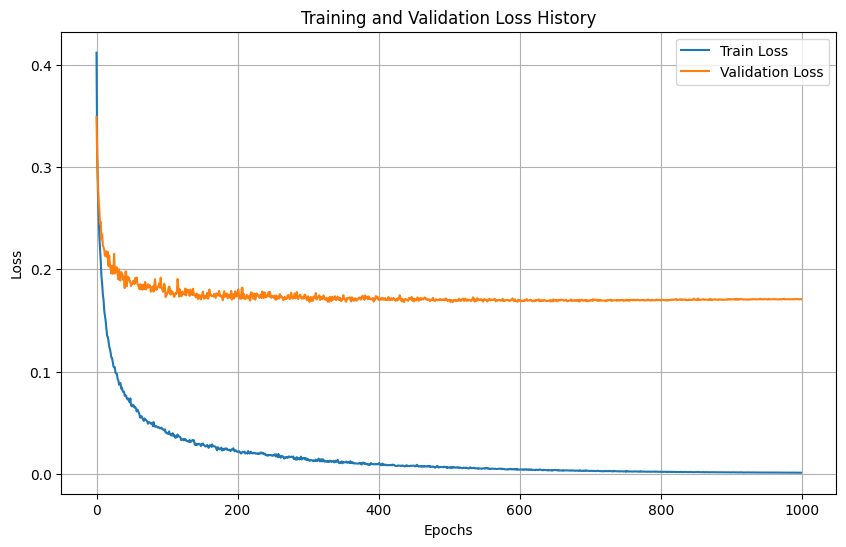

In [9]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss history
plt.figure(figsize=(10, 6))
plt.plot(train_loss, label='Train Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Training and Validation Loss History')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

In [10]:
X_tensor = tf.convert_to_tensor(X_test, dtype=tf.float32)  # Use test data for sensitivity analysis

# Compute gradients using GradientTape
with tf.GradientTape() as tape:
    tape.watch(X_tensor)  # Track inputs
    Y_pred = model(X_tensor)  # Forward pass
    Y_last = Y_pred[:, -1]  # Select last output (Y22)

# Compute gradients (∂Y22/∂Xi for each input)
gradients = tape.gradient(Y_last, X_tensor)  # Shape: (num_samples, 26)

# Compute mean absolute sensitivity per input
sensitivity = tf.reduce_mean(tf.abs(gradients), axis=0).numpy()

In [11]:
# Define feature names
feature_names = [
    "Longitude", "Latitude", "County FIPS Code", "State FIPS Code",
    "Number of Nuclear Restrictions in State", "State Electricity Price",
    "State Net Electricity Imports", "State Nuclear Inclusive Policy",
    "Traditional Regulation In Energy Market", "5-Year Average Labor Rate",
    "Social Vulnerability Index", "Number of Intersecting Protected Lands",
    "Number of Hazardous Facilities in 5 Miles", "No Fault Lines",
    "No Landslide Area", "Peak Ground Acceleration Lower Than 0.3g",
    "Not Having A Flood in Previous 100 Years", "No Open Water Or Wetland Intersection",
    "Population Sentiment Towards Nuclear Energy", "Having A Slope Lower Than 12 Percent",
    "Population Center Distance", "Retiring Facility Distance",
    "Existing Nuclear R&D Center in 100 Miles", "Electricity Substation Distance",
    "Transportation System Distance", "50 Kgpm Streamflow Inside 20 Miles"
]

findfont: Font family 'Times New Roman' not found.


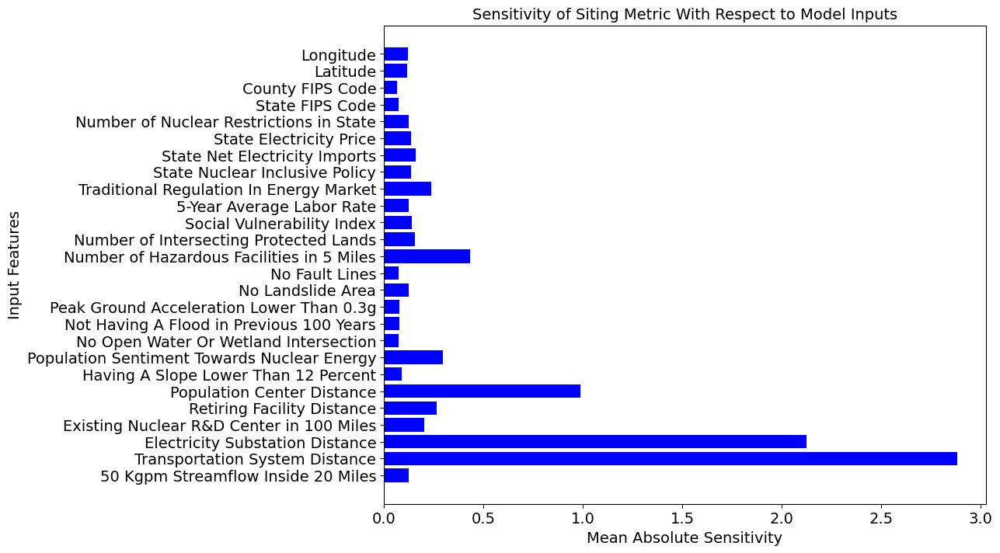

In [12]:
# Plot Sensitivity Analysis (Horizontal Bar Plot)
plt.figure(figsize=(10, 8))
plt.barh(feature_names, sensitivity, color='blue')

# Set font properties for all text elements
font_properties = {'fontsize': 14} # 'fontname': 'Times New Roman', 

plt.xlabel("Mean Absolute Sensitivity", **font_properties)
plt.ylabel("Input Features", **font_properties)
plt.title("Sensitivity of Siting Metric With Respect to Model Inputs", **font_properties)

# Set font for tick labels
plt.xticks(fontname='Times New Roman', fontsize=14)
plt.yticks(fontname='Times New Roman', fontsize=14)

plt.gca().invert_yaxis()  # Invert Y-axis for better readability
plt.show()

In [13]:
# This is the interpolator part of the model. This function checks if there is an entry with the exact coordinates.
# If there isn't, then it checks for the number of locations in the same county for interpolation.
# If there is only one, then it uses the same values. If there is more, it uses the closest two to interpolate the linear objectives. Then it uses the closest ones binary values.
# If there isn't a location in the same county, then it interpolates by using the two closest entries in the whole dataset.

def get_location_data(df, longitude, latitude, county_fips, state_fips):
    match = df[(df.iloc[:, 1] == longitude) & (df.iloc[:, 2] == latitude)]
    # If a match is found, return the values from column index 5 onward
    if not match.empty:
        return match.iloc[0, 5:].values

    # Filter for rows with the specified state FIPS
    matched_rows = df[df.iloc[:, 4] == state_fips]

    # Initialize outputs with zeros for indices not yet computed
    outputs = [0] * 22

    if not matched_rows.empty:
        # Get the first match for specified columns
        matched_row = matched_rows.iloc[0]
        outputs[0] = matched_row.iloc[5]   # 5th column in df
        outputs[1] = matched_row.iloc[6]   # 6th column in df
        outputs[2] = matched_row.iloc[7]   # 7th column in df
        outputs[3] = matched_row.iloc[8]   # 8th column in df
        outputs[5] = matched_row.iloc[10]  # 10th column in df
        outputs[6] = matched_row.iloc[11]  # 11th column in df

    # Filter for rows with the same county FIPS
    county_rows = df[df.iloc[:, 3] == county_fips]  # Adjusted column for county FIPS

    # Compute the Euclidean distance for each row in county_rows
    if not county_rows.empty:
        distances = np.sqrt((county_rows.iloc[:, 1] - longitude) ** 2 + (county_rows.iloc[:, 2] - latitude) ** 2)

        if len(county_rows) == 1:
            # Single entry in the same county
            single_row = county_rows.iloc[0]
            outputs[4] = single_row.iloc[9]
            outputs[7] = single_row.iloc[12]
            outputs[8] = single_row.iloc[13]
            outputs[14] = single_row.iloc[19]
            outputs[16] = single_row.iloc[21]
            outputs[17] = single_row.iloc[22]
            outputs[18] = single_row.iloc[23]
            outputs[19] = single_row.iloc[24]
            outputs[20] = single_row.iloc[25]

            outputs[9] = single_row.iloc[14]
            outputs[10] = single_row.iloc[15]
            outputs[11] = single_row.iloc[16]
            outputs[12] = single_row.iloc[17]
            outputs[13] = single_row.iloc[18]
            outputs[15] = single_row.iloc[20]
            outputs[21] = single_row.iloc[26]

        else:
            # More than one entry in the same county, select the two closest entries
            closest_indices = distances.nsmallest(2).index
            loc1 = county_rows.loc[closest_indices[0]]
            loc2 = county_rows.loc[closest_indices[1]]

            # Calculate distances for interpolation weights
            dist1 = distances.loc[closest_indices[0]]
            dist2 = distances.loc[closest_indices[1]]
            weight1 = dist2 / (dist1 + dist2)
            weight2 = dist1 / (dist1 + dist2)

            # Perform linear interpolation for each specified output index
            outputs[4] = loc1.iloc[9] * weight1 + loc2.iloc[9] * weight2
            outputs[7] = loc1.iloc[12] * weight1 + loc2.iloc[12] * weight2
            outputs[8] = loc1.iloc[13] * weight1 + loc2.iloc[13] * weight2
            outputs[14] = loc1.iloc[19] * weight1 + loc2.iloc[19] * weight2
            outputs[16] = loc1.iloc[21] * weight1 + loc2.iloc[21] * weight2
            outputs[17] = loc1.iloc[22] * weight1 + loc2.iloc[22] * weight2
            outputs[18] = loc1.iloc[23] * weight1 + loc2.iloc[23] * weight2
            outputs[19] = loc1.iloc[24] * weight1 + loc2.iloc[24] * weight2
            outputs[20] = loc1.iloc[25] * weight1 + loc2.iloc[25] * weight2

            outputs[9] = loc1.iloc[14] * weight1 + loc2.iloc[14] * weight2
            outputs[10] = loc1.iloc[15] * weight1 + loc2.iloc[15] * weight2
            outputs[11] = loc1.iloc[16] * weight1 + loc2.iloc[16] * weight2
            outputs[12] = loc1.iloc[17] * weight1 + loc2.iloc[17] * weight2
            outputs[13] = loc1.iloc[18] * weight1 + loc2.iloc[18] * weight2
            outputs[15] = loc1.iloc[20] * weight1 + loc2.iloc[20] * weight2
            outputs[21] = loc1.iloc[26] * weight1 + loc2.iloc[26] * weight2

    else:
        # No entry with the same county FIPS, find the 2 closest locations across the whole dataset
        distances_all = np.sqrt((df.iloc[:, 1] - longitude) ** 2 + (df.iloc[:, 2] - latitude) ** 2)
        closest_indices_all = distances_all.nsmallest(2).index
        loc1 = df.loc[closest_indices_all[0]]
        loc2 = df.loc[closest_indices_all[1]]

        # Calculate distances for interpolation weights
        dist1 = distances_all[closest_indices_all[0]]
        dist2 = distances_all[closest_indices_all[1]]
        weight1 = dist2 / (dist1 + dist2)
        weight2 = dist1 / (dist1 + dist2)

        # Perform interpolation
        outputs[4] = loc1.iloc[9] * weight1 + loc2.iloc[9] * weight2
        outputs[7] = loc1.iloc[12] * weight1 + loc2.iloc[12] * weight2
        outputs[8] = loc1.iloc[13] * weight1 + loc2.iloc[13] * weight2
        outputs[14] = loc1.iloc[19] * weight1 + loc2.iloc[19] * weight2
        outputs[16] = loc1.iloc[21] * weight1 + loc2.iloc[21] * weight2
        outputs[17] = loc1.iloc[22] * weight1 + loc2.iloc[22] * weight2
        outputs[18] = loc1.iloc[23] * weight1 + loc2.iloc[23] * weight2
        outputs[19] = loc1.iloc[24] * weight1 + loc2.iloc[24] * weight2
        outputs[20] = loc1.iloc[25] * weight1 + loc2.iloc[25] * weight2

        outputs[9] = loc1.iloc[14] * weight1 + loc2.iloc[14] * weight2
        outputs[10] = loc1.iloc[15] * weight1 + loc2.iloc[15] * weight2
        outputs[11] = loc1.iloc[16] * weight1 + loc2.iloc[16] * weight2
        outputs[12] = loc1.iloc[17] * weight1 + loc2.iloc[17] * weight2
        outputs[13] = loc1.iloc[18] * weight1 + loc2.iloc[18] * weight2
        outputs[15] = loc1.iloc[20] * weight1 + loc2.iloc[20] * weight2
        outputs[21] = loc1.iloc[26] * weight1 + loc2.iloc[26] * weight2

    # Round specified indices before returning
    outputs[0] = int(round(outputs[0]))
    outputs[3] = int(round(outputs[3]))
    outputs[5] = int(round(outputs[5]))
    outputs[18] = int(round(outputs[18]))

    outputs[9] = int(round(outputs[9]))
    outputs[10] = int(round(outputs[10]))
    outputs[11] = int(round(outputs[11]))
    outputs[12] = int(round(outputs[12]))
    outputs[13] = int(round(outputs[13]))
    outputs[15] = int(round(outputs[15]))
    outputs[20] = int(round(outputs[20]))

    # Remove indices 9, 10, 11, 12, 13, 15, and 21
    #for index in sorted([21, 15, 13, 12, 11, 10, 9], reverse=True):
    #    del outputs[index]

    return outputs

In [14]:
x_train = X_scaler.inverse_transform(X_train)
x_test = X_scaler.inverse_transform(X_test)

In [15]:
def create_interpolated_x_test(x_test, df):
    interpolated_rows = []

    for row in x_test:
        # Extract the first 4 inputs
        longitude, latitude, county_fips, state_fips = row[:4]

        # Get interpolated outputs
        interpolated_outputs = get_location_data(df, longitude, latitude, county_fips, state_fips)

        # Merge the original 4 inputs with the 22 interpolated outputs
        new_row = np.concatenate((row[:4], interpolated_outputs))  # Shape: (4 + 22) = (26,)

        interpolated_rows.append(new_row)

    # Convert list to numpy array
    return np.array(interpolated_rows)

In [16]:
print(x_train.shape)
x_train_with_zeros = np.hstack((np.zeros((x_train.shape[0], 1)), x_train))
x_train_df = pd.DataFrame(x_train_with_zeros)
print(x_train_df.isna().sum().sum())  # Total number of NaN values in the DataFrame
x_test_df = pd.DataFrame(x_test)
print(x_test_df.isna().sum().sum())  # Total number of NaN values in the DataFrame

(27580, 26)
0
0


In [17]:
# Generate x_test_interp
x_test_interp = create_interpolated_x_test(x_test, x_train_df)

X_test_interp = X_scaler.transform(x_test_interp)

# Run through the trained neural network
Y_pred_interp = model.predict(X_test_interp)
y_pred_interp = Y_scaler.inverse_transform(Y_pred_interp)


  1/216 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step


 83/216 ━━━━━━━━━━━━━━━━━━━━ 0s 611us/step


 84/216 ━━━━━━━━━━━━━━━━━━━━ 0s 620us/step


181/216 ━━━━━━━━━━━━━━━━━━━━ 0s 564us/step


216/216 ━━━━━━━━━━━━━━━━━━━━ 0s 562us/step


/home/oferdem/miniconda3/envs/tfgpu/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [18]:
# Generate x_test_interp
x_train_interp = create_interpolated_x_test(x_train, x_train_df)

X_train_interp = X_scaler.transform(x_train_interp)

# Run through the trained neural network
Y_pred_interp2 = model.predict(X_train_interp)
y_pred_interp2 = Y_scaler.inverse_transform(Y_pred_interp2)


  1/862 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step


 79/862 ━━━━━━━━━━━━━━━━━━━━ 0s 645us/step


 80/862 ━━━━━━━━━━━━━━━━━━━━ 0s 655us/step


160/862 ━━━━━━━━━━━━━━━━━━━━ 0s 642us/step


161/862 ━━━━━━━━━━━━━━━━━━━━ 0s 645us/step

/home/oferdem/miniconda3/envs/tfgpu/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(



234/862 ━━━━━━━━━━━━━━━━━━━━ 0s 660us/step


235/862 ━━━━━━━━━━━━━━━━━━━━ 0s 663us/step


314/862 ━━━━━━━━━━━━━━━━━━━━ 0s 656us/step


315/862 ━━━━━━━━━━━━━━━━━━━━ 0s 657us/step


400/862 ━━━━━━━━━━━━━━━━━━━━ 0s 642us/step


484/862 ━━━━━━━━━━━━━━━━━━━━ 0s 635us/step


578/862 ━━━━━━━━━━━━━━━━━━━━ 0s 618us/step


579/862 ━━━━━━━━━━━━━━━━━━━━ 0s 619us/step


666/862 ━━━━━━━━━━━━━━━━━━━━ 0s 614us/step


667/862 ━━━━━━━━━━━━━━━━━━━━ 0s 614us/step


756/862 ━━━━━━━━━━━━━━━━━━━━ 0s 608us/step


757/862 ━━━━━━━━━━━━━━━━━━━━ 0s 609us/step


854/862 ━━━━━━━━━━━━━━━━━━━━ 0s 598us/step


855/862 ━━━━━━━━━━━━━━━━━━━━ 0s 598us/step


862/862 ━━━━━━━━━━━━━━━━━━━━ 1s 599us/step


In [19]:
# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_interp)
mse = mean_squared_error(y_test, y_pred_interp)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_interp)

# Print results
print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"R² Score: {r2}")

MAE: 0.004566478954036441
MSE: 0.0002365310588208869
RMSE: 0.015379566275447657
R² Score: 0.7941165973344883


In [20]:
# Calculate evaluation metrics
mae2 = mean_absolute_error(y_train, y_pred_interp2)
mse2 = mean_squared_error(y_train, y_pred_interp2)
rmse2 = np.sqrt(mse)
r22 = r2_score(y_train, y_pred_interp2)

# Print results
print(f"MAE: {mae2}")
print(f"MSE: {mse2}")
print(f"RMSE: {rmse2}")
print(f"R² Score: {r22}")

MAE: 0.0006389322879105091
MSE: 1.685117673656327e-05
RMSE: 0.015379566275447657
R² Score: 0.9826314078511694
